**Background**

You are a data professional in a data analytics firm called Automatidata. Their client, the New York City Taxi & Limousine Commission (New York City TLC),has requested that you build a machine learning model to predict if a customer will not leave a tip. They want to use the model in an app that will alert taxi drivers to customers who are unlikely to tip, since drivers depend on tips.

**The purpose** of this model is to find ways to generate more revenue for taxi cab drivers.  
  
**The original goal** of this model is to predict if a customer will not leave a tip.  

**Ethical concerns:**
If the model predict the passenger will tip but the passenger actually won't tip, the driver would feel dissatisfacied with the passenger and the model provider or feel frustrated.
If the model predict the passenger won't tip the driver may reject to service that passenger or provide poor service since they will not get tips, taxi is a public transportation tool every passenger has the right to be serviced, false negative might lead to unfair.
Besides that, It's difficult to evaluate the result in production environment. Passengers are predicted won't tip but they actual will, if they are provided with poor service they may not tip. Wrong prediction may affect driver behavior, driver behavior may affect passenger satisfaction, the final result(not tip) might be a result of wrong prediction.

**Revised goal:** this model is to predict whether or not a customer is a generous tipper (>= 20%).

### **Imports and data loading**

Import packages and libraries needed to build and evaluate random forest and XGBoost classification models.

In [1]:
# Import packages and libraries

import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt
#import plotly.express as px
#import geopandas as gpd

from datetime import date
from datetime import datetime

from sklearn.model_selection import PredefinedSplit
from sklearn.ensemble import RandomForestClassifier

from xgboost import XGBClassifier
from xgboost import plot_importance

from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree

from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score,f1_score, confusion_matrix, ConfusionMatrixDisplay

import pickle
import math

import statsmodels.api as sm
from scipy import stats


In [2]:
# This lets us see all of the columns, preventing Juptyer from redacting them.
pd.set_option('display.max_columns', None)

input_file_path='/kaggle/input/taxi-fareamount-prediction-eda/'

import warnings
warnings.filterwarnings('ignore')

**Dataframe in this lab**
* df_clean: dataset after clean
* df_credit: credit card subset from df_clean
* df_crime_info: Crime count in 2017 in NYC

In [3]:
# Load dataset into a dataframe
# data after cleaning
df_clean = pd.read_csv(input_file_path+"taxi_trip_clean.csv")

df_clean.info()

# Display first few rows of the dataframe
df_clean.head(10)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21923 entries, 0 to 21922
Data columns (total 80 columns):
 #   Column                                                  Non-Null Count  Dtype  
---  ------                                                  --------------  -----  
 0   ID                                                      21923 non-null  int64  
 1   VendorID                                                21923 non-null  int64  
 2   tpep_pickup_datetime                                    21923 non-null  object 
 3   tpep_dropoff_datetime                                   21923 non-null  object 
 4   passenger_count                                         21923 non-null  int64  
 5   trip_distance                                           21923 non-null  float64
 6   RatecodeID                                              21923 non-null  int64  
 7   store_and_fwd_flag                                      21923 non-null  object 
 8   PULocationID                        

,ID,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,PU_hour,DO_hour,PU_day,DO_day,PU_month,DO_month,PU_weekday,DO_weekday,PU_year,PU_weeknum,PU_year_weeknum,PU_nextMonday,PU_date_hour,Borough_PU,Zone_PU,service_zone_PU,Borough_DO,Zone_DO,service_zone_DO,Date,NYC_All_Grades_All_Formulations_Retail_Gasoline_Prices,Year,time,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),apparent_temperature (°C),precipitation (mm),rain (mm),snowfall (cm),snow_depth (m),pressure_msl (hPa),surface_pressure (hPa),cloud_cover (%),cloud_cover_low (%),cloud_cover_mid (%),cloud_cover_high (%),wind_speed_10m (km/h),wind_speed_100m (km/h),wind_direction_10m (°),wind_direction_100m (°),wind_gusts_10m (km/h),PU_DO_Borough,JFK,Newark,OutsideNYC,nighttime,rushhour,duration,duration_sec,avg_speed,fare_per_minute,fare_per_mile,holiday,PU_date,fare_amount_log,am_rush,daytime,pm_rush,PU_hour_class,rush_hour,PU_season
0,24870114,2,2017-03-25 08:55:43,2017-03-25 09:09:47,6,3.34,1,N,100,231,1,13.0,0.0,0.5,2.76,0.0,0.3,16.56,8,9,25,25,3,3,Saturday,Saturday,2017,12,2017-12,2017-03-27,2017-03-25-8,Manhattan,Garment District,Yellow Zone,Manhattan,TriBeCa/Civic Center,Yellow Zone,2017-03-27,2.476,2017,2017-03-25 08:00:00,10.6,73,6.0,8.5,0.0,0.0,0.0,0.04,1021.3,1015.1,100,0,79,100,7.4,13.8,309,298,13.3,Manhattan_Manhattan,False,False,False,0,False,14.067,844.0,14.246445,0.924171,3.892216,True,2017-03-25,2.564949,1,0,0,am_rush,0,spring
1,35634249,1,2017-04-11 14:53:28,2017-04-11 15:19:58,1,1.80,1,N,186,43,1,16.0,0.0,0.5,4.00,0.0,0.3,20.80,14,15,11,11,4,4,Tuesday,Tuesday,2017,15,2017-15,2017-04-17,2017-04-11-14,Manhattan,Penn Station/Madison Sq West,Yellow Zone,Manhattan,Central Park,Yellow Zone,2017-04-17,2.585,2017,2017-04-11 14:00:00,22.3,59,13.8,22.3,0.0,0.0,0.0,0.00,1018.9,1012.9,96,0,0,96,16.8,21.6,149,154,33.1,Manhattan_Manhattan,False,False,False,0,False,26.500,1590.0,4.075472,0.603774,8.888889,False,2017-04-11,2.772589,0,1,0,daytime,0,spring
2,106203690,1,2017-12-15 07:26:56,2017-12-15 07:34:08,1,1.00,1,N,262,236,1,6.5,0.0,0.5,1.45,0.0,0.3,8.75,7,7,15,15,12,12,Friday,Friday,2017,50,2017-50,2017-12-18,2017-12-15-7,Manhattan,Yorkville East,Yellow Zone,Manhattan,Upper East Side North,Yellow Zone,2017-12-18,2.660,2017,2017-12-15 07:00:00,-5.7,51,-14.3,-9.6,0.0,0.0,0.0,0.05,1020.1,1013.5,87,0,75,86,2.9,4.3,263,265,6.8,Manhattan_Manhattan,False,False,False,0,False,7.200,432.0,8.333333,0.902778,6.500000,False,2017-12-15,1.871802,1,0,0,am_rush,1,winter
3,38942136,2,2017-05-07 13:17:59,2017-05-07 13:48:14,1,3.70,1,N,188,97,1,20.5,0.0,0.5,6.39,0.0,0.3,27.69,13,13,7,7,5,5,Sunday,Sunday,2017,18,2017-18,2017-05-08,2017-05-07-13,Brooklyn,Prospect-Lefferts Gardens,Boro Zone,Brooklyn,Fort Greene,Boro Zone,2017-05-08,2.561,2017,2017-05-07 13:00:00,13.3,52,3.6,9.1,0.0,0.0,0.0,0.00,1004.2,998.1,94,11,94,0,18.4,23.8,242,245,35.3,Brooklyn_Brooklyn,False,False,False,0,False,30.250,1815.0,7.338843,0.677686,5.540541,True,2017-05-07,3.020425,0,1,0,daytime,0,spring
4,30841670,2,2017-04-15 23:32:20,2017-04-15 23:49:03,1,4.37,1,N,4,112,2,16.5,0.5,0.5,0.00,0.0,0.3,17.80,23,23,15,15,4,4,Saturday,Saturday,2017,15,2017-15,2017-04-17,2017-04-15-23,Manhattan,Alphabet City,Yellow Zone,Brooklyn,Greenpoint,Boro Zone,2017-04-17,2.585,2017,2017-04-15 23:00:00,14.1,91,12.7,12.0,0.0,0.0,0.0,0.00,1018.9,1012.7,27,0,2,26,19.8,35.3,217,220,33.1,Manhattan_Brooklyn,False,False,False,1,False,16.717,1003.0,15.684945,0.987039,3.775744,True,2017-04-15,2.803360,0,0,0,nighttime,0,spring
5,23345809,2,2017-03-25 20:34:11,2017-03-25 20:42:11,6,2.30,1,N,161,236,1,9.0,0.5,0.5,2.06,0.0,0.3,12.36,20,20,25,25,3,3,Saturday,Saturday,2017,12,2017-12,2017-03-27,2017-03-25-20,Manhattan,Midtown Center,Yellow Zone,Manhattan,Upper East Side North,Yellow Zone,2017-03-27,2.476,2017,2017-03-25 20:00:00,5.1,88,3.3,0.7,0.0,0.0,0.0,0.02

In [4]:
# Import predicted fares and mean distance and duration 
# Load predicted fare_amount (please refer NYC Taxi Fare Amount Prediction)
rf_clean_preds_means = pd.read_csv('/kaggle/input/nyc-taxi-fare-amount-random-forest-regression/rf_clean_label_predicted_fare_amount.csv')

rf_clean_preds_means.info()

rf_clean_preds_means.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21923 entries, 0 to 21922
Data columns (total 22 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Unnamed: 0           21923 non-null  int64  
 1   gpb_unit1            21923 non-null  object 
 2   gpb_unit2            21923 non-null  object 
 3   gpb_unit3            21923 non-null  object 
 4   gpb_unit4            21923 non-null  object 
 5   gpb_unit5            21923 non-null  object 
 6   mean_distance_unit1  21923 non-null  float64
 7   mean_distance_unit2  21923 non-null  float64
 8   mean_distance_unit3  21923 non-null  float64
 9   mean_distance_unit4  21923 non-null  float64
 10  mean_distance_unit5  21923 non-null  float64
 11  mean_duration_unit1  21923 non-null  float64
 12  mean_duration_unit2  21923 non-null  float64
 13  mean_duration_unit3  21923 non-null  float64
 14  mean_duration_unit4  21923 non-null  float64
 15  mean_duration_unit5  21923 non-null 

,Unnamed: 0,gpb_unit1,gpb_unit2,gpb_unit3,gpb_unit4,gpb_unit5,mean_distance_unit1,mean_distance_unit2,mean_distance_unit3,mean_distance_unit4,mean_distance_unit5,mean_duration_unit1,mean_duration_unit2,mean_duration_unit3,mean_duration_unit4,mean_duration_unit5,mean_speed_unit1,mean_speed_unit2,mean_speed_unit3,mean_speed_unit4,mean_speed_unit5,predict_fare_amount
0,0,100_231,100_231_8,100_231_Saturday_8,100_231_am_rush,100_231_1_am_rush,3.521667,3.34,3.34,3.340000,3.340,22.847333,14.067,14.067,14.067000,14.0670,10.679596,14.246445,14.246445,14.246445,14.246445,13.010263
1,1,186_43,186_43_14,186_43_Tuesday_14,186_43_daytime,186_43_0_daytime,3.108889,2.65,1.80,3.095000,1.800,24.470333,22.700,26.500,23.283250,26.5000,8.310050,7.593291,4.075472,8.296162,4.075472,16.265126
2,2,262_236,262_236_7,262_236_Friday_7,262_236_am_rush,262_236_0_am_rush,0.881429,0.80,1.00,0.875714,0.966,7.250029,5.150,7.200,6.407286,7.3102,7.721198,9.973118,8.333333,8.848934,8.450543,6.116305
3,3,188_97,188_97_13,188_97_Sunday_13,188_97_daytime,188_97_1_daytime,3.700000,3.70,3.70,3.700000,3.700,30.250000,30.250,30.250,30.250000,30.2500,7.338843,7.338843,7.338843,7.338843,7.338843,19.392487
4,4,4_112,4_112_23,4_112_Saturday_23,4_112_nighttime,4_112_1_nighttime,4.435000,4.37,4.37,4.370000,4.370,14.617000,16.717,16.717,16.717000,16.7170,18.628092,15.684945,15.684945,15.684945,15.684945,16.164828


In [5]:
#download from https://www.nyc.gov/site/tlc/about/tlc-trip-record-data.page
df_taxizone=pd.read_csv("/kaggle/input/nyc-taxi-zone/taxi_zone_lookup.csv")

df_taxizone.info()
df_taxizone.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 265 entries, 0 to 264
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   LocationID    265 non-null    int64 
 1   Borough       265 non-null    object
 2   Zone          265 non-null    object
 3   service_zone  265 non-null    object
dtypes: int64(1), object(3)
memory usage: 8.4+ KB


,LocationID,Borough,Zone,service_zone
0,1,EWR,Newark Airport,EWR
1,2,Queens,Jamaica Bay,Boro Zone
2,3,Bronx,Allerton/Pelham Gardens,Boro Zone
3,4,Manhattan,Alphabet City,Yellow Zone
4,5,Staten Island,Arden Heights,Boro Zone


In [6]:
#https://data.cityofnewyork.us/Public-Safety/NYPD-Complaint-Data-Historic/qgea-i56i/about_data
#load crime count data(occured in 2017)
df_crime_info = pd.read_csv('/kaggle/input/nyc-taxi-locationid/crime_count.csv')

df_crime_info.info()
df_crime_info.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 261 entries, 0 to 260
Columns: 135 entries, LocationID to path_count
dtypes: float64(134), int64(1)
memory usage: 275.4 KB


,LocationID,total_count,FELONY_count,MISDEMEANOR_count,VIOLATION_count,BURGLARY,FELONY ASSAULT,GRAND LARCENY,GRAND LARCENY OF MOTOR VEHICLE,MURDER & NON-NEGL. MANSLAUGHTER,ROBBERY,ABORTION_Ratio_of_Total,ADMINISTRATIVE CODE_Ratio_of_Total,AGRICULTURE & MRKTS LAW-UNCLASSIFIED_Ratio_of_Total,ALCOHOLIC BEVERAGE CONTROL LAW_Ratio_of_Total,ANTICIPATORY OFFENSES_Ratio_of_Total,ARSON_Ratio_of_Total,ASSAULT 3 & RELATED OFFENSES_Ratio_of_Total,BURGLAR'S TOOLS_Ratio_of_Total,BURGLARY_Ratio_of_Total,CHILD ABANDONMENT/NON SUPPORT_Ratio_of_Total,CRIMINAL MISCHIEF & RELATED OF_Ratio_of_Total,CRIMINAL TRESPASS_Ratio_of_Total,DANGEROUS DRUGS_Ratio_of_Total,DANGEROUS WEAPONS_Ratio_of_Total,DISORDERLY CONDUCT_Ratio_of_Total,DISRUPTION OF A RELIGIOUS SERV_Ratio_of_Total,ENDAN WELFARE INCOMP_Ratio_of_Total,ESCAPE 3_Ratio_of_Total,FELONY ASSAULT_Ratio_of_Total,FORGERY_Ratio_of_Total,FRAUDS_Ratio_of_Total,FRAUDULENT ACCOSTING_Ratio_of_Total,GAMBLING_Ratio_of_Total,GRAND LARCENY_Ratio_of_Total,GRAND LARCENY OF MOTOR VEHICLE_Ratio_of_Total,HARRASSMENT 2_Ratio_of_Total,"HOMICIDE-NEGLIGENT,UNCLASSIFIE_Ratio_of_Total",HOMICIDE-NEGLIGENT-VEHICLE_Ratio_of_Total,INTOXICATED & IMPAIRED DRIVING_Ratio_of_Total,INTOXICATED/IMPAIRED DRIVING_Ratio_of_Total,JOSTLING_Ratio_of_Total,KIDNAPPING_Ratio_of_Total,KIDNAPPING & RELATED OFFENSES_Ratio_of_Total,LOITERING_Ratio_of_Total,"LOITERING/GAMBLING (CARDS, DIC_Ratio_of_Total",MISCELLANEOUS PENAL LAW_Ratio_of_Total,MURDER & NON-NEGL. MANSLAUGHTER_Ratio_of_Total,NEW YORK CITY HEALTH CODE_Ratio_of_Total,NYS LAWS-UNCLASSIFIED FELONY_Ratio_of_Total,NYS LAWS-UNCLASSIFIED VIOLATION_Ratio_of_Total,OFF. AGNST PUB ORD SENSBLTY &_Ratio_of_Total,OFFENSES AGAINST PUBLIC ADMINI_Ratio_of_Total,OFFENSES AGAINST PUBLIC SAFETY_Ratio_of_Total,OFFENSES AGAINST THE PERSON_Ratio_of_Total,OFFENSES INVOLVING FRAUD_Ratio_of_Total,OFFENSES RELATED TO CHILDREN_Ratio_of_Total,OTHER OFFENSES RELATED TO THEF_Ratio_of_Total,OTHER STATE LAWS_Ratio_of_Total,OTHER STATE LAWS (NON PENAL LA_Ratio_of_Total,OTHER STATE LAWS (NON PENAL LAW)_Ratio_of_Total,PETIT LARCENY_Ratio_of_Total,PETIT LARCENY OF MOTOR VEHICLE_Ratio_of_Total,POSSESSION OF STOLEN PROPERTY_Ratio_of_Total,PROSTITUTION & RELATED OFFENSES_Ratio_of_Total,ROBBERY_Ratio_of_Total,THEFT OF SERVICES_Ratio_of_Total,THEFT-FRAUD_Ratio_of_Total,UNAUTHORIZED USE OF A VEHICLE_Ratio_of_Total,UNLAWFUL POSS. WEAP. ON SCHOOL_Ratio_of_Total,VEHICLE AND TRAFFIC LAWS_Ratio_of_Total,ABORTION_Total,ADMINISTRATIVE CODE_Total,AGRICULTURE & MRKTS LAW-UNCLASSIFIED_Total,ALCOHOLIC BEVERAGE CONTROL LAW_Total,ANTICIPATORY OFFENSES_Total,ARSON_Total,ASSAULT 3 & RELATED OFFENSES_Total,BURGLAR'S TOOLS_Total,BURGLARY_Total,CHILD ABANDONMENT/NON SUPPORT_Total,CRIMINAL MISCHIEF & RELATED OF_Total,CRIMINAL TRESPASS_Total,DANGEROUS DRUGS_Total,DANGEROUS WEAPONS_Total,DISORDERLY CONDUCT_Total,DISRUPTION OF A RELIGIOUS SERV_Total,ENDAN WELFARE INCOMP_Total,ESCAPE 3_Total,FELONY ASSAULT_Total,FORGERY_Total,FRAUDS_Total,FRAUDULENT ACCOSTING_Total,GAMBLING_Total,GRAND LARCENY_Total,GRAND LARCENY OF MOTOR VEHICLE_Total,HARRASSMENT 2_Total,"HOMICIDE-NEGLIGENT,UNCLASSIFIE_Total",HOMICIDE-NEGLIGENT-VEHICLE_Total,INTOXICATED & IMPAIRED DRIVING_Total,INTOXICATED/IMPAIRED DRIVING_Total,JOSTLING_Total,KIDNAPPING_Total,KIDNAPPING & RELATED OFFENSES_Total,LOITERING_Total,"LOITERING/GAMBLING (CARDS, DIC_Total",MISCELLANEOUS PENAL LAW_Total,MURDER & NON-NEGL. MANSLAUGHTER_Total,NEW YORK CITY HEALTH CODE_Total,NYS LAWS-UNCLASSIFIED FELONY_Total,NYS LAWS-UNCLASSIFIED VIOLATION_Total,OFF. AGNST PUB ORD SENSBLTY &_Total,OFFENSES AGAINST PUBLIC ADMINI_Total,OFFENSES AGAINST PUBLIC SAFETY_Total,OFFENSES AGAINST THE PERSON_Total,OFFENSES INVOLVING FRAUD_Total,OFFENSES RELATED TO CHILDREN_Total,OTHER OFFENSES RELATED TO THEF_Total,OTHER STATE LAWS_Total,OTHER STATE LAWS (NON PENAL LA_Total,OTHER STATE LAWS (NON PENAL LAW)_Total,PETIT LARCENY_Total,PETIT LARCENY OF MOTOR VEHICLE_Total,POSSESSION OF STOLEN PROPERTY_Total,PROSTITUTION & RELATED OFFENSE

In [7]:
########################################
#convert string object to datetime
########################################
df_clean['tpep_pickup_datetime'] = pd.to_datetime(df_clean['tpep_pickup_datetime'])
df_clean['tpep_dropoff_datetime'] = pd.to_datetime(df_clean['tpep_dropoff_datetime'])


#confirm after transform
df_clean[['tpep_pickup_datetime','tpep_dropoff_datetime']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21923 entries, 0 to 21922
Data columns (total 2 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   tpep_pickup_datetime   21923 non-null  datetime64[ns]
 1   tpep_dropoff_datetime  21923 non-null  datetime64[ns]
dtypes: datetime64[ns](2)
memory usage: 342.7 KB


In [8]:
#merge mean_distance, predicted_fare

df_clean=df_clean.join(rf_clean_preds_means, lsuffix='', rsuffix='_mean')

df_clean.info()
df_clean.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21923 entries, 0 to 21922
Columns: 102 entries, ID to predict_fare_amount
dtypes: bool(5), datetime64[ns](2), float64(43), int64(29), object(23)
memory usage: 16.3+ MB


,ID,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,PU_hour,DO_hour,PU_day,DO_day,PU_month,DO_month,PU_weekday,DO_weekday,PU_year,PU_weeknum,PU_year_weeknum,PU_nextMonday,PU_date_hour,Borough_PU,Zone_PU,service_zone_PU,Borough_DO,Zone_DO,service_zone_DO,Date,NYC_All_Grades_All_Formulations_Retail_Gasoline_Prices,Year,time,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),apparent_temperature (°C),precipitation (mm),rain (mm),snowfall (cm),snow_depth (m),pressure_msl (hPa),surface_pressure (hPa),cloud_cover (%),cloud_cover_low (%),cloud_cover_mid (%),cloud_cover_high (%),wind_speed_10m (km/h),wind_speed_100m (km/h),wind_direction_10m (°),wind_direction_100m (°),wind_gusts_10m (km/h),PU_DO_Borough,JFK,Newark,OutsideNYC,nighttime,rushhour,duration,duration_sec,avg_speed,fare_per_minute,fare_per_mile,holiday,PU_date,fare_amount_log,am_rush,daytime,pm_rush,PU_hour_class,rush_hour,PU_season,Unnamed: 0,gpb_unit1,gpb_unit2,gpb_unit3,gpb_unit4,gpb_unit5,mean_distance_unit1,mean_distance_unit2,mean_distance_unit3,mean_distance_unit4,mean_distance_unit5,mean_duration_unit1,mean_duration_unit2,mean_duration_unit3,mean_duration_unit4,mean_duration_unit5,mean_speed_unit1,mean_speed_unit2,mean_speed_unit3,mean_speed_unit4,mean_speed_unit5,predict_fare_amount
0,24870114,2,2017-03-25 08:55:43,2017-03-25 09:09:47,6,3.34,1,N,100,231,1,13.0,0.0,0.5,2.76,0.0,0.3,16.56,8,9,25,25,3,3,Saturday,Saturday,2017,12,2017-12,2017-03-27,2017-03-25-8,Manhattan,Garment District,Yellow Zone,Manhattan,TriBeCa/Civic Center,Yellow Zone,2017-03-27,2.476,2017,2017-03-25 08:00:00,10.6,73,6.0,8.5,0.0,0.0,0.0,0.04,1021.3,1015.1,100,0,79,100,7.4,13.8,309,298,13.3,Manhattan_Manhattan,False,False,False,0,False,14.067,844.0,14.246445,0.924171,3.892216,True,2017-03-25,2.564949,1,0,0,am_rush,0,spring,0,100_231,100_231_8,100_231_Saturday_8,100_231_am_rush,100_231_1_am_rush,3.521667,3.34,3.34,3.340000,3.340,22.847333,14.067,14.067,14.067000,14.0670,10.679596,14.246445,14.246445,14.246445,14.246445,13.010263
1,35634249,1,2017-04-11 14:53:28,2017-04-11 15:19:58,1,1.80,1,N,186,43,1,16.0,0.0,0.5,4.00,0.0,0.3,20.80,14,15,11,11,4,4,Tuesday,Tuesday,2017,15,2017-15,2017-04-17,2017-04-11-14,Manhattan,Penn Station/Madison Sq West,Yellow Zone,Manhattan,Central Park,Yellow Zone,2017-04-17,2.585,2017,2017-04-11 14:00:00,22.3,59,13.8,22.3,0.0,0.0,0.0,0.00,1018.9,1012.9,96,0,0,96,16.8,21.6,149,154,33.1,Manhattan_Manhattan,False,False,False,0,False,26.500,1590.0,4.075472,0.603774,8.888889,False,2017-04-11,2.772589,0,1,0,daytime,0,spring,1,186_43,186_43_14,186_43_Tuesday_14,186_43_daytime,186_43_0_daytime,3.108889,2.65,1.80,3.095000,1.800,24.470333,22.700,26.500,23.283250,26.5000,8.310050,7.593291,4.075472,8.296162,4.075472,16.265126
2,106203690,1,2017-12-15 07:26:56,2017-12-15 07:34:08,1,1.00,1,N,262,236,1,6.5,0.0,0.5,1.45,0.0,0.3,8.75,7,7,15,15,12,12,Friday,Friday,2017,50,2017-50,2017-12-18,2017-12-15-7,Manhattan,Yorkville East,Yellow Zone,Manhattan,Upper East Side North,Yellow Zone,2017-12-18,2.660,2017,2017-12-15 07:00:00,-5.7,51,-14.3,-9.6,0.0,0.0,0.0,0.05,1020.1,1013.5,87,0,75,86,2.9,4.3,263,265,6.8,Manhattan_Manhattan,False,False,False,0,False,7.200,432.0,8.333333,0.902778,6.500000,False,2017-12-15,1.871802,1,0,0,am_rush,1,winter,2,262_236,262_236_7,262_236_Friday_7,262_236_am_rush,262_236_0_am_rush,0.881429,0.80,1.00,0.875714,0.966,7.250029,5.150,7.200,6.407286,7.3102,7.721198,9.973118,8.333333,8.848934,8.450543,6.116305
3,38942136,2,2017-05-07 13:17:59,2017-05-07 13:48:14,1,3.70,1,N,188,97,1,20.5,0.0,0.5,6.39,0.0,0.3,27.69,13,13,7,7,5,5,Sunday,Sunday,2017,18,2017-18,2017-05-08,2017-05-07-13,Brooklyn,Prospect-Lefferts Gardens,Boro Zone,Brooklyn,Fort Greene,Boro Zone,2017-05-08,2.561,2017,2017-05-07 13:00:00,13.3,52,3.6,9.1,0.0,0.0,0.0,0.00,1004.2,998.1,94,11,94,0,18.4,23.8,242,245,35.3,Br

In [9]:
############################################################
#Create mean_trip_duration, mean_trip_distance, mean_trip_speed columns
############################################################
df_clean['mean_trip_duration']=df_clean['mean_duration_unit4']
df_clean['mean_trip_distance']=df_clean['mean_distance_unit4']
df_clean['mean_trip_speed']=df_clean['mean_speed_unit4']

In [10]:
#storm events
#https://www.ncdc.noaa.gov/stormevents/listevents.jsp?eventType=ALL&beginDate_mm=01&beginDate_dd=01&beginDate_yyyy=2017&endDate_mm=12&endDate_dd=31&endDate_yyyy=2017&county=NASSAU%3A59&hailfilter=0.00&tornfilter=0&windfilter=000&sort=DT&submitbutton=Search&statefips=36%2CNEW+YORK
#https://www.ncdc.noaa.gov/stormevents/listevents.jsp?eventType=ALL&beginDate_mm=01&beginDate_dd=01&beginDate_yyyy=2017&endDate_mm=12&endDate_dd=31&endDate_yyyy=2017&county=WESTCHESTER%3A119&hailfilter=0.00&tornfilter=0&windfilter=000&sort=DT&submitbutton=Search&statefips=36%2CNEW+YORK

#crime 
#https://data.cityofnewyork.us/Public-Safety/NYPD-Complaint-Data-Historic/qgea-i56i/about_data

In [11]:
############################################################
#Compute Violence related crime
############################################################
df_crime_info['Violence_Ratio']=df_crime_info['ASSAULT 3 & RELATED OFFENSES_Ratio_of_Total'] \
                              + df_crime_info['FELONY ASSAULT_Ratio_of_Total'] \
                              + df_crime_info['HARRASSMENT 2_Ratio_of_Total'] \
                              + df_crime_info['ROBBERY_Ratio_of_Total'] \
                              + df_crime_info['MURDER & NON-NEGL. MANSLAUGHTER_Ratio_of_Total'] 

df_crime_info['Violence_Cnt']=df_crime_info['ASSAULT 3 & RELATED OFFENSES_Total'] \
                              + df_crime_info['FELONY ASSAULT_Total'] \
                              + df_crime_info['HARRASSMENT 2_Total'] \
                              + df_crime_info['ROBBERY_Total'] \
                              + df_crime_info['MURDER & NON-NEGL. MANSLAUGHTER_Total']

df_crime_info['ViolenceRalated_Ratio']=df_crime_info['ASSAULT 3 & RELATED OFFENSES_Ratio_of_Total'] \
                              + df_crime_info['FELONY ASSAULT_Ratio_of_Total'] \
                              + df_crime_info['HARRASSMENT 2_Ratio_of_Total'] \
                              + df_crime_info['ROBBERY_Ratio_of_Total'] \
                              + df_crime_info['MURDER & NON-NEGL. MANSLAUGHTER_Ratio_of_Total'] \
                              + df_crime_info['CRIMINAL MISCHIEF & RELATED OF_Ratio_of_Total'] \
                              + df_crime_info['DANGEROUS DRUGS_Ratio_of_Total'] \
                              + df_crime_info['OFF. AGNST PUB ORD SENSBLTY &_Ratio_of_Total'] \
                              + df_crime_info['MISCELLANEOUS PENAL LAW_Ratio_of_Total']

df_crime_info['ViolenceRalated_Cnt']=df_crime_info['ASSAULT 3 & RELATED OFFENSES_Total'] \
                              + df_crime_info['FELONY ASSAULT_Total'] \
                              + df_crime_info['HARRASSMENT 2_Total'] \
                              + df_crime_info['ROBBERY_Total'] \
                              + df_crime_info['MURDER & NON-NEGL. MANSLAUGHTER_Total'] \
                              + df_crime_info['CRIMINAL MISCHIEF & RELATED OF_Total'] \
                              + df_crime_info['DANGEROUS DRUGS_Total'] \
                              + df_crime_info['OFF. AGNST PUB ORD SENSBLTY &_Total'] \
                              + df_crime_info['MISCELLANEOUS PENAL LAW_Total']

############################################################
#Compute LARCENY related crime
############################################################
df_crime_info['Larceny_Ratio']=df_crime_info['BURGLARY_Ratio_of_Total'] \
                              + df_crime_info['GRAND LARCENY_Ratio_of_Total'] \
                              + df_crime_info['GRAND LARCENY OF MOTOR VEHICLE_Ratio_of_Total'] \
                              + df_crime_info['PETIT LARCENY_Ratio_of_Total'] \
                              + df_crime_info['PETIT LARCENY OF MOTOR VEHICLE_Ratio_of_Total'] 

df_crime_info['Larceny_Cnt']=df_crime_info['BURGLARY_Total'] \
                              + df_crime_info['GRAND LARCENY_Total'] \
                              + df_crime_info['GRAND LARCENY OF MOTOR VEHICLE_Total'] \
                              + df_crime_info['PETIT LARCENY_Total'] \
                              + df_crime_info['PETIT LARCENY OF MOTOR VEHICLE_Total'] 


df_crime_info['diff_Ratio']=df_crime_info['Larceny_Ratio']-df_crime_info['ViolenceRalated_Ratio']
df_crime_info['diff_Cnt']=df_crime_info['Larceny_Cnt']-df_crime_info['ViolenceRalated_Cnt']

In [12]:
#fill null value with 0 (no these crimes)
df_crime_info['BURGLARY']=df_crime_info['BURGLARY'].fillna(0)
df_crime_info['FELONY ASSAULT']=df_crime_info['FELONY ASSAULT'].fillna(0)
df_crime_info['GRAND LARCENY']=df_crime_info['GRAND LARCENY'].fillna(0)
df_crime_info['GRAND LARCENY OF MOTOR VEHICLE']=df_crime_info['GRAND LARCENY OF MOTOR VEHICLE'].fillna(0)
df_crime_info['MURDER & NON-NEGL. MANSLAUGHTER']=df_crime_info['MURDER & NON-NEGL. MANSLAUGHTER'].fillna(0)
df_crime_info['ROBBERY']=df_crime_info['ROBBERY'].fillna(0)
#drop null rows
df_crime_info=df_crime_info.dropna(axis='index')

target_columns=[
    'total_count','Violence_Ratio','Violence_Cnt','ViolenceRalated_Ratio', 'ViolenceRalated_Cnt',
    'Larceny_Ratio','Larceny_Cnt','mta_count','bus_count','ferry_count','path_count'
]
crime_transport_corr=df_crime_info[target_columns].corr(method='pearson')
crime_transport_corr

,total_count,Violence_Ratio,Violence_Cnt,ViolenceRalated_Ratio,ViolenceRalated_Cnt,Larceny_Ratio,Larceny_Cnt,mta_count,bus_count,ferry_count,path_count
total_count,1.000000,0.265643,0.973456,0.267019,0.979569,-0.194282,0.866402,0.552870,0.653956,-0.026183,-0.052053
Violence_Ratio,0.265643,1.000000,0.395554,0.861494,0.366633,-0.654692,-0.012588,-0.030272,0.199650,0.053817,-0.166888
Violence_Cnt,0.973456,0.395554,1.000000,0.404849,0.992913,-0.339344,0.753520,0.475568,0.634604,-0.015125,-0.084946
ViolenceRalated_Ratio,0.267019,0.861494,0.404849,1.000000,0.404908,-0.789607,-0.104122,-0.086457,0.245295,0.071331,-0.211851
ViolenceRalated_Cnt,0.979569,0.366633,0.992913,0.404908,1.000000,-0.342296,0.754088,0.477593,0.648507,-0.008697,-0.083424
Larceny_Ratio,-0.194282,-0.654692,-0.339344,-0.789607,-0.342296,1.000000,0.229859,0.176598,-0.159613,-0.063367,0.252909
Larceny_Cnt,0.866402,-0.012588,0.753520,-0.104122,0.754088,0.229859,1.000000,0.649846,0.554953,-0.060962,0.041877
mta_count,0.552870,-0.030272,0.475568,-0.086457,0.477593,0.176598,0.649846,1.000000,0.258433,0.064467,0.117610
bus_count,0.653956,0.199650,0.634604,0.245295,0.648507,-0.159613,0.554953,0.258433,1.000000,-0.044380,-0.128222
ferry_count,-0.026183,0.053817,-0.015125,0.071331,-0.008697,-0.063367,-0.060962,0.064467,-0.044380,1.000000,-0.026481


### Define common variable

In [13]:
#define valid RatecodeID
RateCodeIDList=[1,2,3,4,5,6]

#define valid PULocationID and DOLocationID(exclude 264 Unknown)
LocationIDList=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29,
 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55,
 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81,
 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105,
 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126,
 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148,
 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169,
 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190,
 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211,
 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232,
 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253,
 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 265]

#define locationid list without JFK airport, Newark airport, Unknown, Outside of NYC
LocationID_InsideNYC_Standard=[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29,
 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55,
 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81,
 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105,
 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126,
 127, 128, 129, 130, 131, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148,
 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169,
 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190,
 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211,
 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232,
 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253,
 254, 255, 256, 257, 258, 259, 260, 261, 262, 263]

#taxi zone LocationID of JFK airport
CONST_JFK_LocationID=132

#taxi zone LocationID of LaGuardia Airport
CONST_LaGuardia_LocationID=138

#taxi zone LocationID of Newark airport
CONST_Newark_LocationID=1

#taxi zone LocationID of Unknown
CONST_Unknown_LocationID=264


#Outside of NYC
CONST_Outside_NYC_LocationID=265


#Max work time
MAX_WORK_TIME_MINUTES=720

#Max speed 
MAX_SPEED=70

#rush hour surcharge for Standard Metered Fare
CONST_RUSH_HOUR_SURCHARGE_STANDARD=1

#rush hour surcharge for Manhattan<->JFK
CONST_RUSH_HOUR_SURCHARGE_JFK=4.5

#night time surcharge
CONST_NIGHT_TIME_SURCHARGE=0.5

#standard unit fare: $.50 per One-fifth of a mile 
#or $.50 per minute(60 seconds) traveling at less than 12 miles an hour
STANDARD_UNIT_FARE=0.5

#Standard Metered Fare initial charge
STANDARD_INITIAL_CHARGE=2.5

#define payment type that passenger could use
#1= Credit card 
#2= Cash 
Passenger_Payment=[1,2]




########################################
# Order
########################################
Weekday_Order = ["Sunday","Monday", "Tuesday", "Wednesday", "Thursday", "Friday","Saturday"]


########################################
# Visualization
########################################
#Singal bar color
BAR_COLOR_BLUE='#1f77b4'


### **Analyze**

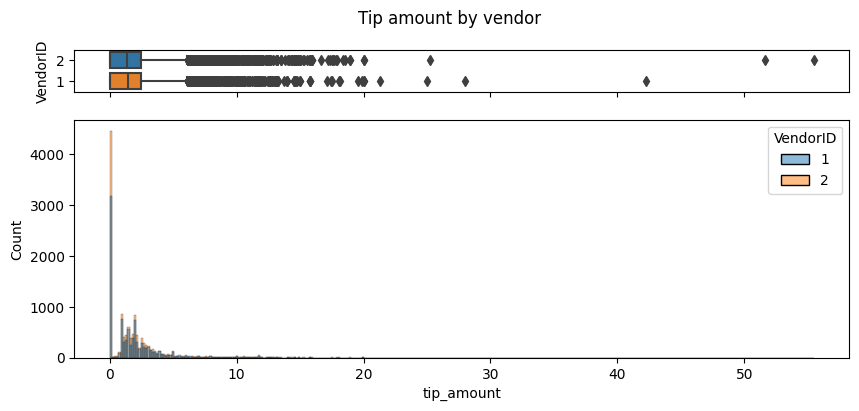

In [14]:
#################################################
#Confirm tip_amount by vendor
#################################################
# Cut the window in 2 parts
fig, (ax_box, ax_hist) = plt.subplots(2, sharex=True, figsize=(10,4),
                                      gridspec_kw={"height_ratios": (.15, .85)})

# Add a graph in each part
sns.boxplot(data=df_clean,y=df_clean['VendorID'].astype(str),x='tip_amount',ax=ax_box)
sns.histplot(data=df_clean,x='tip_amount', hue='VendorID', palette='tab10', ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')
plt.suptitle('Tip amount by vendor')
plt.show()

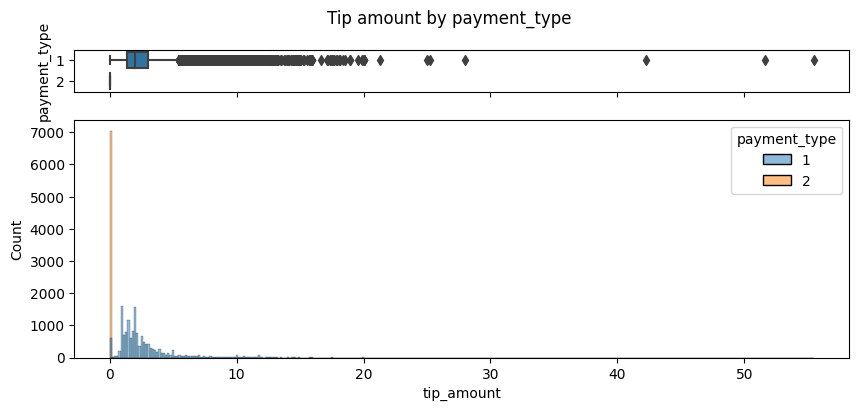

In [15]:
#################################################
#Confirm tip_amount by payment_type
#################################################
# Cut the window in 2 parts
fig, (ax_box, ax_hist) = plt.subplots(2, sharex=True, figsize=(10,4),
                                      gridspec_kw={"height_ratios": (.15, .85)})

# Add a graph in each part
sns.boxplot(data=df_clean,y=df_clean['payment_type'].astype(str),x='tip_amount',ax=ax_box)
sns.histplot(data=df_clean,x='tip_amount', hue='payment_type', palette='tab10', ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')
plt.suptitle('Tip amount by payment_type')
plt.show()

#=>we can observe that cash trip no tip_amount(Data dictionary also said Cash tips are not included)
#we don't have information about cash trip tip_amount

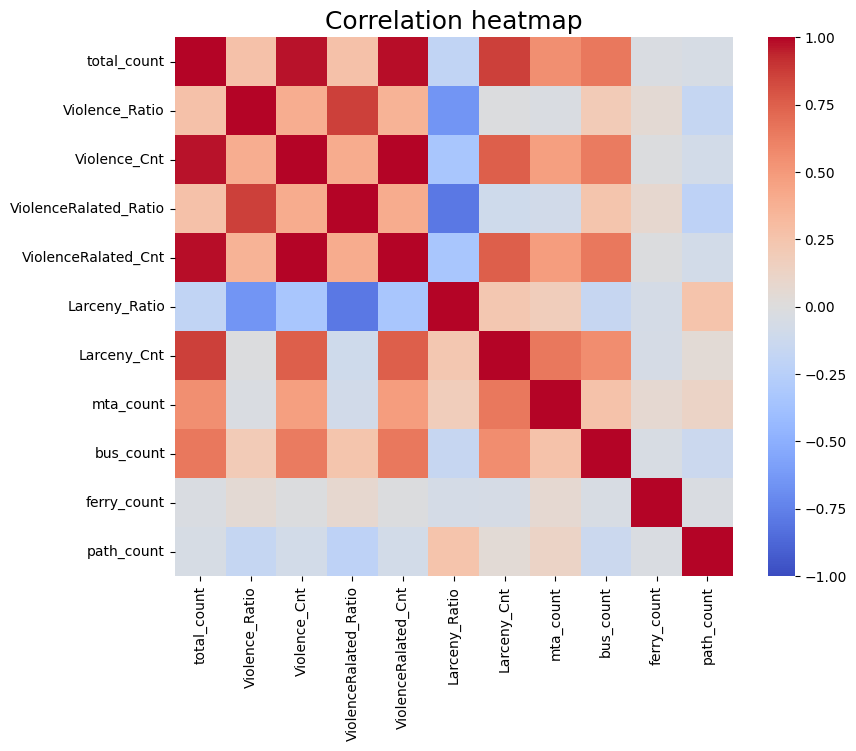

In [16]:
#################################################################
#Heatmap of crimes count and public transportation
#################################################################
plt.figure(figsize=(9,7))
sns.heatmap(crime_transport_corr, annot=False, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation heatmap',fontsize=18)
plt.show()

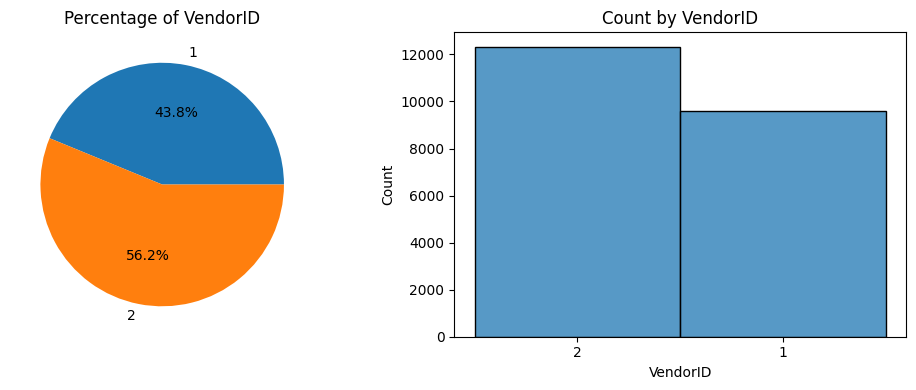

In [17]:
###############################################################
#plot of VendorID
###############################################################
fig,axs=plt.subplots(1,2,figsize=(10,4))
result=df_clean.groupby(['VendorID'])[["tpep_pickup_datetime"]].count().reset_index()
result["tpep_pickup_datetime"]=result["tpep_pickup_datetime"]/df_clean.shape[0]
axs[0].pie(result["tpep_pickup_datetime"],labels = result['VendorID'], autopct='%1.1f%%')
axs[0].set_title("Percentage of VendorID")

sns.histplot(data=df_clean, x=df_clean['VendorID'].astype(str),stat='count',ax=axs[1],discrete=True)
axs[1].bar_label(axs[1].containers[0], fontsize=9)
axs[1].set_title("Count by VendorID")

plt.tight_layout()
plt.show()

In [18]:
def round_down(x, a):
    return math.floor(x / a) * a

def round_nearest(x, a):
    return round(x / a) * a

#delete .0000000000X
def round_nearest2(x, a):
    return round(round(x / a) * a, -int(math.floor(math.log10(a))))

def round_to_0_01(x):
    return round(x * 100) / 100

def rounddown_to_0_01(x):
    return math.floor(x * 100) / 100

def roundup_to_0_01(x):
    return math.ceil(x * 100) / 100

def rounddown_to_0_05(x):
    return math.floor(x * 20) / 20

def round_to_0_05(x):
    return round(x * 20) / 20




def count_last_digit_first_decimal(numbers):
    """Counts the occurrences of the last digit in the first decimal place.

    Args:
        numbers: A list of numbers (floats or integers).

    Returns:
        A dictionary where keys are the last digits of the second decimal place
        and values are their counts.
        Intergers will be assumed to have many 0. e.g. 1 will be treated as 1.000000
    """
    counts = {}
    for num in numbers:
        num_str = str(num)
        if "." in num_str:
            decimal_part = num_str.split(".")[1]
            if len(decimal_part) >= 1:
                first_decimal_digit = decimal_part[0]
                counts[first_decimal_digit] = counts.get(first_decimal_digit, 0) + 1
        else:
            first_decimal_digit = '0'
            counts[first_decimal_digit] = counts.get(first_decimal_digit, 0) + 1
                
    return counts


def count_last_digit_second_decimal(numbers):
    """Counts the occurrences of the last digit in the second decimal place.

    Args:
        numbers: A list of numbers (floats or integers).

    Returns:
        A dictionary where keys are the last digits of the second decimal place
        and values are their counts.
        Intergers will be assumed to have many 0. e.g. 1 will be treated as 1.000000
    """
    counts = {}
    for num in numbers:
        num_str = str(num)
        if "." in num_str:
            decimal_part = num_str.split(".")[1]
            if len(decimal_part) >= 2:
                second_decimal_digit = decimal_part[1]
                counts[second_decimal_digit] = counts.get(second_decimal_digit, 0) + 1
            elif len(decimal_part) == 1:
                second_decimal_digit = '0'
                counts[second_decimal_digit] = counts.get(second_decimal_digit, 0) + 1
        else:
            second_decimal_digit = '0'
            counts[second_decimal_digit] = counts.get(second_decimal_digit, 0) + 1

    return counts


def get_last_digit_first_decimal(num):
    """Counts the occurrences of the last digit in the first decimal place.

    Args:
        num: A  number (floats or integers).

    Returns:
        Last digit value, if the input is integer will return 0
    """
    num_str = str(num)
    if "." in num_str:
        decimal_part = num_str.split(".")[1]
        if len(decimal_part) >= 1:
            first_decimal_digit = decimal_part[0]
    else:
        first_decimal_digit = '0'
                
    return first_decimal_digit


def get_last_digit_second_decimal(num):
    """Counts the occurrences of the last digit in the second decimal place.

    Args:
        num: A  number (floats or integers).

    Returns:
        Last digit value, if the input is integer will return 0
    """
    num_str = str(num)
    if "." in num_str:
        decimal_part = num_str.split(".")[1]
        if len(decimal_part) >= 2:
            second_decimal_digit = decimal_part[1]
        elif len(decimal_part) == 1:
                second_decimal_digit = '0'
    else:
        second_decimal_digit = '0'
                
    return second_decimal_digit


#format of pie plot
def autopct_format(values):
        def my_format(pct):
            total = sum(values)
            val = int(round(pct*total/100.0))
            return '{:.1f}%\n({v:d})'.format(pct, v=val)
        return my_format

def show_test_result(statistic, p_value,significance_level):    
    if p_value <= significance_level:
        print(f'Reject H0 at significance level {significance_level} (Pvalue={round(p_value,3)}, Statistic={round(statistic,2)})')
    else:
        print(f'Fail to reject H0 at significance level {significance_level} (Pvalue={round(p_value,3)}, Statistic={round(statistic,2)})')

### **Feature engineering**

About EDA, please refer [NYC-Taxi-Fare-Amount-Prediction](https://github.com/panda-july/NYC-Taxi-Fare-Amount-Prediction/blob/main/code/taxi-fareamount-prediction-eda.ipynb)

In [19]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21923 entries, 0 to 21922
Columns: 105 entries, ID to mean_trip_speed
dtypes: bool(5), datetime64[ns](2), float64(46), int64(29), object(23)
memory usage: 16.8+ MB


In [20]:
# Customers who pay cash generally have a tip amount of $0
# Subset the data to isolate only customers who paid by credit card
mask_credit=df_clean['payment_type']==1
df_credit=df_clean[mask_credit]

#encoding PU_weekday and DO_weekday
#df_credit['PU_weekday']=df_credit['PU_weekday'].cat.codes
df_credit.head()

,ID,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,PU_hour,DO_hour,PU_day,DO_day,PU_month,DO_month,PU_weekday,DO_weekday,PU_year,PU_weeknum,PU_year_weeknum,PU_nextMonday,PU_date_hour,Borough_PU,Zone_PU,service_zone_PU,Borough_DO,Zone_DO,service_zone_DO,Date,NYC_All_Grades_All_Formulations_Retail_Gasoline_Prices,Year,time,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),apparent_temperature (°C),precipitation (mm),rain (mm),snowfall (cm),snow_depth (m),pressure_msl (hPa),surface_pressure (hPa),cloud_cover (%),cloud_cover_low (%),cloud_cover_mid (%),cloud_cover_high (%),wind_speed_10m (km/h),wind_speed_100m (km/h),wind_direction_10m (°),wind_direction_100m (°),wind_gusts_10m (km/h),PU_DO_Borough,JFK,Newark,OutsideNYC,nighttime,rushhour,duration,duration_sec,avg_speed,fare_per_minute,fare_per_mile,holiday,PU_date,fare_amount_log,am_rush,daytime,pm_rush,PU_hour_class,rush_hour,PU_season,Unnamed: 0,gpb_unit1,gpb_unit2,gpb_unit3,gpb_unit4,gpb_unit5,mean_distance_unit1,mean_distance_unit2,mean_distance_unit3,mean_distance_unit4,mean_distance_unit5,mean_duration_unit1,mean_duration_unit2,mean_duration_unit3,mean_duration_unit4,mean_duration_unit5,mean_speed_unit1,mean_speed_unit2,mean_speed_unit3,mean_speed_unit4,mean_speed_unit5,predict_fare_amount,mean_trip_duration,mean_trip_distance,mean_trip_speed
0,24870114,2,2017-03-25 08:55:43,2017-03-25 09:09:47,6,3.34,1,N,100,231,1,13.0,0.0,0.5,2.76,0.0,0.3,16.56,8,9,25,25,3,3,Saturday,Saturday,2017,12,2017-12,2017-03-27,2017-03-25-8,Manhattan,Garment District,Yellow Zone,Manhattan,TriBeCa/Civic Center,Yellow Zone,2017-03-27,2.476,2017,2017-03-25 08:00:00,10.6,73,6.0,8.5,0.0,0.0,0.0,0.04,1021.3,1015.1,100,0,79,100,7.4,13.8,309,298,13.3,Manhattan_Manhattan,False,False,False,0,False,14.067,844.0,14.246445,0.924171,3.892216,True,2017-03-25,2.564949,1,0,0,am_rush,0,spring,0,100_231,100_231_8,100_231_Saturday_8,100_231_am_rush,100_231_1_am_rush,3.521667,3.34,3.34,3.340000,3.340,22.847333,14.067000,14.067,14.067000,14.0670,10.679596,14.246445,14.246445,14.246445,14.246445,13.010263,14.067000,3.340000,14.246445
1,35634249,1,2017-04-11 14:53:28,2017-04-11 15:19:58,1,1.80,1,N,186,43,1,16.0,0.0,0.5,4.00,0.0,0.3,20.80,14,15,11,11,4,4,Tuesday,Tuesday,2017,15,2017-15,2017-04-17,2017-04-11-14,Manhattan,Penn Station/Madison Sq West,Yellow Zone,Manhattan,Central Park,Yellow Zone,2017-04-17,2.585,2017,2017-04-11 14:00:00,22.3,59,13.8,22.3,0.0,0.0,0.0,0.00,1018.9,1012.9,96,0,0,96,16.8,21.6,149,154,33.1,Manhattan_Manhattan,False,False,False,0,False,26.500,1590.0,4.075472,0.603774,8.888889,False,2017-04-11,2.772589,0,1,0,daytime,0,spring,1,186_43,186_43_14,186_43_Tuesday_14,186_43_daytime,186_43_0_daytime,3.108889,2.65,1.80,3.095000,1.800,24.470333,22.700000,26.500,23.283250,26.5000,8.310050,7.593291,4.075472,8.296162,4.075472,16.265126,23.283250,3.095000,8.296162
2,106203690,1,2017-12-15 07:26:56,2017-12-15 07:34:08,1,1.00,1,N,262,236,1,6.5,0.0,0.5,1.45,0.0,0.3,8.75,7,7,15,15,12,12,Friday,Friday,2017,50,2017-50,2017-12-18,2017-12-15-7,Manhattan,Yorkville East,Yellow Zone,Manhattan,Upper East Side North,Yellow Zone,2017-12-18,2.660,2017,2017-12-15 07:00:00,-5.7,51,-14.3,-9.6,0.0,0.0,0.0,0.05,1020.1,1013.5,87,0,75,86,2.9,4.3,263,265,6.8,Manhattan_Manhattan,False,False,False,0,False,7.200,432.0,8.333333,0.902778,6.500000,False,2017-12-15,1.871802,1,0,0,am_rush,1,winter,2,262_236,262_236_7,262_236_Friday_7,262_236_am_rush,262_236_0_am_rush,0.881429,0.80,1.00,0.875714,0.966,7.250029,5.150000,7.200,6.407286,7.3102,7.721198,9.973118,8.333333,8.848934,8.450543,6.116305,6.407286,0.875714,8.848934
3,38942136,2,2017-05-07 13:17:59,2017-05-07 13:48:14,1,3.70,1,N,188,97,1,20.5,0.0,0.5,6.39,0.0,0.3,27.69,13,13,7,7,5,5,Sunday,Sunday,2017,18,2017-18,2017-05-08,2017-05-07-13,Brooklyn,Prospect-Lefferts Gardens,Boro Zone,Brooklyn

In [21]:
df_credit.groupby(['VendorID'])[["tip_amount"]].agg(['min','max','std','mean','median','count'])

tip_amount                                        
                min    max       std      mean median count
VendorID                                                   
1               0.0  42.29  2.366549  2.674716    2.0  6578
2               0.0  55.50  2.580709  2.686335    2.0  8305

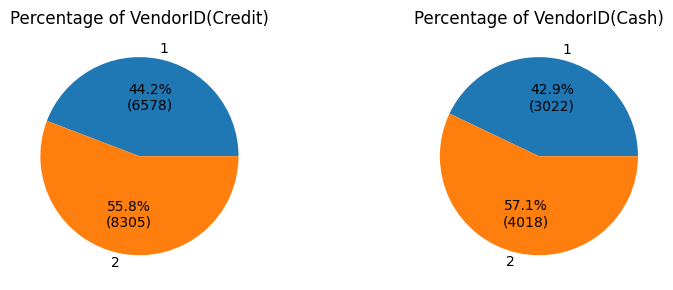

In [22]:
###############################################################
#plot of VendorID
###############################################################
fig,axs=plt.subplots(1,2,figsize=(9,3))

mask_credit=df_clean['payment_type']==1
result_credit=df_clean[mask_credit].groupby(['VendorID'])[["tpep_pickup_datetime"]].count().reset_index()
result_credit["tpep_pickup_datetime"]=result_credit["tpep_pickup_datetime"]
axs[0].pie(result_credit["tpep_pickup_datetime"],labels = result_credit['VendorID'], autopct=autopct_format(result_credit["tpep_pickup_datetime"]))
axs[0].set_title("Percentage of VendorID(Credit)")

mask_cash=df_clean['payment_type']==2
result_cash=df_clean[mask_cash].groupby(['VendorID'])[["tpep_pickup_datetime"]].count().reset_index()
result_cash["tpep_pickup_datetime"]=result_cash["tpep_pickup_datetime"]
axs[1].pie(result_cash["tpep_pickup_datetime"],labels = result_cash['VendorID'], autopct=autopct_format(result_cash["tpep_pickup_datetime"]))
axs[1].set_title("Percentage of VendorID(Cash)")

plt.tight_layout()
plt.show()
#=>vendor1 and vendor2 appeared to have similar weight in credit and cash

In [23]:
# Create tip percent column

df_credit['tip_percent']=round(df_credit['tip_amount']*100/(df_credit['total_amount']-df_credit['tip_amount']),1)
df_credit['tip_percent_int']=round(df_credit['tip_amount']*100/(df_credit['total_amount']-df_credit['tip_amount']),0)
df_credit['tip_percent_int']=df_credit['tip_percent_int'].astype(int)

df_credit['total_fare']=round(df_credit['total_amount']-df_credit['tip_amount'],3)
df_credit['cal_tip']=round(df_credit['total_fare']*df_credit['tip_percent_int']*0.01,3)
df_credit['tip_diff']=round(df_credit['cal_tip']-df_credit['tip_amount'],3)
df_credit['total_fare_diff']=round(df_credit['total_fare']-(df_credit['tip_amount']*100/df_credit['tip_percent_int']),3)
#since some trips tip_percent_int=0
df_credit['total_fare_diff']=df_credit['total_fare_diff'].fillna(0)
#according to net search, it seems like the tip rate is a number(Not float)
#https://centralis.com/blog/taxidarkpatterns
#https://www.nytimes.com/2012/01/09/nyregion/new-nyc-livery-cabs-wont-have-to-have-tvs.html

#https://pix11.com/news/nyc-cab-software-could-have-you-tipping-too-much/
#https://nypost.com/2015/01/07/you-may-be-unknowingly-over-tipping-your-cabbie/
#Payment systems by Creative Mobile Technologies (CMT) included the tax and tolls in the suggested tip while Verifone (VTS) leaves it out. 
#Passengers in cabs that use Creative Mobile Technologies to process credit cards are given a suggested tip based on an amount that includes tolls and the MTA tax — but those with the software Verifone do not.

#assume tip doesn't include any tax and tolls
#df_credit['tip_percent_notax']=round(round(df_credit['tip_amount'],2)*100/(df_credit['total_amount']-df_credit['mta_tax']-df_credit['tolls_amount']-df_credit['improvement_surcharge']-df_credit['tip_amount']),1)
#df_credit['tip_percent_notax']=round(df_credit['tip_amount']*100/(df_credit['fare_amount']+df_credit['extra']+df_credit['improvement_surcharge']),1)
#df_credit['tip_percent_notax']=round(df_credit['tip_amount']*100/(df_credit['fare_amount']+df_credit['extra']+df_credit['improvement_surcharge']+df_credit['mta_tax']),1)
#df_credit['tip_percent_notax']=round(df_credit['tip_amount']*100/(df_credit['fare_amount']+df_credit['extra']),1)
df_credit['tip_percent_notax']=round(df_credit['tip_amount']*100/(df_credit['fare_amount']+df_credit['improvement_surcharge']+df_credit['mta_tax']+df_credit['tolls_amount']),1)
#df_credit['tip_percent_notax']=round(df_credit['tip_amount']*100/(df_credit['fare_amount']),1)
df_credit[['VendorID','total_fare','cal_tip','tip_diff','total_fare_diff','total_amount','tip_amount','tip_percent','tip_percent_int','tip_percent_notax']].head(10)

,VendorID,total_fare,cal_tip,tip_diff,total_fare_diff,total_amount,tip_amount,tip_percent,tip_percent_int,tip_percent_notax
0,2,13.80,2.760,0.000,0.000,16.56,2.76,20.0,20,20.0
1,1,16.80,4.032,0.032,0.133,20.80,4.00,23.8,24,23.8
2,1,7.30,1.460,0.010,0.050,8.75,1.45,19.9,20,19.9
3,2,21.30,6.390,0.000,0.000,27.69,6.39,30.0,30,30.0
5,2,10.30,2.060,0.000,0.000,12.36,2.06,20.0,20,21.0
6,2,49.30,9.860,0.000,0.000,59.16,9.86,20.0,20,20.4
7,2,17.80,1.780,0.000,0.000,19.58,1.78,10.0,10,10.6
9,1,13.80,2.760,0.010,0.050,16.55,2.75,19.9,20,19.9
10,2,12.30,2.460,0.000,0.000,14.76,2.46,20.0,20,20.0
11,2,58.34,14.585,0.005,0.020,72.92,14.58,25.0,25,25.0


In [24]:
def compute_nyc_trip(PULocationID,DOLocationID):
    out_nyc_list=[1,265,264]
    if (PULocationID not in out_nyc_list) & (DOLocationID not in out_nyc_list):
        return True
    else:
        return False

# Create 'within_nyc' col
df_credit['within_nyc']=df_credit[['PULocationID','DOLocationID']].apply(lambda x: compute_nyc_trip(x["PULocationID"],x["DOLocationID"]), axis=1)


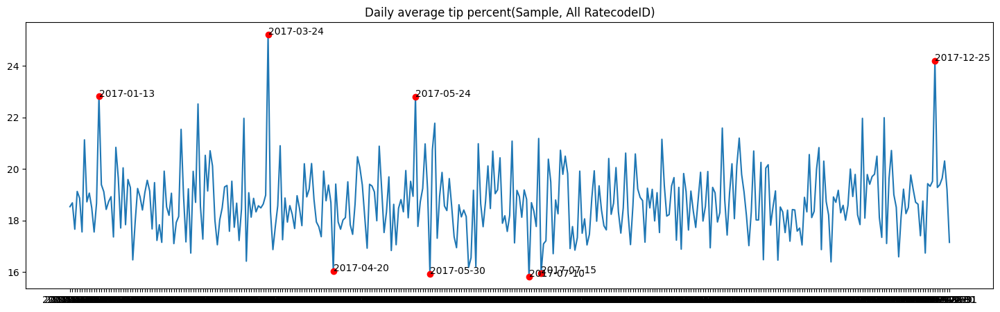

In [25]:
from scipy import stats

plt.figure(figsize=(18,5))

tmp_data=df_credit.groupby(['PU_date'])['tip_percent'].agg(['mean']).reset_index()
tmp_data['mean_zscore']=tmp_data[['mean']].apply(stats.zscore)
mask=(tmp_data['mean_zscore']<-2)|(tmp_data['mean_zscore']>3)
special_date_list=tmp_data[mask]['PU_date'].to_list()

plt.plot(tmp_data['PU_date'],tmp_data['mean'])

#add red marker to the dates which had more or less values
plt.plot(tmp_data[tmp_data['PU_date'].isin(special_date_list)]['PU_date'], tmp_data[tmp_data['PU_date'].isin(special_date_list)]['mean'], 'ro')

#add text
for pu_date in special_date_list:
    x_value=tmp_data[tmp_data['PU_date']==pu_date]['PU_date']
    y_value=tmp_data[tmp_data['PU_date']==pu_date]['mean']
    text=tmp_data.loc[tmp_data['PU_date'] == pu_date, 'PU_date'].values[0]
    #print(text)
    plt.text(x_value, y_value, text)
plt.title("Daily average tip percent(Sample, All RatecodeID)")
plt.show()

In [26]:
mask=(df_credit['PU_month']==5)&(df_credit['PU_day']==30)
df_credit[mask][['VendorID','total_fare','cal_tip','tip_diff','total_fare_diff','total_amount','tip_amount','tip_percent','tip_percent_int','tip_percent_notax']]

,VendorID,total_fare,cal_tip,tip_diff,total_fare_diff,total_amount,tip_amount,tip_percent,tip_percent_int,tip_percent_notax
556,2,6.30,1.008,0.008,0.050,7.30,1.00,15.9,16,15.9
627,1,10.80,2.160,0.010,0.050,12.95,2.15,19.9,20,19.9
929,2,11.30,2.260,0.000,0.000,13.56,2.26,20.0,20,20.0
1613,1,10.80,2.160,0.010,0.050,12.95,2.15,19.9,20,21.9
2438,2,9.80,0.980,0.000,0.000,10.78,0.98,10.0,10,10.0
3580,2,11.30,2.260,0.000,0.000,13.56,2.26,20.0,20,20.0
3666,2,6.30,1.260,0.000,0.000,7.56,1.26,20.0,20,21.7
4908,2,7.30,1.825,0.005,0.020,9.12,1.82,24.9,25,26.8
4972,1,8.30,0.000,0.000,0.000,8.30,0.00,0.0,0,0.0
5087,1,13.80,2.760,0.010,0.050,16.55,2.75,19.9,20,19.9


In [27]:
mask=df_credit['VendorID']==1
df_credit[mask][['VendorID','total_fare','cal_tip','tip_diff','total_fare_diff','total_amount','tip_amount','tip_percent','tip_percent_int','tip_percent_notax']].head(10)

,VendorID,total_fare,cal_tip,tip_diff,total_fare_diff,total_amount,tip_amount,tip_percent,tip_percent_int,tip_percent_notax
1,1,16.8,4.032,0.032,0.133,20.80,4.00,23.8,24,23.8
2,1,7.3,1.460,0.010,0.050,8.75,1.45,19.9,20,19.9
9,1,13.8,2.760,0.010,0.050,16.55,2.75,19.9,20,19.9
12,1,16.8,3.360,0.010,0.050,20.15,3.35,19.9,20,21.2
14,1,18.3,4.575,0.025,0.100,22.85,4.55,24.9,25,24.9
16,1,14.3,2.860,0.010,0.050,17.15,2.85,19.9,20,21.4
23,1,8.3,2.075,0.025,0.100,10.35,2.05,24.7,25,26.3
24,1,6.3,1.260,0.010,0.050,7.55,1.25,19.8,20,19.8
26,1,14.3,2.860,0.010,0.050,17.15,2.85,19.9,20,20.7
28,1,11.8,2.360,0.010,0.050,14.15,2.35,19.9,20,19.9


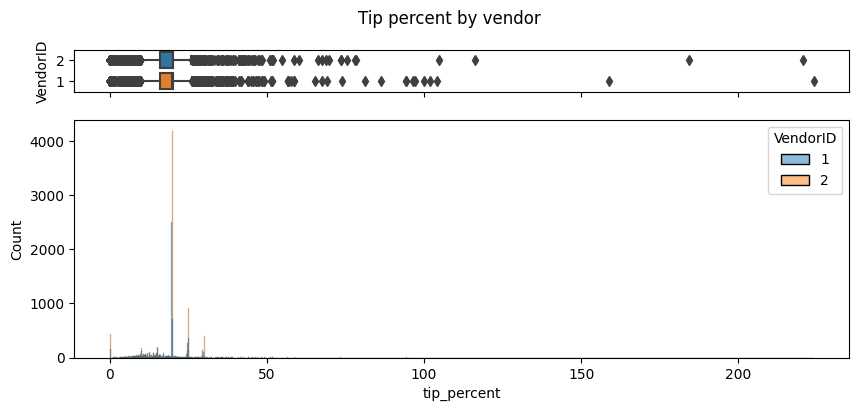

In [28]:
#################################################
#Confirm tip_percent by vendor
#################################################
# Cut the window in 2 parts
fig, (ax_box, ax_hist) = plt.subplots(2, sharex=True, figsize=(10,4),
                                      gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(data=df_credit,y=df_credit['VendorID'].astype(str),x='tip_percent',ax=ax_box)
sns.histplot(data=df_credit,x='tip_percent', hue='VendorID', palette='tab10', ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')
plt.suptitle('Tip percent by vendor')
plt.show()

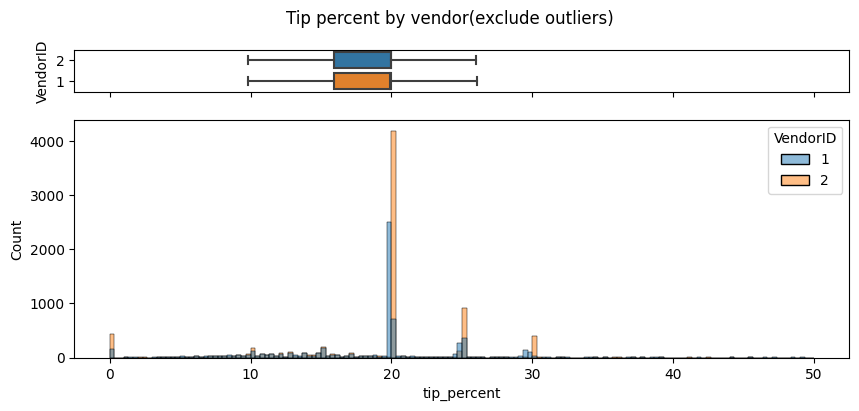

In [29]:
#################################################
#Confirm tip_percent by vendor
#################################################
# Cut the window in 2 parts
fig, (ax_box, ax_hist) = plt.subplots(2, sharex=True, figsize=(10,4),
                                      gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(data=df_credit,y=df_credit['VendorID'].astype(str),x='tip_percent',ax=ax_box,showfliers=False)
sns.histplot(data=df_credit,x='tip_percent', hue='VendorID', palette='tab10', ax=ax_hist,binrange=(0,50))
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')
plt.suptitle('Tip percent by vendor(exclude outliers)')
plt.show()

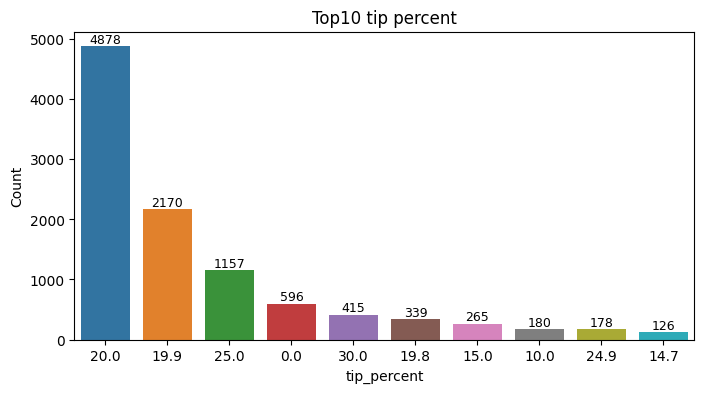

In [30]:
#####################################################################
#Plot top 10 tip_percent
#####################################################################
plt.figure(figsize=(8,4))
top10_tip_percent=df_credit.groupby(['tip_percent'])[['VendorID']].count().sort_values(['VendorID'],ascending=False)
top10_tip_percent=top10_tip_percent.iloc[:10]
ax=sns.barplot(data=top10_tip_percent, x=top10_tip_percent.index.astype(str),y='VendorID')
ax.bar_label(ax.containers[0], fontsize=9)
plt.ylabel('Count')
plt.title('Top10 tip percent')
plt.show()

#=>We can observe 20% was the top high
#=>19.9 was the second, let's think about 19.9
#it might due to some passengers input a flat fare or due to some passengers chose 20% tip rate

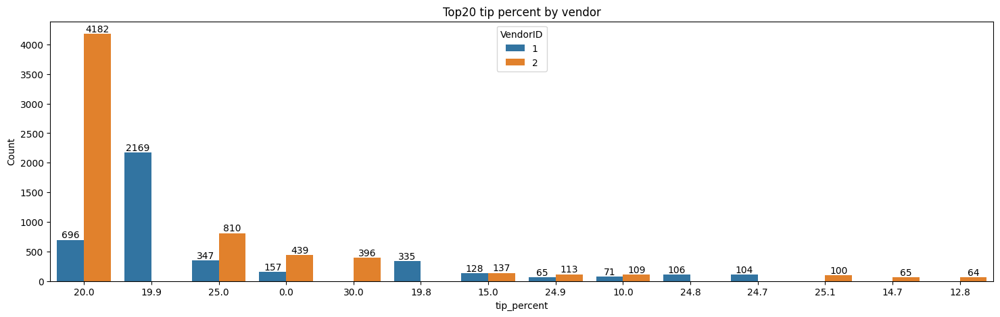

In [31]:
#####################################################################
#Plot top 20 tip_percent by vendor
#####################################################################
plt.figure(figsize=(18,5))
top20_tip_percent=df_credit.groupby(['tip_percent','VendorID'])[['tpep_pickup_datetime']].count().sort_values(['tpep_pickup_datetime'],ascending=False).reset_index()
top20_tip_percent=top20_tip_percent.iloc[:20]
ax=sns.barplot(data=top20_tip_percent, x=top20_tip_percent['tip_percent'].astype(str),y='tpep_pickup_datetime',hue='VendorID',palette='tab10')
ax.bar_label(ax.containers[0], fontsize=10)
ax.bar_label(ax.containers[1], fontsize=10)
plt.ylabel('Count')
plt.title('Top20 tip percent by vendor')
plt.show()

#=>we can observe all 19.9 came from vendor 2
#If 19.9 was due to passenger flat fare input, we could expect both vendor1 and vendor2 have similar distribution
#since all of them came from vendor 2, we could expect vendor 2 may have different tip calculation logic

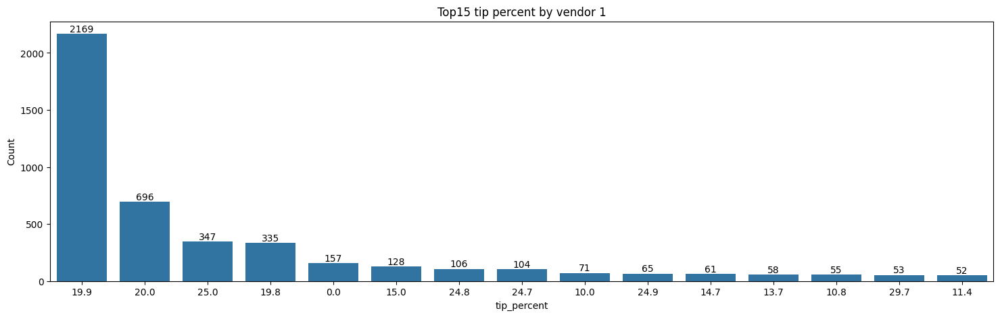

In [32]:
#####################################################################
#Plot top 15 tip_percent of vendor 1
#####################################################################
plt.figure(figsize=(18,5))
top_tip_percent=df_credit.groupby(['tip_percent','VendorID'])[['tpep_pickup_datetime']].count().sort_values(['tpep_pickup_datetime'],ascending=False).reset_index()
top_tip_percent=top_tip_percent[top_tip_percent['VendorID']==1].iloc[:15]
ax=sns.barplot(data=top_tip_percent, x=top_tip_percent['tip_percent'].astype(str),y='tpep_pickup_datetime',color='tab:blue')
ax.bar_label(ax.containers[0], fontsize=10)
plt.ylabel('Count')
plt.title('Top15 tip percent by vendor 1')
plt.show()
#we can observe 19.9 was the top high tip rate and according to web search we know that the suggested tip rate were 20%,25%,30%(No 19.9%)
#we can assume vendor 1 had different calculation
#we can observe that many tip rates were less than the closest integer rate(e.g. 19.9%, 19.8%, 24.8%, 24.9%)
#assume the total fare(Not total_amount) was not fare_amount+tolls+extra+tax+surcharge (the value displayed in this dataset)
#we know that 99.5% of trips paid surcharge, 66.7% paid mta_tax, 70% didn't pay extra, most didn't pay tolls
#so the difference may not due to include/exclude the above fares, it may due to something else, more common things
#let's assume when passenger choose tip percentage, systems may use a total fare to calculate tip, then round tip and insert them to db
#maybe in tip_amount calculation logic, their tip_amount may have more than two decimals(.xx * 15%/20%/25/%30%)
#they might need to round amount to less equal than 2 decimals

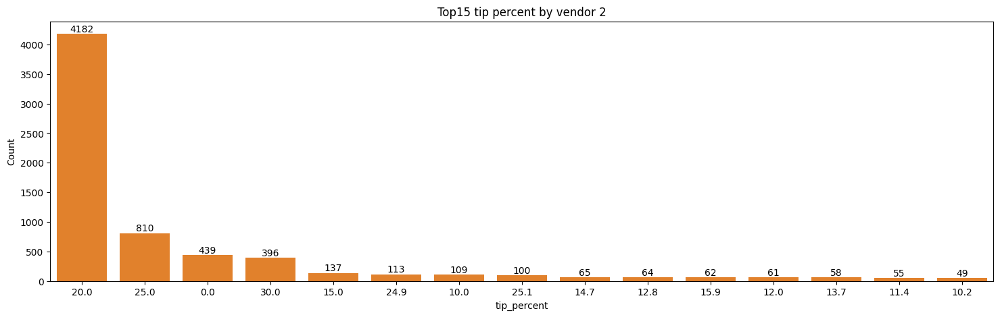

In [33]:
#####################################################################
#Plot top 15 tip_percent of vendor 2(VeriFone)
#####################################################################
plt.figure(figsize=(18,5))
top_tip_percent=df_credit.groupby(['tip_percent','VendorID'])[['tpep_pickup_datetime']].count().sort_values(['tpep_pickup_datetime'],ascending=False).reset_index()
top_tip_percent=top_tip_percent[top_tip_percent['VendorID']==2].iloc[:15]
ax=sns.barplot(data=top_tip_percent, x=top_tip_percent['tip_percent'].astype(str),y='tpep_pickup_datetime',color='tab:orange')
ax.bar_label(ax.containers[0], fontsize=10)
plt.ylabel('Count')
plt.title('Top15 tip percent by vendor 2')
plt.show()
#=>we could observe most tip_percent were an integer(20%,25%,0%,30%,15%), some were near an integer(+/- 0.1),
#some were not near an integer

#we know that extra was 0/0.5/1/4.5 ,mta_tax was 0/0.5, improvement_surcharge was 0.3,
#tolls are paid by E-ZPass, let's assume it have two decimals(minimum unit is 0.01)
#for fare_amount, except RateCodeID=5 others would have less equal than one decimal(initial charge and unit charge are all 0.5*N)
#if tip are calculated from fare_amount+tolls+extra+tax+surcharge, the minimum unit is 0.01(assume tip were calculated from the fare in this dataset, not calculate first then round and insert to this db)

#When tip rate=20%,
#=>when minimum unit is 0.01(tolls trip or RatecodeID=5), 0.01*0.2=0.002,possible decimals will be [0.002,0.004,0.006,0.008], if we round tip, XX.XX? will be XX.XX or XX.XX+0.01.
#==>if these decimals are equal chance, half of the value will round down to XX.XX, half will round up to XX.XX+0.01, 
#in this case, tip_percent will near 20%(+/- 0.2%) (since the minimum fare_amount is standard initial charge 2.5, tip_percent diff 0.005/2.5=0.002)
#=>when minimum unit is 0.1(no tolls trip and RatecodeID!=5), 0.1*0.2=0.02,if we round tip, XX.XX will be XX.XX(NO change)
#==>In this case, tip_percent will be exactly 20%.

#When tip rate=25%, 
#=>when minimum unit is 0.01(tolls trip or RatecodeID=5), 0.01*0.25=0.0025,possible decimals will be [0.0025,0.005,0.0075], if we round tip, XX.XX? will be XX.XX or XX.XX+0.01.
#==>if these decimals are equal chance, 2/3 of the value will round down to XX.XX, 1/3 will round up to XX.XX+0.01, 
#.  tip_percent will near 25%(+/- 0.2%)  (since the minimum fare_amount is standard initial charge2.5, tip_percent 0.005/2.5=0.002)
#=>when minimum unit is 0.1(no tolls trip and RatecodeID!=5), 0.1*0.25=0.025,possible decimals will be [0.025,0.05,0.075],if we round tip, XX.XX5 will be XX.XX(all round down)
#==>In this case, tip_percent will be 25%(+/- 0.2%).

#When tip rate=30%, 
#=>when minimum unit is 0.01(tolls trip or RatecodeID=5), 0.01*0.3=0.003,possible decimals will be [0.003,0.006,0.009], if we round tip, XX.XX? will be XX.XX or XX.XX+0.01.
#==>if these decimals are equal chance, 1/3 of the value will round down to XX.XX, 2/3 will round up to XX.XX+0.01, 
#.  tip_percent will near 30%(+/- 0.2%)  (since the minimum fare_amount is standard initial charge2.5, tip_percent 0.005/2.5=0.002)
#=>when minimum unit is 0.1(no tolls trip and RatecodeID!=5), 0.1*0.3=0.03,if we round tip, XX.XX will be XX.XX(No change)
#==>In this case, tip_percent will be exactly 30%.

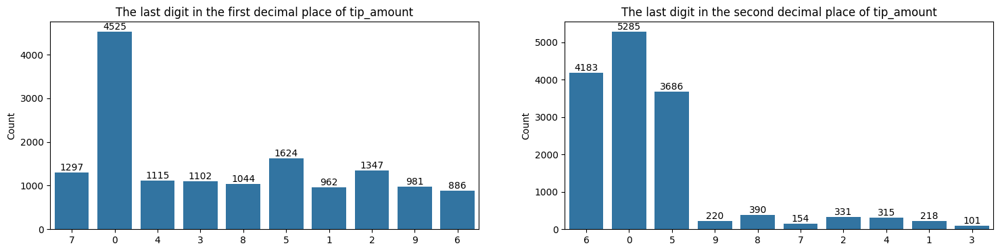

In [34]:
########################################################################
#Counts the occurrences of the last digit
#tip_amount
########################################################################
fig,axs=plt.subplots(1,2,figsize=(18,4))

########################################################################
#Counts the occurrences of the last digit in the first decimal place
########################################################################
result1=count_last_digit_first_decimal(df_credit['tip_amount'])
sns.barplot(x=list(result1.keys()),y=list(result1.values()),color='tab:blue',ax=axs[0])
axs[0].bar_label(axs[0].containers[0], fontsize=10)
axs[0].set_ylabel('Count')
axs[0].set_title('The last digit in the first decimal place of tip_amount')


########################################################################
#Counts the occurrences of the last digit in the second decimal place
########################################################################
result2=count_last_digit_second_decimal(df_credit['tip_amount'])
sns.barplot(x=list(result2.keys()),y=list(result2.values()),color='tab:blue',ax=axs[1])
axs[1].bar_label(axs[1].containers[0], fontsize=10)
axs[1].set_ylabel('Count')
axs[1].set_title('The last digit in the second decimal place of tip_amount')

plt.show()

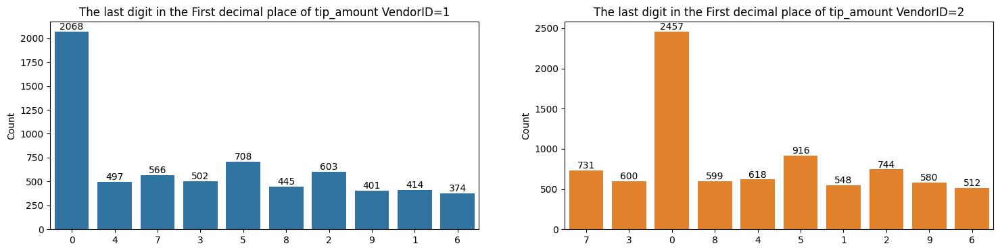

In [35]:
########################################################################
#Counts the occurrences of the last digit in the first decimal place
#tip_amount
########################################################################
fig,axs=plt.subplots(1,2,figsize=(18,4))

########################################################################
#Counts the occurrences of the last digit in the first decimal place
#VendorID=1
########################################################################
result=count_last_digit_first_decimal(df_credit[df_credit['VendorID']==1]['tip_amount'])
sns.barplot(x=list(result.keys()),y=list(result.values()),color='tab:blue',ax=axs[0])
axs[0].bar_label(axs[0].containers[0], fontsize=10)
axs[0].set_ylabel('Count')
axs[0].set_title('The last digit in the First decimal place of tip_amount VendorID=1')


########################################################################
#Counts the occurrences of the last digit in the first decimal place
#VendorID=2
########################################################################
result=count_last_digit_first_decimal(df_credit[df_credit['VendorID']==2]['tip_amount'])
sns.barplot(x=list(result.keys()),y=list(result.values()),color='tab:orange',ax=axs[1])
axs[1].bar_label(axs[1].containers[0], fontsize=10)
axs[1].set_ylabel('Count')
axs[1].set_title('The last digit in the First decimal place of tip_amount VendorID=2')

plt.show()

#=>it seems about First decimal, there was no big difference amoung two vendors 

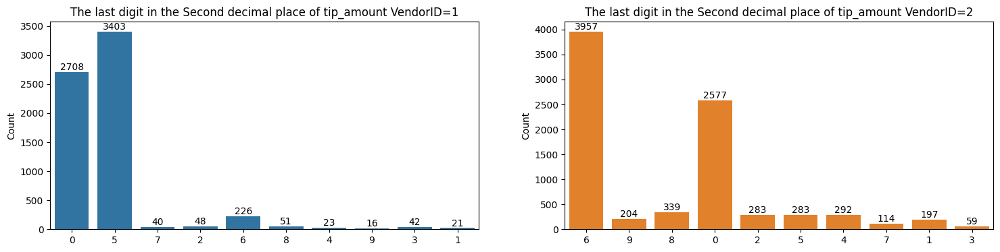

In [36]:
########################################################################
#Counts the occurrences of the last digit in the second decimal place
#tip_amount
########################################################################
fig,axs=plt.subplots(1,2,figsize=(18,4))

########################################################################
#Counts the occurrences of the last digit in the second decimal place
#VendorID=1
########################################################################
result=count_last_digit_second_decimal(df_credit[df_credit['VendorID']==1]['tip_amount'])
sns.barplot(x=list(result.keys()),y=list(result.values()),color='tab:blue',ax=axs[0])
axs[0].bar_label(axs[0].containers[0], fontsize=10)
axs[0].set_ylabel('Count')
axs[0].set_title('The last digit in the Second decimal place of tip_amount VendorID=1')


########################################################################
#Counts the occurrences of the last digit in the second decimal place
#VendorID=2
########################################################################
result=count_last_digit_second_decimal(df_credit[df_credit['VendorID']==2]['tip_amount'])
sns.barplot(x=list(result.keys()),y=list(result.values()),color='tab:orange',ax=axs[1])
axs[1].bar_label(axs[1].containers[0], fontsize=10)
axs[1].set_ylabel('Count')
axs[1].set_title('The last digit in the Second decimal place of tip_amount VendorID=2')

plt.show()

#there were differences amoung two vendors in the second decimal
#vendor1 appeared to be x.x0 or x.x5 while vendor2 appeared to be x.x6 or x.x0

#==>assumption: for VendorID=1, most tip_amount calculated by tip percentage the second decimal would be 0.00 or 0.05.
#tip_amount the second decimal which were not 0.00 or 0.05 it would be inputted by passengers or part of systems had different logic(their tip percent were perfect integers)

#since most tip_percentage of vendor1 were smaller than 20% or 25%, we could assume that vendor 1 round down tip_amount to .05

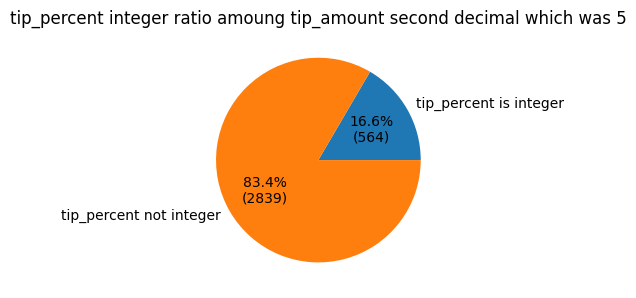

In [37]:
########################################################################
#Confirm the second decimal which was 5
#VendorID=1
#tip_amount
########################################################################
mask=(df_credit['VendorID']==1)&(df_credit[['tip_amount']].apply(lambda x: get_last_digit_second_decimal(x["tip_amount"]), axis=1)=='5')

#tip_percent is an integer(e.g. 20.0, 15.0)
tip_percent_isInt=np.sum(df_credit[mask]['tip_percent'].apply(float.is_integer))
tip_percent_notInt=np.sum(~df_credit[mask]['tip_percent'].apply(float.is_integer))
result={
    'tip_percent is integer': tip_percent_isInt,
    'tip_percent not integer': tip_percent_notInt,
}

plt.figure(figsize=(5,5))
plt.pie(result.values(),labels = result.keys(), autopct=autopct_format(result.values()))
plt.title("tip_percent integer ratio amoung tip_amount second decimal which was 5")
plt.tight_layout()
plt.show()

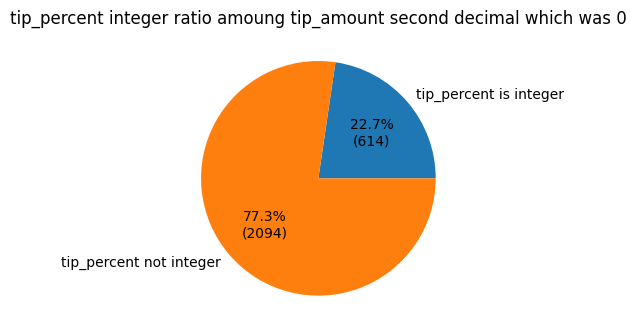

In [38]:
########################################################################
#Confirm the second decimal which was 0
#VendorID=1
#tip_amount
########################################################################
mask=(df_credit['VendorID']==1)&(df_credit[['tip_amount']].apply(lambda x: get_last_digit_second_decimal(x["tip_amount"]), axis=1)=='0')


#tip_percent is an integer(e.g. 20.0, 15.0)
tip_percent_isInt=np.sum(df_credit[mask]['tip_percent'].apply(float.is_integer))
tip_percent_notInt=np.sum(~df_credit[mask]['tip_percent'].apply(float.is_integer))
result={
    'tip_percent is integer': tip_percent_isInt,
    'tip_percent not integer': tip_percent_notInt,
}

plt.figure(figsize=(5,5))
plt.pie(result.values(),labels = result.keys(), autopct=autopct_format(result.values()))
plt.title("tip_percent integer ratio amoung tip_amount second decimal which was 0")
plt.tight_layout()
plt.show()

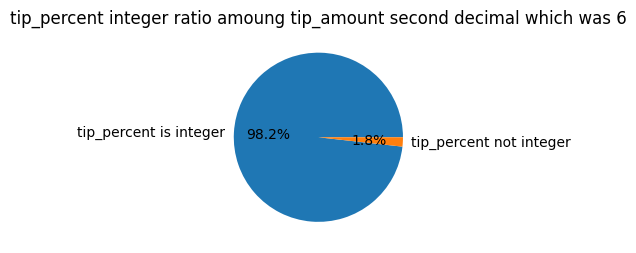

In [39]:
########################################################################
#Confirm the second decimal which was 6
#VendorID=1
#tip_amount
########################################################################
mask=(df_credit['VendorID']==1)&(df_credit[['tip_amount']].apply(lambda x: get_last_digit_second_decimal(x["tip_amount"]), axis=1)=='6')


#tip_percent is an integer(e.g. 20.0, 15.0)
tip_percent_isInt=np.sum(df_credit[mask]['tip_percent'].apply(float.is_integer))
tip_percent_notInt=np.sum(~df_credit[mask]['tip_percent'].apply(float.is_integer))
result={
    'tip_percent is integer': tip_percent_isInt,
    'tip_percent not integer': tip_percent_notInt,
}

plt.figure(figsize=(5,5))
plt.pie(result.values(),labels = result.keys(), autopct='%1.1f%%')
plt.title("tip_percent integer ratio amoung tip_amount second decimal which was 6")
plt.tight_layout()
plt.show()

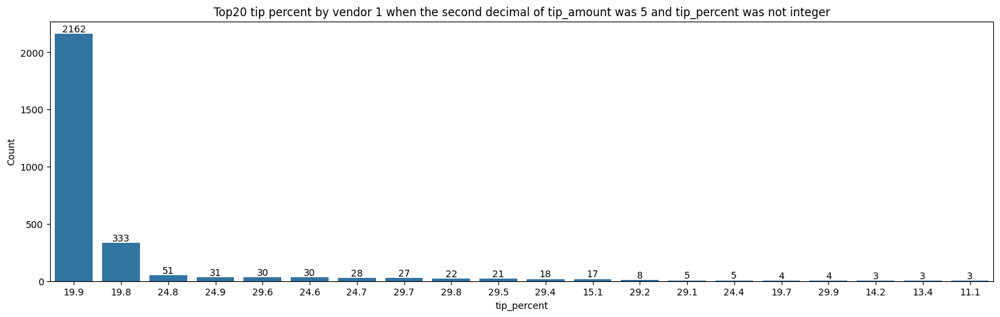

In [40]:
#####################################################################
#Plot top 15 tip_percent of vendor 1 
#when the second decimal which was 5
#tip_percent is not integer
#####################################################################
plt.figure(figsize=(18,5))

mask=(df_credit['VendorID']==1)&(df_credit[['tip_amount']].apply(lambda x: get_last_digit_second_decimal(x["tip_amount"]), axis=1)=='5')&(~df_credit['tip_percent'].apply(float.is_integer))
top_tip_percent=df_credit[mask].groupby(['tip_percent'])[['tpep_pickup_datetime']].count().sort_values(['tpep_pickup_datetime'],ascending=False).reset_index()
top_tip_percent=top_tip_percent.iloc[:20]
ax=sns.barplot(data=top_tip_percent, x=top_tip_percent['tip_percent'].astype(str),y='tpep_pickup_datetime',color='tab:blue')
ax.bar_label(ax.containers[0], fontsize=10)
plt.ylabel('Count')
plt.title('Top20 tip percent by vendor 1 when the second decimal of tip_amount was 5 and tip_percent was not integer')
plt.show()

#vendor1 seems round down tip_amount to the nearest 0.05
#e.g. 5.755 will round down to 5.75

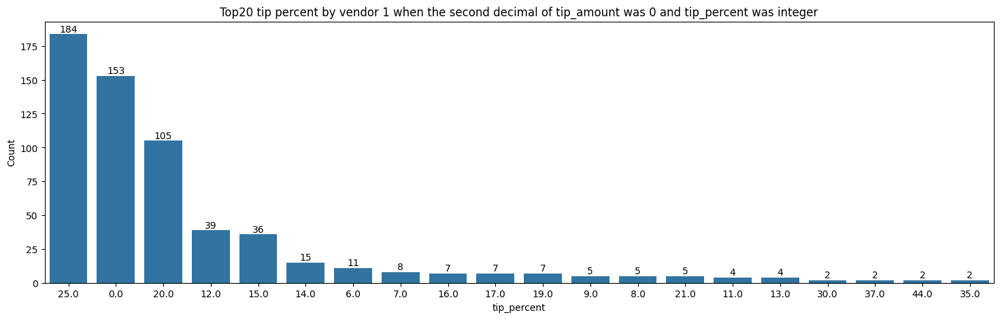

In [41]:
#####################################################################
#Plot top 15 tip_percent of vendor 1 
#when the second decimal which was 0
#tip_percent is integer
#####################################################################
plt.figure(figsize=(18,5))

mask=(df_credit['VendorID']==1)&(df_credit[['tip_amount']].apply(lambda x: get_last_digit_second_decimal(x["tip_amount"]), axis=1)=='0')&(df_credit['tip_percent'].apply(float.is_integer))
top_tip_percent=df_credit[mask].groupby(['tip_percent'])[['tpep_pickup_datetime']].count().sort_values(['tpep_pickup_datetime'],ascending=False).reset_index()
top_tip_percent=top_tip_percent.iloc[:20]
ax=sns.barplot(data=top_tip_percent, x=top_tip_percent['tip_percent'].astype(str),y='tpep_pickup_datetime',color='tab:blue')
ax.bar_label(ax.containers[0], fontsize=10)
plt.ylabel('Count')
plt.title('Top20 tip percent by vendor 1 when the second decimal of tip_amount was 0 and tip_percent was integer')
plt.show()

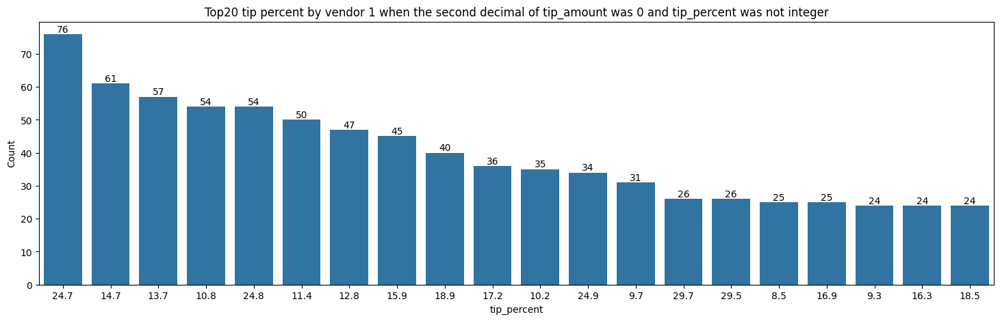

In [42]:
#####################################################################
#Plot top 15 tip_percent of vendor 1 
#when the second decimal which was 0
#tip_percent is not integer
#####################################################################
plt.figure(figsize=(18,5))

mask=(df_credit['VendorID']==1)&(df_credit[['tip_amount']].apply(lambda x: get_last_digit_second_decimal(x["tip_amount"]), axis=1)=='0')&(~df_credit['tip_percent'].apply(float.is_integer))
top_tip_percent=df_credit[mask].groupby(['tip_percent'])[['tpep_pickup_datetime']].count().sort_values(['tpep_pickup_datetime'],ascending=False).reset_index()
top_tip_percent=top_tip_percent.iloc[:20]
ax=sns.barplot(data=top_tip_percent, x=top_tip_percent['tip_percent'].astype(str),y='tpep_pickup_datetime',color='tab:blue')
ax.bar_label(ax.containers[0], fontsize=10)
plt.ylabel('Count')
plt.title('Top20 tip percent by vendor 1 when the second decimal of tip_amount was 0 and tip_percent was not integer')
plt.show()

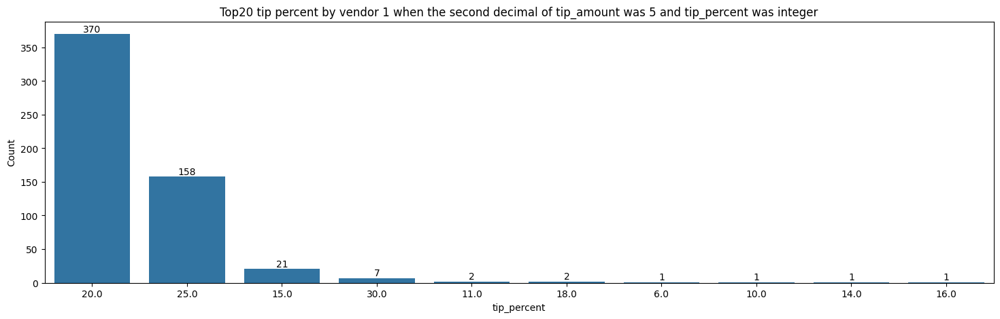

In [43]:
#####################################################################
#Plot top 15 tip_percent of vendor 1 
#when the second decimal which was 5
#tip_percent is integer
#####################################################################
plt.figure(figsize=(18,5))

mask=(df_credit['VendorID']==1)&(df_credit[['tip_amount']].apply(lambda x: get_last_digit_second_decimal(x["tip_amount"]), axis=1)=='5')&(df_credit['tip_percent'].apply(float.is_integer))
top_tip_percent=df_credit[mask].groupby(['tip_percent'])[['tpep_pickup_datetime']].count().sort_values(['tpep_pickup_datetime'],ascending=False).reset_index()
top_tip_percent=top_tip_percent.iloc[:20]
ax=sns.barplot(data=top_tip_percent, x=top_tip_percent['tip_percent'].astype(str),y='tpep_pickup_datetime',color='tab:blue')
ax.bar_label(ax.containers[0], fontsize=10)
plt.ylabel('Count')
plt.title('Top20 tip percent by vendor 1 when the second decimal of tip_amount was 5 and tip_percent was integer')
plt.show()

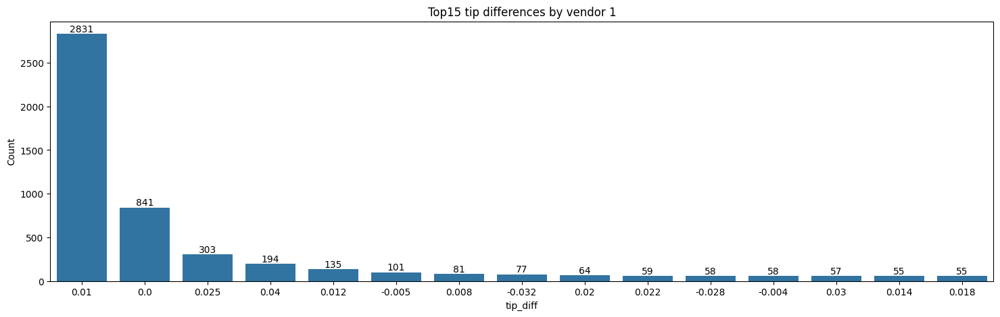

In [44]:
#####################################################################
#Plot top 15 tip differences of vendor 1
#####################################################################
plt.figure(figsize=(18,5))
top_tip_percent=df_credit.groupby(['tip_diff','VendorID'])[['tpep_pickup_datetime']].count().sort_values(['tpep_pickup_datetime'],ascending=False).reset_index()
top_tip_percent=top_tip_percent[top_tip_percent['VendorID']==1].iloc[:15]
ax=sns.barplot(data=top_tip_percent, x=top_tip_percent['tip_diff'].astype(str),y='tpep_pickup_datetime',color='tab:blue')
ax.bar_label(ax.containers[0], fontsize=10)
plt.ylabel('Count')
plt.title('Top15 tip differences by vendor 1')
plt.show()




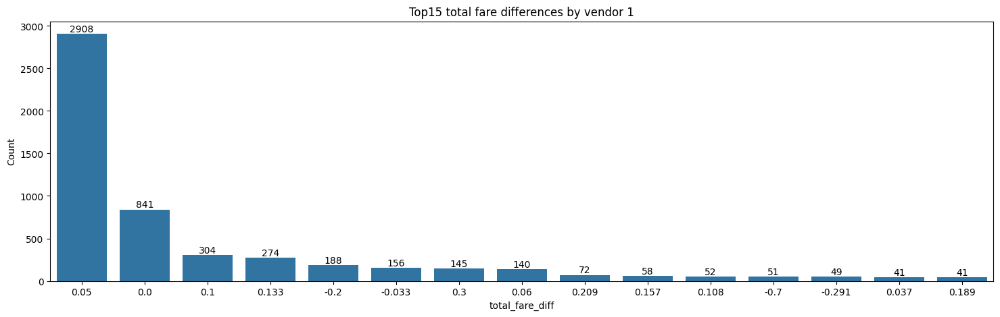

In [45]:
#####################################################################
#Plot top 15 total fare(exclude tip) differences of vendor 1
#####################################################################
plt.figure(figsize=(18,5))
top_tip_percent=df_credit.groupby(['total_fare_diff','VendorID'])[['tpep_pickup_datetime']].count().sort_values(['tpep_pickup_datetime'],ascending=False).reset_index()
top_tip_percent=top_tip_percent[top_tip_percent['VendorID']==1].iloc[:15]
ax=sns.barplot(data=top_tip_percent, x=top_tip_percent['total_fare_diff'].astype(str),y='tpep_pickup_datetime',color='tab:blue')
ax.bar_label(ax.containers[0], fontsize=10)
plt.ylabel('Count')
plt.title('Top15 total fare differences by vendor 1')
plt.show()

#about 0.05, most of them tip percent was near 20%(19.9%, 20%, 19.8%), most of them no tolls(tolls were xx.5 but ratecodeid=5 no 0.05 decimals)
##=>for trip_distance, vendorID=2 had two decimals, vendorID=1 had one decimal(minimum unit was 0.1), standard trip unit charge was 0.5, 0.1*0.5=0.05, it might due to fare_amount
#tip_diff
#0.010    2904
#0.008      51
#0.016      12
#0.004       7
#0.012       6
#0.006       2
#0.024       2
#0.020       1

#tolls_amount
#0.0     2981
#10.5       3
#16.5       1

#tip_percent
#19.9    2211
#20.0     348
#19.8     341
#15.9      44
#31.7      12
#16.0       7
#23.8       5
#19.7       4
#8.0        4
#7.9        3
#11.9       2
#47.6       2
#23.9       1
#39.9       1

#for tip_diff=0.01, tip_percent=19.9% , 20%, 19.8%, 19.7%
#1.46->1.45  (both round and round down could get this value) 
#2.76->2.75  (both round and round down could get this value)
#3.36->3.35  (both round and round down could get this value)
#1.16->1.15  (both round and round down could get this value) 20%
#tip_percent=19.9%, total_fare 6.8-19.8
#tip_percent=20%, total_fare 20.3-90.8
#tip_percent=19.8%, total_fare 4.3-6.3
#tip_percent=19.7%, total_fare 3.8

#for tip_diff=0.008, tip_percent=15.9% , 16% 
#=>many tip_amount or total_amount were integers, might be manually input a flat tip

#for tip_diff=0.016, tip_percent=31.7% 
#=>many tip_amount were integers($2), might be manually input a flat tip(total_fare 6.3)

#for tip_diff=0.004, tip_percent=8%, 7.9%


#about 0.1, most of them tip percent was near 25% (24.8%, 24.7%, 24.9%, 24.6%, 24.5%), one was 5%, most of them no tolls(tolls were xx.5)
#most of tip_diff were 0.025, only one were 0.005
#it seems like it round down tip_amount to closest 0.005
#2.075->2.05 (round=2.1, round down=2.05)  it might round down to nearest 0.05
#4.575->4.55 (round=4.6, round down=4.55), it might round down to nearest 0.05
#2.575->2.55 (round=2.6, round down=2.55), it might round down to nearest 0.05
#1.715->1.71 (round=1.7, round down=1.7), (tip_percent 5%), might be manually input a flat tip, not round down

#about -0.2, most of them tip_amount were an integer or XX.5 or non-integer but total_amount was integer or XX.5. no tolls
#about 0.3, most of them tip_amount were an integer or XX.5 or non-integer but total_amount was integer or XX.5. no tolls
#about -0.7, most of them tip_amount were an integer or XX.5 or non-integer but total_amount was integer or XX.5. only one toll(10.5)

#about 0.06, most of them tip percent were 20%, 25%, 30%(small part 19.9, 10, 29.9) ,all of them paid tolls, all of them tolls_amount were 5.76
#9.112->0.1  (both round and round down could get this value) tip_percent=20%
#5.856->5.85 (both round and round down could get this value) tip_percent=10%
#14.568->14.56 (both round and round down could get this value) tip_percent=30%
#4.212->4.2 (both round and round down could get this value) tip_percent=19.9%

#about 0.09, most of them tip percent were near 20%(19.9%, 20%) ,all of them paid tolls, all of them tolls_amount were XX.54
#7.668->7.65 (both round and round down could get this value) tip_percent=20%
#7.068->7.05 (both round and round down could get this value) tip_percent=19.9%




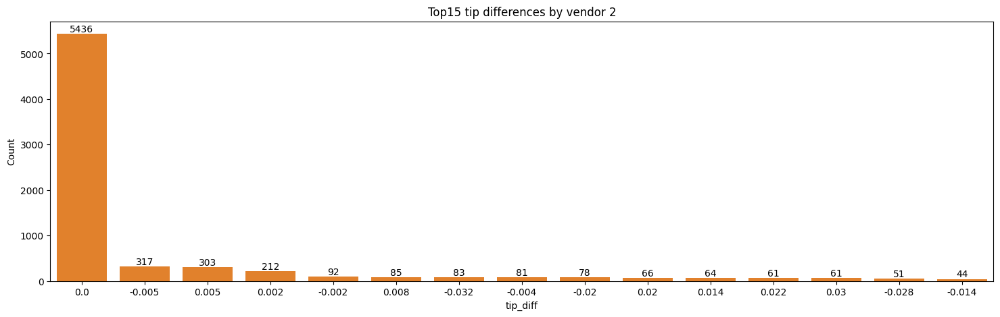

In [46]:
#####################################################################
#Plot top 15 tip differences of vendor 2
#####################################################################
plt.figure(figsize=(18,5))
top_tip_percent=df_credit.groupby(['tip_diff','VendorID'])[['tpep_pickup_datetime']].count().sort_values(['tpep_pickup_datetime'],ascending=False).reset_index()
top_tip_percent=top_tip_percent[top_tip_percent['VendorID']==2].iloc[:15]
ax=sns.barplot(data=top_tip_percent, x=top_tip_percent['tip_diff'].astype(str),y='tpep_pickup_datetime',color='tab:orange')
ax.bar_label(ax.containers[0], fontsize=10)
plt.ylabel('Count')
plt.title('Top15 tip differences by vendor 2')
plt.show()

#about 0.0
#total_fare=13.8, tip_percent=20%, 2.76->2.76 (round, round down and round up to 0.01 could get this value)
#total_fare=35.56, tip_percent=25%, 8.89->8.89 (round, round down and round up to 0.01 could get this value)

#about -0.005
#confirmed some samples in this lab environment
#total_fare=32.30, tip_percent=25%, 8.075->8.08 (only round up to nearest 0.01 could get this value, Spreedsheet round could get this value, it might due to Python)
#total_fare=12.3, tip_percent=15%, 1.845->1.85 (only round up to nearest 0.01 could get this value, Spreedsheet round could get this value, it might due to Python)
#total_fare=36.06, tip_percent=25%, 9.015->9.02 (both round and round up to 0.01 could get this value)
#total_fare=22.30, tip_percent=25%, 5.575->5.58 (both round and round up to 0.01 could get this value)
#total_fare=12.30, tip_percent=25%, 3.075->3.08 (both round and round up to 0.01 could get this value)

#about 0.005
#total_fare=58.34, tip_percent=25%, 14.585->14.58 (both round and round down to 0.01 could get this value)
#total_fare=13.3, tip_percent=25%, 3.325->3.32 (both round and round down to 0.01 could get this value)
#total_fare=7.3, tip_percent=24.9%, 1.825->1.82 (both round and round down to 0.01 could get this value)
#total_fare=7.3, tip_percent=24.9%, 1.825->1.82 (both round and round down to 0.01 could get this value)

#about 0.002
#total_fare=39.06, tip_percent=20%, 7.812->7.81 (both round and round down to 0.01 could get this value)
#total_fare=58.56, tip_percent=20%, 11.712->11.71 (both round and round down to 0.01 could get this value)
#total_fare=58.34, tip_percent=25%, 14.585->14.58 (both round and round down to 0.01 could get this value)


#When tip_amount have three decimals, it will round to nearest 0.01 (different from vendor1, vendor1 seems round down to nearest 0.05)

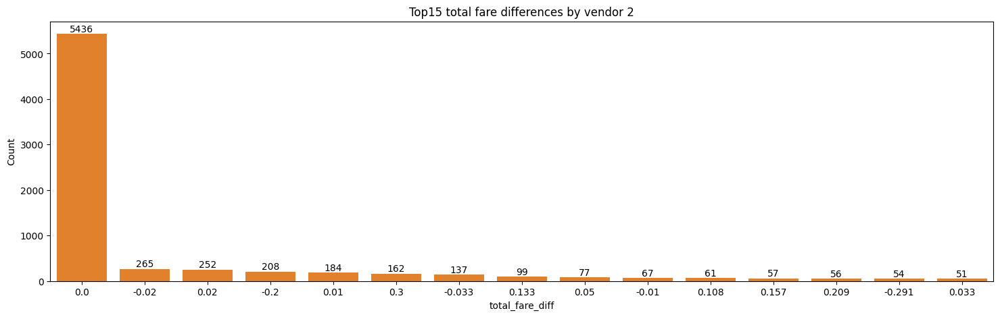

In [47]:
#####################################################################
#Plot top 15 total fare(exclude tip) differences of vendor 2
#####################################################################
plt.figure(figsize=(18,5))
top_tip_percent=df_credit.groupby(['total_fare_diff','VendorID'])[['tpep_pickup_datetime']].count().sort_values(['tpep_pickup_datetime'],ascending=False).reset_index()
top_tip_percent=top_tip_percent[top_tip_percent['VendorID']==2].iloc[:15]
ax=sns.barplot(data=top_tip_percent, x=top_tip_percent['total_fare_diff'].astype(str),y='tpep_pickup_datetime',color='tab:orange')
ax.bar_label(ax.containers[0], fontsize=10)
plt.ylabel('Count')
plt.title('Top15 total fare differences by vendor 2')
plt.show()

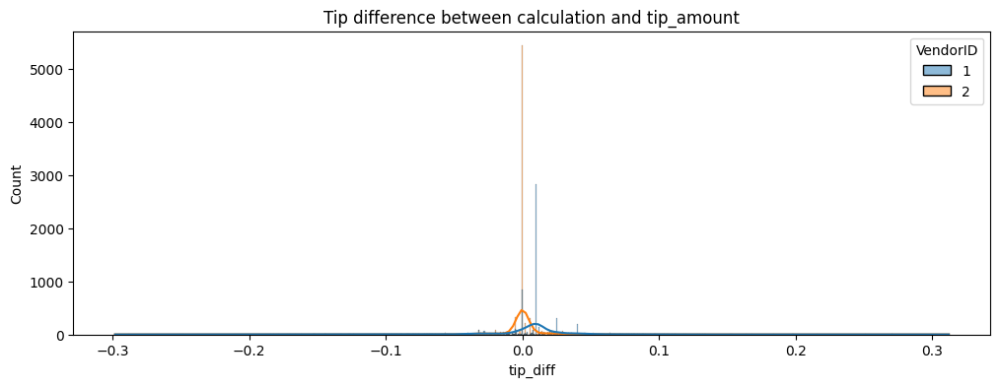

In [48]:
plt.figure(figsize=(12,4))
sns.histplot(data=df_credit,x='tip_diff',hue='VendorID',kde=True,palette='tab10')
plt.title('Tip difference between calculation and tip_amount')
plt.show()

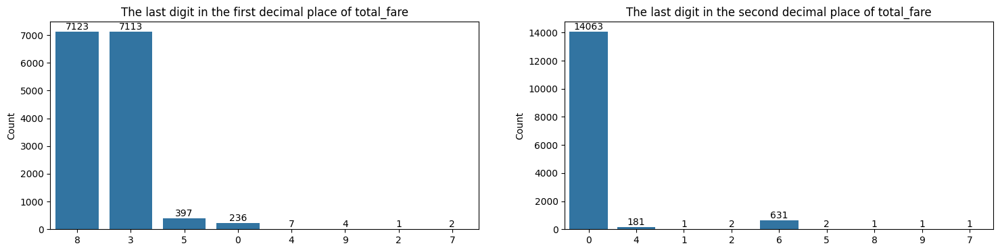

In [49]:
########################################################################
#Assume when passengers chose tip rate, tip_amount would caculate from total_fare
#Counts the occurrences of the last digit
#total_fare
########################################################################
fig,axs=plt.subplots(1,2,figsize=(18,4))

########################################################################
#Counts the occurrences of the last digit in the first decimal place
########################################################################
result=count_last_digit_first_decimal(df_credit['total_fare'])
sns.barplot(x=list(result.keys()),y=list(result.values()),color='tab:blue',ax=axs[0])
axs[0].bar_label(axs[0].containers[0], fontsize=10)
axs[0].set_ylabel('Count')
axs[0].set_title('The last digit in the first decimal place of total_fare')


########################################################################
#Counts the occurrences of the last digit in the second decimal place
########################################################################
result=count_last_digit_second_decimal(df_credit['total_fare'])
sns.barplot(x=list(result.keys()),y=list(result.values()),color='tab:blue',ax=axs[1])
axs[1].bar_label(axs[1].containers[0], fontsize=10)
axs[1].set_ylabel('Count')
axs[1].set_title('The last digit in the second decimal place of total_fare')

plt.show()

#most trips total_fare(total_amount-tip_amount) would be .8 or .3
#when total fare(total_amount-tip_amount) was .3
#tip_percent=20%, tip_amount=.3*20%=0.06
#==>round to 0.01: 0.06->0.06       No change
#==>round down to 0.05: 0.06->0.05  (-$0.01)

#tip_percent=25%, tip_amount=.3*25%=0.075
#==>round to 0.01: 0.075->0.08       (+$0.005)
#==>round down to 0.05: 0.075->0.05  (-$0.025)

#tip_percent=30%, tip_amount=.3*30%=0.09
#==>round to 0.01: 0.09->0.09         No change
#==>round down to 0.05: 0.09->0.05   (-$0.04)

#tip_percent=15%, tip_amount=.3*15%=0.045
#==>round to 0.01: 0.045->0.04       (-$0.005)
#==>round down to 0.05: 0.045->0.00  (-$0.045)

#tip_percent=10%, tip_amount=.3*10%=0.03
#==>round to 0.01: 0.03->0.03         No change
#==>round down to 0.05: 0.03->0.00   (-$0.03)

#when total fare(total_amount-tip_amount) was .8
#tip_percent=20%, tip_amount=.8*20%=0.16
#==>round to 0.01: 0.16->0.16       No change
#==>round down to 0.05: 0.16->0.15  (-$0.01)

#tip_percent=25%, tip_amount=.8*25%=0.2
#==>round to 0.01: 0.2->0.2         No change
#==>round down to 0.05: 0.2->0.2    No change

#tip_percent=30%, tip_amount=.8*30%=0.24
#==>round to 0.01: 0.24->0.24        No change
#==>round down to 0.05: 0.24->0.20   (-$0.04)

#tip_percent=15%, tip_amount=.8*15%=0.12
#==>round to 0.01: 0.12->0.12        No change
#==>round down to 0.05: 0.12->0.10   (-$0.02)

#tip_percent=10%, tip_amount=.8*10%=0.08
#==>round to 0.01: 0.08->0.08         No change
#==>round down to 0.05: 0.08->0.05   (-$0.03)

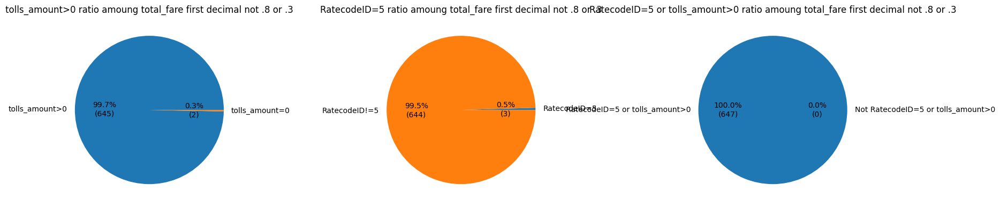

In [50]:
########################################################################
#Confirm the first decimal which was not .8 or .3
#total_fare
########################################################################
mask_decimal=(~df_credit[['total_fare']].apply(lambda x: get_last_digit_first_decimal(x["total_fare"]), axis=1).isin(['8','3']))

fig,axs=plt.subplots(1,3,figsize=(18,4))

#********************************************#
#check if how many of them tolls_amount>0
#********************************************#
mask_tolls_amount_gt0=df_credit['tolls_amount']>0
total_cnt=df_credit[mask_decimal].shape[0]
tolls_amount_gt0_cnt=df_credit[mask_decimal&mask_tolls_amount_gt0].shape[0]

result1={
    'tolls_amount>0': tolls_amount_gt0_cnt,
    'tolls_amount=0': total_cnt-tolls_amount_gt0_cnt,
}

axs[0].pie(result1.values(),labels = result1.keys(), autopct=autopct_format(result1.values()))
axs[0].set_title("tolls_amount>0 ratio amoung total_fare first decimal not .8 or .3")


#********************************************#
#check if how many of them RatecodeID==5
#********************************************#
mask_RatecodeID5=df_credit['RatecodeID']==5
total_cnt=df_credit[mask_decimal].shape[0]
RatecodeID5_cnt=df_credit[mask_decimal&mask_RatecodeID5].shape[0]

result2={
    'RatecodeID=5': RatecodeID5_cnt,
    'RatecodeID!=5': total_cnt-RatecodeID5_cnt,
}

axs[1].pie(result2.values(),labels = result2.keys(), autopct=autopct_format(result2.values()))
axs[1].set_title("RatecodeID=5 ratio amoung total_fare first decimal not .8 or .3")

#********************************************#
#check if how many of them RatecodeID==5 or tolls_amount>0
#********************************************#
mask_condition=(df_credit['RatecodeID']==5)|(df_credit['tolls_amount']>0)
total_cnt=df_credit[mask_decimal].shape[0]
meet_condition_cnt=df_credit[mask_decimal&mask_condition].shape[0]

result3={
    'RatecodeID=5 or tolls_amount>0': meet_condition_cnt,
    'Not RatecodeID=5 or tolls_amount>0': total_cnt-meet_condition_cnt,
}

axs[2].pie(result3.values(),labels = result3.keys(), autopct=autopct_format(result3.values()))
axs[2].set_title("RatecodeID=5 or tolls_amount>0 ratio amoung total_fare first decimal not .8 or .3")

plt.tight_layout()
plt.show()

#=>we could observe only ratecodeid=5 or tolls_amount>0 trip could have non .3 or .8 fares(total_amount-tip_amount)



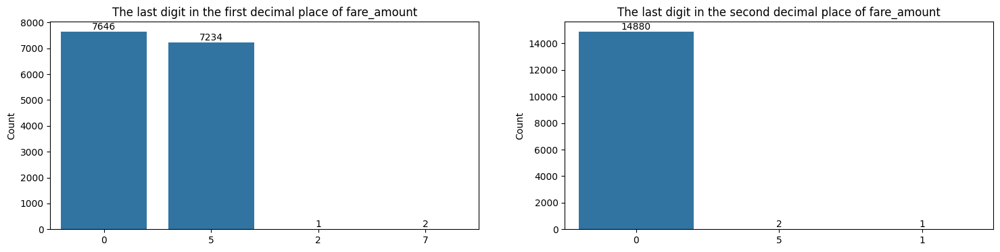

In [51]:
########################################################################
#Counts the occurrences of the last digit
#fare_amount
########################################################################
fig,axs=plt.subplots(1,2,figsize=(18,4))

########################################################################
#Counts the occurrences of the last digit in the first decimal place
########################################################################
result=count_last_digit_first_decimal(df_credit['fare_amount'])
sns.barplot(x=list(result.keys()),y=list(result.values()),color='tab:blue',ax=axs[0])
axs[0].bar_label(axs[0].containers[0], fontsize=10)
axs[0].set_ylabel('Count')
axs[0].set_title('The last digit in the first decimal place of fare_amount')


########################################################################
#Counts the occurrences of the last digit in the second decimal place
########################################################################
result=count_last_digit_second_decimal(df_credit['fare_amount'])
sns.barplot(x=list(result.keys()),y=list(result.values()),color='tab:blue',ax=axs[1])
axs[1].bar_label(axs[1].containers[0], fontsize=10)
axs[1].set_ylabel('Count')
axs[1].set_title('The last digit in the second decimal place of fare_amount')

plt.show()

#For most fare_amount, it was XX.0 or XX.5, only 3 of them(RatecodeID=5) didn't meet this condition
#Let's assume except RatecodeID=5 Negotiated fare(maybe input miss), fare_amount calculated by the system should be XX.0 or XX.5 

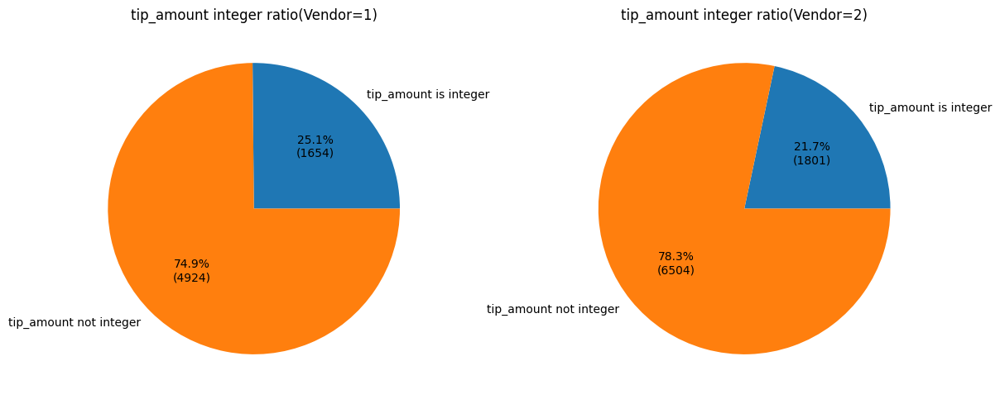

In [52]:
#In general(and also according to web search), when passenger tip they will act as bellow
#1. choose the default(suggested option) tip rate(20%,25%,30%)
#2. if they feel the service doesn't deserve a tip they will choose no tip(e.g. self-service, poor service)
#3. some will calculate the tip by themselves since many places calculate tips after tax(Not before tax)
#5. some will pay an integer flat tip (e.g. $1, $2, $3...)
#6. some will pay a non-integer flat tip to round total_amount(make it an integer) 
#7. some will round up tip to $1 if the tip calculated by percentage is less than $1
#8. some think fare should include everything(include employee salary), will not tip

#https://www.furnishedquarters.com/blog/nyc-tipping-guide
#'If you’re paying with a card, the touchscreen pad will allow you to choose a percentage and then calculate the taxi tip for you.'
#it seems only card could choose a percentage.

fig,axs=plt.subplots(1,2,figsize=(12,5))

################################################################################
#VendorID=1
#Confirm how many tip_amount were integers
################################################################################
#tip_percent is an integer(e.g. 20.0, 15.0)
mask=(df_credit['VendorID']==1)

tip_amount_isInt=np.sum(df_credit[mask]['tip_amount'].apply(float.is_integer))
tip_amount_notInt=np.sum(~df_credit[mask]['tip_amount'].apply(float.is_integer))
result={
    'tip_amount is integer': tip_amount_isInt,
    'tip_amount not integer': tip_amount_notInt,
}

axs[0].pie(result.values(),labels = result.keys(), autopct=autopct_format(result.values()))
axs[0].set_title("tip_amount integer ratio(Vendor=1)")


################################################################################
#VendorID=1
#Confirm how many tip_amount were integers
################################################################################
#tip_percent is not an integer(e.g. 20.0, 15.0)
mask=(df_credit['VendorID']==2)

tip_amount_isInt=np.sum(df_credit[mask]['tip_amount'].apply(float.is_integer))
tip_amount_notInt=np.sum(~df_credit[mask]['tip_amount'].apply(float.is_integer))
result={
    'tip_amount is integer': tip_amount_isInt,
    'tip_amount not integer': tip_amount_notInt,
}

axs[1].pie(result.values(),labels = result.keys(), autopct=autopct_format(result.values()))
axs[1].set_title("tip_amount integer ratio(Vendor=2)")

plt.tight_layout()
plt.show()

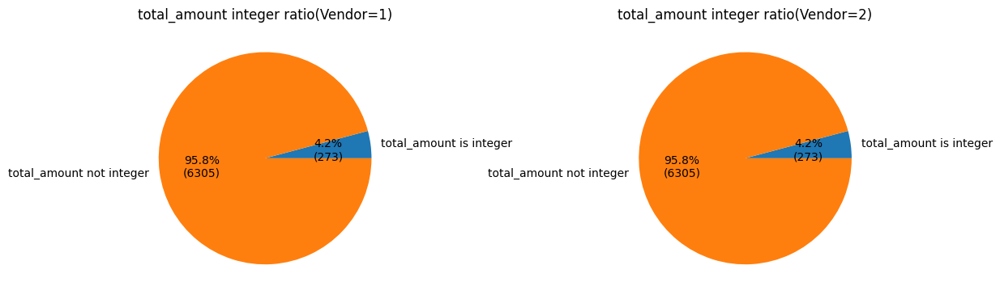

In [53]:
fig,axs=plt.subplots(1,2,figsize=(12,5))

################################################################################
#VendorID=1
#Confirm how many total_amount were integers
################################################################################
#tip_percent is an integer(e.g. 20.0, 15.0)
mask=(df_credit['VendorID']==1)

total_amount_isInt=np.sum(df_credit[mask]['total_amount'].apply(float.is_integer))
total_amount_notInt=np.sum(~df_credit[mask]['total_amount'].apply(float.is_integer))
result={
    'total_amount is integer': total_amount_isInt,
    'total_amount not integer': total_amount_notInt,
}

axs[0].pie(result.values(),labels = result.keys(), autopct=autopct_format(result.values()))
axs[0].set_title("total_amount integer ratio(Vendor=1)")


################################################################################
#VendorID=1
#Confirm how many total_amount were integers
################################################################################
#tip_percent is not an integer(e.g. 20.0, 15.0)
mask=(df_credit['VendorID']==2)

tip_amount_isInt=np.sum(df_credit[mask]['total_amount'].apply(float.is_integer))
tip_amount_notInt=np.sum(~df_credit[mask]['total_amount'].apply(float.is_integer))
result={
    'total_amount is integer': total_amount_isInt,
    'total_amount not integer': total_amount_notInt,
}

axs[1].pie(result.values(),labels = result.keys(), autopct=autopct_format(result.values()))
axs[1].set_title("total_amount integer ratio(Vendor=2)")

plt.tight_layout()
plt.show()

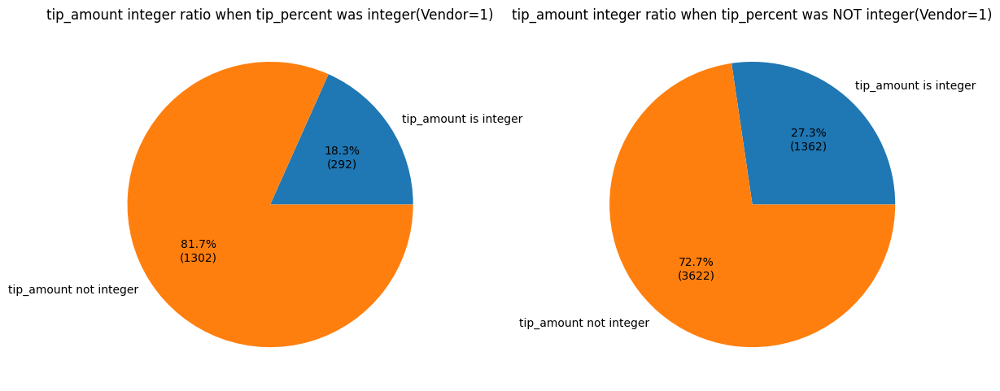

In [54]:
fig,axs=plt.subplots(1,2,figsize=(12,5))


################################################################################
#VendorID=1
#Confirm how many tip_amount were integers when tip_percent was integer
################################################################################
#tip_percent is an integer(e.g. 20.0, 15.0)
mask=(df_credit['VendorID']==1)&(df_credit['tip_percent'].apply(float.is_integer))

tip_amount_isInt=np.sum(df_credit[mask]['tip_amount'].apply(float.is_integer))
tip_amount_notInt=np.sum(~df_credit[mask]['tip_amount'].apply(float.is_integer))
result={
    'tip_amount is integer': tip_amount_isInt,
    'tip_amount not integer': tip_amount_notInt,
}

axs[0].pie(result.values(),labels = result.keys(), autopct=autopct_format(result.values()))
axs[0].set_title("tip_amount integer ratio when tip_percent was integer(Vendor=1)")


################################################################################
#VendorID=1
#Confirm how many tip_amount were integers when tip_percent was not integer
################################################################################
#tip_percent is not an integer(e.g. 20.0, 15.0)
mask=(df_credit['VendorID']==1)&(~df_credit['tip_percent'].apply(float.is_integer))

tip_amount_isInt=np.sum(df_credit[mask]['tip_amount'].apply(float.is_integer))
tip_amount_notInt=np.sum(~df_credit[mask]['tip_amount'].apply(float.is_integer))
result={
    'tip_amount is integer': tip_amount_isInt,
    'tip_amount not integer': tip_amount_notInt,
}

axs[1].pie(result.values(),labels = result.keys(), autopct=autopct_format(result.values()))
axs[1].set_title("tip_amount integer ratio when tip_percent was NOT integer(Vendor=1)")

plt.tight_layout()
plt.show()

In [55]:


tip_rate=0.15
total_fare=20.3
min=round((total_fare)*tip_rate,3)
max=round((total_fare)*tip_rate,3)
#4.05
#4.08

print(min)
print(max)
print(round_nearest2(min,0.05))
print(round_nearest2(max,0.05))
print(round_to_0_05(min))
print(round_to_0_05(max))
print(rounddown_to_0_05(min))
print(rounddown_to_0_05(max))

3.045
3.045
3.05
3.05
3.05
3.05
3.0
3.0


In [56]:
#mask=(df_credit['VendorID']==1)&(df_credit['total_fare_diff']==0.06)
#mask=(df_credit['VendorID']==1)&(df_credit['total_fare_diff']==0.1)&(df_credit['tolls_amount']==0)
#mask=(df_credit['VendorID']==1)&(df_credit['total_fare_diff']==0.1)&(df_credit['tip_diff']==0.005)
#mask=(df_credit['VendorID']==1)&(df_credit['total_fare_diff']==0.05)&(df_credit['tip_diff']==0.01)&(df_credit['tip_percent']==19.7)
mask=(df_credit['VendorID']==1)&(df_credit['tip_diff']==0.03)
display(df_credit[mask]['tip_percent'].value_counts())
display(df_credit[mask]['tolls_amount'].value_counts())
display(df_credit[mask]['tip_diff'].value_counts())
display(df_credit[mask]['total_fare'].describe())
#display(df_credit[mask]['tolls_amount'].value_counts())
df_credit[mask][['trip_distance','duration','total_amount','fare_amount','tip_amount','extra','mta_tax','tolls_amount','improvement_surcharge','total_fare','cal_tip','tip_diff','total_fare_diff','tip_percent','tip_percent_int','tip_percent_notax']].head()

tip_percent
9.7    30
9.8    12
9.9    10
9.6     5
Name: count, dtype: int64

tolls_amount
0.0    57
Name: count, dtype: int64

tip_diff
0.03    57
Name: count, dtype: int64

count    57.000000
mean     13.738596
std       7.171415
min       7.300000
25%      10.300000
50%      10.300000
75%      15.300000
max      50.300000
Name: total_fare, dtype: float64

,trip_distance,duration,total_amount,fare_amount,tip_amount,extra,mta_tax,tolls_amount,improvement_surcharge,total_fare,cal_tip,tip_diff,total_fare_diff,tip_percent,tip_percent_int,tip_percent_notax
1261,1.9,9.033,11.3,9.0,1.0,0.5,0.5,0.0,0.3,10.3,1.03,0.03,0.3,9.7,10,10.2
1409,4.8,23.783,22.3,19.5,2.0,0.0,0.5,0.0,0.3,20.3,2.03,0.03,0.3,9.9,10,9.9
1470,1.8,12.250,11.3,9.5,1.0,0.0,0.5,0.0,0.3,10.3,1.03,0.03,0.3,9.7,10,9.7
1816,1.2,12.717,12.4,9.5,1.1,1.0,0.5,0.0,0.3,11.3,1.13,0.03,0.3,9.7,10,10.7
1999,1.7,11.200,11.3,9.0,1.0,0.5,0.5,0.0,0.3,10.3,1.03,0.03,0.3,9.7,10,10.2


In [57]:
df_credit['tip_diff'].describe()

count    14883.000000
mean         0.003088
std          0.029453
min         -0.298000
25%          0.000000
50%          0.000000
75%          0.010000
max          0.312000
Name: tip_diff, dtype: float64

In [58]:

#min=round((total_fare)*tip_rate,3)
#max=round((total_fare)*tip_rate,3)
#4.05
#4.08

#print(min)
#print(max)
#print(round(max,2))
#print(round_nearest(min,0.01))
#print(round_nearest(max,0.01))
#print(round_nearest2(min,0.01))
#print(round_nearest2(max,0.01))
#print(round_to_0_05(min))
#print(round_to_0_05(max))
#print(rounddown_to_0_05(min))
#print(rounddown_to_0_05(max))
#print(rounddown_to_0_01(min))
#print(rounddown_to_0_01(max))
#print(roundup_to_0_01(min))
#print(roundup_to_0_01(max))
tip_rate=0.3
total_fare=13.3
tip_cal=round((total_fare)*tip_rate,5)
pd.DataFrame({
    'tip_cal': [tip_cal],
    'tip round 0.01': [round(tip_cal,2)],
    'tip round_nearest 0.01': [round_nearest(tip_cal,0.01)],
    'tip round_nearest2 0.01': [round_nearest2(tip_cal,0.01)],
    'tip rounddown to 0.01': [rounddown_to_0_01(tip_cal)],
    'tip roundup to 0.01': [roundup_to_0_01(tip_cal)],
    'tip round 0.05': [round_to_0_05(tip_cal)],
    'tip rounddown to 0.05': [rounddown_to_0_05(tip_cal)],
})

,tip_cal,tip round 0.01,tip round_nearest 0.01,tip round_nearest2 0.01,tip rounddown to 0.01,tip roundup to 0.01,tip round 0.05,tip rounddown to 0.05
0,3.99,3.99,3.99,3.99,3.99,3.99,4.0,3.95


In [59]:
mask=(df_credit['VendorID']==1)&(df_credit['tip_diff']==0.04)
display(df_credit[mask]['tip_percent'].value_counts())
display(df_credit[mask]['tolls_amount'].value_counts())
display(df_credit[mask]['tip_diff'].value_counts())
display(df_credit[mask]['total_fare'].describe())
#display(df_credit[mask]['tolls_amount'].value_counts())
df_credit[mask][['RatecodeID','trip_distance','duration','total_amount','fare_amount','tip_amount','extra','mta_tax','tolls_amount','improvement_surcharge','total_fare','cal_tip','tip_diff','total_fare_diff','tip_percent','tip_percent_int','tip_percent_notax']].head(5)

tip_percent
29.7    53
29.6    50
29.8    38
29.5    20
24.9    15
29.9    14
4.8      2
24.8     2
Name: count, dtype: int64

tolls_amount
0.00    178
5.76     16
Name: count, dtype: int64

tip_diff
0.04    194
Name: count, dtype: int64

count    194.000000
mean      17.666804
std       11.806102
min        8.300000
25%       10.300000
50%       13.300000
75%       19.300000
max       58.560000
Name: total_fare, dtype: float64

,RatecodeID,trip_distance,duration,total_amount,fare_amount,tip_amount,extra,mta_tax,tolls_amount,improvement_surcharge,total_fare,cal_tip,tip_diff,total_fare_diff,tip_percent,tip_percent_int,tip_percent_notax
87,1,4.9,11.417,23.10,16.0,5.30,1.0,0.5,0.0,0.3,17.8,5.34,0.04,0.133,29.8,30,31.5
153,1,1.5,17.983,17.25,12.5,3.95,0.0,0.5,0.0,0.3,13.3,3.99,0.04,0.133,29.7,30,29.7
318,1,2.5,14.517,17.25,12.5,3.95,0.0,0.5,0.0,0.3,13.3,3.99,0.04,0.133,29.7,30,29.7
413,1,2.2,28.550,24.40,17.0,5.60,1.0,0.5,0.0,0.3,18.8,5.64,0.04,0.133,29.8,30,31.5
415,1,6.1,40.667,37.40,28.0,8.60,0.0,0.5,0.0,0.3,28.8,8.64,0.04,0.133,29.9,30,29.9


In [60]:
#Assumption:
#The tip_amount calculation of Vendor1 was round down the calculated value to the nearest 0.05
#The tip_amount calculation of Vendor2 was round the calculated value to the nearest 0.01

df_credit['cal_tip_round_to_0_01']=round(df_credit['total_fare']*df_credit['tip_percent_int']*0.01,3).apply(round_to_0_01)
df_credit['cal_tip_rounddown_to_0_05']=round(df_credit['total_fare']*df_credit['tip_percent_int']*0.01,3).apply(rounddown_to_0_05)
df_credit.head()

,ID,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,PU_hour,DO_hour,PU_day,DO_day,PU_month,DO_month,PU_weekday,DO_weekday,PU_year,PU_weeknum,PU_year_weeknum,PU_nextMonday,PU_date_hour,Borough_PU,Zone_PU,service_zone_PU,Borough_DO,Zone_DO,service_zone_DO,Date,NYC_All_Grades_All_Formulations_Retail_Gasoline_Prices,Year,time,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),apparent_temperature (°C),precipitation (mm),rain (mm),snowfall (cm),snow_depth (m),pressure_msl (hPa),surface_pressure (hPa),cloud_cover (%),cloud_cover_low (%),cloud_cover_mid (%),cloud_cover_high (%),wind_speed_10m (km/h),wind_speed_100m (km/h),wind_direction_10m (°),wind_direction_100m (°),wind_gusts_10m (km/h),PU_DO_Borough,JFK,Newark,OutsideNYC,nighttime,rushhour,duration,duration_sec,avg_speed,fare_per_minute,fare_per_mile,holiday,PU_date,fare_amount_log,am_rush,daytime,pm_rush,PU_hour_class,rush_hour,PU_season,Unnamed: 0,gpb_unit1,gpb_unit2,gpb_unit3,gpb_unit4,gpb_unit5,mean_distance_unit1,mean_distance_unit2,mean_distance_unit3,mean_distance_unit4,mean_distance_unit5,mean_duration_unit1,mean_duration_unit2,mean_duration_unit3,mean_duration_unit4,mean_duration_unit5,mean_speed_unit1,mean_speed_unit2,mean_speed_unit3,mean_speed_unit4,mean_speed_unit5,predict_fare_amount,mean_trip_duration,mean_trip_distance,mean_trip_speed,tip_percent,tip_percent_int,total_fare,cal_tip,tip_diff,total_fare_diff,tip_percent_notax,within_nyc,cal_tip_round_to_0_01,cal_tip_rounddown_to_0_05
0,24870114,2,2017-03-25 08:55:43,2017-03-25 09:09:47,6,3.34,1,N,100,231,1,13.0,0.0,0.5,2.76,0.0,0.3,16.56,8,9,25,25,3,3,Saturday,Saturday,2017,12,2017-12,2017-03-27,2017-03-25-8,Manhattan,Garment District,Yellow Zone,Manhattan,TriBeCa/Civic Center,Yellow Zone,2017-03-27,2.476,2017,2017-03-25 08:00:00,10.6,73,6.0,8.5,0.0,0.0,0.0,0.04,1021.3,1015.1,100,0,79,100,7.4,13.8,309,298,13.3,Manhattan_Manhattan,False,False,False,0,False,14.067,844.0,14.246445,0.924171,3.892216,True,2017-03-25,2.564949,1,0,0,am_rush,0,spring,0,100_231,100_231_8,100_231_Saturday_8,100_231_am_rush,100_231_1_am_rush,3.521667,3.34,3.34,3.340000,3.340,22.847333,14.067000,14.067,14.067000,14.0670,10.679596,14.246445,14.246445,14.246445,14.246445,13.010263,14.067000,3.340000,14.246445,20.0,20,13.8,2.760,0.000,0.000,20.0,True,2.76,2.75
1,35634249,1,2017-04-11 14:53:28,2017-04-11 15:19:58,1,1.80,1,N,186,43,1,16.0,0.0,0.5,4.00,0.0,0.3,20.80,14,15,11,11,4,4,Tuesday,Tuesday,2017,15,2017-15,2017-04-17,2017-04-11-14,Manhattan,Penn Station/Madison Sq West,Yellow Zone,Manhattan,Central Park,Yellow Zone,2017-04-17,2.585,2017,2017-04-11 14:00:00,22.3,59,13.8,22.3,0.0,0.0,0.0,0.00,1018.9,1012.9,96,0,0,96,16.8,21.6,149,154,33.1,Manhattan_Manhattan,False,False,False,0,False,26.500,1590.0,4.075472,0.603774,8.888889,False,2017-04-11,2.772589,0,1,0,daytime,0,spring,1,186_43,186_43_14,186_43_Tuesday_14,186_43_daytime,186_43_0_daytime,3.108889,2.65,1.80,3.095000,1.800,24.470333,22.700000,26.500,23.283250,26.5000,8.310050,7.593291,4.075472,8.296162,4.075472,16.265126,23.283250,3.095000,8.296162,23.8,24,16.8,4.032,0.032,0.133,23.8,True,4.03,4.00
2,106203690,1,2017-12-15 07:26:56,2017-12-15 07:34:08,1,1.00,1,N,262,236,1,6.5,0.0,0.5,1.45,0.0,0.3,8.75,7,7,15,15,12,12,Friday,Friday,2017,50,2017-50,2017-12-18,2017-12-15-7,Manhattan,Yorkville East,Yellow Zone,Manhattan,Upper East Side North,Yellow Zone,2017-12-18,2.660,2017,2017-12-15 07:00:00,-5.7,51,-14.3,-9.6,0.0,0.0,0.0,0.05,1020.1,1013.5,87,0,75,86,2.9,4.3,263,265,6.8,Manhattan_Manhattan,False,False,False,0,False,7.200,432.0,8.333333,0.902778,6.500000,False,2017-12-15,1.871802,1,0,0,am_rush,1,winter,2,262_236,262_236_7,262_236_Friday_7,262_236_am_rush,262_236_0_am_rush,0.881429,0.80,1.00,0.875714,0.966,7.250029,5.150000,7.200,6.407286,7.3102,7.721198,9.973118,8.333333,8.848934,8.450543,6.116305,6.4

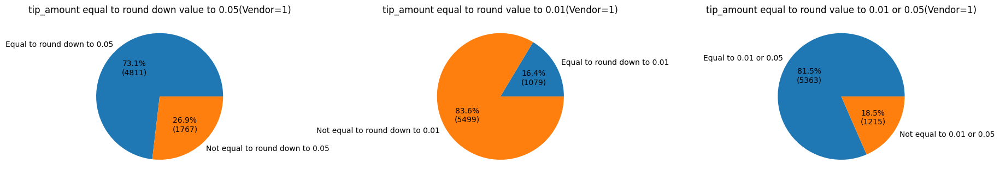

In [61]:
########################################################################
#VendorID=1
########################################################################
fig,axs=plt.subplots(1,3,figsize=(18,6))

mask=(df_credit['VendorID']==1)

#********************************#
#Check how many equal to rounddown_to_0_05
#********************************#
mask_equal_rounddown_to_0_05=(df_credit['tip_amount']==df_credit['cal_tip_rounddown_to_0_05'])
equal_rounddown_to_0_05=df_credit[mask&mask_equal_rounddown_to_0_05].shape[0]
Notequal_rounddown_to_0_05=df_credit[mask&~mask_equal_rounddown_to_0_05].shape[0]
result1={
    'Equal to round down to 0.05': equal_rounddown_to_0_05,
    'Not equal to round down to 0.05': Notequal_rounddown_to_0_05
}

axs[0].pie(result1.values(),labels = result1.keys(), autopct=autopct_format(result1.values()))
axs[0].set_title("tip_amount equal to round down value to 0.05(Vendor=1)")

#********************************#
#Check how many equal to round_to_0_01
#********************************#
mask_equal_round_to_0_01=(df_credit['tip_amount']==df_credit['cal_tip_round_to_0_01'])
equal_round_to_0_01=df_credit[mask&mask_equal_round_to_0_01].shape[0]
Notequal_round_to_0_01=df_credit[mask&~mask_equal_round_to_0_01].shape[0]
result2={
    'Equal to round down to 0.01': equal_round_to_0_01,
    'Not equal to round down to 0.01': Notequal_round_to_0_01
}

axs[1].pie(result2.values(),labels = result2.keys(), autopct=autopct_format(result2.values()))
axs[1].set_title("tip_amount equal to round value to 0.01(Vendor=1)")

#********************************#
#Check how many equal to round_to_0_01 or rounddown_to_0_05
#********************************#
mask_equal_001_005=(df_credit['VendorID']==1)&((df_credit['tip_amount']==df_credit['cal_tip_round_to_0_01'])|(df_credit['tip_amount']==df_credit['cal_tip_rounddown_to_0_05']))
mask_Notequal_001_005=(df_credit['VendorID']==1)&(df_credit['tip_amount']!=df_credit['cal_tip_round_to_0_01'])&(df_credit['tip_amount']!=df_credit['cal_tip_rounddown_to_0_05'])
Notequal_001_005=df_credit[mask_Notequal_001_005].shape[0]
equal_001_005=df_credit[mask_equal_001_005].shape[0]
result3={
    'Equal to 0.01 or 0.05': equal_001_005,
    'Not equal to 0.01 or 0.05': Notequal_001_005
}

axs[2].pie(result3.values(),labels = result3.keys(), autopct=autopct_format(result3.values()))
axs[2].set_title("tip_amount equal to round value to 0.01 or 0.05(Vendor=1)")

plt.tight_layout()
plt.show()

#=>we can observe that most trips(73.3%) in vendor 1, tip_amount were equal to the results that round down calculation results to the nearest 0.05
#we can assume systems provided by vendor 1 would round down tip amount.(which means even passengers chose 20% the tip_percent calculated from this dataset would be smaller than their actual choice)

#=>we can observe that 26.7% didn't equal to our assumption. they might due to the system differences(maybe some taxis used different version of products)
#or they might due to passenger input a flat tip(e.g. $1, $2, $3, $5.5...).

1767 trips


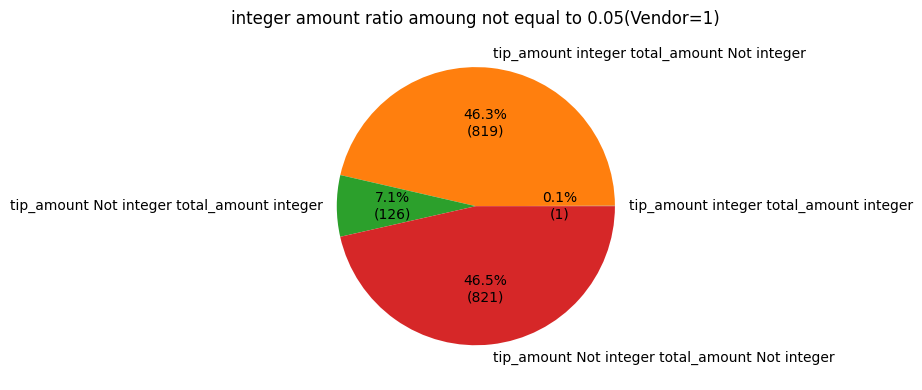

In [62]:
#https://www.sciencedirect.com/science/article/abs/pii/S0167487022000484#:~:text=In%20the%20beginning%20of%202011,)%20to%20their%20competitor%2C%20Verifone.
#'In the beginning of 2011, CMT rolled out a new default tipping prompt. The new CMT prompt suggested tip amounts of 20, 25 and 30 percent, whereas the previous suggestions were 15, 20, and 25 percent.'
#it seems the suggested tip rate used to be 15%, 20%, 25%, around 2011 it increased to 20%, 25%, 30%

plt.figure(figsize=(9,4))
########################################################################
#VendorID=1
#confirm how many trips had integer tip_amount or total amount amoung 'Not equal to round down to 0.05'
########################################################################
mask_equal_rounddown_to_0_05=(df_credit['tip_amount']==df_credit['cal_tip_rounddown_to_0_05'])
mask_condition=(df_credit['VendorID']==1)&(~mask_equal_rounddown_to_0_05)

mask_tip_amount_integer=df_credit['tip_amount'].apply(float.is_integer)
mask_total_amount_integer=df_credit['total_amount'].apply(float.is_integer)


tip_isInt_totalisInt=np.sum(mask_condition&mask_tip_amount_integer&mask_total_amount_integer)
tip_isInt_totalNotInt=np.sum(mask_condition&mask_tip_amount_integer&~mask_total_amount_integer)
tip_NotInt_totalisInt=np.sum(mask_condition&~mask_tip_amount_integer&mask_total_amount_integer)
tip_NotInt_totalNotInt=np.sum(mask_condition&~mask_tip_amount_integer&~mask_total_amount_integer)

result={
    'tip_amount integer total_amount integer': tip_isInt_totalisInt,
    'tip_amount integer total_amount Not integer': tip_isInt_totalNotInt,
    'tip_amount Not integer total_amount integer': tip_NotInt_totalisInt,
    'tip_amount Not integer total_amount Not integer': tip_NotInt_totalNotInt,
}

plt.pie(result.values(),labels = result.keys(), autopct=autopct_format(result.values()))
plt.title("integer amount ratio amoung not equal to 0.05(Vendor=1)")

print(tip_isInt_totalisInt+tip_isInt_totalNotInt+tip_NotInt_totalisInt+tip_NotInt_totalNotInt,'trips')
plt.tight_layout()
plt.show()


In [63]:
mask_equal_rounddown_to_0_05=(df_credit['tip_amount']==df_credit['cal_tip_rounddown_to_0_05'])
mask_equal_round_to_0_01=(df_credit['tip_amount']==df_credit['cal_tip_round_to_0_01'])
mask_condition=(df_credit['VendorID']==1)&(~mask_equal_rounddown_to_0_05)

mask_tip_amount_integer=df_credit['tip_amount'].apply(float.is_integer)
mask_total_amount_integer=df_credit['total_amount'].apply(float.is_integer)

mask=mask_condition&~mask_tip_amount_integer&~mask_total_amount_integer&mask_equal_round_to_0_01
df_credit[mask]

,ID,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,PU_hour,DO_hour,PU_day,DO_day,PU_month,DO_month,PU_weekday,DO_weekday,PU_year,PU_weeknum,PU_year_weeknum,PU_nextMonday,PU_date_hour,Borough_PU,Zone_PU,service_zone_PU,Borough_DO,Zone_DO,service_zone_DO,Date,NYC_All_Grades_All_Formulations_Retail_Gasoline_Prices,Year,time,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),apparent_temperature (°C),precipitation (mm),rain (mm),snowfall (cm),snow_depth (m),pressure_msl (hPa),surface_pressure (hPa),cloud_cover (%),cloud_cover_low (%),cloud_cover_mid (%),cloud_cover_high (%),wind_speed_10m (km/h),wind_speed_100m (km/h),wind_direction_10m (°),wind_direction_100m (°),wind_gusts_10m (km/h),PU_DO_Borough,JFK,Newark,OutsideNYC,nighttime,rushhour,duration,duration_sec,avg_speed,fare_per_minute,fare_per_mile,holiday,PU_date,fare_amount_log,am_rush,daytime,pm_rush,PU_hour_class,rush_hour,PU_season,Unnamed: 0,gpb_unit1,gpb_unit2,gpb_unit3,gpb_unit4,gpb_unit5,mean_distance_unit1,mean_distance_unit2,mean_distance_unit3,mean_distance_unit4,mean_distance_unit5,mean_duration_unit1,mean_duration_unit2,mean_duration_unit3,mean_duration_unit4,mean_duration_unit5,mean_speed_unit1,mean_speed_unit2,mean_speed_unit3,mean_speed_unit4,mean_speed_unit5,predict_fare_amount,mean_trip_duration,mean_trip_distance,mean_trip_speed,tip_percent,tip_percent_int,total_fare,cal_tip,tip_diff,total_fare_diff,tip_percent_notax,within_nyc,cal_tip_round_to_0_01,cal_tip_rounddown_to_0_05
30,67540161,1,2017-08-09 21:01:50,2017-08-09 21:14:28,1,2.3,1,N,163,234,1,10.5,0.5,0.5,1.77,0.0,0.3,13.57,21,21,9,9,8,8,Wednesday,Wednesday,2017,32,2017-32,2017-08-14,2017-08-09-21,Manhattan,Midtown North,Yellow Zone,Manhattan,Union Sq,Yellow Zone,2017-08-14,2.573,2017,2017-08-09 21:00:00,21.5,78,17.4,23.0,0.0,0.0,0.0,0.00,1023.7,1017.7,9,5,9,0,7.4,19.2,203,220,14.0,Manhattan_Manhattan,False,False,False,1,False,12.633,758.0,10.923483,0.831135,4.565217,False,2017-08-09,2.351375,0,0,0,nighttime,0,summer,30,163_234,163_234_21,163_234_Wednesday_21,163_234_nighttime,163_234_0_nighttime,2.127778,2.250000,2.33,2.140000,2.174000,14.282389,14.329000,14.433,11.502286,10.950000,10.180239,9.953717,9.823138,12.349688,12.640067,10.107708,11.502286,2.140000,12.349688,15.0,15,11.8,1.770,0.000,0.000,15.7,True,1.77,1.75
38,10421657,1,2017-02-12 18:45:41,2017-02-12 18:48:58,4,0.4,1,N,142,143,1,4.0,0.0,0.5,0.72,0.0,0.3,5.52,18,18,12,12,2,2,Sunday,Sunday,2017,6,2017-6,2017-02-13,2017-02-12-18,Manhattan,Lincoln Square East,Yellow Zone,Manhattan,Lincoln Square West,Yellow Zone,2017-02-13,2.537,2017,2017-02-12 18:00:00,2.2,93,1.3,-0.8,0.6,0.6,0.0,0.16,1003.2,996.9,100,100,100,0,7.3,11.2,349,45,13.7,Manhattan_Manhattan,False,False,False,0,False,3.283,197.0,7.309645,1.218274,10.000000,True,2017-02-12,1.386294,0,0,1,pm_rush,0,winter,38,142_143,142_143_18,142_143_Sunday_18,142_143_pm_rush,142_143_1_pm_rush,0.841538,0.550000,0.40,0.726667,0.590000,6.178154,4.408000,3.283,5.444333,3.416500,8.377597,7.450003,7.309645,8.330879,10.246372,5.608905,5.444333,0.726667,8.330879,15.0,15,4.8,0.720,0.000,0.000,15.0,True,0.72,0.70
123,108611319,1,2017-12-22 11:49:37,2017-12-22 12:21:07,1,4.2,1,N,262,186,1,22.0,0.0,0.5,4.56,0.0,0.3,27.36,11,12,22,22,12,12,Friday,Friday,2017,51,2017-51,2017-12-25,2017-12-22-11,Manhattan,Yorkville East,Yellow Zone,Manhattan,Penn Station/Madison Sq West,Yellow Zone,2017-12-25,2.633,2017,2017-12-22 11:00:00,3.8,67,-1.7,0.6,0.0,0.0,0.0,0.01,1024.1,1017.7,100,3,98,97,5.9,2.3,11,51,18.7,Manhattan_Manhattan,False,False,False,0,False,31.500,1890.0,8.000000,0.698413,5.238095,False,2017-12-22,3.091042,0,1,0,daytime,0,winter,123,262_186,262_186_11,262_186_Friday_11,262_186_daytime,262_186_0_daytime,4.068333,4.000000,4.20,4.146000,3.960000,21.194500,29.316500,31.500,23.093400,28.033500,13.355110,8.201474,8.000000

1215 trips


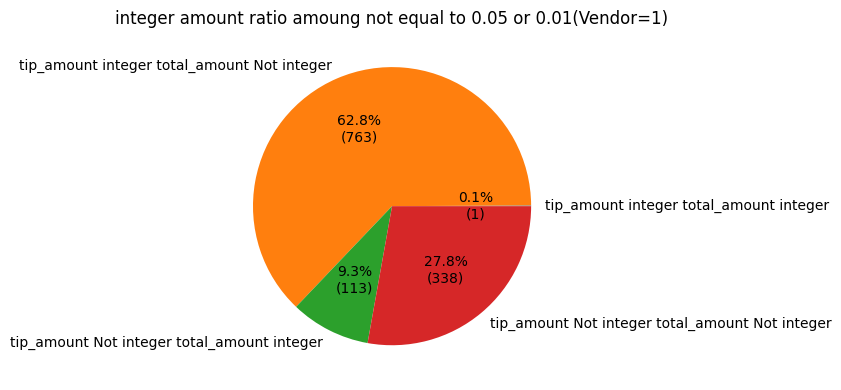

In [64]:
plt.figure(figsize=(9,4))
########################################################################
#VendorID=1
#confirm how many trips had integer tip_amount or total amount amoung 'Not equal to 0.01 or 0.05'
########################################################################

mask_condition=(df_credit['VendorID']==1)&(df_credit['tip_amount']!=df_credit['cal_tip_round_to_0_01'])&(df_credit['tip_amount']!=df_credit['cal_tip_rounddown_to_0_05'])


mask_tip_amount_integer=df_credit['tip_amount'].apply(float.is_integer)
mask_total_amount_integer=df_credit['total_amount'].apply(float.is_integer)


tip_isInt_totalisInt=np.sum(mask_condition&mask_tip_amount_integer&mask_total_amount_integer)
tip_isInt_totalNotInt=np.sum(mask_condition&mask_tip_amount_integer&~mask_total_amount_integer)
tip_NotInt_totalisInt=np.sum(mask_condition&~mask_tip_amount_integer&mask_total_amount_integer)
tip_NotInt_totalNotInt=np.sum(mask_condition&~mask_tip_amount_integer&~mask_total_amount_integer)

result={
    'tip_amount integer total_amount integer': tip_isInt_totalisInt,
    'tip_amount integer total_amount Not integer': tip_isInt_totalNotInt,
    'tip_amount Not integer total_amount integer': tip_NotInt_totalisInt,
    'tip_amount Not integer total_amount Not integer': tip_NotInt_totalNotInt,
}

plt.pie(result.values(),labels = result.keys(), autopct=autopct_format(result.values()))
plt.title("integer amount ratio amoung not equal to 0.05 or 0.01(Vendor=1)")

print(tip_isInt_totalisInt+tip_isInt_totalNotInt+tip_NotInt_totalisInt+tip_NotInt_totalNotInt,'trips')
plt.tight_layout()
plt.show()

In [65]:
mask_condition=(df_credit['VendorID']==1)&(df_credit['tip_amount']!=df_credit['cal_tip_round_to_0_01'])&(df_credit['tip_amount']!=df_credit['cal_tip_rounddown_to_0_05'])
mask_tip_amount_integer=df_credit['tip_amount'].apply(float.is_integer)
mask_total_amount_integer=df_credit['total_amount'].apply(float.is_integer)
mask=mask_condition&~mask_tip_amount_integer&~mask_total_amount_integer
df_credit[mask][['trip_distance','duration','total_amount','fare_amount','tip_amount','extra','mta_tax','tolls_amount','improvement_surcharge','total_fare','cal_tip','tip_diff','total_fare_diff','tip_percent','tip_percent_int','tip_percent_notax','cal_tip_round_to_0_01','cal_tip_rounddown_to_0_05']]

,trip_distance,duration,total_amount,fare_amount,tip_amount,extra,mta_tax,tolls_amount,improvement_surcharge,total_fare,cal_tip,tip_diff,total_fare_diff,tip_percent,tip_percent_int,tip_percent_notax,cal_tip_round_to_0_01,cal_tip_rounddown_to_0_05
75,4.3,21.217,21.02,17.5,2.22,0.5,0.5,0.0,0.3,18.8,2.256,0.036,0.300,11.8,12,12.1,2.26,2.25
192,0.8,5.417,10.10,6.0,2.30,1.0,0.5,0.0,0.3,7.8,2.262,-0.038,-0.131,29.5,29,33.8,2.26,2.25
233,2.3,9.667,14.10,10.0,2.30,1.0,0.5,0.0,0.3,11.8,2.242,-0.058,-0.305,19.5,19,21.3,2.24,2.20
271,0.6,1.900,6.20,4.0,1.40,0.0,0.5,0.0,0.3,4.8,1.392,-0.008,-0.028,29.2,29,29.2,1.39,1.35
372,2.5,16.400,15.10,12.5,1.80,0.0,0.5,0.0,0.3,13.3,1.862,0.062,0.443,13.5,14,13.5,1.86,1.85
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,2.2,13.650,14.15,11.0,1.85,0.5,0.5,0.0,0.3,12.3,1.845,-0.005,-0.033,15.0,15,15.7,1.84,1.80
21672,1.4,5.767,10.10,6.5,2.80,0.0,0.5,0.0,0.3,7.3,2.774,-0.026,-0.068,38.4,38,38.4,2.77,2.75
21687,6.6,19.367,23.80,21.5,1.50,0.0,0.5,0.0,0.3,22.3,1.561,0.061,0.871,6.7,7,6.7,1.56,1.55
21736,0.8,4.017,6.35,5.0,0.55,0.0,0.5,0.0,0.3,5.8,0.522,-0.028,-0.311,9.5,9,9.5,0.52,0.50


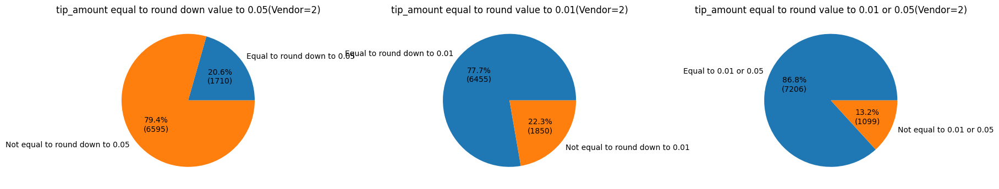

In [66]:
########################################################################
#VendorID=2
########################################################################
fig,axs=plt.subplots(1,3,figsize=(18,6))

mask=(df_credit['VendorID']==2)

#********************************#
#Check how many equal to rounddown_to_0_05
#********************************#
mask_equal_rounddown_to_0_05=(df_credit['tip_amount']==df_credit['cal_tip_rounddown_to_0_05'])
equal_rounddown_to_0_05=df_credit[mask&mask_equal_rounddown_to_0_05].shape[0]
Notequal_rounddown_to_0_05=df_credit[mask&~mask_equal_rounddown_to_0_05].shape[0]
result1={
    'Equal to round down to 0.05': equal_rounddown_to_0_05,
    'Not equal to round down to 0.05': Notequal_rounddown_to_0_05
}

axs[0].pie(result1.values(),labels = result1.keys(), autopct=autopct_format(result1.values()))
axs[0].set_title("tip_amount equal to round down value to 0.05(Vendor=2)")

#********************************#
#Check how many equal to round_to_0_01
#********************************#
mask_equal_round_to_0_01=(df_credit['tip_amount']==df_credit['cal_tip_round_to_0_01'])
equal_round_to_0_01=df_credit[mask&mask_equal_round_to_0_01].shape[0]
Notequal_round_to_0_01=df_credit[mask&~mask_equal_round_to_0_01].shape[0]
result2={
    'Equal to round down to 0.01': equal_round_to_0_01,
    'Not equal to round down to 0.01': Notequal_round_to_0_01
}

axs[1].pie(result2.values(),labels = result2.keys(), autopct=autopct_format(result2.values()))
axs[1].set_title("tip_amount equal to round value to 0.01(Vendor=2)")

#********************************#
#Check how many equal to round_to_0_01 or rounddown_to_0_05
#********************************#
mask_equal_001_005=(df_credit['VendorID']==2)&((df_credit['tip_amount']==df_credit['cal_tip_round_to_0_01'])|(df_credit['tip_amount']==df_credit['cal_tip_rounddown_to_0_05']))
mask_Notequal_001_005=(df_credit['VendorID']==2)&(df_credit['tip_amount']!=df_credit['cal_tip_round_to_0_01'])&(df_credit['tip_amount']!=df_credit['cal_tip_rounddown_to_0_05'])
Notequal_001_005=df_credit[mask_Notequal_001_005].shape[0]
equal_001_005=df_credit[mask_equal_001_005].shape[0]
result3={
    'Equal to 0.01 or 0.05': equal_001_005,
    'Not equal to 0.01 or 0.05': Notequal_001_005
}

axs[2].pie(result3.values(),labels = result3.keys(), autopct=autopct_format(result3.values()))
axs[2].set_title("tip_amount equal to round value to 0.01 or 0.05(Vendor=2)")


plt.tight_layout()
plt.show()

1850 trips


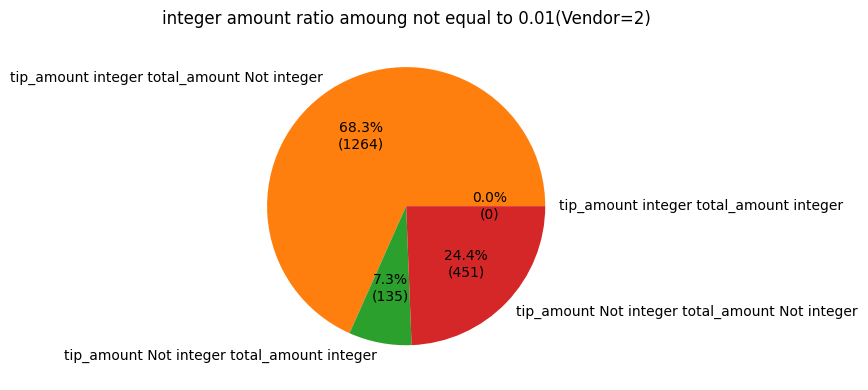

In [67]:
plt.figure(figsize=(9,4))
########################################################################
#VendorID=1
#confirm how many trips had integer tip_amount or total amount amoung 'Not equal to round to 0.01'
########################################################################
mask_equal_round_to_0_01=(df_credit['tip_amount']==df_credit['cal_tip_round_to_0_01'])
mask_condition=(df_credit['VendorID']==2)&(~mask_equal_round_to_0_01)

mask_tip_amount_integer=df_credit['tip_amount'].apply(float.is_integer)
mask_total_amount_integer=df_credit['total_amount'].apply(float.is_integer)


tip_isInt_totalisInt=np.sum(mask_condition&mask_tip_amount_integer&mask_total_amount_integer)
tip_isInt_totalNotInt=np.sum(mask_condition&mask_tip_amount_integer&~mask_total_amount_integer)
tip_NotInt_totalisInt=np.sum(mask_condition&~mask_tip_amount_integer&mask_total_amount_integer)
tip_NotInt_totalNotInt=np.sum(mask_condition&~mask_tip_amount_integer&~mask_total_amount_integer)

result={
    'tip_amount integer total_amount integer': tip_isInt_totalisInt,
    'tip_amount integer total_amount Not integer': tip_isInt_totalNotInt,
    'tip_amount Not integer total_amount integer': tip_NotInt_totalisInt,
    'tip_amount Not integer total_amount Not integer': tip_NotInt_totalNotInt,
}

plt.pie(result.values(),labels = result.keys(), autopct=autopct_format(result.values()))
plt.title("integer amount ratio amoung not equal to 0.01(Vendor=2)")

print(tip_isInt_totalisInt+tip_isInt_totalNotInt+tip_NotInt_totalisInt+tip_NotInt_totalNotInt,'trips')
plt.tight_layout()
plt.show()

1099 trips


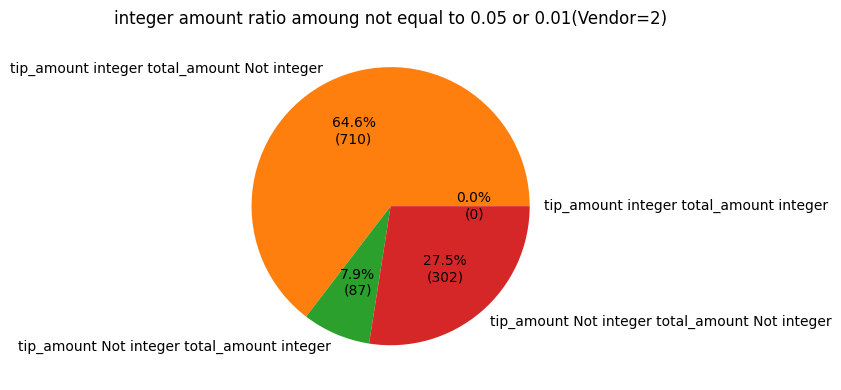

In [68]:
plt.figure(figsize=(9,4))
########################################################################
#VendorID=2
#confirm how many trips had integer tip_amount or total amount amoung 'Not equal to 0.01 or 0.05'
########################################################################

mask_condition=(df_credit['VendorID']==2)&(df_credit['tip_amount']!=df_credit['cal_tip_round_to_0_01'])&(df_credit['tip_amount']!=df_credit['cal_tip_rounddown_to_0_05'])


mask_tip_amount_integer=df_credit['tip_amount'].apply(float.is_integer)
mask_total_amount_integer=df_credit['total_amount'].apply(float.is_integer)


tip_isInt_totalisInt=np.sum(mask_condition&mask_tip_amount_integer&mask_total_amount_integer)
tip_isInt_totalNotInt=np.sum(mask_condition&mask_tip_amount_integer&~mask_total_amount_integer)
tip_NotInt_totalisInt=np.sum(mask_condition&~mask_tip_amount_integer&mask_total_amount_integer)
tip_NotInt_totalNotInt=np.sum(mask_condition&~mask_tip_amount_integer&~mask_total_amount_integer)

result={
    'tip_amount integer total_amount integer': tip_isInt_totalisInt,
    'tip_amount integer total_amount Not integer': tip_isInt_totalNotInt,
    'tip_amount Not integer total_amount integer': tip_NotInt_totalisInt,
    'tip_amount Not integer total_amount Not integer': tip_NotInt_totalNotInt,
}

plt.pie(result.values(),labels = result.keys(), autopct=autopct_format(result.values()))
plt.title("integer amount ratio amoung not equal to 0.05 or 0.01(Vendor=2)")

print(tip_isInt_totalisInt+tip_isInt_totalNotInt+tip_NotInt_totalisInt+tip_NotInt_totalNotInt,'trips')
plt.tight_layout()
plt.show()

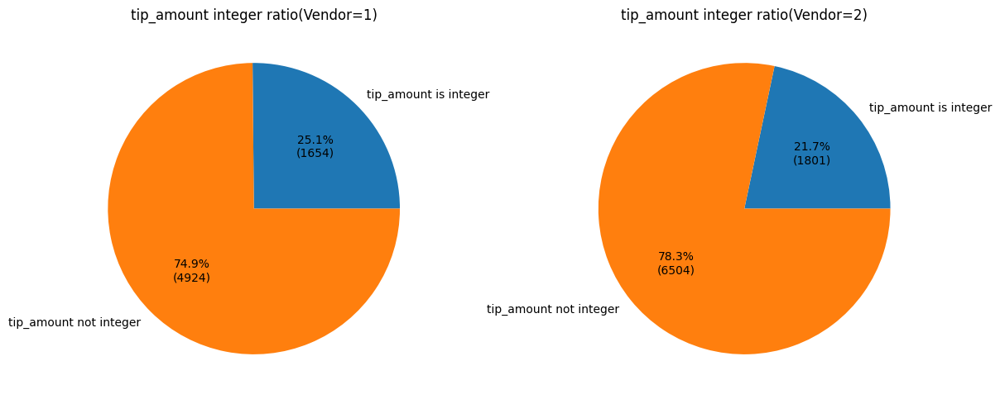

In [69]:
fig,axs=plt.subplots(1,2,figsize=(12,5))

################################################################################
#VendorID=1
#Confirm how many tip_amount were integers
################################################################################
#tip_percent is an integer(e.g. 20.0, 15.0)
mask=(df_credit['VendorID']==1)

tip_amount_isInt=np.sum(df_credit[mask]['tip_amount'].apply(float.is_integer))
tip_amount_notInt=np.sum(~df_credit[mask]['tip_amount'].apply(float.is_integer))
result={
    'tip_amount is integer': tip_amount_isInt,
    'tip_amount not integer': tip_amount_notInt,
}

axs[0].pie(result.values(),labels = result.keys(), autopct=autopct_format(result.values()))
axs[0].set_title("tip_amount integer ratio(Vendor=1)")


################################################################################
#VendorID=1
#Confirm how many tip_amount were integers
################################################################################
#tip_percent is not an integer(e.g. 20.0, 15.0)
mask=(df_credit['VendorID']==2)

tip_amount_isInt=np.sum(df_credit[mask]['tip_amount'].apply(float.is_integer))
tip_amount_notInt=np.sum(~df_credit[mask]['tip_amount'].apply(float.is_integer))
result={
    'tip_amount is integer': tip_amount_isInt,
    'tip_amount not integer': tip_amount_notInt,
}

axs[1].pie(result.values(),labels = result.keys(), autopct=autopct_format(result.values()))
axs[1].set_title("tip_amount integer ratio(Vendor=2)")

plt.tight_layout()
plt.show()

In [70]:
mask=(df_credit['VendorID']==2)
df_credit[mask].groupby(['tip_percent_int'])[['VendorID']].count().sort_values(['VendorID'],ascending=False).head(20)

,VendorID
tip_percent_int,
20,4220
25,1025
0,443
30,397
15,314
10,271
11,172
14,158
12,147


In [71]:
#In general(and also according to web search), when passenger tip they will act as bellow
#1. choose the default(suggested option) tip rate(20%,25%,30%)
#2. if they feel the service doesn't deserve a tip they will choose no tip
#3. some will calculate the tip by themselves since many places calculate tips after tax(Not before tax)
#5. some will pay an integer flat tip (e.g. $1, $2, $3...)
#6. some will pay a non-integer flat tip to round total_amount(make it an integer) 

#https://www.furnishedquarters.com/blog/nyc-tipping-guide
#'If you’re paying with a card, the touchscreen pad will allow you to choose a percentage and then calculate the taxi tip for you.'
#it seems only card could choose a percentage.

mask_vendor=(df_credit['VendorID']==2)

print('VendorID 2 count:',df_credit[mask_vendor]['tip_percent'].count())
mask=(df_credit['VendorID']==2)&(df_credit['tip_percent'].apply(float.is_integer))
print('Integer tip_percent',df_credit[mask]['tip_percent'].count())

mask=(df_credit['VendorID']==2)&(df_credit['tip_amount'].apply(float.is_integer))
print('Integer tip_amount',df_credit[mask]['tip_amount'].count())

mask=(df_credit['VendorID']==2)&((df_credit['tip_amount'].apply(float.is_integer))|(df_credit['tip_percent'].apply(float.is_integer)))
print('Integer tip_amount or tip_percent',df_credit[mask]['tip_amount'].count())


mask_vendor=(df_credit['VendorID']==1)
print('VendorID 1 count:',df_credit[mask_vendor]['tip_percent'].count())
mask=(df_credit['VendorID']==1)&(df_credit['tip_percent'].apply(float.is_integer))
print('Integer tip_percent',df_credit[mask]['tip_percent'].count())

mask=(df_credit['VendorID']==1)&(df_credit['tip_amount'].apply(float.is_integer))
print('Integer tip_amount',df_credit[mask]['tip_amount'].count())

mask=(df_credit['VendorID']==1)&((df_credit['tip_amount'].apply(float.is_integer))|(df_credit['tip_percent'].apply(float.is_integer)))
print('Integer tip_amount or tip_percent',df_credit[mask]['tip_amount'].count())

VendorID 2 count: 8305
Integer tip_percent 6270
Integer tip_amount 1801
Integer tip_amount or tip_percent 7504
VendorID 1 count: 6578
Integer tip_percent 1594
Integer tip_amount 1654
Integer tip_amount or tip_percent 2956


In [72]:
#about VendorID=2( VeriFone Inc), it seems has two types of tip
#refer:https://techcrunch.com/2013/10/20/amex-partners-with-verifone-to-allow-nyc-taxi-passengers-to-pay-for-cab-fares-with-rewards-points/
#refer:https://www.nytimes.com/2012/01/09/nyregion/new-nyc-livery-cabs-wont-have-to-have-tvs.html
#by rate(20%,25%,30%) and a flat fee(e.g. $1, $3)
#for tip_amount which have two decimals, it seems they were calculated by a rate(the tip rate was an integer)
##=>they might need to round tip_amount to two decimals, so some calculated tip_percent were XX.9 and XX.1
#for tip_amount which was an integer, it seems they were a flat fare(tip amount was an integer)
#for tip_amount which have one decimal, not sure whether passengers could input decimal(maybe the unit of the input screen is cents, Not dollar)

#tip_amount was calculated from rounded fares

mask=(df_credit['VendorID']==2)
df_credit[mask].groupby(['tip_percent'])[['VendorID']].count().sort_values(['VendorID'],ascending=False).head(20)

,VendorID
tip_percent,
20.0,4182
25.0,810
0.0,439
30.0,396
15.0,137
24.9,113
10.0,109
25.1,100
14.7,65


In [73]:
##### 
mask_vendor=(df_credit['VendorID']==2)
#
mask=(df_credit['VendorID']==2)&(~df_credit['tip_percent'].apply(float.is_integer))&(~df_credit['tip_amount'].apply(float.is_integer))&(~(df_credit['tip_percent']-0.1).apply(float.is_integer))&(~(df_credit['tip_percent']-0.9).apply(float.is_integer))&(~(df_credit['tip_amount']*10).apply(float.is_integer))
df_credit[mask]

,ID,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,PU_hour,DO_hour,PU_day,DO_day,PU_month,DO_month,PU_weekday,DO_weekday,PU_year,PU_weeknum,PU_year_weeknum,PU_nextMonday,PU_date_hour,Borough_PU,Zone_PU,service_zone_PU,Borough_DO,Zone_DO,service_zone_DO,Date,NYC_All_Grades_All_Formulations_Retail_Gasoline_Prices,Year,time,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),apparent_temperature (°C),precipitation (mm),rain (mm),snowfall (cm),snow_depth (m),pressure_msl (hPa),surface_pressure (hPa),cloud_cover (%),cloud_cover_low (%),cloud_cover_mid (%),cloud_cover_high (%),wind_speed_10m (km/h),wind_speed_100m (km/h),wind_direction_10m (°),wind_direction_100m (°),wind_gusts_10m (km/h),PU_DO_Borough,JFK,Newark,OutsideNYC,nighttime,rushhour,duration,duration_sec,avg_speed,fare_per_minute,fare_per_mile,holiday,PU_date,fare_amount_log,am_rush,daytime,pm_rush,PU_hour_class,rush_hour,PU_season,Unnamed: 0,gpb_unit1,gpb_unit2,gpb_unit3,gpb_unit4,gpb_unit5,mean_distance_unit1,mean_distance_unit2,mean_distance_unit3,mean_distance_unit4,mean_distance_unit5,mean_duration_unit1,mean_duration_unit2,mean_duration_unit3,mean_duration_unit4,mean_duration_unit5,mean_speed_unit1,mean_speed_unit2,mean_speed_unit3,mean_speed_unit4,mean_speed_unit5,predict_fare_amount,mean_trip_duration,mean_trip_distance,mean_trip_speed,tip_percent,tip_percent_int,total_fare,cal_tip,tip_diff,total_fare_diff,tip_percent_notax,within_nyc,cal_tip_round_to_0_01,cal_tip_rounddown_to_0_05
524,50639993,2,2017-06-15 13:40:01,2017-06-15 13:52:23,1,0.92,1,N,163,100,1,9.0,0.0,0.5,1.25,0.0,0.3,11.05,13,13,15,15,6,6,Thursday,Thursday,2017,24,2017-24,2017-06-19,2017-06-15-13,Manhattan,Midtown North,Yellow Zone,Manhattan,Garment District,Yellow Zone,2017-06-19,2.527,2017,2017-06-15 13:00:00,22.0,50,11.2,20.7,0.0,0.0,0.0,0.00,1017.4,1011.4,40,15,8,29,22.2,28.0,151,151,41.8,Manhattan_Manhattan,False,False,False,0,False,12.367,742.0,4.463612,0.727763,9.782609,False,2017-06-15,2.197225,0,1,0,daytime,0,summer,524,163_100,163_100_13,163_100_Thursday_13,163_100_daytime,163_100_0_daytime,1.181905,0.920000,0.92,1.135556,1.186250,10.540429,12.367000,12.367,11.172222,12.045875,7.518368,4.463612,4.463612,6.894242,6.447257,8.548499,11.172222,1.135556,6.894242,12.8,13,9.8,1.274,0.024,0.185,12.8,True,1.27,1.25
539,17687398,2,2017-03-03 16:29:04,2017-03-03 16:46:00,3,2.34,1,N,162,113,1,12.5,1.0,0.5,5.95,0.0,0.3,20.25,16,16,3,3,3,3,Friday,Friday,2017,9,2017-9,2017-03-06,2017-03-03-16,Manhattan,Midtown East,Yellow Zone,Manhattan,Greenwich Village North,Yellow Zone,2017-03-06,2.492,2017,2017-03-03 16:00:00,3.1,22,-16.4,-4.0,0.0,0.0,0.0,0.00,1022.5,1016.1,74,0,74,3,23.5,31.5,291,292,46.8,Manhattan_Manhattan,False,False,False,0,True,16.933,1016.0,8.291339,0.738189,5.341880,False,2017-03-03,2.525729,0,0,1,pm_rush,1,spring,539,162_113,162_113_16,162_113_Friday_16,162_113_pm_rush,162_113_0_pm_rush,2.150000,2.340000,2.34,2.295000,2.295000,13.945625,16.933000,16.933,16.616500,16.616500,11.105508,8.291339,8.291339,8.286774,8.286774,12.298067,16.616500,2.295000,8.286774,41.6,42,14.3,6.006,0.056,0.133,44.7,True,6.01,6.00
1236,54578792,2,2017-06-26 20:12:05,2017-06-26 20:22:49,1,1.35,1,N,144,249,1,8.5,0.5,0.5,1.11,0.0,0.3,10.91,20,20,26,26,6,6,Monday,Monday,2017,26,2017-26,2017-07-03,2017-06-26-20,Manhattan,Little Italy/NoLiTa,Yellow Zone,Manhattan,West Village,Yellow Zone,2017-07-03,2.485,2017,2017-06-26 20:00:00,20.1,63,12.9,19.9,0.0,0.0,0.0,0.00,1015.1,1009.1,1,0,1,0,7.4,18.8,241,244,13.3,Manhattan_Manhattan,False,False,False,1,False,10.733,644.0,7.546584,0.791925,6.296296,False,2017-06-26,2.140066,0,0,0,nighttime,0,summer,1236,144_249,144_249_20,144_249_Monday_20,144_249_nighttime,144_249_0_nighttime,1.320000,1.255000,1.35,1.378889,1.354286,10.104467,8.116500,10.733,8.627778,8.671429,8.875169,10.100565,7.54658

In [74]:
mask=(df_credit['VendorID']==1)
df_credit[mask].groupby(['tip_percent'])[['VendorID']].count().sort_values(['VendorID'],ascending=False).head(20)

#=>many passengers might choose 20% but it had different calculation logic so the result was less than 20%

,VendorID
tip_percent,
19.9,2169
20.0,696
25.0,347
19.8,335
0.0,157
15.0,128
24.8,106
24.7,104
10.0,71


In [75]:
#about VendorID=1(Creative Mobile Technologies, LLC;), it seems has two types of tip
#https://www.forbes.com/sites/shaharziv/2022/05/31/these-3-factors-could-get-you-to-tip-more/
#by rate(20%,25%,30%) and a flat fee(e.g. $1, $3)
#for tip_amount which have one or two decimals, it seems they were calculated by a rate(the tip rate was an integer)
##=>they might need to round tip_amount and fare_amount to two decimals, tip_amount seems used the fare_amount which was not rounded
#for tip_amount which was an integer, it seems they were a flat fare(tip amount was an integer)

mask_vendor=(df_credit['VendorID']==1)
#mask=(df_credit['VendorID']==1)&(~df_credit['tip_percent'].apply(float.is_integer))&(~df_credit['tip_amount'].apply(float.is_integer))&(~(df_credit['tip_percent']-0.1).apply(float.is_integer))&(~(df_credit['tip_percent']-0.9).apply(float.is_integer))&(~(df_credit['tip_amount']*10).apply(float.is_integer))
mask=(df_credit['VendorID']==1)&(~df_credit['tip_percent'].apply(float.is_integer))&(~df_credit['tip_amount'].apply(float.is_integer))
df_credit[mask]

,ID,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,PU_hour,DO_hour,PU_day,DO_day,PU_month,DO_month,PU_weekday,DO_weekday,PU_year,PU_weeknum,PU_year_weeknum,PU_nextMonday,PU_date_hour,Borough_PU,Zone_PU,service_zone_PU,Borough_DO,Zone_DO,service_zone_DO,Date,NYC_All_Grades_All_Formulations_Retail_Gasoline_Prices,Year,time,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),apparent_temperature (°C),precipitation (mm),rain (mm),snowfall (cm),snow_depth (m),pressure_msl (hPa),surface_pressure (hPa),cloud_cover (%),cloud_cover_low (%),cloud_cover_mid (%),cloud_cover_high (%),wind_speed_10m (km/h),wind_speed_100m (km/h),wind_direction_10m (°),wind_direction_100m (°),wind_gusts_10m (km/h),PU_DO_Borough,JFK,Newark,OutsideNYC,nighttime,rushhour,duration,duration_sec,avg_speed,fare_per_minute,fare_per_mile,holiday,PU_date,fare_amount_log,am_rush,daytime,pm_rush,PU_hour_class,rush_hour,PU_season,Unnamed: 0,gpb_unit1,gpb_unit2,gpb_unit3,gpb_unit4,gpb_unit5,mean_distance_unit1,mean_distance_unit2,mean_distance_unit3,mean_distance_unit4,mean_distance_unit5,mean_duration_unit1,mean_duration_unit2,mean_duration_unit3,mean_duration_unit4,mean_duration_unit5,mean_speed_unit1,mean_speed_unit2,mean_speed_unit3,mean_speed_unit4,mean_speed_unit5,predict_fare_amount,mean_trip_duration,mean_trip_distance,mean_trip_speed,tip_percent,tip_percent_int,total_fare,cal_tip,tip_diff,total_fare_diff,tip_percent_notax,within_nyc,cal_tip_round_to_0_01,cal_tip_rounddown_to_0_05
2,106203690,1,2017-12-15 07:26:56,2017-12-15 07:34:08,1,1.0,1,N,262,236,1,6.5,0.0,0.5,1.45,0.0,0.3,8.75,7,7,15,15,12,12,Friday,Friday,2017,50,2017-50,2017-12-18,2017-12-15-7,Manhattan,Yorkville East,Yellow Zone,Manhattan,Upper East Side North,Yellow Zone,2017-12-18,2.660,2017,2017-12-15 07:00:00,-5.7,51,-14.3,-9.6,0.0,0.0,0.0,0.05,1020.1,1013.5,87,0,75,86,2.9,4.3,263,265,6.8,Manhattan_Manhattan,False,False,False,0,False,7.200,432.0,8.333333,0.902778,6.500000,False,2017-12-15,1.871802,1,0,0,am_rush,1,winter,2,262_236,262_236_7,262_236_Friday_7,262_236_am_rush,262_236_0_am_rush,0.881429,0.800000,1.0,0.875714,0.966000,7.250029,5.150000,7.200,6.407286,7.310200,7.721198,9.973118,8.333333,8.848934,8.450543,6.116305,6.407286,0.875714,8.848934,19.9,20,7.3,1.460,0.010,0.050,19.9,True,1.46,1.45
9,95294817,1,2017-11-10 15:20:29,2017-11-10 15:40:55,1,1.6,1,N,239,237,1,13.0,0.0,0.5,2.75,0.0,0.3,16.55,15,15,10,10,11,11,Friday,Friday,2017,45,2017-45,2017-11-13,2017-11-10-15,Manhattan,Upper West Side South,Yellow Zone,Manhattan,Upper East Side South,Yellow Zone,2017-11-13,2.740,2017,2017-11-10 15:00:00,0.3,35,-13.4,-7.6,0.0,0.0,0.0,0.00,1025.9,1019.4,0,0,0,0,30.7,41.5,329,329,55.4,Manhattan_Manhattan,False,False,False,0,False,20.433,1226.0,4.698206,0.636215,8.125000,True,2017-11-10,2.564949,0,1,0,daytime,0,autumn,9,239_237,239_237_15,239_237_Friday_15,239_237_daytime,239_237_1_daytime,1.580000,1.543333,1.6,1.490000,1.550000,10.541133,14.244333,16.700,11.564286,14.850000,9.750435,7.098221,6.050902,8.281417,7.205218,9.214085,11.564286,1.490000,8.281417,19.9,20,13.8,2.760,0.010,0.050,19.9,True,2.76,2.75
12,46782248,1,2017-06-09 19:00:26,2017-06-09 19:20:11,1,3.0,1,N,13,148,1,15.0,1.0,0.5,3.35,0.0,0.3,20.15,19,19,9,9,6,6,Friday,Friday,2017,23,2017-23,2017-06-12,2017-06-09-19,Manhattan,Battery Park City,Yellow Zone,Manhattan,Lower East Side,Yellow Zone,2017-06-12,2.558,2017,2017-06-09 19:00:00,21.5,57,12.7,20.9,0.0,0.0,0.0,0.00,1008.8,1002.9,2,0,15,0,9.8,24.3,246,255,18.7,Manhattan_Manhattan,False,False,False,0,True,19.750,1185.0,9.113924,0.759494,5.000000,False,2017-06-09,2.708050,0,0,1,pm_rush,1,summer,12,13_148,13_148_19,13_148_Friday_19,13_148_pm_rush,13_148_0_pm_rush,3.307500,3.000000,3.0,3.910000,3.910000,15.058250,19.750000,19.750,18.125000,18.125000,13.667017,9.113924,9.113924,13.320598,13.320598,15.4685

In [76]:
mask_vendor=(df_credit['VendorID']==1)
#mask=(df_credit['VendorID']==1)&(df_credit['tip_amount'].apply(float.is_integer))
mask=(df_credit['VendorID']==1)&(df_credit['tip_amount'].apply(float.is_integer))
df_credit[mask]

,ID,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,PU_hour,DO_hour,PU_day,DO_day,PU_month,DO_month,PU_weekday,DO_weekday,PU_year,PU_weeknum,PU_year_weeknum,PU_nextMonday,PU_date_hour,Borough_PU,Zone_PU,service_zone_PU,Borough_DO,Zone_DO,service_zone_DO,Date,NYC_All_Grades_All_Formulations_Retail_Gasoline_Prices,Year,time,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),apparent_temperature (°C),precipitation (mm),rain (mm),snowfall (cm),snow_depth (m),pressure_msl (hPa),surface_pressure (hPa),cloud_cover (%),cloud_cover_low (%),cloud_cover_mid (%),cloud_cover_high (%),wind_speed_10m (km/h),wind_speed_100m (km/h),wind_direction_10m (°),wind_direction_100m (°),wind_gusts_10m (km/h),PU_DO_Borough,JFK,Newark,OutsideNYC,nighttime,rushhour,duration,duration_sec,avg_speed,fare_per_minute,fare_per_mile,holiday,PU_date,fare_amount_log,am_rush,daytime,pm_rush,PU_hour_class,rush_hour,PU_season,Unnamed: 0,gpb_unit1,gpb_unit2,gpb_unit3,gpb_unit4,gpb_unit5,mean_distance_unit1,mean_distance_unit2,mean_distance_unit3,mean_distance_unit4,mean_distance_unit5,mean_duration_unit1,mean_duration_unit2,mean_duration_unit3,mean_duration_unit4,mean_duration_unit5,mean_speed_unit1,mean_speed_unit2,mean_speed_unit3,mean_speed_unit4,mean_speed_unit5,predict_fare_amount,mean_trip_duration,mean_trip_distance,mean_trip_speed,tip_percent,tip_percent_int,total_fare,cal_tip,tip_diff,total_fare_diff,tip_percent_notax,within_nyc,cal_tip_round_to_0_01,cal_tip_rounddown_to_0_05
1,35634249,1,2017-04-11 14:53:28,2017-04-11 15:19:58,1,1.8,1,N,186,43,1,16.0,0.0,0.5,4.0,0.0,0.3,20.8,14,15,11,11,4,4,Tuesday,Tuesday,2017,15,2017-15,2017-04-17,2017-04-11-14,Manhattan,Penn Station/Madison Sq West,Yellow Zone,Manhattan,Central Park,Yellow Zone,2017-04-17,2.585,2017,2017-04-11 14:00:00,22.3,59,13.8,22.3,0.0,0.0,0.0,0.00,1018.9,1012.9,96,0,0,96,16.8,21.6,149,154,33.1,Manhattan_Manhattan,False,False,False,0,False,26.500,1590.0,4.075472,0.603774,8.888889,False,2017-04-11,2.772589,0,1,0,daytime,0,spring,1,186_43,186_43_14,186_43_Tuesday_14,186_43_daytime,186_43_0_daytime,3.108889,2.650000,1.8,3.0950,1.8000,24.470333,22.7000,26.500,23.28325,26.50000,8.310050,7.593291,4.075472,8.296162,4.075472,16.265126,23.28325,3.0950,8.296162,23.8,24,16.8,4.032,0.032,0.133,23.8,True,4.03,4.00
67,105476838,1,2017-12-13 07:06:10,2017-12-13 07:11:40,1,0.8,1,N,142,230,1,5.5,0.0,0.5,1.0,0.0,0.3,7.3,7,7,13,13,12,12,Wednesday,Wednesday,2017,50,2017-50,2017-12-18,2017-12-13-7,Manhattan,Lincoln Square East,Yellow Zone,Manhattan,Times Sq/Theatre District,Yellow Zone,2017-12-18,2.660,2017,2017-12-13 07:00:00,-6.1,46,-16.0,-13.8,0.0,0.0,0.0,0.04,1000.5,994.0,0,0,0,0,27.4,39.2,275,277,48.6,Manhattan_Manhattan,False,False,False,0,False,5.500,330.0,8.727273,1.000000,6.875000,False,2017-12-13,1.704748,1,0,0,am_rush,1,winter,67,142_230,142_230_7,142_230_Wednesday_7,142_230_am_rush,142_230_0_am_rush,1.051212,0.800000,0.8,1.3575,1.3575,8.531818,5.5000,5.500,10.07075,10.07075,8.235308,8.727273,8.727273,8.259315,8.259315,8.457890,10.07075,1.3575,8.259315,15.9,16,6.3,1.008,0.008,0.050,15.9,True,1.01,1.00
83,64344057,1,2017-07-29 13:27:34,2017-07-29 13:36:28,1,1.6,1,N,249,186,1,8.0,0.0,0.5,1.0,0.0,0.3,9.8,13,13,29,29,7,7,Saturday,Saturday,2017,30,2017-30,2017-07-31,2017-07-29-13,Manhattan,West Village,Yellow Zone,Manhattan,Penn Station/Madison Sq West,Yellow Zone,2017-07-31,2.530,2017,2017-07-29 13:00:00,22.8,59,14.3,20.4,0.0,0.0,0.0,0.00,1009.1,1003.2,98,96,90,42,28.2,38.2,28,29,49.3,Manhattan_Manhattan,False,False,False,0,False,8.900,534.0,10.786517,0.898876,5.000000,True,2017-07-29,2.079442,0,1,0,daytime,0,summer,83,249_186,249_186_13,249_186_Saturday_13,249_186_daytime,249_186_1_daytime,1.321429,1.600000,1.6,1.2100,1.6000,9.417476,8.9000,8.900,10.63900,8.90000,9.418874,10.786517,10.786517,7.125925,10.786517,8.3528

In [77]:
print(df_credit['trip_distance'].shape[0])
print((df_credit['trip_distance']*10).apply(float.is_integer).sum())
mask=~(df_credit['trip_distance']*10).apply(float.is_integer)
df_credit[mask]['VendorID'].value_counts()

#=>for trip_distance, vendorID=2 had two decimals, vendorID=1 had one decimal


14883
7447


VendorID
2    7436
Name: count, dtype: int64

In [78]:
print(df_credit['fare_amount'].shape[0])
print((df_credit['fare_amount']*2).apply(float.is_integer).sum())
print((df_credit['fare_amount']*10).apply(float.is_integer).sum())
mask=~(df_credit['fare_amount']*2).apply(float.is_integer)
df_credit[mask]
#=>for fare_amount, most of trips had one decimal(the second decimal was 0), all of RatecodeID were 5
#except RatecodeID=5, others should be 0.5*N (N>=1) since unit charge is 0.5

14883
14879
14880


,ID,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,PU_hour,DO_hour,PU_day,DO_day,PU_month,DO_month,PU_weekday,DO_weekday,PU_year,PU_weeknum,PU_year_weeknum,PU_nextMonday,PU_date_hour,Borough_PU,Zone_PU,service_zone_PU,Borough_DO,Zone_DO,service_zone_DO,Date,NYC_All_Grades_All_Formulations_Retail_Gasoline_Prices,Year,time,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),apparent_temperature (°C),precipitation (mm),rain (mm),snowfall (cm),snow_depth (m),pressure_msl (hPa),surface_pressure (hPa),cloud_cover (%),cloud_cover_low (%),cloud_cover_mid (%),cloud_cover_high (%),wind_speed_10m (km/h),wind_speed_100m (km/h),wind_direction_10m (°),wind_direction_100m (°),wind_gusts_10m (km/h),PU_DO_Borough,JFK,Newark,OutsideNYC,nighttime,rushhour,duration,duration_sec,avg_speed,fare_per_minute,fare_per_mile,holiday,PU_date,fare_amount_log,am_rush,daytime,pm_rush,PU_hour_class,rush_hour,PU_season,Unnamed: 0,gpb_unit1,gpb_unit2,gpb_unit3,gpb_unit4,gpb_unit5,mean_distance_unit1,mean_distance_unit2,mean_distance_unit3,mean_distance_unit4,mean_distance_unit5,mean_duration_unit1,mean_duration_unit2,mean_duration_unit3,mean_duration_unit4,mean_duration_unit5,mean_speed_unit1,mean_speed_unit2,mean_speed_unit3,mean_speed_unit4,mean_speed_unit5,predict_fare_amount,mean_trip_duration,mean_trip_distance,mean_trip_speed,tip_percent,tip_percent_int,total_fare,cal_tip,tip_diff,total_fare_diff,tip_percent_notax,within_nyc,cal_tip_round_to_0_01,cal_tip_rounddown_to_0_05
21,85505540,2,2017-10-11 12:34:49,2017-10-11 13:22:38,1,12.30,5,N,138,265,1,68.25,0.0,0.0,12.00,16.26,0.3,96.81,12,13,11,11,10,10,Wednesday,Wednesday,2017,41,2017-41,2017-10-16,2017-10-11-12,Queens,LaGuardia Airport,Airports,Outside of NYC(N/A),Outside of NYC,Outside of NYC(N/A),2017-10-16,2.668,2017,2017-10-11 12:00:00,21.8,67,15.5,21.6,0.0,0.0,0.0,0.00,1019.4,1013.4,100,0,100,70,14.3,18.4,72,73,26.6,Queens_Outside of NYC(N/A),False,False,True,0,False,47.817,2869.0,15.433949,1.427327,5.548780,False,2017-10-11,4.223177,0,1,0,daytime,0,autumn,21,138_265,138_265_12,138_265_Wednesday_12,138_265_daytime,138_265_0_daytime,20.552,12.30,12.30,21.9925,21.9925,39.3768,47.817,47.817,42.3460,42.3460,32.640654,15.433949,15.433949,32.733544,32.733544,93.445390,42.3460,21.9925,32.733544,14.1,14,84.81,11.873,-0.127,-0.904,14.1,False,11.87,11.85
6391,50673026,1,2017-06-15 15:32:57,2017-06-15 16:37:23,2,16.90,5,N,70,265,1,93.75,0.0,0.0,5.00,0.00,0.3,99.05,15,16,15,15,6,6,Thursday,Thursday,2017,24,2017-24,2017-06-19,2017-06-15-15,Queens,East Elmhurst,Boro Zone,Outside of NYC(N/A),Outside of NYC,Outside of NYC(N/A),2017-06-19,2.527,2017,2017-06-15 15:00:00,21.0,52,10.9,18.9,0.0,0.0,0.0,0.00,1016.9,1010.9,25,11,8,14,22.1,28.2,150,150,41.8,Queens_Outside of NYC(N/A),False,False,True,0,True,64.433,3866.0,15.737196,1.454992,5.547337,False,2017-06-15,4.540632,0,1,0,daytime,0,summer,6391,70_265,70_265_15,70_265_Thursday_15,70_265_daytime,70_265_0_daytime,14.850,16.90,16.90,14.8500,14.8500,57.6915,64.433,64.433,57.6915,57.6915,15.405399,15.737196,15.737196,15.405399,15.405399,90.740625,57.6915,14.8500,15.405399,5.3,5,94.05,4.702,-0.298,-5.950,5.3,False,4.70,4.70
6530,10819636,1,2017-02-13 23:16:30,2017-02-13 23:37:03,1,5.90,5,N,161,265,1,54.70,0.0,0.0,3.00,0.00,0.3,58.00,23,23,13,13,2,2,Monday,Monday,2017,7,2017-7,2017-02-20,2017-02-13-23,Manhattan,Midtown Center,Yellow Zone,Outside of NYC(N/A),Outside of NYC,Outside of NYC(N/A),2017-02-20,2.527,2017,2017-02-13 23:00:00,-2.8,67,-8.0,-9.1,0.0,0.0,0.0,0.15,1015.9,1009.4,0,0,0,0,22.4,36.3,303,307,39.2,Manhattan_Outside of NYC(N/A),False,False,True,1,False,20.550,1233.0,17.226277,2.661800,9.271186,True,2017-02-13,4.001864,0,0,0,nighttime,0,winter,6530,161_265,161_265_23,161_265_Monday_23,161_265_nighttime,161_265_1_nighttime,10.950,5.90,5.90,5.9000,5.9000,26.7250,20.550,

In [79]:
print(df_credit['tolls_amount'].shape[0])
print((df_credit['tolls_amount']*100).apply(float.is_integer).sum())
mask=~(df_credit['tolls_amount']*100).apply(float.is_integer)
df_credit[mask]['tolls_amount']

14883
14879


21      16.26
4708    18.26
5082    19.10
5849    16.26
Name: tolls_amount, dtype: float64

In [80]:

print(df_credit['tip_amount'].shape[0])
print((df_credit['tip_amount']*100).apply(float.is_integer).sum())
mask=~(df_credit['tip_amount']*100).apply(float.is_integer)
df_credit[mask]['tip_amount'].value_counts()

14883
13468


tip_amount
2.45     168
2.05     156
2.26     155
1.16     146
2.20     131
        ... 
0.57       1
4.11       1
8.71       1
18.56      1
0.07       1
Name: count, Length: 76, dtype: int64

In [81]:
print(df_credit['improvement_surcharge'].shape[0])
print((df_credit['improvement_surcharge']*10).apply(float.is_integer).sum())
mask=~(df_credit['improvement_surcharge']*10).apply(float.is_integer)
df_credit[mask]['improvement_surcharge']

14883
14883


Series([], Name: improvement_surcharge, dtype: float64)

In [82]:
mask=(df_credit['VendorID']==1)
df_credit[mask]['tip_percent'].value_counts()

tip_percent
19.9    2169
20.0     696
25.0     347
19.8     335
0.0      157
        ... 
26.1       1
14.3       1
3.3        1
30.1       1
47.6       1
Name: count, Length: 311, dtype: int64

In [83]:
mask=(df_credit['VendorID']==1)&(df_credit['RatecodeID']==2)
df_credit[mask].head(10)

,ID,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,PU_hour,DO_hour,PU_day,DO_day,PU_month,DO_month,PU_weekday,DO_weekday,PU_year,PU_weeknum,PU_year_weeknum,PU_nextMonday,PU_date_hour,Borough_PU,Zone_PU,service_zone_PU,Borough_DO,Zone_DO,service_zone_DO,Date,NYC_All_Grades_All_Formulations_Retail_Gasoline_Prices,Year,time,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),apparent_temperature (°C),precipitation (mm),rain (mm),snowfall (cm),snow_depth (m),pressure_msl (hPa),surface_pressure (hPa),cloud_cover (%),cloud_cover_low (%),cloud_cover_mid (%),cloud_cover_high (%),wind_speed_10m (km/h),wind_speed_100m (km/h),wind_direction_10m (°),wind_direction_100m (°),wind_gusts_10m (km/h),PU_DO_Borough,JFK,Newark,OutsideNYC,nighttime,rushhour,duration,duration_sec,avg_speed,fare_per_minute,fare_per_mile,holiday,PU_date,fare_amount_log,am_rush,daytime,pm_rush,PU_hour_class,rush_hour,PU_season,Unnamed: 0,gpb_unit1,gpb_unit2,gpb_unit3,gpb_unit4,gpb_unit5,mean_distance_unit1,mean_distance_unit2,mean_distance_unit3,mean_distance_unit4,mean_distance_unit5,mean_duration_unit1,mean_duration_unit2,mean_duration_unit3,mean_duration_unit4,mean_duration_unit5,mean_speed_unit1,mean_speed_unit2,mean_speed_unit3,mean_speed_unit4,mean_speed_unit5,predict_fare_amount,mean_trip_duration,mean_trip_distance,mean_trip_speed,tip_percent,tip_percent_int,total_fare,cal_tip,tip_diff,total_fare_diff,tip_percent_notax,within_nyc,cal_tip_round_to_0_01,cal_tip_rounddown_to_0_05
109,47959795,1,2017-06-03 14:24:57,2017-06-03 15:31:48,1,18.0,2,N,132,163,1,52.0,0.0,0.5,0.00,0.00,0.3,52.80,14,15,3,3,6,6,Saturday,Saturday,2017,22,2017-22,2017-06-05,2017-06-03-14,Queens,JFK Airport,Airports,Manhattan,Midtown North,Yellow Zone,2017-06-05,2.566,2017,2017-06-03 14:00:00,20.3,41,6.7,16.8,0.3,0.3,0.0,0.00,1014.5,1008.5,48,0,48,0,24.0,32.1,317,318,42.1,Queens_Manhattan,True,False,False,0,False,66.850,4011.0,16.155572,0.777861,2.888889,True,2017-06-03,3.951244,0,1,0,daytime,0,summer,109,132_163,132_163_14,132_163_Saturday_14,132_163_daytime,132_163_1_daytime,19.229000,18.00,18.0,18.652500,18.000,52.941800,66.8500,66.850,70.266750,66.8500,24.135971,16.155572,16.155572,16.216792,16.155572,52.036450,70.266750,18.652500,16.216792,0.0,0,52.80,0.000,0.000,0.000,0.0,True,0.00,0.00
690,103094220,1,2017-12-06 05:19:50,2017-12-06 05:53:52,1,20.8,2,N,132,239,1,52.0,0.0,0.5,5.85,5.76,0.3,64.41,5,5,6,6,12,12,Wednesday,Wednesday,2017,49,2017-49,2017-12-11,2017-12-06-5,Queens,JFK Airport,Airports,Manhattan,Upper West Side South,Yellow Zone,2017-12-11,2.686,2017,2017-12-06 05:00:00,8.4,58,0.7,3.4,0.0,0.0,0.0,0.00,1012.8,1006.6,100,99,97,100,20.4,32.8,279,283,36.4,Queens_Manhattan,True,False,False,1,False,34.033,2042.0,36.669931,1.527914,2.500000,False,2017-12-06,3.951244,0,0,0,nighttime,0,winter,690,132_239,132_239_5,132_239_Wednesday_5,132_239_nighttime,132_239_0_nighttime,20.901429,20.65,20.8,20.918333,21.002,42.540429,33.2500,34.033,38.450000,39.6466,31.355683,37.277471,36.669931,33.481009,32.600209,52.071494,38.450000,20.918333,33.481009,10.0,10,58.56,5.856,0.006,0.060,10.0,True,5.86,5.85
831,106575186,1,2017-12-16 06:39:59,2017-12-16 07:07:59,2,17.8,2,N,75,132,1,52.0,0.0,0.5,6.00,5.76,0.3,64.56,6,7,16,16,12,12,Saturday,Saturday,2017,50,2017-50,2017-12-18,2017-12-16-6,Manhattan,East Harlem South,Boro Zone,Queens,JFK Airport,Airports,2017-12-18,2.660,2017,2017-12-16 06:00:00,-5.0,80,-7.8,-10.7,0.0,0.0,0.0,0.07,1016.1,1009.5,46,0,0,46,18.5,32.2,246,252,31.7,Manhattan_Queens,True,False,False,0,False,28.000,1680.0,38.142857,1.857143,2.921348,True,2017-12-16,3.951244,1,0,0,am_rush,0,winter,831,75_132,75_132_6,75_132_Saturday_6,75_132_am_rush,75_132_1_am_rush,18.442500,17.80,17.8,17.900000,17.900,36.204250,28.0000,28.000,26.966500,26.9665,32.693677,38.142857,38.142857,39.894051,39.894051,51.91361

In [84]:
df_credit['tip_percent'].describe()

count    14883.000000
mean        18.710475
std          7.793945
min          0.000000
25%         15.900000
50%         20.000000
75%         20.000000
max        224.100000
Name: tip_percent, dtype: float64

In [85]:
df_credit.head()

,ID,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,PU_hour,DO_hour,PU_day,DO_day,PU_month,DO_month,PU_weekday,DO_weekday,PU_year,PU_weeknum,PU_year_weeknum,PU_nextMonday,PU_date_hour,Borough_PU,Zone_PU,service_zone_PU,Borough_DO,Zone_DO,service_zone_DO,Date,NYC_All_Grades_All_Formulations_Retail_Gasoline_Prices,Year,time,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),apparent_temperature (°C),precipitation (mm),rain (mm),snowfall (cm),snow_depth (m),pressure_msl (hPa),surface_pressure (hPa),cloud_cover (%),cloud_cover_low (%),cloud_cover_mid (%),cloud_cover_high (%),wind_speed_10m (km/h),wind_speed_100m (km/h),wind_direction_10m (°),wind_direction_100m (°),wind_gusts_10m (km/h),PU_DO_Borough,JFK,Newark,OutsideNYC,nighttime,rushhour,duration,duration_sec,avg_speed,fare_per_minute,fare_per_mile,holiday,PU_date,fare_amount_log,am_rush,daytime,pm_rush,PU_hour_class,rush_hour,PU_season,Unnamed: 0,gpb_unit1,gpb_unit2,gpb_unit3,gpb_unit4,gpb_unit5,mean_distance_unit1,mean_distance_unit2,mean_distance_unit3,mean_distance_unit4,mean_distance_unit5,mean_duration_unit1,mean_duration_unit2,mean_duration_unit3,mean_duration_unit4,mean_duration_unit5,mean_speed_unit1,mean_speed_unit2,mean_speed_unit3,mean_speed_unit4,mean_speed_unit5,predict_fare_amount,mean_trip_duration,mean_trip_distance,mean_trip_speed,tip_percent,tip_percent_int,total_fare,cal_tip,tip_diff,total_fare_diff,tip_percent_notax,within_nyc,cal_tip_round_to_0_01,cal_tip_rounddown_to_0_05
0,24870114,2,2017-03-25 08:55:43,2017-03-25 09:09:47,6,3.34,1,N,100,231,1,13.0,0.0,0.5,2.76,0.0,0.3,16.56,8,9,25,25,3,3,Saturday,Saturday,2017,12,2017-12,2017-03-27,2017-03-25-8,Manhattan,Garment District,Yellow Zone,Manhattan,TriBeCa/Civic Center,Yellow Zone,2017-03-27,2.476,2017,2017-03-25 08:00:00,10.6,73,6.0,8.5,0.0,0.0,0.0,0.04,1021.3,1015.1,100,0,79,100,7.4,13.8,309,298,13.3,Manhattan_Manhattan,False,False,False,0,False,14.067,844.0,14.246445,0.924171,3.892216,True,2017-03-25,2.564949,1,0,0,am_rush,0,spring,0,100_231,100_231_8,100_231_Saturday_8,100_231_am_rush,100_231_1_am_rush,3.521667,3.34,3.34,3.340000,3.340,22.847333,14.067000,14.067,14.067000,14.0670,10.679596,14.246445,14.246445,14.246445,14.246445,13.010263,14.067000,3.340000,14.246445,20.0,20,13.8,2.760,0.000,0.000,20.0,True,2.76,2.75
1,35634249,1,2017-04-11 14:53:28,2017-04-11 15:19:58,1,1.80,1,N,186,43,1,16.0,0.0,0.5,4.00,0.0,0.3,20.80,14,15,11,11,4,4,Tuesday,Tuesday,2017,15,2017-15,2017-04-17,2017-04-11-14,Manhattan,Penn Station/Madison Sq West,Yellow Zone,Manhattan,Central Park,Yellow Zone,2017-04-17,2.585,2017,2017-04-11 14:00:00,22.3,59,13.8,22.3,0.0,0.0,0.0,0.00,1018.9,1012.9,96,0,0,96,16.8,21.6,149,154,33.1,Manhattan_Manhattan,False,False,False,0,False,26.500,1590.0,4.075472,0.603774,8.888889,False,2017-04-11,2.772589,0,1,0,daytime,0,spring,1,186_43,186_43_14,186_43_Tuesday_14,186_43_daytime,186_43_0_daytime,3.108889,2.65,1.80,3.095000,1.800,24.470333,22.700000,26.500,23.283250,26.5000,8.310050,7.593291,4.075472,8.296162,4.075472,16.265126,23.283250,3.095000,8.296162,23.8,24,16.8,4.032,0.032,0.133,23.8,True,4.03,4.00
2,106203690,1,2017-12-15 07:26:56,2017-12-15 07:34:08,1,1.00,1,N,262,236,1,6.5,0.0,0.5,1.45,0.0,0.3,8.75,7,7,15,15,12,12,Friday,Friday,2017,50,2017-50,2017-12-18,2017-12-15-7,Manhattan,Yorkville East,Yellow Zone,Manhattan,Upper East Side North,Yellow Zone,2017-12-18,2.660,2017,2017-12-15 07:00:00,-5.7,51,-14.3,-9.6,0.0,0.0,0.0,0.05,1020.1,1013.5,87,0,75,86,2.9,4.3,263,265,6.8,Manhattan_Manhattan,False,False,False,0,False,7.200,432.0,8.333333,0.902778,6.500000,False,2017-12-15,1.871802,1,0,0,am_rush,1,winter,2,262_236,262_236_7,262_236_Friday_7,262_236_am_rush,262_236_0_am_rush,0.881429,0.80,1.00,0.875714,0.966,7.250029,5.150000,7.200,6.407286,7.3102,7.721198,9.973118,8.333333,8.848934,8.450543,6.116305,6.4

In [86]:
tip_rate=0.3
total_fare=4.8
tip_cal=round((total_fare)*tip_rate,5)
pd.DataFrame({
    'tip_cal': [tip_cal],
    'tip round 0.01': [round(tip_cal,2)],
    'tip round_nearest 0.01': [round_nearest(tip_cal,0.01)],
    'tip round_nearest2 0.01': [round_nearest2(tip_cal,0.01)],
    'tip rounddown to 0.01': [rounddown_to_0_01(tip_cal)],
    'tip roundup to 0.01': [roundup_to_0_01(tip_cal)],
    'tip round 0.05': [round_to_0_05(tip_cal)],
    'tip rounddown to 0.05': [rounddown_to_0_05(tip_cal)],
})

,tip_cal,tip round 0.01,tip round_nearest 0.01,tip round_nearest2 0.01,tip rounddown to 0.01,tip roundup to 0.01,tip round 0.05,tip rounddown to 0.05
0,1.44,1.44,1.44,1.44,1.44,1.44,1.45,1.4


In [87]:
# Create 'generous' col (target)

def compute_generous(tip_percent):
    '''
        input: tip_percent
        return:
            1:customer tipped ≥ 20%
            0:customer tipped < 20%
    '''
    if tip_percent>=20:
        result=1
    else:
        result=0
    return result


###########################################################################
#Assume Vendor1 and Vendor2 only had two way to calculate tip_amount
#round tip_amount to .01 or round down to .05
#the maximum difference when round to 0.01 is 0.005, 
#the maximum difference when round down to 0.05 is nearly 0.05(close to 0.05 but not equal)
#the minimum fare of a trip is $2.8(2.5(initial charge)+0.3(Improvement Surcharge) assume ratecodeid=5 would not charge less than standard rate)
#(0.005*100/2.8)=0.17857% (if a passenger chose 20%, after round tip the tip_percent would be 20%+/- 0.18%)
#(0.05*100/2.8)=1.78571%  (if a passenger chose 20%, after round down tip the tip_percent would be 20%- 1.79%)
#if total_fare<=5, the diffenence of tip_percent will be more than 1%
#(which means when passengers choose 20% the calculation results would be 19% or less)
###########################################################################
def compute_potential_generous(tip_amount, total_fare):
    '''
        Vendor1 and Vendor2 had different tip calculation logic(some round to 0.01 some round down to 0.05 and might have others)
        some trips would show 'not generous' even passengers chose 20%
        This function will consider the logic difference(close but could not refect the actual tip percentage)
        This function only consider round to 0.01 and round down to 0.05
        input: 
            tip_amount(float)
            tip_percent(float)
            total_fare(float)
        return:
            1:customer tipped ≥ 20%
            0:customer tipped < 20%
    '''
    cal_tip_amount=total_fare*0.2
    tip_amount_001=round_to_0_01(cal_tip_amount)
    tip_amount_005=rounddown_to_0_05(cal_tip_amount)
    if (tip_amount >=tip_amount_001) | (tip_amount >=tip_amount_005):
        result=1
    else:
        result=0
    return result

def check_if_tolls(tolls_amount):
    if tolls_amount>0:
        return 'tolls'
    else:
        return 'no tolls'

def compute_season(month):
    """
    spring (March-May), summer (June-August), autumn (September-November) and winter (December-February
    Input:
        month(int)
    Output:
        season(string)
    """
    if month in [3,4,5]:
        season="spring"
    elif month in [6,7,8]:
        season="summer"
    elif month in [9,10,11]:
        season="autumn"
    elif month in [12,1,2]:
        season="winter"
    else:
        raise Exception("month should be 1-12")
    return season

df_credit['PU_season']=df_credit['PU_month'].apply(compute_season)

df_credit['Generous_by_tippercent']=df_credit['tip_percent'].apply(compute_generous)
df_credit['NGenerous_by_tippercent']=1-df_credit['Generous_by_tippercent']
df_credit['generous']=df_credit[['tip_amount','total_fare']].apply(lambda x: compute_potential_generous(x["tip_amount"],x["total_fare"]), axis=1)
df_credit['not_generous']=1-df_credit['generous']

df_credit[['total_amount','tip_amount','tip_percent','generous','not_generous','Generous_by_tippercent','NGenerous_by_tippercent','PU_season']].head()

,total_amount,tip_amount,tip_percent,generous,not_generous,Generous_by_tippercent,NGenerous_by_tippercent,PU_season
0,16.56,2.76,20.0,1,0,1,0,spring
1,20.80,4.00,23.8,1,0,1,0,spring
2,8.75,1.45,19.9,1,0,0,1,winter
3,27.69,6.39,30.0,1,0,1,0,spring
5,12.36,2.06,20.0,1,0,1,0,spring


In [88]:
#join crime count
columns=['LocationID','total_count','Violence_Ratio','Violence_Cnt','Larceny_Ratio','Larceny_Cnt','ViolenceRalated_Ratio','ViolenceRalated_Cnt','diff_Ratio','diff_Cnt']
df_credit=df_credit.merge(df_crime_info[columns], left_on='PULocationID', right_on='LocationID',how='left')
df_credit=df_credit.merge(df_crime_info[columns], left_on='DOLocationID', right_on='LocationID',how='left',
          suffixes=('_PU', '_DO'))
df_credit=df_credit.drop(columns=['LocationID_PU','LocationID_DO'])
df_credit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14883 entries, 0 to 14882
Columns: 137 entries, ID to diff_Cnt_DO
dtypes: bool(6), datetime64[ns](2), float64(72), int64(34), object(23)
memory usage: 15.0+ MB


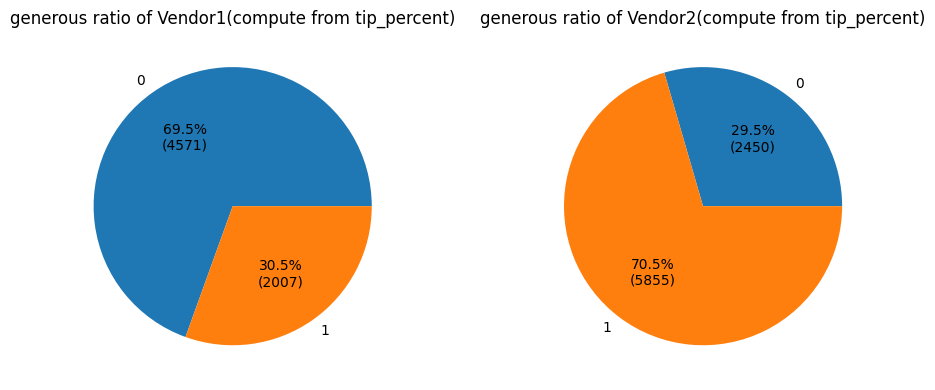

In [89]:
#####################################################
#potential_generous ratio of two vendors
#calculate by tip_percent
#####################################################
fig,axs=plt.subplots(1,2,figsize=(10,4))
result_generous=df_credit.groupby(['VendorID','Generous_by_tippercent'])[['tpep_pickup_datetime']].count().reset_index()

result_vendor1=result_generous[result_generous['VendorID']==1]
axs[0].pie(result_vendor1['tpep_pickup_datetime'],labels=result_vendor1['Generous_by_tippercent'], autopct=autopct_format(result_vendor1['tpep_pickup_datetime']))
axs[0].set_title('generous ratio of Vendor1(compute from tip_percent)')

result_vendor2=result_generous[result_generous['VendorID']==2]
axs[1].pie(result_vendor2['tpep_pickup_datetime'],labels=result_vendor2['Generous_by_tippercent'], autopct=autopct_format(result_vendor2['tpep_pickup_datetime']))
axs[1].set_title('generous ratio of Vendor2(compute from tip_percent)')

plt.tight_layout()
plt.show()

In [90]:
##################################################
#Confirm generous proportion of two vendors
##################################################
import statsmodels.api as sm
from scipy import stats
#https://mverbakel.github.io/2021-02-13/two-sample-proportions
#from statsmodels.stats.proportion import proportions_ztest

#https://www.statsmodels.org/dev/generated/statsmodels.stats.proportion.proportions_ztest.html
#$H_0$: The proportion of generous passengers is equal on any given Vendor<BR>
#$H_A$: The proportion of generous passengers is not equal on any given Vendor
#significance level=0.05
significance_level=0.05
mask1=df_credit['VendorID']==1
mask2=df_credit['VendorID']==2
mask_generous=df_credit['Generous_by_tippercent']==1
count = np.array([df_credit[mask1&mask_generous].shape[0], df_credit[mask2&mask_generous].shape[0]])
nobs = np.array([df_credit[mask1].shape[0], df_credit[mask2].shape[0]])
stat, pvalue = sm.stats.proportions_ztest(count, nobs, alternative='two-sided')
show_test_result(stat, pvalue,significance_level)
#=>0.012

#$H_0$: The proportion of generous passengers is equal on any given Vendor<BR>
#$H_A$: The proportion of generous passengers is not equal on any given Vendor
#significance level=0.05
result=pd.crosstab(df_credit['Generous_by_tippercent'], df_credit['VendorID'],margins=True).reset_index()
col_nm=df_credit['VendorID'].unique().tolist()
display(result)

mask_generous=result['Generous_by_tippercent']==1
mask_all=result['Generous_by_tippercent']=='All'
generous_cnt=result[mask_generous][col_nm].iloc[0].to_list()
total_cnt = (result[mask_all][col_nm]).iloc[0].to_list()
print(generous_cnt,total_cnt)
#https://www.statsmodels.org/dev/generated/statsmodels.stats.proportion.proportions_chisquare.html
statistic, pvalue,cont_table = sm.stats.proportions_chisquare(count=generous_cnt, nobs=total_cnt)
show_test_result(statistic, pvalue,significance_level)

#$H_{0}$: Travel Type and Departure_Delay_Class is independent
#$H_{A}$: Travel Type and Departure_Delay_Class is not independent

#significance level to 0.05
obs_tb=pd.crosstab(df_credit['Generous_by_tippercent'], df_credit["VendorID"])
display(obs_tb)
statistic, pvalue, dof, expected_value_arr  = stats.contingency.chi2_contingency(obs_tb, correction=False)
show_test_result(statistic, pvalue,significance_level)

Reject H0 at significance level 0.05 (Pvalue=0.0, Statistic=-48.53)


VendorID,Generous_by_tippercent,1,2,All
0,0,4571,2450,7021
1,1,2007,5855,7862
2,All,6578,8305,14883


[5855, 2007] [8305, 6578]
Reject H0 at significance level 0.05 (Pvalue=0.0, Statistic=2355.43)


VendorID,1,2
Generous_by_tippercent,,
0,4571,2450
1,2007,5855


Reject H0 at significance level 0.05 (Pvalue=0.0, Statistic=2355.43)


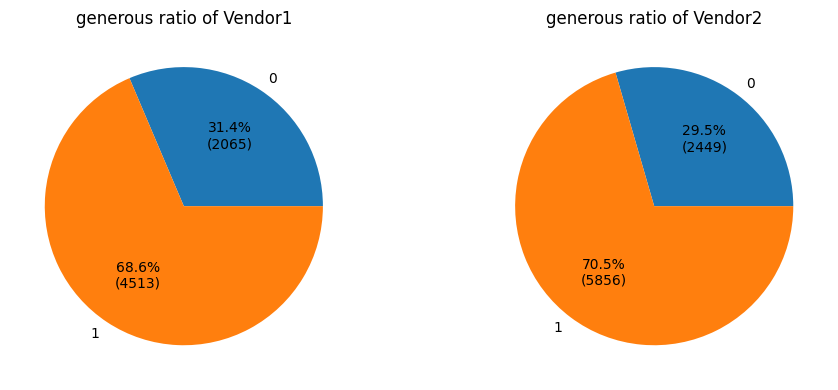

In [91]:
#####################################################
#generous ratio of two vendors
#consider tip_amount calculation difference
#assume they only round to 0.01 or round down to 0.05
#####################################################
fig,axs=plt.subplots(1,2,figsize=(10,4))
result_generous=df_credit.groupby(['VendorID','generous'])[['tpep_pickup_datetime']].count().reset_index()

result_vendor1=result_generous[result_generous['VendorID']==1]
axs[0].pie(result_vendor1['tpep_pickup_datetime'],labels=result_vendor1['generous'], autopct=autopct_format(result_vendor1['tpep_pickup_datetime']))
axs[0].set_title('generous ratio of Vendor1')

result_vendor2=result_generous[result_generous['VendorID']==2]
axs[1].pie(result_vendor2['tpep_pickup_datetime'],labels=result_vendor2['generous'], autopct=autopct_format(result_vendor2['tpep_pickup_datetime']))
axs[1].set_title('generous ratio of Vendor2')

plt.tight_layout()
plt.show()
#=>this might close to passengers actual choice(two vendors had similar distribution)

In [92]:
##################################################
#Confirm generous proportion of two vendors
##################################################

#https://mverbakel.github.io/2021-02-13/two-sample-proportions
#from statsmodels.stats.proportion import proportions_ztest

#https://www.statsmodels.org/dev/generated/statsmodels.stats.proportion.proportions_ztest.html
#$H_0$: The proportion of generous passengers is equal on any given Vendor
#$H_A$: The proportion of generous passengers is not equal on any given Vendor
#significance level=0.05
significance_level=0.05
mask1=df_credit['VendorID']==1
mask2=df_credit['VendorID']==2
mask_generous=df_credit['generous']==1
count = np.array([df_credit[mask1&mask_generous].shape[0], df_credit[mask2&mask_generous].shape[0]])
nobs = np.array([df_credit[mask1].shape[0], df_credit[mask2].shape[0]])
stat, pvalue = sm.stats.proportions_ztest(count, nobs, alternative='two-sided')
show_test_result(stat, pvalue,significance_level)
#=>0.012

#$H_0$: The proportion of generous passengers is equal on any given Vendor
#$H_A$: The proportion of generous passengers is not equal on any given Vendor
#significance level=0.05
result=pd.crosstab(df_credit['generous'], df_credit['VendorID'],margins=True).reset_index()
col_nm=df_credit['VendorID'].unique().tolist()
display(result)

mask_generous=result['generous']==1
mask_all=result['generous']=='All'
generous_cnt=result[mask_generous][col_nm].iloc[0].to_list()
total_cnt = (result[mask_all][col_nm]).iloc[0].to_list()
print(generous_cnt,total_cnt)
#https://www.statsmodels.org/dev/generated/statsmodels.stats.proportion.proportions_chisquare.html
statistic, pvalue,cont_table = sm.stats.proportions_chisquare(count=generous_cnt, nobs=total_cnt)
show_test_result(statistic, pvalue,significance_level)

#$H_{0}$: generous and VendorID is independent
#$H_{A}$: generous and VendorID is not independent

#significance level to 0.05
obs_tb=pd.crosstab(df_credit['generous'], df_credit["VendorID"])
display(obs_tb)
statistic, pvalue, dof, expected_value_arr  = stats.contingency.chi2_contingency(obs_tb, correction=False)
show_test_result(statistic, pvalue,significance_level)

Reject H0 at significance level 0.05 (Pvalue=0.012, Statistic=-2.51)


VendorID,generous,1,2,All
0,0,2065,2449,4514
1,1,4513,5856,10369
2,All,6578,8305,14883


[5856, 4513] [8305, 6578]
Reject H0 at significance level 0.05 (Pvalue=0.012, Statistic=6.3)


VendorID,1,2
generous,,
0,2065,2449
1,4513,5856


Reject H0 at significance level 0.05 (Pvalue=0.012, Statistic=6.3)


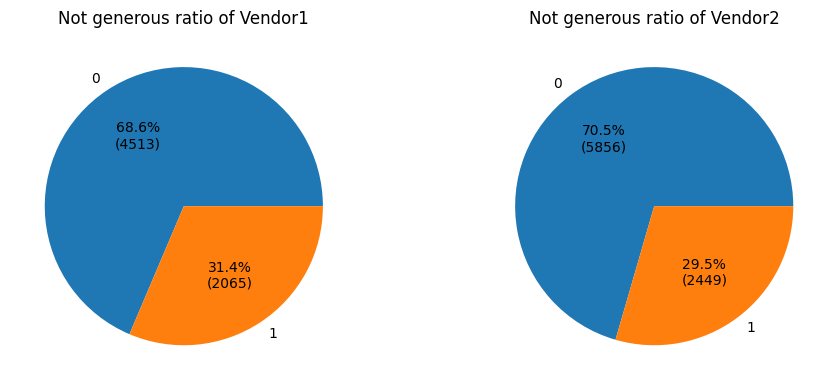

In [93]:
#####################################################
#not generous ratio of two vendors
#####################################################
fig,axs=plt.subplots(1,2,figsize=(10,4))
result_generous=df_credit.groupby(['VendorID','not_generous'])[['tpep_pickup_datetime']].count().reset_index()

result_vendor1=result_generous[result_generous['VendorID']==1]
axs[0].pie(result_vendor1['tpep_pickup_datetime'],labels=result_vendor1['not_generous'], autopct=autopct_format(result_vendor1['tpep_pickup_datetime']))
axs[0].set_title('Not generous ratio of Vendor1')

result_vendor2=result_generous[result_generous['VendorID']==2]
axs[1].pie(result_vendor2['tpep_pickup_datetime'],labels=result_vendor2['not_generous'], autopct=autopct_format(result_vendor2['tpep_pickup_datetime']))
axs[1].set_title('Not generous ratio of Vendor2')

plt.tight_layout()
plt.show()

##### generous by tolls

extra,generous,0.0,0.5,1.0,4.5
0,0,2277,1436,782,19
1,1,5350,3372,1610,37


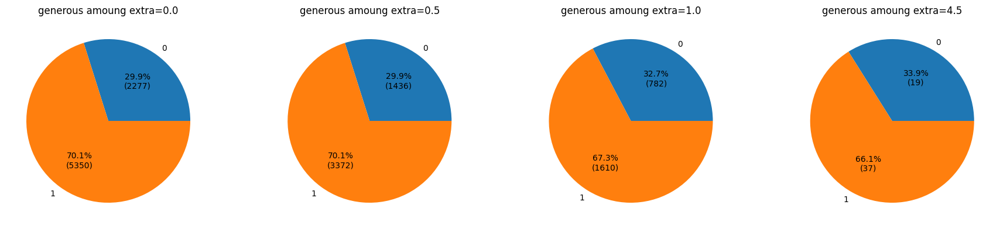

In [94]:
#######################################
#P(generous | Extra)
#######################################
generous_by_extra=pd.crosstab(df_credit["generous"],df_credit["extra"],margins=False).reset_index()
display(generous_by_extra)
col_nm=df_credit['extra'].unique().tolist()
col_nm.sort()
#######################################
#Pie Chart
#######################################
colCnt=4
rowCnt=math.ceil(len(col_nm)/colCnt)

fig, axs = plt.subplots(rowCnt,colCnt,figsize=(18,rowCnt*4))
for col,ax in zip(col_nm,axs.ravel()):
    ax.pie(generous_by_extra[col],labels = generous_by_extra["generous"], autopct=autopct_format(generous_by_extra[col]))
    ax.set_title(f"generous amoung extra={col}")
plt.tight_layout()
plt.show()

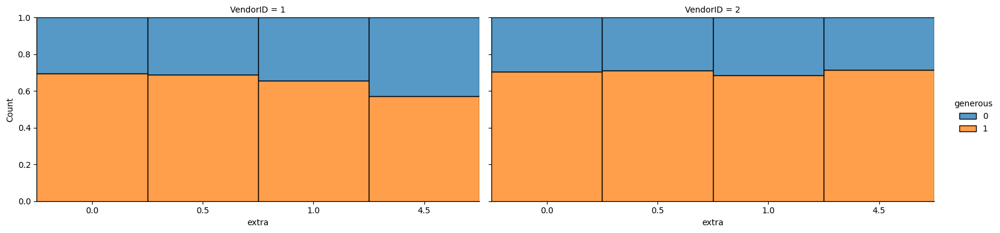

In [95]:
#######################################
#P(generous | Extra&VendorID)
#######################################
sns.displot(
    data=df_credit, x=df_credit["extra"].astype(str), hue="generous", col="VendorID",
    kind="hist", height=4, aspect=2,discrete=True,multiple='fill',palette='tab10'
)
plt.show()

#Extra=4.5 was JFK trip

#https://pix11.com/news/nyc-cab-software-could-have-you-tipping-too-much/
#'Payment systems by Creative Mobile Technologies (CMT) included the tax and tolls in the suggested tip while Verifone (VTS) leaves it out. 
#So depending on the software, your cab could be charging more for the same ride.'
#Vendor1 is CMT, Vendor2 is VeriFone
#According to above infomation, CMT used to charge more than VeriFone (in 2017 both of them included the tax and tolls)
#Maybe some passengers used to pay more in CMT trips and found this issue, when they use CMT they chose a lower tip rate

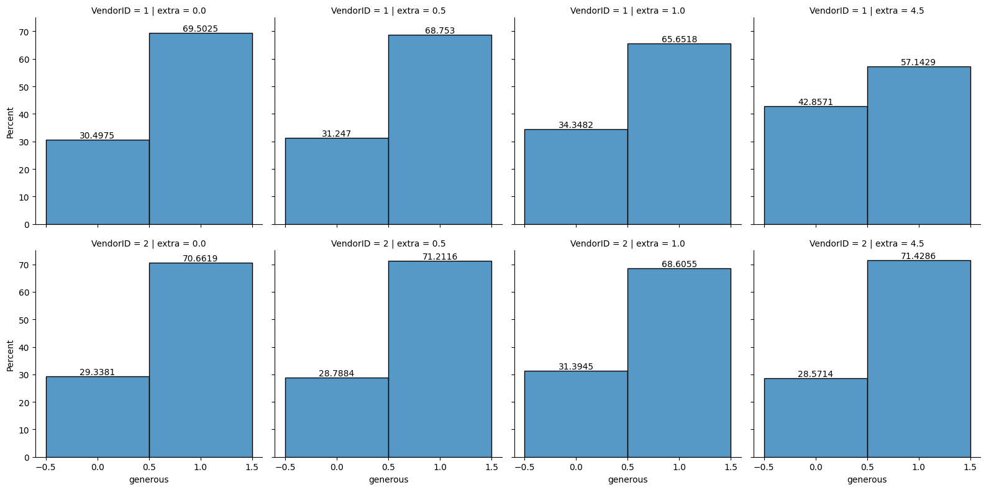

In [96]:
#######################################
#P(generous | Extra&VendorID)
#######################################
g=sns.FacetGrid(df_credit, col="extra", row="VendorID",height=4,aspect=1)
g.map_dataframe(sns.histplot,x="generous",stat='percent',discrete=True)
for axs in g.axes:
    for ax in axs:
        ax.bar_label(ax.containers[0])
g.add_legend()
plt.show()

In [97]:
mask=(df_credit['VendorID']==1)&(df_credit['extra']==4.5)&(df_credit['generous']==1)
df_credit[mask]

,ID,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,PU_hour,DO_hour,PU_day,DO_day,PU_month,DO_month,PU_weekday,DO_weekday,PU_year,PU_weeknum,PU_year_weeknum,PU_nextMonday,PU_date_hour,Borough_PU,Zone_PU,service_zone_PU,Borough_DO,Zone_DO,service_zone_DO,Date,NYC_All_Grades_All_Formulations_Retail_Gasoline_Prices,Year,time,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),apparent_temperature (°C),precipitation (mm),rain (mm),snowfall (cm),snow_depth (m),pressure_msl (hPa),surface_pressure (hPa),cloud_cover (%),cloud_cover_low (%),cloud_cover_mid (%),cloud_cover_high (%),wind_speed_10m (km/h),wind_speed_100m (km/h),wind_direction_10m (°),wind_direction_100m (°),wind_gusts_10m (km/h),PU_DO_Borough,JFK,Newark,OutsideNYC,nighttime,rushhour,duration,duration_sec,avg_speed,fare_per_minute,fare_per_mile,holiday,PU_date,fare_amount_log,am_rush,daytime,pm_rush,PU_hour_class,rush_hour,PU_season,Unnamed: 0,gpb_unit1,gpb_unit2,gpb_unit3,gpb_unit4,gpb_unit5,mean_distance_unit1,mean_distance_unit2,mean_distance_unit3,mean_distance_unit4,mean_distance_unit5,mean_duration_unit1,mean_duration_unit2,mean_duration_unit3,mean_duration_unit4,mean_duration_unit5,mean_speed_unit1,mean_speed_unit2,mean_speed_unit3,mean_speed_unit4,mean_speed_unit5,predict_fare_amount,mean_trip_duration,mean_trip_distance,mean_trip_speed,tip_percent,tip_percent_int,total_fare,cal_tip,tip_diff,total_fare_diff,tip_percent_notax,within_nyc,cal_tip_round_to_0_01,cal_tip_rounddown_to_0_05,Generous_by_tippercent,NGenerous_by_tippercent,generous,not_generous,total_count_PU,Violence_Ratio_PU,Violence_Cnt_PU,Larceny_Ratio_PU,Larceny_Cnt_PU,ViolenceRalated_Ratio_PU,ViolenceRalated_Cnt_PU,diff_Ratio_PU,diff_Cnt_PU,total_count_DO,Violence_Ratio_DO,Violence_Cnt_DO,Larceny_Ratio_DO,Larceny_Cnt_DO,ViolenceRalated_Ratio_DO,ViolenceRalated_Cnt_DO,diff_Ratio_DO,diff_Cnt_DO
634,71264442,1,2017-08-23 18:23:26,2017-08-23 19:18:29,1,16.7,2,N,132,230,1,52.0,4.5,0.5,42.29,0.00,0.3,99.59,18,19,23,23,8,8,Wednesday,Wednesday,2017,34,2017-34,2017-08-28,2017-08-23-18,Queens,JFK Airport,Airports,Manhattan,Times Sq/Theatre District,Yellow Zone,2017-08-28,2.548,2017,2017-08-23 18:00:00,24.5,56,15.1,24.8,0.0,0.0,0.0,0.00,1009.3,1003.4,4,2,4,0,10.0,20.0,339,337,20.2,Queens_Manhattan,True,False,False,0,True,55.050,3303.0,18.201635,0.944596,3.113772,False,2017-08-23,3.951244,0,0,1,pm_rush,1,summer,950,132_230,132_230_18,132_230_Wednesday_18,132_230_pm_rush,132_230_0_pm_rush,18.570000,17.830000,16.700,18.344444,17.578000,60.429208,67.050000,55.050,62.903778,51.803400,20.197452,17.334159,18.201635,19.222617,20.619475,52.013130,62.903778,18.344444,19.222617,73.8,74,57.30,42.402,0.112,0.151,80.1,True,42.40,42.40,1,0,1,0,64.0,0.546875,35.0,0.187500,12.0,0.781250,50.0,-0.593750,-38.0,2664.0,0.222222,592.0,0.562688,1499.0,0.368243,981.0,0.194444,518.0
2518,45311434,1,2017-05-26 16:35:08,2017-05-26 17:44:17,2,17.1,2,N,132,186,1,52.0,4.5,0.5,12.60,5.76,0.3,75.66,16,17,26,26,5,5,Friday,Friday,2017,21,2017-21,2017-05-29,2017-05-26-16,Queens,JFK Airport,Airports,Manhattan,Penn Station/Madison Sq West,Yellow Zone,2017-05-29,2.573,2017,2017-05-26 16:00:00,21.9,59,13.5,20.0,0.0,0.0,0.0,0.00,1003.3,997.4,56,28,56,0,20.2,28.6,301,301,38.2,Queens_Manhattan,True,False,False,0,True,69.150,4149.0,14.837310,0.751988,3.040936,False,2017-05-26,3.951244,0,0,1,pm_rush,1,spring,3697,132_186,132_186_16,132_186_Friday_16,132_186_pm_rush,132_186_0_pm_rush,18.375000,17.100000,17.100,17.316667,17.100000,56.436167,69.150000,69.150,56.922333,69.158500,21.334762,14.837310,14.837310,20.830256,14.835523,52.020320,56.922333,17.316667,20.830256,20.0,20,63.06,12.612,0.012,0.060,21.5,True,12.61,12.60,1,0,1,0,64.0,0.546875,35.0,0.187500,12.0,0.781250,50.0,-0.593750,-38.0,2256.0,0.143617,324.0,0.731383,1650.0,0.210993,476.0,0.520390,1174.0
2686,806

extra,Generous_by_tippercent,0.0,0.5,1.0,4.5
0,0,3562,2269,1171,19
1,1,4065,2539,1221,37


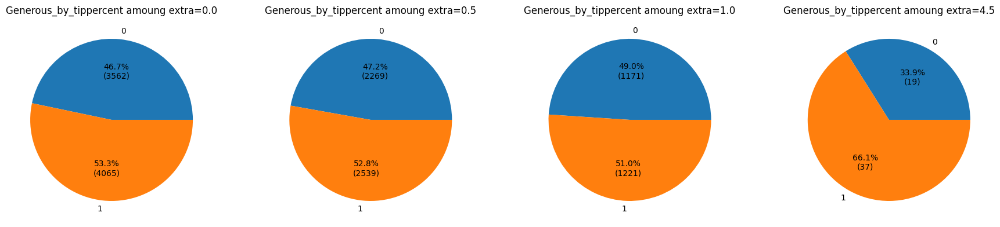

In [98]:
#######################################
#P(Generous_by_tippercent | Extra)
#######################################
generous_by_extra=pd.crosstab(df_credit["Generous_by_tippercent"],df_credit["extra"],margins=False).reset_index()
display(generous_by_extra)
col_nm=df_credit['extra'].unique().tolist()
col_nm.sort()
#######################################
#Pie Chart
#######################################
colCnt=4
rowCnt=math.ceil(len(col_nm)/colCnt)

fig, axs = plt.subplots(rowCnt,colCnt,figsize=(18,rowCnt*4))
for col,ax in zip(col_nm,axs.ravel()):
    ax.pie(generous_by_extra[col],labels = generous_by_extra["Generous_by_tippercent"], autopct=autopct_format(generous_by_extra[col]))
    ax.set_title(f"Generous_by_tippercent amoung extra={col}")
plt.tight_layout()
plt.show()

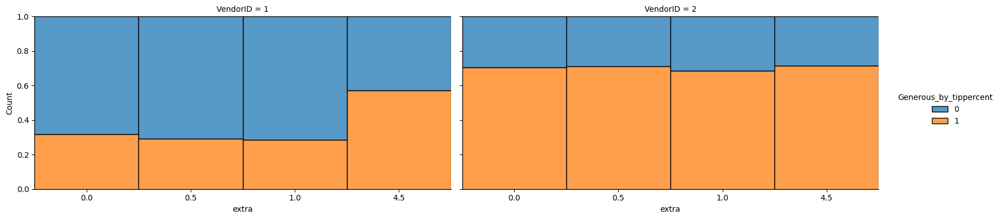

In [99]:
#######################################
#P(Generous_by_tippercent | Extra&VendorID)
#######################################
sns.displot(
    data=df_credit, x=df_credit["extra"].astype(str), hue="Generous_by_tippercent", col="VendorID",
    kind="hist", height=4, aspect=2,discrete=True,multiple='fill',palette='tab10'
)
plt.show()

In [100]:
#confirm tip_amount difference amoung extra  
df_credit.groupby(['VendorID','extra'])['tip_amount'].agg(['min','max','std','mean','median','count'])

min    max       std       mean  median  count
VendorID extra                                                 
1        0.0    0.00  21.30  2.518935   2.725537    2.00   3397
         0.5    0.00  28.00  2.057677   2.588687    2.00   2109
         1.0    0.00  13.95  1.808864   2.516289    2.00   1051
         4.5    0.02  42.29  8.402573  11.022381   11.45     21
2        0.0    0.00  55.50  2.924869   2.773087    1.99   4230
         0.5    0.00  18.56  1.906786   2.498907    2.00   2699
         1.0    0.00  16.66  2.097250   2.561066    2.06   1341
         4.5    0.00  20.00  4.146791  11.454571   12.57     35

In [101]:
#confirm tolls difference amoung extra  
df_credit.groupby(['VendorID','extra'])['tolls_amount'].agg(['min','max','std','mean','median','count'])

min    max       std      mean  median  count
VendorID extra                                               
1        0.0    0.0  16.50  1.569857  0.411484    0.00   3397
         0.5    0.0  10.50  1.047092  0.196159    0.00   2109
         1.0    0.0   5.76  1.027623  0.192559    0.00   1051
         4.5    0.0   5.76  2.293501  4.610476    5.76     21
2        0.0    0.0  19.10  1.719201  0.464596    0.00   4230
         0.5    0.0  16.62  1.122546  0.199563    0.00   2699
         1.0    0.0  17.28  1.312851  0.253609    0.00   1341
         4.5    0.0   5.76  2.605364  4.057714    5.54     35

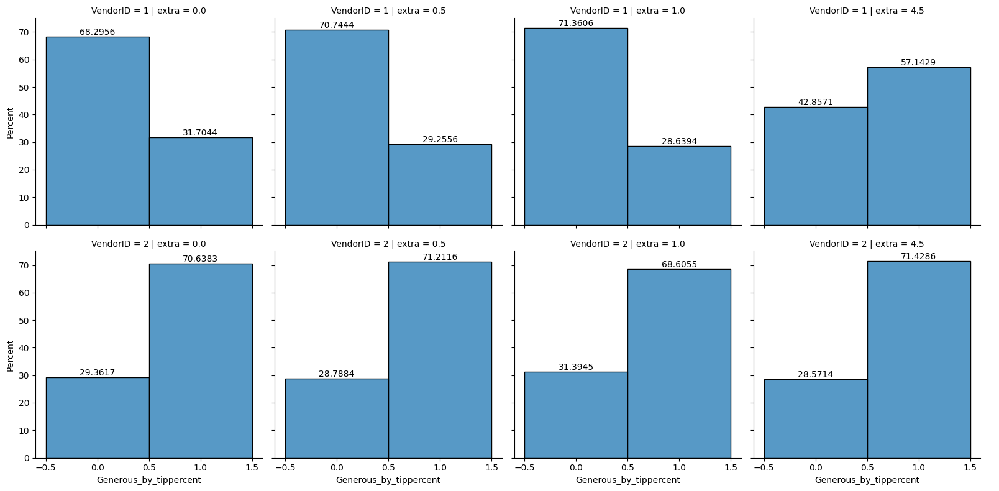

In [102]:
#######################################
#P(Generous_by_tippercent | Extra&VendorID)
#######################################
g=sns.FacetGrid(df_credit, col="extra", row="VendorID",height=4,aspect=1)
g.map_dataframe(sns.histplot,x="Generous_by_tippercent",stat='percent',discrete=True)
for axs in g.axes:
    for ax in axs:
        ax.bar_label(ax.containers[0])
g.add_legend()
plt.show()
#=>for vendor1, we can observe that the proportion of Generous_by_tippercent increased when extra=4.5(Manhattan<->JFK)
#=>for vendor2,minor change amoung extra fees

##### generous by pickup weekday

PU_weekday,generous,Friday,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
0,0,696,553,642,579,710,648,686
1,1,1553,1348,1467,1321,1561,1492,1627


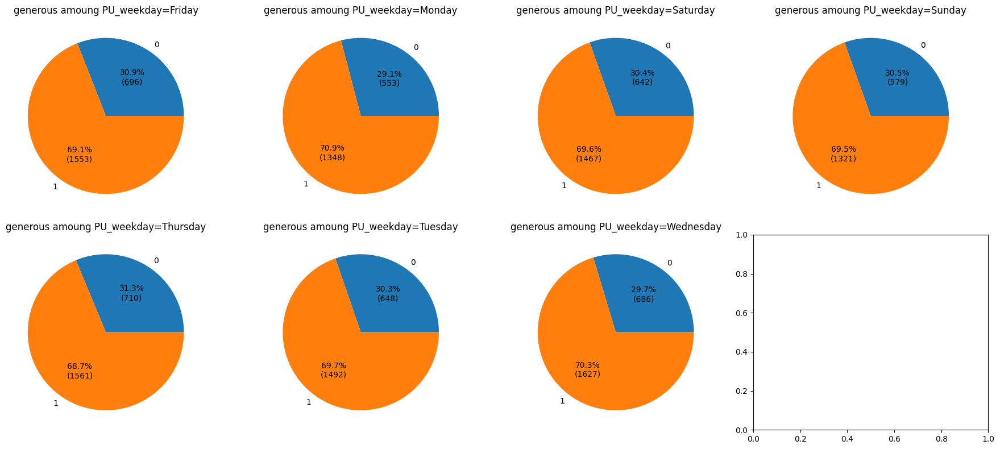

In [103]:
#######################################
#P(generous | PU_weekday)
#######################################
generous_by_extra=pd.crosstab(df_credit["generous"],df_credit["PU_weekday"],margins=False).reset_index()
display(generous_by_extra)
col_nm=df_credit['PU_weekday'].unique().tolist()
col_nm.sort()
#######################################
#Pie Chart
#######################################
colCnt=4
rowCnt=math.ceil(len(col_nm)/colCnt)

fig, axs = plt.subplots(rowCnt,colCnt,figsize=(18,rowCnt*4))
for col,ax in zip(col_nm,axs.ravel()):
    ax.pie(generous_by_extra[col],labels = generous_by_extra["generous"], autopct=autopct_format(generous_by_extra[col]))
    ax.set_title(f"generous amoung PU_weekday={col}")
plt.tight_layout()
plt.show()

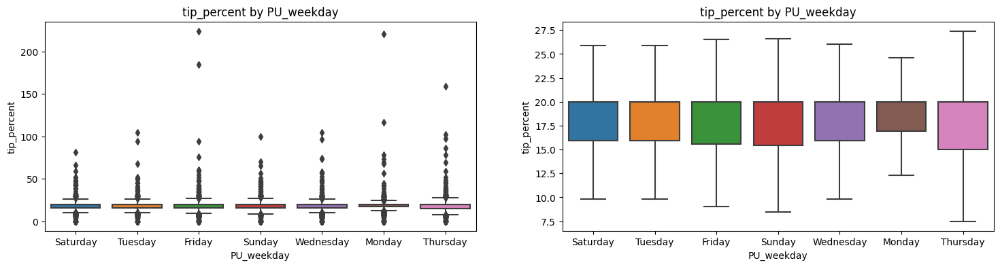

In [104]:
fig,axs=plt.subplots(1,2,figsize=(18,4))

sns.boxplot(data=df_credit, y="tip_percent",x="PU_weekday",ax=axs[0])
sns.boxplot(data=df_credit, y="tip_percent",x="PU_weekday",showfliers=False,ax=axs[1])
axs[0].set_title('tip_percent by PU_weekday')
axs[1].set_title('tip_percent by PU_weekday')
plt.show()

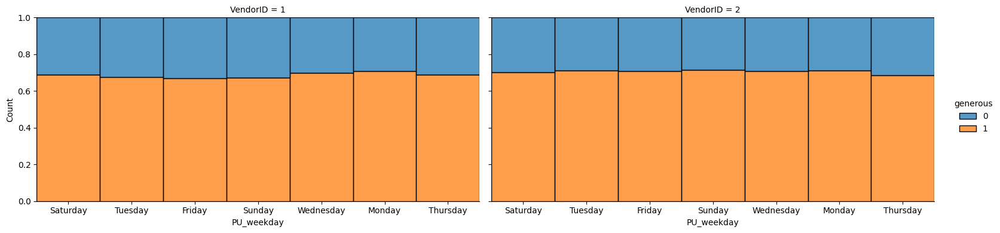

In [105]:
#######################################
#P(generous | PU_weekday)
#######################################
sns.displot(
    data=df_credit, x="PU_weekday", hue="generous", col="VendorID",
    kind="hist", height=4, aspect=2,discrete=True,multiple='fill',palette='tab10'
)
plt.show()

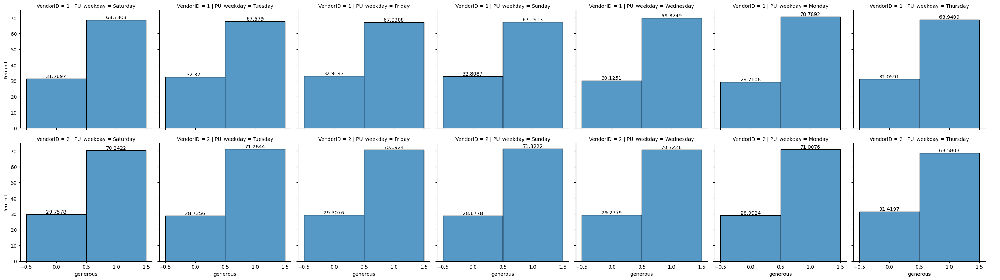

In [106]:
#######################################
#P(generous | PU_weekday)
#######################################
g=sns.FacetGrid(df_credit, col="PU_weekday", row="VendorID",height=4,aspect=1)
g.map_dataframe(sns.histplot,x="generous",stat='percent',discrete=True)
for axs in g.axes:
    for ax in axs:
        ax.bar_label(ax.containers[0])
g.add_legend()
plt.show()

PU_weekday,Generous_by_tippercent,Friday,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
0,0,1059,898,1026,901,1069,994,1074
1,1,1190,1003,1083,999,1202,1146,1239


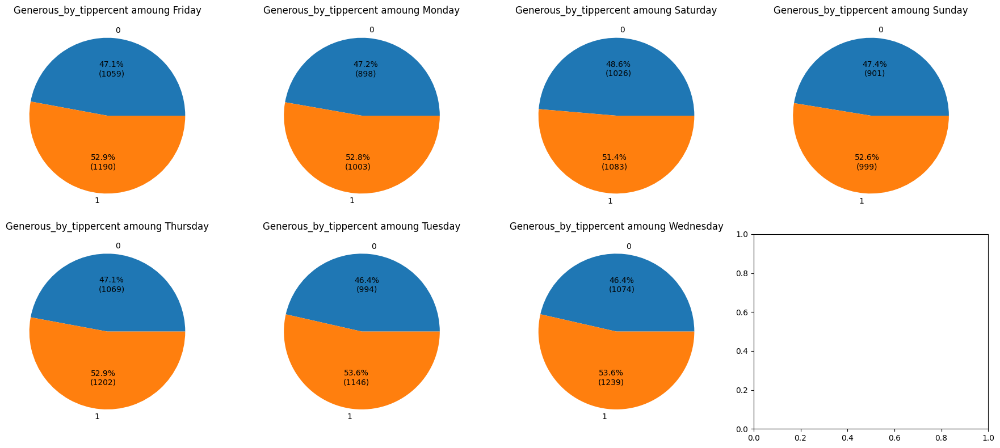

In [107]:
#######################################
#P(generous | PU_weekday)
#######################################
generous_by_extra=pd.crosstab(df_credit["Generous_by_tippercent"],df_credit["PU_weekday"],margins=False).reset_index()
display(generous_by_extra)
col_nm=df_credit['PU_weekday'].unique().tolist()
col_nm.sort()
#######################################
#Pie Chart
#######################################
colCnt=4
rowCnt=math.ceil(len(col_nm)/colCnt)

fig, axs = plt.subplots(rowCnt,colCnt,figsize=(18,rowCnt*4))
for col,ax in zip(col_nm,axs.ravel()):
    ax.pie(generous_by_extra[col],labels = generous_by_extra["Generous_by_tippercent"], autopct=autopct_format(generous_by_extra[col]))
    ax.set_title(f"Generous_by_tippercent amoung {col}")
plt.tight_layout()
plt.show()

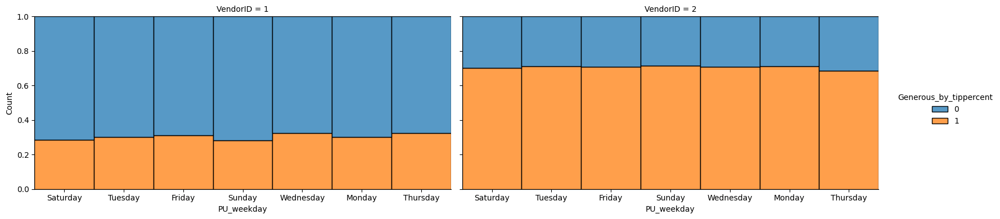

In [108]:
#######################################
#P(Generous_by_tippercent | PU_weekday)
#######################################
sns.displot(
    data=df_credit, x="PU_weekday", hue="Generous_by_tippercent", col="VendorID",
    kind="hist", height=4, aspect=2,discrete=True,multiple='fill',palette='tab10'
)
plt.show()

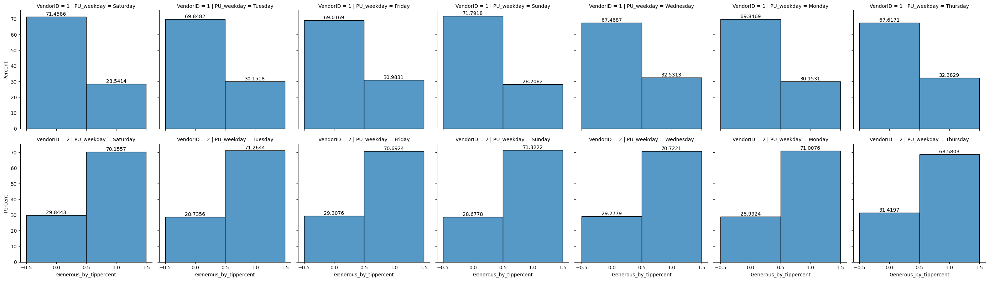

In [109]:
#######################################
#P(Generous_by_tippercent | PU_weekday)
#######################################
g=sns.FacetGrid(df_credit, col="PU_weekday", row="VendorID",height=4,aspect=1)
g.map_dataframe(sns.histplot,x="Generous_by_tippercent",stat='percent',discrete=True)
for axs in g.axes:
    for ax in axs:
        ax.bar_label(ax.containers[0])
g.add_legend()
plt.show()

##### generous by RatecodeID

RatecodeID,generous,1,2,3,4,5
0,0,4393,102,7,2,10
1,1,10134,214,15,1,5


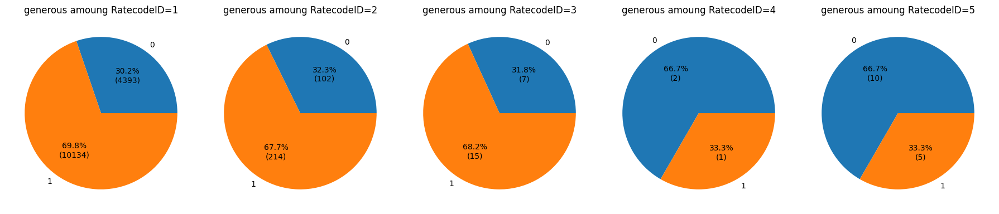

In [110]:
#######################################
#P(generous | RatecodeID)
#######################################
generous_by_ratecodeid=pd.crosstab(df_credit["generous"],df_credit["RatecodeID"],margins=False).reset_index()
display(generous_by_ratecodeid)
col_nm=df_credit['RatecodeID'].unique().tolist()
col_nm.sort()
#######################################
#Pie Chart
#######################################
colCnt=5
rowCnt=math.ceil(len(col_nm)/colCnt)

fig, axs = plt.subplots(rowCnt,colCnt,figsize=(18,rowCnt*4))
for col,ax in zip(col_nm,axs.ravel()):
    ax.pie(generous_by_ratecodeid[col],labels = generous_by_ratecodeid["generous"], autopct=autopct_format(generous_by_ratecodeid[col]))
    ax.set_title(f"generous amoung RatecodeID={col}")
plt.tight_layout()
plt.show()

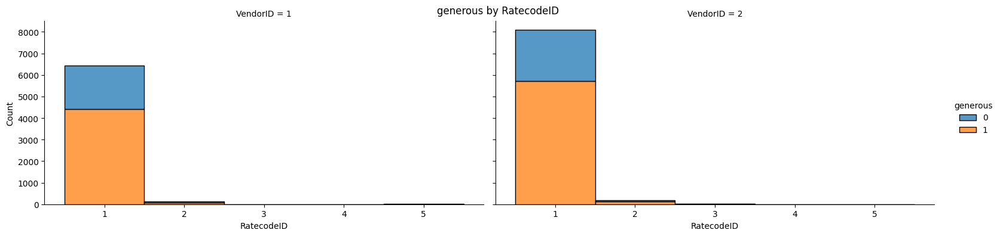

In [111]:
#######################################
#P(generous | RatecodeID)
#######################################
sns.displot(
    data=df_credit, x="RatecodeID", hue="generous", col="VendorID",
    kind="hist", height=4, aspect=2,discrete=True,multiple='stack',palette='tab10'
)
plt.suptitle('generous by RatecodeID')
plt.show()

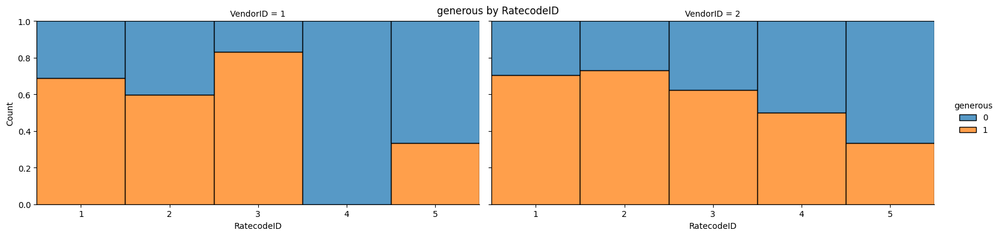

In [112]:
#######################################
#P(generous | RatecodeID)
#######################################
sns.displot(
    data=df_credit, x="RatecodeID", hue="generous", col="VendorID",
    kind="hist", height=4, aspect=2,discrete=True,multiple='fill',palette='tab10'
)
plt.suptitle('generous by RatecodeID')
plt.show()

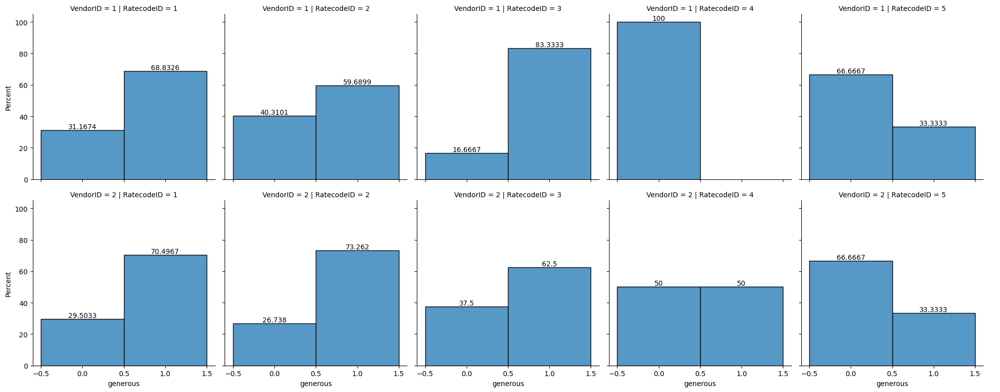

In [113]:
#######################################
#P(generous | RatecodeID)
#######################################
g=sns.FacetGrid(df_credit, col="RatecodeID", row="VendorID",height=4,aspect=1)
g.map_dataframe(sns.histplot,x="generous",stat='percent',discrete=True)
for axs in g.axes:
    for ax in axs:
        ax.bar_label(ax.containers[0])
g.add_legend()
plt.show()

RatecodeID,Generous_by_tippercent,1,2,3,4,5
0,0,6900,102,7,2,10
1,1,7627,214,15,1,5


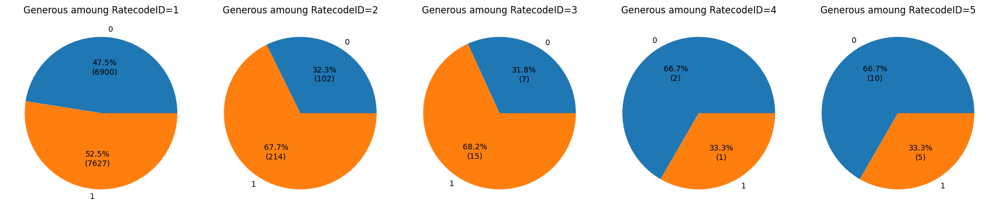

In [114]:
#######################################
#P(Generous_by_tippercent | RatecodeID)
#######################################
generous_by_ratecodeid=pd.crosstab(df_credit["Generous_by_tippercent"],df_credit["RatecodeID"],margins=False).reset_index()
display(generous_by_ratecodeid)
col_nm=df_credit['RatecodeID'].unique().tolist()
col_nm.sort()
#######################################
#Pie Chart
#######################################
colCnt=5
rowCnt=math.ceil(len(col_nm)/colCnt)

fig, axs = plt.subplots(rowCnt,colCnt,figsize=(18,rowCnt*4))
for col,ax in zip(col_nm,axs.ravel()):
    ax.pie(generous_by_ratecodeid[col],labels = generous_by_ratecodeid["Generous_by_tippercent"], autopct=autopct_format(generous_by_ratecodeid[col]))
    ax.set_title(f"Generous amoung RatecodeID={col}")
plt.tight_layout()
plt.show()

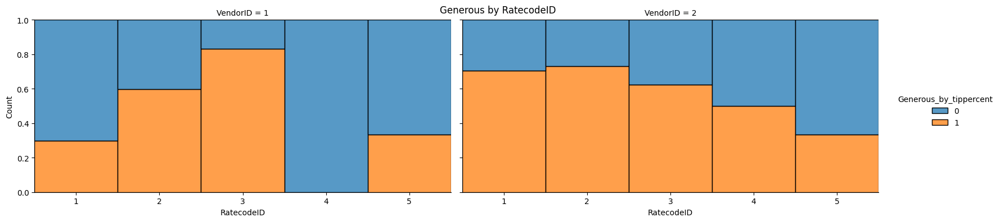

In [115]:
#######################################
#P(Generous_by_tippercent | RatecodeID)
#######################################
sns.displot(
    data=df_credit, x="RatecodeID", hue="Generous_by_tippercent", col="VendorID",
    kind="hist", height=4, aspect=2,discrete=True,multiple='fill',palette='tab10'
)
plt.suptitle('Generous by RatecodeID')
plt.show()

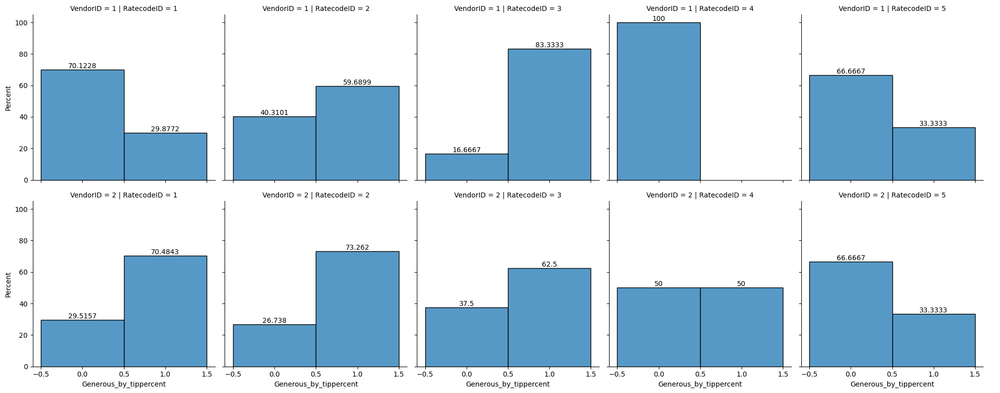

In [116]:
#######################################
#P(Generous_by_tippercent | RatecodeID)
#######################################
g=sns.FacetGrid(df_credit, col="RatecodeID", row="VendorID",height=4,aspect=1)
g.map_dataframe(sns.histplot,x="Generous_by_tippercent",stat='percent',discrete=True)
for axs in g.axes:
    for ax in axs:
        ax.bar_label(ax.containers[0])
g.add_legend()
plt.show()

##### generous by tolls

tolls_amount,generous,no tolls,tolls
0,0,4263,251
1,1,9771,598


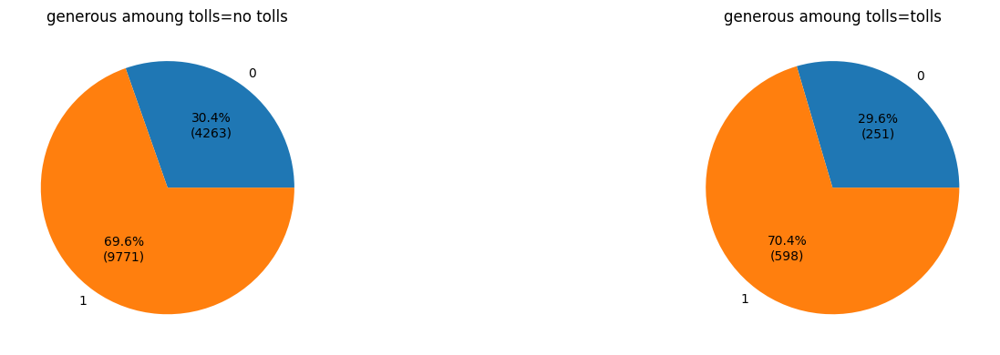

In [117]:
#######################################
#P(generous | tolls_amount)
#######################################
generous_by_tolls=pd.crosstab(df_credit["generous"],df_credit["tolls_amount"].apply(check_if_tolls),margins=False).reset_index()
display(generous_by_tolls)
col_nm=df_credit["tolls_amount"].apply(check_if_tolls).unique().tolist()
col_nm.sort()
#######################################
#Pie Chart
#######################################
colCnt=2
rowCnt=math.ceil(len(col_nm)/colCnt)

fig, axs = plt.subplots(rowCnt,colCnt,figsize=(18,rowCnt*4))
for col,ax in zip(col_nm,axs.ravel()):
    ax.pie(generous_by_tolls[col],labels = generous_by_tolls["generous"], autopct=autopct_format(generous_by_tolls[col]))
    ax.set_title(f"generous amoung tolls={col}")
plt.tight_layout()
plt.show()

tolls_amount,Generous_by_tippercent,no tolls,tolls
0,0,6752,269
1,1,7282,580


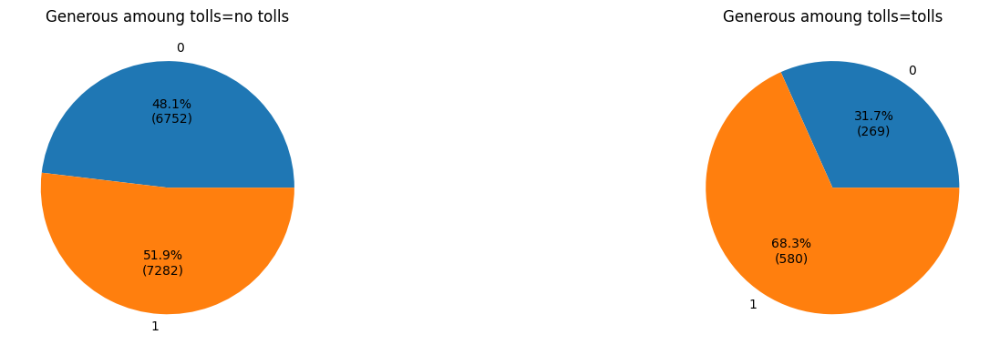

In [118]:
#######################################
#P(Generous_by_tippercent | tolls_amount)
#######################################
generous_by_tolls=pd.crosstab(df_credit["Generous_by_tippercent"],df_credit["tolls_amount"].apply(check_if_tolls),margins=False).reset_index()
display(generous_by_tolls)
col_nm=df_credit["tolls_amount"].apply(check_if_tolls).unique().tolist()
col_nm.sort()
#######################################
#Pie Chart
#######################################
colCnt=2
rowCnt=math.ceil(len(col_nm)/colCnt)

fig, axs = plt.subplots(rowCnt,colCnt,figsize=(18,rowCnt*4))
for col,ax in zip(col_nm,axs.ravel()):
    ax.pie(generous_by_tolls[col],labels = generous_by_tolls["Generous_by_tippercent"], autopct=autopct_format(generous_by_tolls[col]))
    ax.set_title(f"Generous amoung tolls={col}")
plt.tight_layout()
plt.show()

##### generous by pickup hour

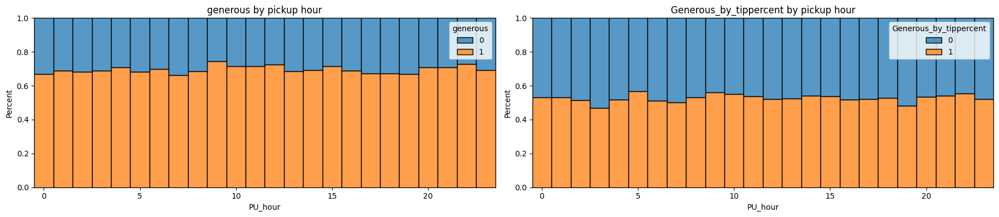

In [119]:
#######################################
#generous/Generous_by_tippercent
#by PU_hour
#######################################
fig,axs=plt.subplots(1,2,figsize=(18,4))
var_list=['generous', 'Generous_by_tippercent']

for var,ax in zip(var_list,axs.ravel()):
    sns.histplot(data=df_credit, x='PU_hour', stat='percent', hue=var,
                 discrete=True,multiple='fill',palette='tab10',ax=ax)
    ax.set_title(f'{var} by pickup hour')
plt.tight_layout()
plt.show()

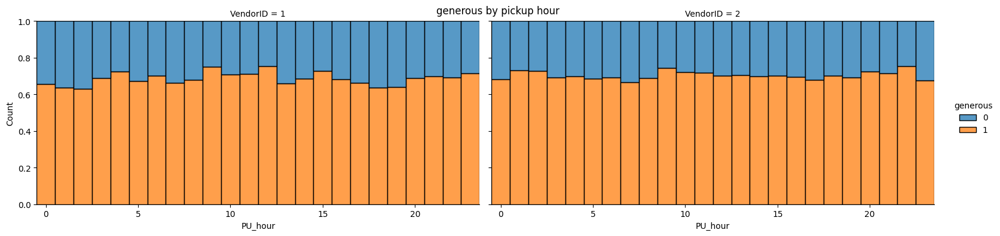

In [120]:
#######################################
#P(generous | PU_hour)
#######################################
sns.displot(
    data=df_credit, x="PU_hour", hue="generous", col="VendorID",
    kind="hist", height=4, aspect=2,discrete=True,multiple='fill',palette='tab10'
)
plt.suptitle('generous by pickup hour')
plt.show()

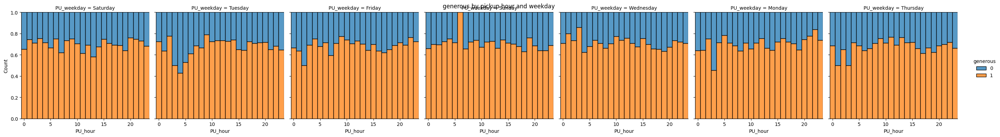

In [121]:
#######################################
#P(generous | PU_hour)
#######################################
sns.displot(
    data=df_credit, x="PU_hour", hue="generous", col="PU_weekday",
    kind="hist", height=4, aspect=1,discrete=True,multiple='fill',palette='tab10'
)
plt.suptitle('generous by pickup hour and weekday')
plt.show()

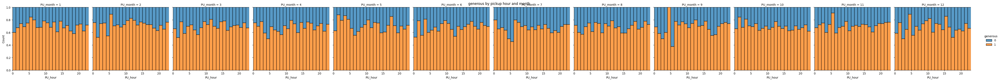

In [122]:
#######################################
#P(generous | PU_hour&PU_month)
#######################################
sns.displot(
    data=df_credit, x="PU_hour", hue="generous", col="PU_month",
    kind="hist", height=4, aspect=1,binwidth=1,multiple='fill',palette='tab10'
)
plt.suptitle('generous by pickup hour and month')
plt.show()

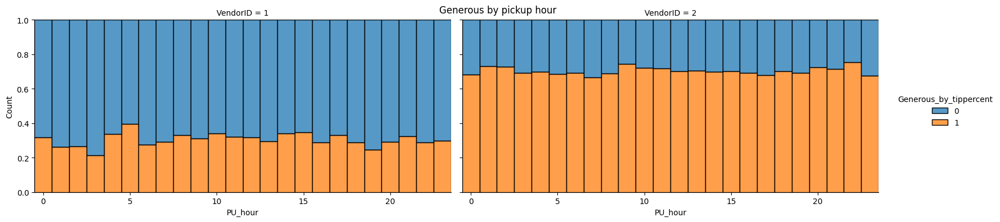

In [123]:
#######################################
#P(Generous_by_tippercent | PU_hour)
#######################################
sns.displot(
    data=df_credit, x="PU_hour", hue="Generous_by_tippercent", col="VendorID",
    kind="hist", height=4, aspect=2,discrete=True,multiple='fill',palette='tab10'
)
plt.suptitle('Generous by pickup hour')
plt.show()

##### generous by pickup month

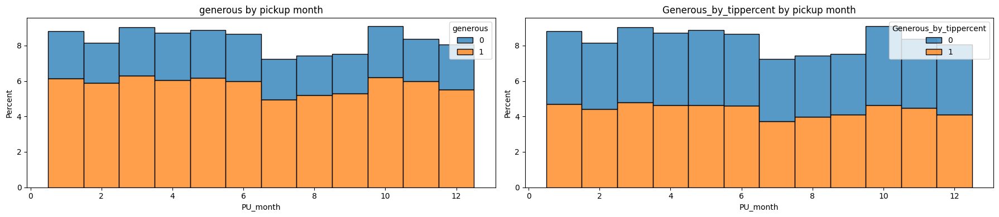

In [124]:
#######################################
#generous/Generous_by_tippercent
#by PU_month
#######################################
fig,axs=plt.subplots(1,2,figsize=(18,4))
var_list=['generous', 'Generous_by_tippercent']

for var,ax in zip(var_list,axs.ravel()):
    sns.histplot(data=df_credit, x='PU_month', stat='percent', hue=var,
                 discrete=True,multiple='stack',palette='tab10',ax=ax)
    ax.set_title(f'{var} by pickup month')
plt.tight_layout()
plt.show()

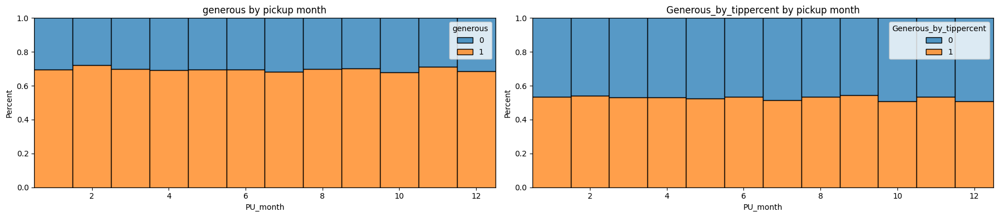

In [125]:
#######################################
#generous/Generous_by_tippercent
#by PU_month
#######################################
fig,axs=plt.subplots(1,2,figsize=(18,4))
var_list=['generous', 'Generous_by_tippercent']

for var,ax in zip(var_list,axs.ravel()):
    sns.histplot(data=df_credit, x='PU_month', stat='percent', hue=var,
                 discrete=True,multiple='fill',palette='tab10',ax=ax)
    ax.set_title(f'{var} by pickup month')
plt.tight_layout()
plt.show()

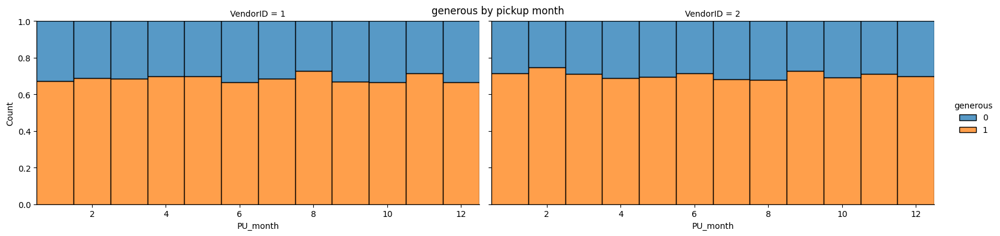

In [126]:
#######################################
#P(generous | PU_month)
#######################################
sns.displot(
    data=df_credit, x="PU_month", hue="generous", col="VendorID",
    kind="hist", height=4, aspect=2,discrete=True,multiple='fill',palette='tab10'
)
plt.suptitle('generous by pickup month')
plt.show()

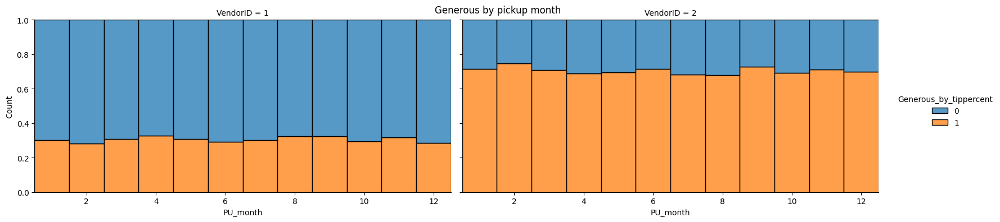

In [127]:
#######################################
#P(Generous_by_tippercent | PU_month)
#######################################
sns.displot(
    data=df_credit, x="PU_month", hue="Generous_by_tippercent", col="VendorID",
    kind="hist", height=4, aspect=2,discrete=True,multiple='fill',palette='tab10'
)
plt.suptitle('Generous by pickup month')
plt.show()

##### generous by pickup day

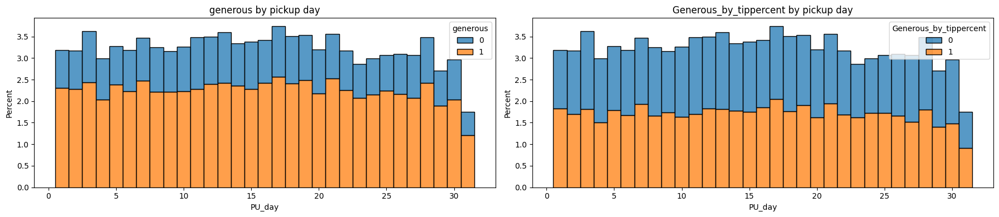

In [128]:
#######################################
#generous/Generous_by_tippercent
#by PU_day
#######################################
fig,axs=plt.subplots(1,2,figsize=(18,4))
var_list=['generous', 'Generous_by_tippercent']

for var,ax in zip(var_list,axs.ravel()):
    sns.histplot(data=df_credit, x='PU_day', stat='percent', hue=var,
                 discrete=True,multiple='stack',palette='tab10',ax=ax)
    ax.set_title(f'{var} by pickup day')
plt.tight_layout()
plt.show()

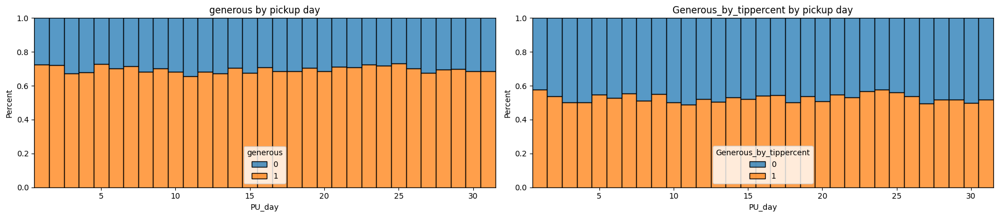

In [129]:
#######################################
#generous/Generous_by_tippercent
#by PU_day
#######################################
fig,axs=plt.subplots(1,2,figsize=(18,4))
var_list=['generous', 'Generous_by_tippercent']

for var,ax in zip(var_list,axs.ravel()):
    sns.histplot(data=df_credit, x='PU_day', stat='percent', hue=var,
                 discrete=True,multiple='fill',palette='tab10',ax=ax)
    ax.set_title(f'{var} by pickup day')
plt.tight_layout()
plt.show()

##### generous by pickup Borough

Borough_PU,generous,Bronx,Brooklyn,Manhattan,Outside of NYC(N/A),Queens
0,0,0,49,4178,0,287
1,1,1,152,9614,1,601


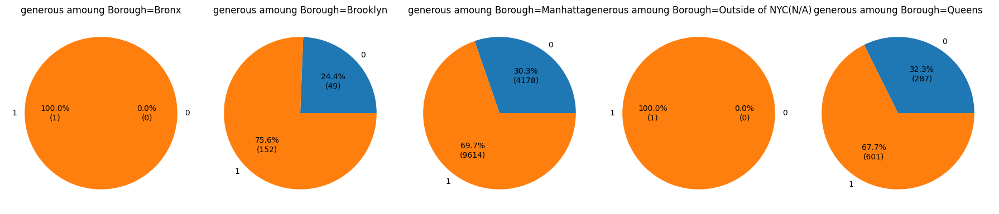

In [130]:
#######################################
#P(generous | Borough_PU)
#######################################
generous_by_borough=pd.crosstab(df_credit["generous"],df_credit["Borough_PU"],margins=False).reset_index()
display(generous_by_borough)
col_nm=df_credit['Borough_PU'].unique().tolist()
col_nm.sort()
#######################################
#Pie Chart
#######################################
colCnt=5
rowCnt=math.ceil(len(col_nm)/colCnt)

fig, axs = plt.subplots(rowCnt,colCnt,figsize=(18,rowCnt*4))
for col,ax in zip(col_nm,axs.ravel()):
    ax.pie(generous_by_borough[col],labels = generous_by_borough["generous"], autopct=autopct_format(generous_by_borough[col]))
    ax.set_title(f"generous amoung Borough={col}")
plt.tight_layout()
plt.show()

Borough_PU,Generous_by_tippercent,Bronx,Brooklyn,Manhattan,Outside of NYC(N/A),Queens
0,0,0,77,6640,1,303
1,1,1,124,7152,0,585


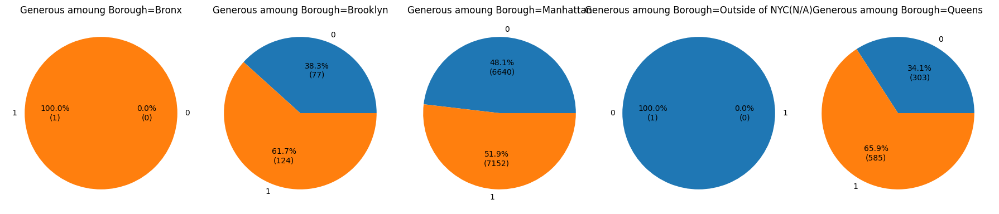

In [131]:
#######################################
#P(Generous_by_tippercent | Borough_PU)
#######################################
generous_by_borough=pd.crosstab(df_credit["Generous_by_tippercent"],df_credit["Borough_PU"],margins=False).reset_index()
display(generous_by_borough)
col_nm=df_credit['Borough_PU'].unique().tolist()
col_nm.sort()
#######################################
#Pie Chart
#######################################
colCnt=5
rowCnt=math.ceil(len(col_nm)/colCnt)

fig, axs = plt.subplots(rowCnt,colCnt,figsize=(18,rowCnt*4))
for col,ax in zip(col_nm,axs.ravel()):
    ax.pie(generous_by_borough[col],labels = generous_by_borough["Generous_by_tippercent"], autopct=autopct_format(generous_by_borough[col]))
    ax.set_title(f"Generous amoung Borough={col}")
plt.tight_layout()
plt.show()

##### generous by dropoff Borough

Borough_DO,generous,Bronx,Brooklyn,EWR,Manhattan,Outside of NYC(N/A),Queens,Staten Island
0,0,32,217,7,4051,13,194,0
1,1,35,523,15,9323,11,459,3


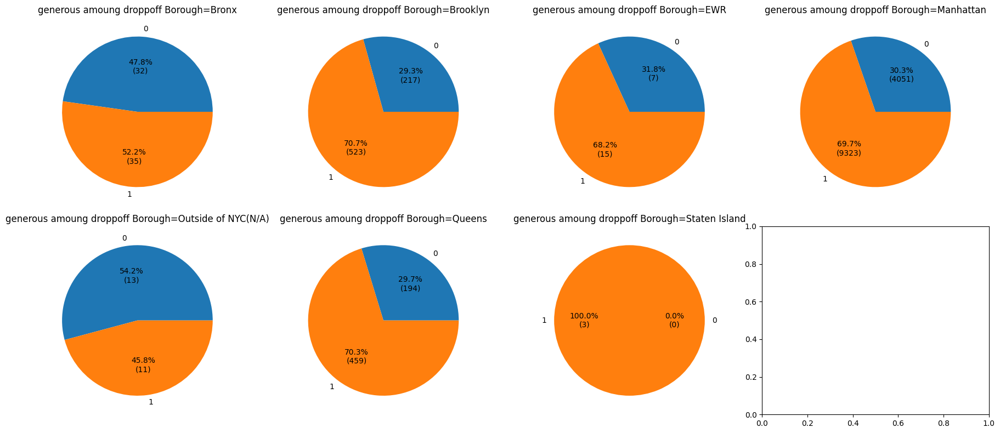

In [132]:
#######################################
#P(generous | Borough_DO)
#######################################
generous_by_borough=pd.crosstab(df_credit["generous"],df_credit["Borough_DO"],margins=False).reset_index()
display(generous_by_borough)
col_nm=df_credit['Borough_DO'].unique().tolist()
col_nm.sort()
#######################################
#Pie Chart
#######################################
colCnt=4
rowCnt=math.ceil(len(col_nm)/colCnt)

fig, axs = plt.subplots(rowCnt,colCnt,figsize=(18,rowCnt*4))
for col,ax in zip(col_nm,axs.ravel()):
    ax.pie(generous_by_borough[col],labels = generous_by_borough["generous"], autopct=autopct_format(generous_by_borough[col]))
    ax.set_title(f"generous amoung droppoff Borough={col}")
plt.tight_layout()
plt.show()

Borough_DO,Generous_by_tippercent,Bronx,Brooklyn,EWR,Manhattan,Outside of NYC(N/A),Queens,Staten Island
0,0,36,288,7,6450,14,226,0
1,1,31,452,15,6924,10,427,3


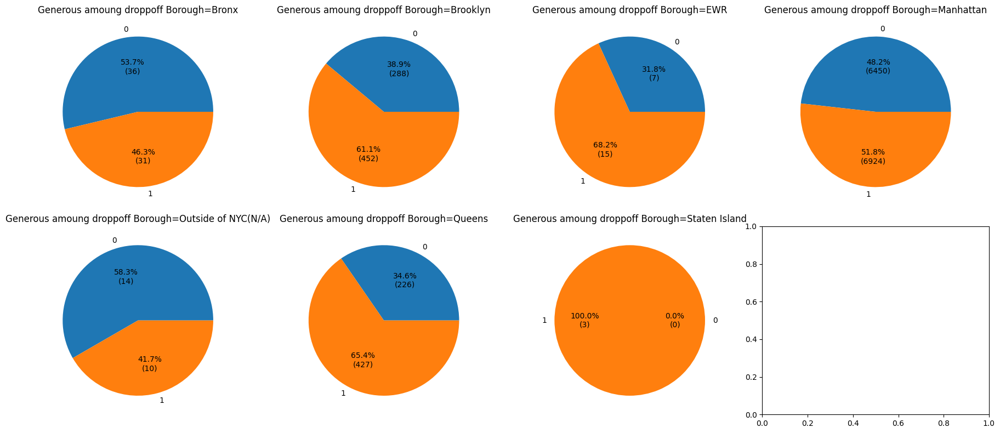

In [133]:
#######################################
#P(Generous_by_tippercent | Borough_DO)
#######################################
generous_by_borough=pd.crosstab(df_credit["Generous_by_tippercent"],df_credit["Borough_DO"],margins=False).reset_index()
display(generous_by_borough)
col_nm=df_credit['Borough_DO'].unique().tolist()
col_nm.sort()
#######################################
#Pie Chart
#######################################
colCnt=4
rowCnt=math.ceil(len(col_nm)/colCnt)

fig, axs = plt.subplots(rowCnt,colCnt,figsize=(18,rowCnt*4))
for col,ax in zip(col_nm,axs.ravel()):
    ax.pie(generous_by_borough[col],labels = generous_by_borough["Generous_by_tippercent"], autopct=autopct_format(generous_by_borough[col]))
    ax.set_title(f"Generous amoung droppoff Borough={col}")
plt.tight_layout()
plt.show()

##### generous by pickup dropp off brough

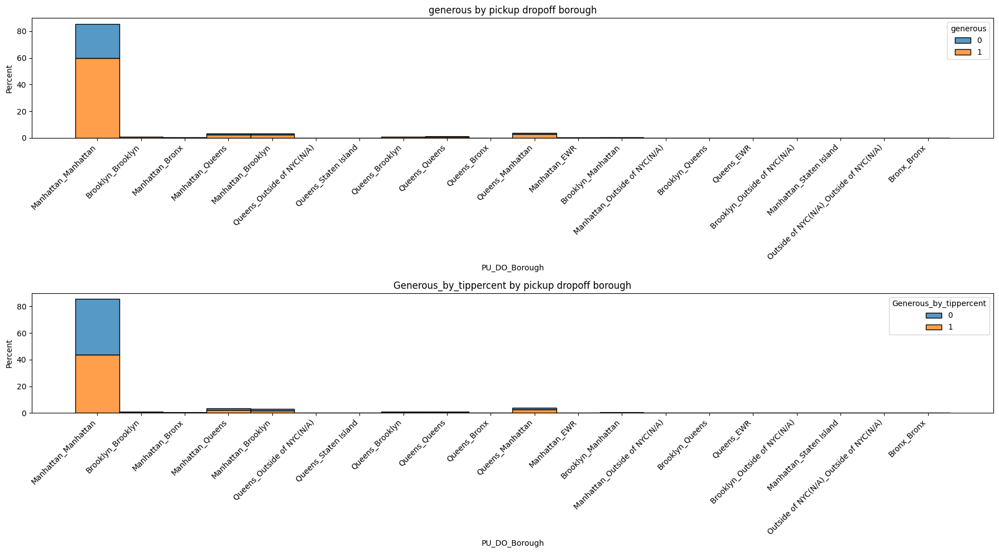

In [134]:
#######################################
#generous/Generous_by_tippercent
#by PU_DO_Borough
#######################################
fig,axs=plt.subplots(2,1,figsize=(18,10))
var_list=['generous', 'Generous_by_tippercent']

for var,ax in zip(var_list,axs.ravel()):
    sns.histplot(data=df_credit, x='PU_DO_Borough', stat='percent', hue=var,
                 binwidth=1,palette='tab10',multiple='stack',ax=ax)
    ax.set_title(f'{var} by pickup dropoff borough')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
plt.tight_layout()
plt.show()

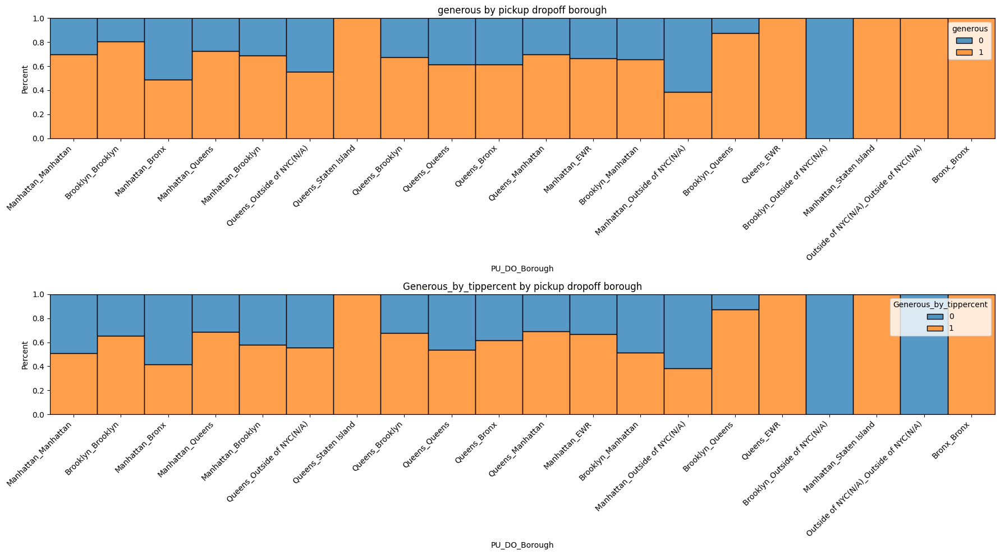

In [135]:
#######################################
#generous/Generous_by_tippercent
#by PU_DO_Borough
#######################################
fig,axs=plt.subplots(2,1,figsize=(18,10))
var_list=['generous', 'Generous_by_tippercent']

for var,ax in zip(var_list,axs.ravel()):
    sns.histplot(data=df_credit, x='PU_DO_Borough', stat='percent', hue=var,
                 binwidth=1,palette='tab10',multiple='fill',ax=ax)
    ax.set_title(f'{var} by pickup dropoff borough')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
plt.tight_layout()
plt.show()

##### generous by pickup locationid

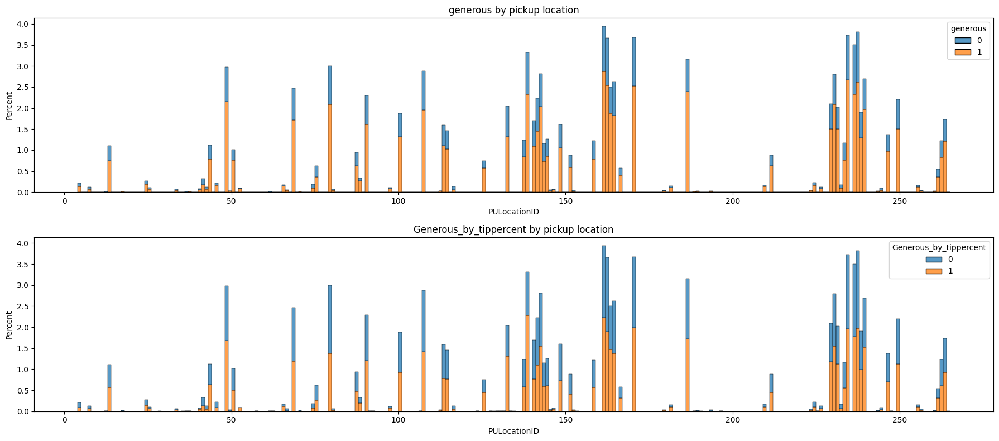

In [136]:
#######################################
#generous/Generous_by_tippercent
#by PULocationID
#######################################
fig,axs=plt.subplots(2,1,figsize=(18,8))
var_list=['generous', 'Generous_by_tippercent']

for var,ax in zip(var_list,axs.ravel()):
    sns.histplot(data=df_credit, x='PULocationID', stat='percent', hue=var,
                 binwidth=1,palette='tab10',multiple='stack',ax=ax)
    ax.set_title(f'{var} by pickup location')
plt.tight_layout()
plt.show()

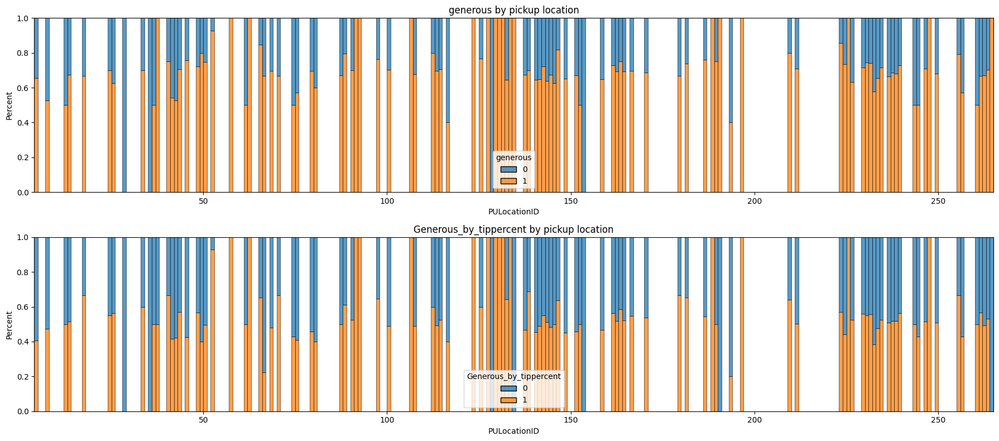

In [137]:
#######################################
#generous/Generous_by_tippercent
#by PULocationID
#######################################
fig,axs=plt.subplots(2,1,figsize=(18,8))
var_list=['generous', 'Generous_by_tippercent']

for var,ax in zip(var_list,axs.ravel()):
    sns.histplot(data=df_credit, x='PULocationID', stat='percent', hue=var,
                 binwidth=1,multiple='fill',palette='tab10',ax=ax)
    ax.set_title(f'{var} by pickup location')
plt.tight_layout()
plt.show()

In [138]:
generous_result=pd.crosstab(df_credit['PULocationID'],df_credit['generous'],margins=True).reset_index()
generous_result['0_ratio']=generous_result[0]/generous_result['All']
generous_result['1_ratio']=generous_result[1]/generous_result['All']
generous_result['1_logit']=generous_result['1_ratio']/(1-generous_result['1_ratio'])

df_tmp=generous_result.merge(df_taxizone, left_on='PULocationID', right_on='LocationID')
#drop duplicaed columns
generous_result=df_tmp.drop(columns=['LocationID','service_zone'])

generous_result[generous_result['All']>=30].sort_values(['1_logit'],ascending=False).head(15)

,PULocationID,0,1,All,0_ratio,1_ratio,1_logit,Borough,Zone
33,88,10,39,49,0.204082,0.795918,3.900000,Manhattan,Financial District South
46,125,26,86,112,0.232143,0.767857,3.307692,Manhattan,Hudson Sq
77,186,113,357,470,0.240426,0.759574,3.159292,Manhattan,Penn Station/Madison Sq West
16,45,8,25,33,0.242424,0.757576,3.125000,Manhattan,Chinatown
71,163,93,279,372,0.250000,0.750000,3.000000,Manhattan,Midtown North
19,50,38,113,151,0.251656,0.748344,2.973684,Manhattan,Clinton West
90,230,106,311,417,0.254197,0.745803,2.933962,Manhattan,Times Sq/Theatre District
91,231,78,223,301,0.259136,0.740864,2.858974,Manhattan,TriBeCa/Civic Center
86,224,9,25,34,0.264706,0.735294,2.777778,Manhattan,Stuy Town/Peter Cooper Village
69,161,159,428,587,0.270869,0.729131,2.691824,Manhattan,Midtown Center


In [139]:
generous_result[generous_result['All']>=30].sort_values(['1_logit'],ascending=True).head(15)

,PULocationID,0,1,All,0_ratio,1_ratio,1_logit,Borough,Zone
13,41,22,26,48,0.458333,0.541667,1.181818,Manhattan,Central Harlem
29,75,40,53,93,0.430108,0.569892,1.325000,Manhattan,East Harlem South
60,143,62,110,172,0.360465,0.639535,1.774194,Manhattan,Lincoln Square West
57,140,90,163,253,0.355731,0.644269,1.811111,Manhattan,Lenox Hill East
52,132,108,196,304,0.355263,0.644737,1.814815,Queens,JFK Airport
58,141,117,215,332,0.352410,0.647590,1.837607,Manhattan,Lenox Hill West
68,158,64,118,182,0.351648,0.648352,1.843750,Manhattan,Meatpacking/West Village West
64,148,83,156,239,0.347280,0.652720,1.879518,Manhattan,Lower East Side
93,233,60,114,174,0.344828,0.655172,1.900000,Manhattan,UN/Turtle Bay South
0,4,11,21,32,0.343750,0.656250,1.909091,Manhattan,Alphabet City


##### generous by dropoff locationid

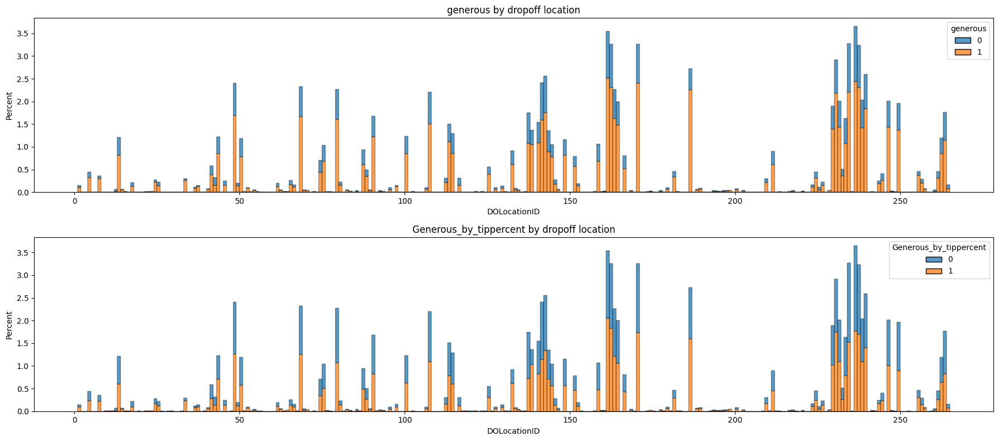

In [140]:
#######################################
#generous/Generous_by_tippercent
#by DOLocationID
#######################################
fig,axs=plt.subplots(2,1,figsize=(18,8))
var_list=['generous', 'Generous_by_tippercent']

for var,ax in zip(var_list,axs.ravel()):
    sns.histplot(data=df_credit, x='DOLocationID', stat='percent', hue=var,
                 binwidth=1,palette='tab10',multiple='stack',ax=ax)
    ax.set_title(f'{var} by dropoff location')
plt.tight_layout()
plt.show()

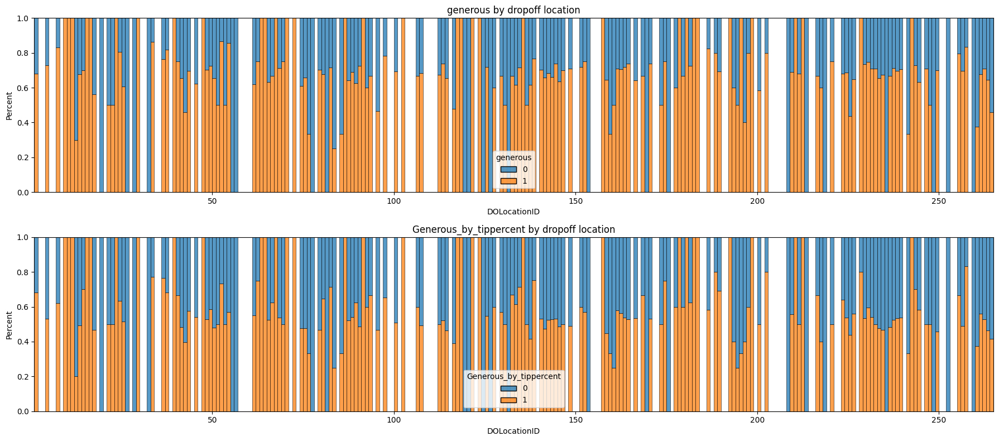

In [141]:
#######################################
#generous/Generous_by_tippercent
#by DOLocationID
#######################################
fig,axs=plt.subplots(2,1,figsize=(18,8))
var_list=['generous', 'Generous_by_tippercent']

for var,ax in zip(var_list,axs.ravel()):
    sns.histplot(data=df_credit, x='DOLocationID', stat='percent', hue=var,
                 binwidth=1,multiple='fill',palette='tab10',ax=ax)
    ax.set_title(f'{var} by dropoff location')
plt.tight_layout()
plt.show()

In [142]:
generous_result=pd.crosstab(df_credit['DOLocationID'],df_credit['generous'],margins=True).reset_index()
generous_result['0_ratio']=generous_result[0]/generous_result['All']
generous_result['1_ratio']=generous_result[1]/generous_result['All']
generous_result['1_logit']=generous_result['1_ratio']/(1-generous_result['1_ratio'])

df_tmp=generous_result.merge(df_taxizone, left_on='DOLocationID', right_on='LocationID')
#drop duplicaed columns
generous_result=df_tmp.drop(columns=['LocationID','service_zone'])

generous_result[generous_result['All']>=30].sort_values(['1_logit'],ascending=False).head(15)

,DOLocationID,0,1,All,0_ratio,1_ratio,1_logit,Borough,Zone
22,33,6,38,44,0.136364,0.863636,6.333333,Brooklyn,Brooklyn Heights
2,7,9,44,53,0.169811,0.830189,4.888889,Queens,Astoria
133,186,71,335,406,0.174877,0.825123,4.718310,Manhattan,Penn Station/Madison Sq West
16,24,8,33,41,0.195122,0.804878,4.125000,Manhattan,Bloomingdale
180,255,14,55,69,0.202899,0.797101,3.928571,Brooklyn,Williamsburg (North Side)
99,138,47,156,203,0.231527,0.768473,3.319149,Queens,LaGuardia Airport
161,230,110,324,434,0.253456,0.746544,2.945455,Manhattan,Times Sq/Theatre District
118,164,78,220,298,0.261745,0.738255,2.820513,Manhattan,Midtown South
122,170,127,358,485,0.261856,0.738144,2.818898,Manhattan,Murray Hill
104,144,41,115,156,0.262821,0.737179,2.804878,Manhattan,Little Italy/NoLiTa


In [143]:
generous_result[generous_result['All']>=30].sort_values(['1_logit'],ascending=True).head(15)

,DOLocationID,0,1,All,0_ratio,1_ratio,1_logit,Borough,Zone
28,42,26,22,48,0.541667,0.458333,0.846154,Manhattan,Central Harlem North
79,116,24,22,46,0.521739,0.478261,0.916667,Manhattan,Hamilton Heights
11,17,14,18,32,0.437500,0.562500,1.285714,Brooklyn,Bedford
17,25,13,20,33,0.393939,0.606061,1.538462,Brooklyn,Boerum Hill
52,74,41,64,105,0.390476,0.609524,1.560976,Manhattan,East Harlem North
98,137,100,160,260,0.384615,0.615385,1.600000,Manhattan,Kips Bay
30,45,14,23,37,0.378378,0.621622,1.642857,Manhattan,Chinatown
45,65,14,24,38,0.368421,0.631579,1.714286,Brooklyn,Downtown Brooklyn/MetroTech
174,244,22,38,60,0.366667,0.633333,1.727273,Manhattan,Washington Heights South
105,145,15,26,41,0.365854,0.634146,1.733333,Queens,Long Island City/Hunters Point


##### generous by pickup dropoff locationid

In [144]:
df_credit['PU_DO_Location']=df_credit['PULocationID'].astype(str)+'_'+df_credit['DOLocationID'].astype(str)
df_credit['PU_DO_zone']=df_credit['Zone_PU']+'_'+df_credit['Zone_DO']
df_credit.head()

,ID,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,PU_hour,DO_hour,PU_day,DO_day,PU_month,DO_month,PU_weekday,DO_weekday,PU_year,PU_weeknum,PU_year_weeknum,PU_nextMonday,PU_date_hour,Borough_PU,Zone_PU,service_zone_PU,Borough_DO,Zone_DO,service_zone_DO,Date,NYC_All_Grades_All_Formulations_Retail_Gasoline_Prices,Year,time,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),apparent_temperature (°C),precipitation (mm),rain (mm),snowfall (cm),snow_depth (m),pressure_msl (hPa),surface_pressure (hPa),cloud_cover (%),cloud_cover_low (%),cloud_cover_mid (%),cloud_cover_high (%),wind_speed_10m (km/h),wind_speed_100m (km/h),wind_direction_10m (°),wind_direction_100m (°),wind_gusts_10m (km/h),PU_DO_Borough,JFK,Newark,OutsideNYC,nighttime,rushhour,duration,duration_sec,avg_speed,fare_per_minute,fare_per_mile,holiday,PU_date,fare_amount_log,am_rush,daytime,pm_rush,PU_hour_class,rush_hour,PU_season,Unnamed: 0,gpb_unit1,gpb_unit2,gpb_unit3,gpb_unit4,gpb_unit5,mean_distance_unit1,mean_distance_unit2,mean_distance_unit3,mean_distance_unit4,mean_distance_unit5,mean_duration_unit1,mean_duration_unit2,mean_duration_unit3,mean_duration_unit4,mean_duration_unit5,mean_speed_unit1,mean_speed_unit2,mean_speed_unit3,mean_speed_unit4,mean_speed_unit5,predict_fare_amount,mean_trip_duration,mean_trip_distance,mean_trip_speed,tip_percent,tip_percent_int,total_fare,cal_tip,tip_diff,total_fare_diff,tip_percent_notax,within_nyc,cal_tip_round_to_0_01,cal_tip_rounddown_to_0_05,Generous_by_tippercent,NGenerous_by_tippercent,generous,not_generous,total_count_PU,Violence_Ratio_PU,Violence_Cnt_PU,Larceny_Ratio_PU,Larceny_Cnt_PU,ViolenceRalated_Ratio_PU,ViolenceRalated_Cnt_PU,diff_Ratio_PU,diff_Cnt_PU,total_count_DO,Violence_Ratio_DO,Violence_Cnt_DO,Larceny_Ratio_DO,Larceny_Cnt_DO,ViolenceRalated_Ratio_DO,ViolenceRalated_Cnt_DO,diff_Ratio_DO,diff_Cnt_DO,PU_DO_Location,PU_DO_zone
0,24870114,2,2017-03-25 08:55:43,2017-03-25 09:09:47,6,3.34,1,N,100,231,1,13.0,0.0,0.5,2.76,0.0,0.3,16.56,8,9,25,25,3,3,Saturday,Saturday,2017,12,2017-12,2017-03-27,2017-03-25-8,Manhattan,Garment District,Yellow Zone,Manhattan,TriBeCa/Civic Center,Yellow Zone,2017-03-27,2.476,2017,2017-03-25 08:00:00,10.6,73,6.0,8.5,0.0,0.0,0.0,0.04,1021.3,1015.1,100,0,79,100,7.4,13.8,309,298,13.3,Manhattan_Manhattan,False,False,False,0,False,14.067,844.0,14.246445,0.924171,3.892216,True,2017-03-25,2.564949,1,0,0,am_rush,0,spring,0,100_231,100_231_8,100_231_Saturday_8,100_231_am_rush,100_231_1_am_rush,3.521667,3.34,3.34,3.340000,3.340,22.847333,14.067000,14.067,14.067000,14.0670,10.679596,14.246445,14.246445,14.246445,14.246445,13.010263,14.067000,3.340000,14.246445,20.0,20,13.8,2.760,0.000,0.000,20.0,True,2.76,2.75,1,0,1,0,1965.0,0.204580,402.0,0.535878,1053.0,0.351145,690.0,0.184733,363.0,1987.0,0.211374,420.0,0.428284,851.0,0.358329,712.0,0.069955,139.0,100_231,Garment District_TriBeCa/Civic Center
1,35634249,1,2017-04-11 14:53:28,2017-04-11 15:19:58,1,1.80,1,N,186,43,1,16.0,0.0,0.5,4.00,0.0,0.3,20.80,14,15,11,11,4,4,Tuesday,Tuesday,2017,15,2017-15,2017-04-17,2017-04-11-14,Manhattan,Penn Station/Madison Sq West,Yellow Zone,Manhattan,Central Park,Yellow Zone,2017-04-17,2.585,2017,2017-04-11 14:00:00,22.3,59,13.8,22.3,0.0,0.0,0.0,0.00,1018.9,1012.9,96,0,0,96,16.8,21.6,149,154,33.1,Manhattan_Manhattan,False,False,False,0,False,26.500,1590.0,4.075472,0.603774,8.888889,False,2017-04-11,2.772589,0,1,0,daytime,0,spring,1,186_43,186_43_14,186_43_Tuesday_14,186_43_daytime,186_43_0_daytime,3.108889,2.65,1.80,3.095000,1.800,24.470333,22.700000,26.500,23.283250,26.5000,8.310050,7.593291,4.075472,8.296162,4.075472,16.265126,23.283250,3.095000,8.296162,23.8,24,16.8,4.032,0.032,0.133,23.8,True,4.03,4.00,1,0,1,0,2256.0,0.143617,324.0,0.731383,1650.0,0.210993,476.0,0.520390,1174.0,631.0,0.335975,212.0,0.353407,223.0,0.534073

In [145]:
generous_result=pd.crosstab(df_credit['PU_DO_zone'],df_credit['generous'],margins=True).reset_index()
generous_result['0_ratio']=generous_result[0]/generous_result['All']
generous_result['1_ratio']=generous_result[1]/generous_result['All']
generous_result['1_logit']=generous_result['1_ratio']/(1-generous_result['1_ratio'])

generous_result[generous_result['All']>=20].sort_values(['1_logit'],ascending=False).head(15)

generous,PU_DO_zone,0,1,All,0_ratio,1_ratio,1_logit
2330,Penn Station/Madison Sq West_Midtown Center,3,22,25,0.120000,0.880000,7.333333
2582,Times Sq/Theatre District_Lincoln Square East,3,22,25,0.120000,0.880000,7.333333
1908,Midtown Center_Midtown North,3,21,24,0.125000,0.875000,7.000000
2853,Upper East Side North_East Harlem South,3,20,23,0.130435,0.869565,6.666667
2226,Murray Hill_Midtown East,4,26,30,0.133333,0.866667,6.500000
2350,Penn Station/Madison Sq West_Times Sq/Theatre ...,5,32,37,0.135135,0.864865,6.400000
2516,Sutton Place/Turtle Bay North_Kips Bay,3,19,22,0.136364,0.863636,6.333333
859,Garment District_Times Sq/Theatre District,3,19,22,0.136364,0.863636,6.333333
1529,Lenox Hill West_Upper East Side South,3,18,21,0.142857,0.857143,6.000000
2836,Union Sq_West Village,3,18,21,0.142857,0.857143,6.000000


In [146]:
generous_result[generous_result['All']>=20].sort_values(['1_logit'],ascending=True).head(15)

generous,PU_DO_zone,0,1,All,0_ratio,1_ratio,1_logit
1543,Lincoln Square East_Clinton East,13,10,23,0.565217,0.434783,0.769231
2215,Murray Hill_Kips Bay,11,10,21,0.523810,0.476190,0.909091
618,East Village_Union Sq,10,10,20,0.500000,0.500000,1.000000
2001,Midtown East_Upper East Side North,11,11,22,0.500000,0.500000,1.000000
2120,Midtown South_Midtown Center,13,14,27,0.481481,0.518519,1.076923
1528,Lenox Hill West_Upper East Side North,16,18,34,0.470588,0.529412,1.125000
2875,Upper East Side North_Midtown East,11,13,24,0.458333,0.541667,1.181818
2970,Upper East Side South_Yorkville West,10,12,22,0.454545,0.545455,1.200000
933,Gramercy_Union Sq,10,13,23,0.434783,0.565217,1.300000
2866,Upper East Side North_Lenox Hill West,12,16,28,0.428571,0.571429,1.333333


##### generous by season

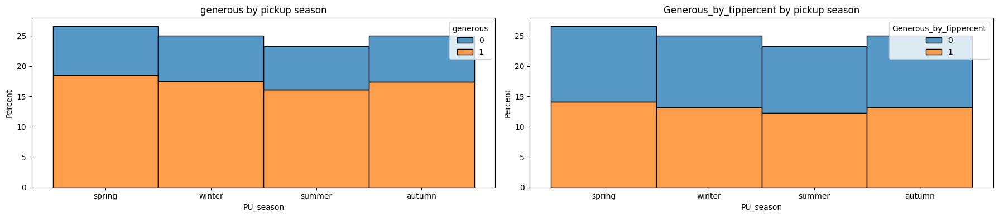

In [147]:
#######################################
#generous/Generous_by_tippercent
#by season
#######################################
fig,axs=plt.subplots(1,2,figsize=(18,4))
var_list=['generous', 'Generous_by_tippercent']

for var,ax in zip(var_list,axs.ravel()):
    sns.histplot(data=df_credit, x='PU_season', stat='percent', hue=var,
                 binwidth=1,palette='tab10',multiple='stack',ax=ax)
    ax.set_title(f'{var} by pickup season')
plt.tight_layout()
plt.show()

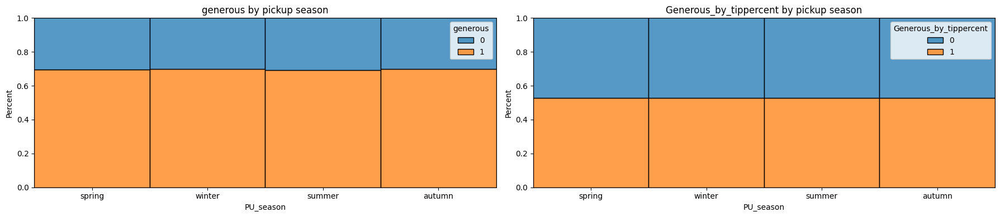

In [148]:
#######################################
#generous/Generous_by_tippercent
#by season
#######################################
fig,axs=plt.subplots(1,2,figsize=(18,4))
var_list=['generous', 'Generous_by_tippercent']

for var,ax in zip(var_list,axs.ravel()):
    sns.histplot(data=df_credit, x='PU_season', stat='percent', hue=var,
                 binwidth=1,palette='tab10',multiple='fill',ax=ax)
    ax.set_title(f'{var} by pickup season')
plt.tight_layout()
plt.show()

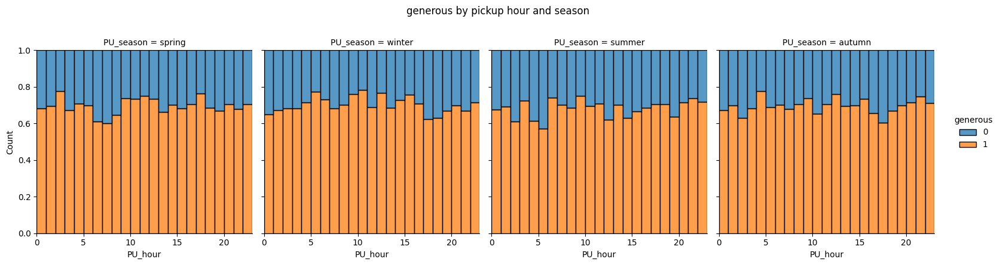

In [149]:
#######################################
#P(generous | PU_hour&PU_season)
#######################################
sns.displot(
    data=df_credit, x="PU_hour", hue="generous", col="PU_season",
    kind="hist", height=4, aspect=1,binwidth=1,multiple='fill',palette='tab10'
)
plt.suptitle('generous by pickup hour and season',y=1.1)
plt.show()

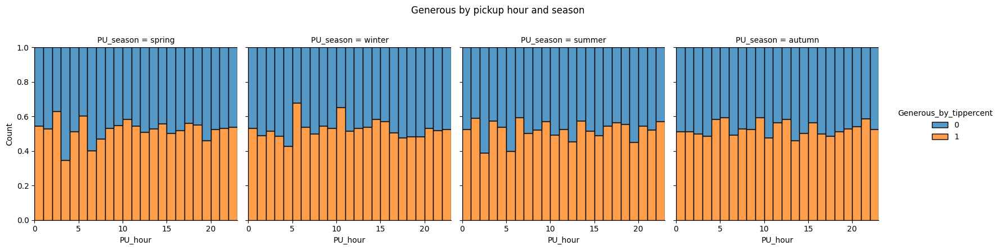

In [150]:
#######################################
#P(Generous_by_tippercent | PU_hour&PU_season)
#######################################
sns.displot(
    data=df_credit, x="PU_hour", hue="Generous_by_tippercent", col="PU_season",
    kind="hist", height=4, aspect=1,binwidth=1,multiple='fill',palette='tab10'
)
plt.suptitle('Generous by pickup hour and season',y=1.1)
plt.show()

##### generous by duration

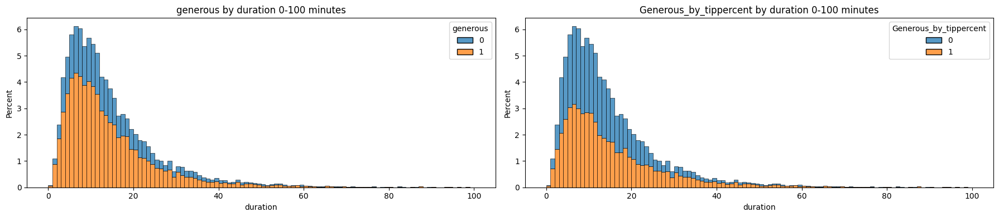

In [151]:
#######################################
#generous/Generous_by_tippercent
#by duration
#######################################
fig,axs=plt.subplots(1,2,figsize=(18,4))
var_list=['generous', 'Generous_by_tippercent']

for var,ax in zip(var_list,axs.ravel()):
    sns.histplot(data=df_credit, x='duration', stat='percent', hue=var,
                 binwidth=1,palette='tab10',multiple='stack',ax=ax,binrange=(0,100))
    ax.set_title(f'{var} by duration 0-100 minutes')
plt.tight_layout()
plt.show()

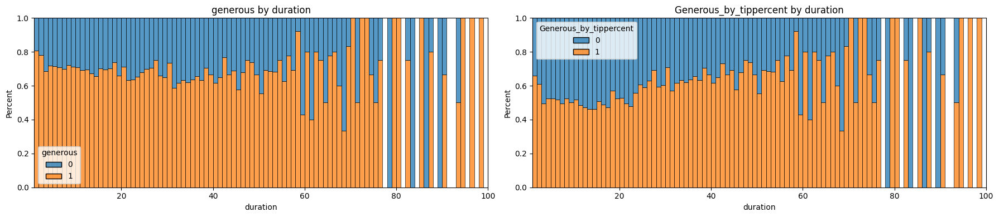

In [152]:
#######################################
#generous/Generous_by_tippercent
#by duration
#######################################
fig,axs=plt.subplots(1,2,figsize=(18,4))
var_list=['generous', 'Generous_by_tippercent']

for var,ax in zip(var_list,axs.ravel()):
    sns.histplot(data=df_credit, x='duration', stat='percent', hue=var,
                 binwidth=1,multiple='fill',palette='tab10',ax=ax,binrange=(1,100))
    ax.set_title(f'{var} by duration')
plt.tight_layout()
plt.show()

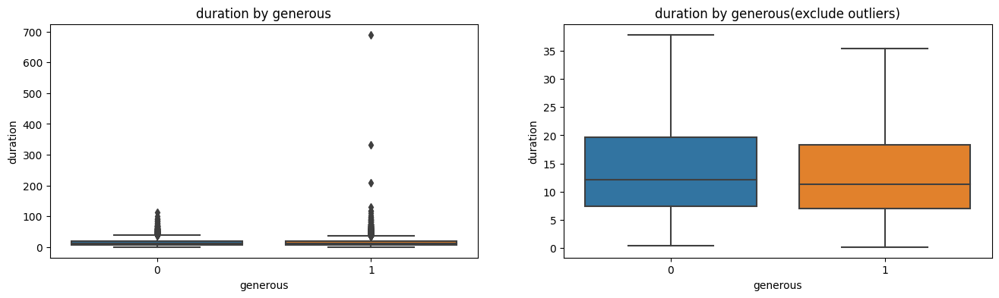

In [153]:
fig,axs=plt.subplots(1,2,figsize=(16,4))

sns.boxplot(data=df_credit, y="duration",x="generous",ax=axs[0])
sns.boxplot(data=df_credit, y="duration",x="generous",showfliers=False,ax=axs[1])
axs[0].set_title('duration by generous')
axs[1].set_title('duration by generous(exclude outliers)')
plt.show()

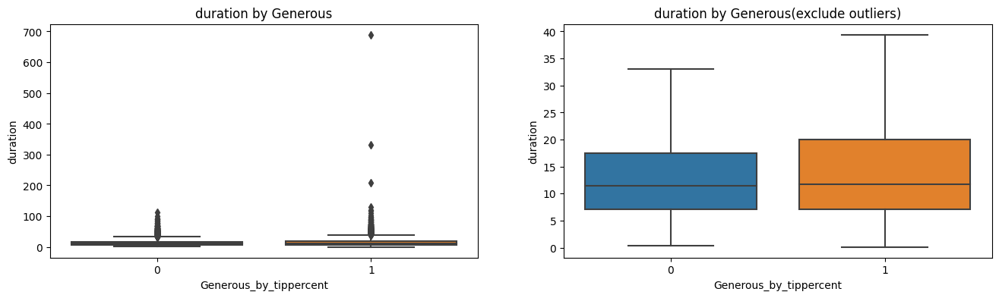

In [154]:
fig,axs=plt.subplots(1,2,figsize=(16,4))

sns.boxplot(data=df_credit, y="duration",x="Generous_by_tippercent",ax=axs[0])
sns.boxplot(data=df_credit, y="duration",x="Generous_by_tippercent",showfliers=False,ax=axs[1])
axs[0].set_title('duration by Generous')
axs[1].set_title('duration by Generous(exclude outliers)')
plt.show()

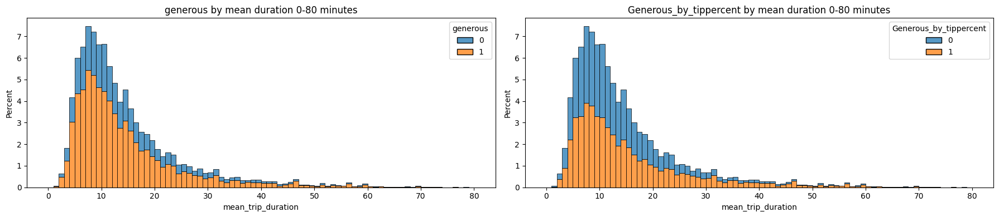

In [155]:
#######################################
#generous/Generous_by_tippercent
#by mean_trip_duration
#######################################
fig,axs=plt.subplots(1,2,figsize=(18,4))
var_list=['generous', 'Generous_by_tippercent']

for var,ax in zip(var_list,axs.ravel()):
    sns.histplot(data=df_credit, x='mean_trip_duration', stat='percent', hue=var,
                 binwidth=1,palette='tab10',multiple='stack',ax=ax,binrange=(0,80))
    ax.set_title(f'{var} by mean duration 0-80 minutes')
plt.tight_layout()
plt.show()

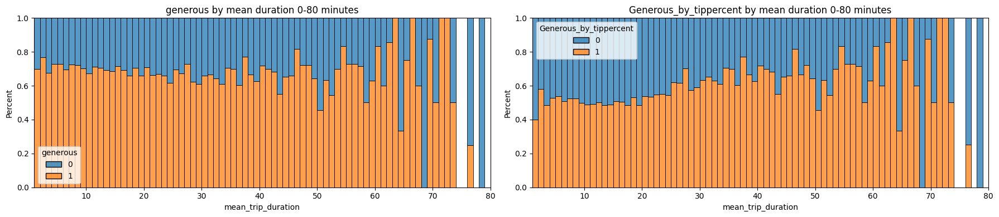

In [156]:
#######################################
#generous/Generous_by_tippercent
#by mean_trip_duration
#######################################
fig,axs=plt.subplots(1,2,figsize=(18,4))
var_list=['generous', 'Generous_by_tippercent']

for var,ax in zip(var_list,axs.ravel()):
    sns.histplot(data=df_credit, x='mean_trip_duration', stat='percent', hue=var,
                 binwidth=1,multiple='fill',palette='tab10',ax=ax,binrange=(1,80))
    ax.set_title(f'{var} by mean duration 0-80 minutes')
plt.tight_layout()
plt.show()

##### generous by trip_distance

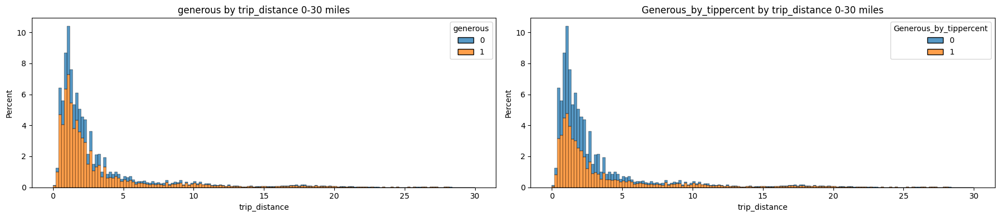

In [157]:
#######################################
#generous/Generous_by_tippercent
#by trip_distance
#######################################
fig,axs=plt.subplots(1,2,figsize=(18,4))
var_list=['generous', 'Generous_by_tippercent']

for var,ax in zip(var_list,axs.ravel()):
    sns.histplot(data=df_credit, x='trip_distance', stat='percent', hue=var,
                 binwidth=0.2,palette='tab10',multiple='stack',ax=ax,binrange=(0,30))
    ax.set_title(f'{var} by trip_distance 0-30 miles')
plt.tight_layout()
plt.show()

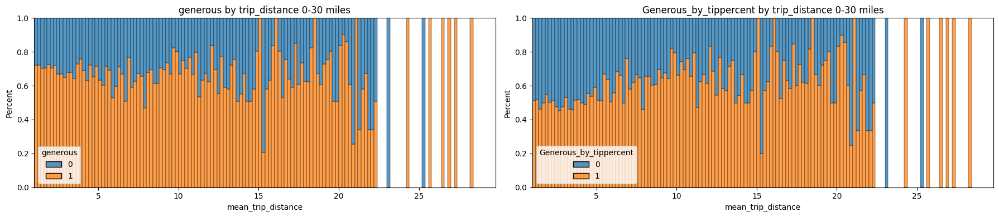

In [158]:
#######################################
#generous/Generous_by_tippercent
#by trip_distance
#######################################
fig,axs=plt.subplots(1,2,figsize=(18,4))
var_list=['generous', 'Generous_by_tippercent']

for var,ax in zip(var_list,axs.ravel()):
    sns.histplot(data=df_credit, x='mean_trip_distance', stat='percent', hue=var,
                 binwidth=0.2,multiple='fill',palette='tab10',ax=ax,binrange=(1,30))
    ax.set_title(f'{var} by trip_distance 0-30 miles')
plt.tight_layout()
plt.show()

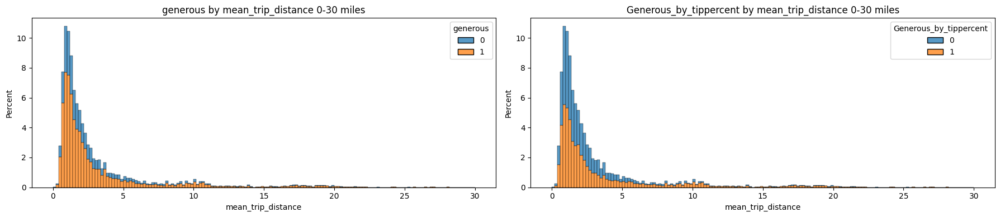

In [159]:
#######################################
#generous/Generous_by_tippercent
#by mean_trip_distance
#######################################
fig,axs=plt.subplots(1,2,figsize=(18,4))
var_list=['generous', 'Generous_by_tippercent']

for var,ax in zip(var_list,axs.ravel()):
    sns.histplot(data=df_credit, x='mean_trip_distance', stat='percent', hue=var,
                 binwidth=0.2,palette='tab10',multiple='stack',ax=ax,binrange=(0,30))
    ax.set_title(f'{var} by mean_trip_distance 0-30 miles')
plt.tight_layout()
plt.show()

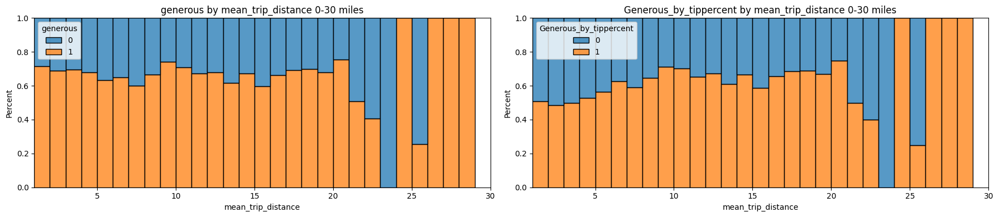

In [160]:
#######################################
#generous/Generous_by_tippercent
#by trip_distance
#######################################
fig,axs=plt.subplots(1,2,figsize=(18,4))
var_list=['generous', 'Generous_by_tippercent']

for var,ax in zip(var_list,axs.ravel()):
    sns.histplot(data=df_credit, x='mean_trip_distance', stat='percent', hue=var,
                 binwidth=1,multiple='fill',palette='tab10',ax=ax,binrange=(1,30))
    ax.set_title(f'{var} by mean_trip_distance 0-30 miles')
plt.tight_layout()
plt.show()

##### generous by fare_amount

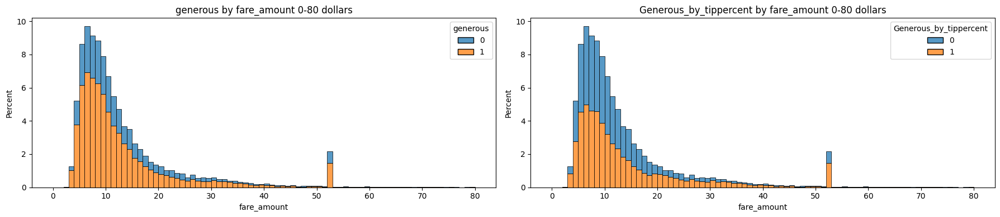

In [161]:
#######################################
#generous/Generous_by_tippercent
#by fare_amount
#######################################
fig,axs=plt.subplots(1,2,figsize=(18,4))
var_list=['generous', 'Generous_by_tippercent']

for var,ax in zip(var_list,axs.ravel()):
    sns.histplot(data=df_credit, x='fare_amount', stat='percent', hue=var,
                 binwidth=1,palette='tab10',multiple='stack',ax=ax,binrange=(0,80))
    ax.set_title(f'{var} by fare_amount 0-80 dollars')
plt.tight_layout()
plt.show()

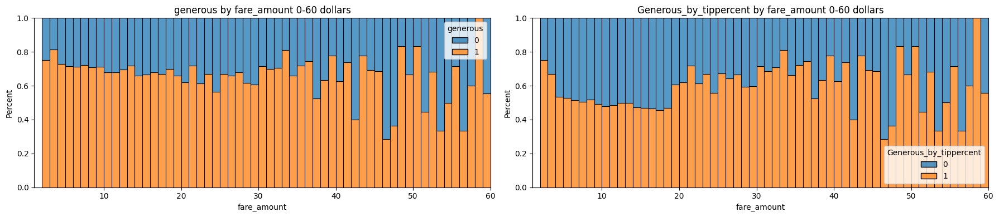

In [162]:
#######################################
#generous/Generous_by_tippercent
#by fare_amount
#######################################
fig,axs=plt.subplots(1,2,figsize=(18,4))
var_list=['generous', 'Generous_by_tippercent']

for var,ax in zip(var_list,axs.ravel()):
    sns.histplot(data=df_credit, x='fare_amount', stat='percent', hue=var,
                 binwidth=1,multiple='fill',palette='tab10',ax=ax,binrange=(1,60))
    ax.set_title(f'{var} by fare_amount 0-60 dollars')
plt.tight_layout()
plt.show()

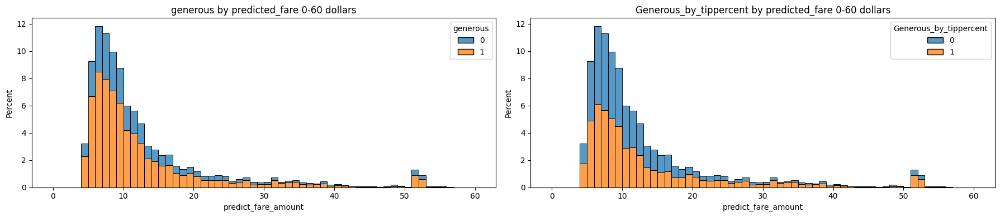

In [163]:
#######################################
#generous/Generous_by_tippercent
#by predict_fare_amount
#######################################
fig,axs=plt.subplots(1,2,figsize=(18,4))
var_list=['generous', 'Generous_by_tippercent']

for var,ax in zip(var_list,axs.ravel()):
    sns.histplot(data=df_credit, x='predict_fare_amount', stat='percent', hue=var,
                 binwidth=1,palette='tab10',multiple='stack',ax=ax,binrange=(0,60))
    ax.set_title(f'{var} by predicted_fare 0-60 dollars')
plt.tight_layout()
plt.show()

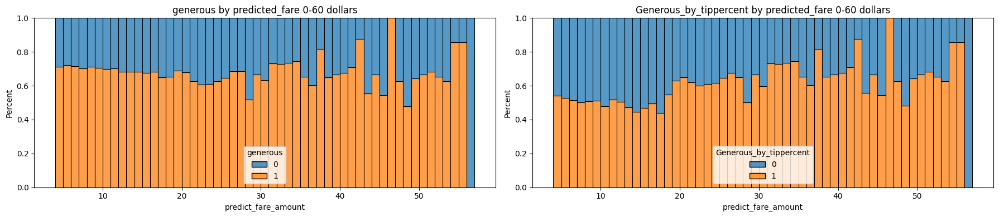

In [164]:
#######################################
#generous/Generous_by_tippercent
#by predict_fare_amount
#######################################
fig,axs=plt.subplots(1,2,figsize=(18,4))
var_list=['generous', 'Generous_by_tippercent']

for var,ax in zip(var_list,axs.ravel()):
    sns.histplot(data=df_credit, x='predict_fare_amount', stat='percent', hue=var,
                 binwidth=1,multiple='fill',palette='tab10',ax=ax,binrange=(1,60))
    ax.set_title(f'{var} by predicted_fare 0-60 dollars')
plt.tight_layout()
plt.show()

##### generous by total_fare(total_amount-tip_amount)

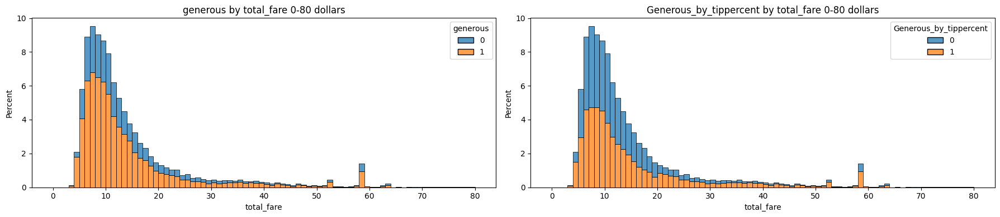

In [165]:
#######################################
#generous/Generous_by_tippercent
#by total_fare
#######################################
fig,axs=plt.subplots(1,2,figsize=(18,4))
var_list=['generous', 'Generous_by_tippercent']

for var,ax in zip(var_list,axs.ravel()):
    sns.histplot(data=df_credit, x='total_fare', stat='percent', hue=var,
                 binwidth=1,palette='tab10',multiple='stack',ax=ax,binrange=(0,80))
    ax.set_title(f'{var} by total_fare 0-80 dollars')
plt.tight_layout()
plt.show()

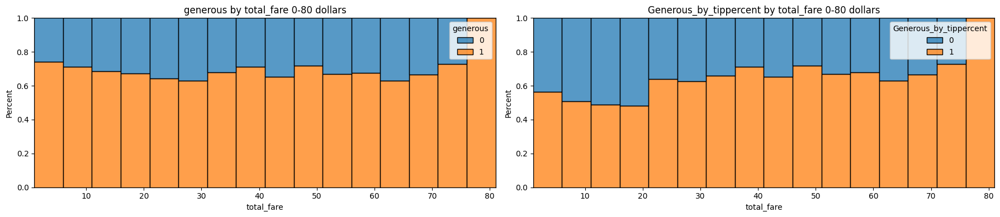

In [166]:
#######################################
#generous/Generous_by_tippercent
#by total_fare
#######################################
fig,axs=plt.subplots(1,2,figsize=(18,4))
var_list=['generous', 'Generous_by_tippercent']

for var,ax in zip(var_list,axs.ravel()):
    sns.histplot(data=df_credit, x='total_fare', stat='percent', hue=var,
                 binwidth=5,multiple='fill',palette='tab10',ax=ax,binrange=(1,80))
    ax.set_title(f'{var} by total_fare 0-80 dollars')
plt.tight_layout()
plt.show()

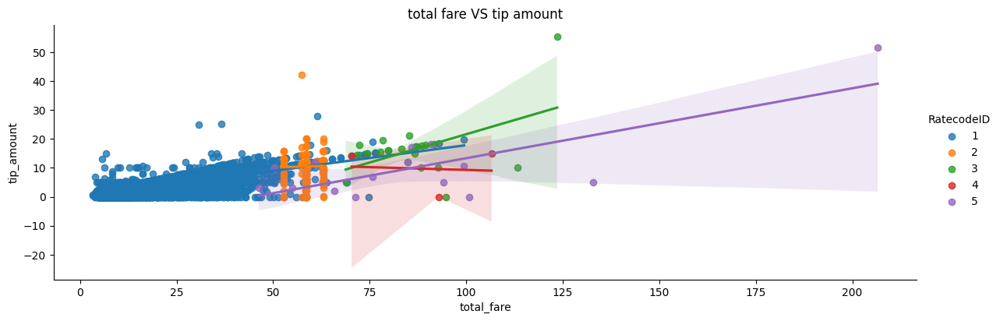

In [167]:
##############################################
#total fare VS tip amount
##############################################
sns.lmplot(data=df_credit, x="total_fare", y="tip_amount",hue='RatecodeID',height=4,aspect=3)
plt.title('total fare VS tip amount')
plt.show()

##### generous by passenger_count

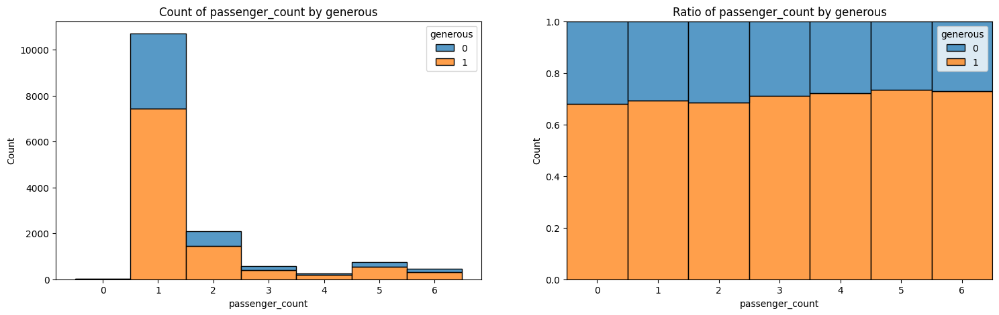

In [168]:
################################################
#passenger_count and generous
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='passenger_count',hue='generous',multiple='stack',discrete=True,ax=axes[0])
sns.histplot(data=df_credit,x='passenger_count',hue='generous',multiple='fill',discrete=True,ax=axes[1])
axes[0].set_title('Count of passenger_count by generous')
axes[1].set_title('Ratio of passenger_count by generous')
plt.show()

##### generous by VendorID

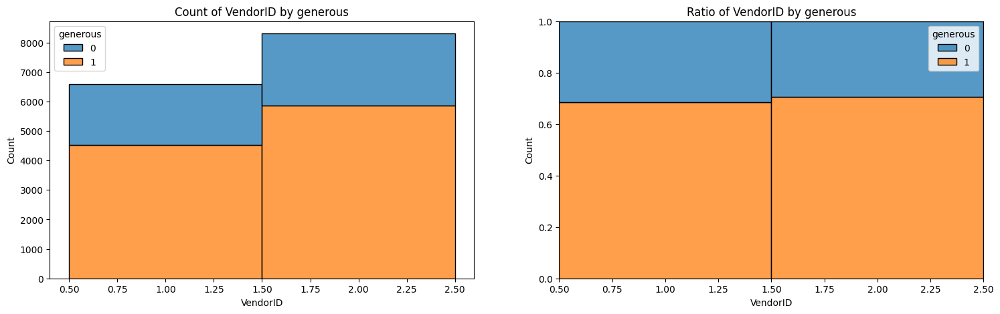

In [169]:
################################################
#VendorID and generous
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='VendorID',hue='generous',multiple='stack',discrete=True,ax=axes[0])
sns.histplot(data=df_credit,x='VendorID',hue='generous',multiple='fill',discrete=True,ax=axes[1])
axes[0].set_title('Count of VendorID by generous')
axes[1].set_title('Ratio of VendorID by generous')
plt.show()

#=>Vendor1 and Vendor2 had equal generous ratio

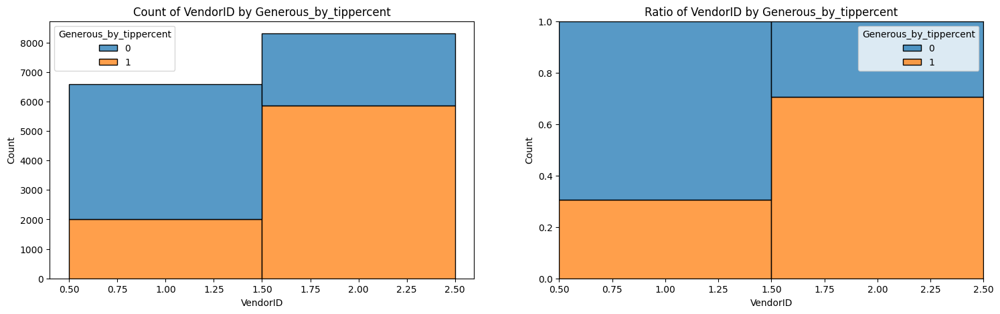

In [170]:
################################################
#VendorID and Generous_by_tippercent
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='VendorID',hue='Generous_by_tippercent',multiple='stack',discrete=True,ax=axes[0])
sns.histplot(data=df_credit,x='VendorID',hue='Generous_by_tippercent',multiple='fill',discrete=True,ax=axes[1])
axes[0].set_title('Count of VendorID by Generous_by_tippercent')
axes[1].set_title('Ratio of VendorID by Generous_by_tippercent')
plt.show()

#=>Vendor2 had higher generous ratio than Vendor2

##### generous by RatecodeID

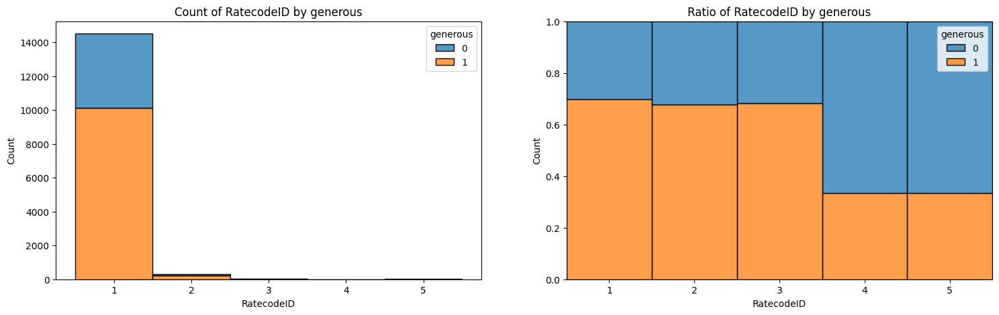

In [171]:
################################################
#RatecodeID and generous
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='RatecodeID',hue='generous',multiple='stack',discrete=True,ax=axes[0])
sns.histplot(data=df_credit,x='RatecodeID',hue='generous',multiple='fill',discrete=True,ax=axes[1])
axes[0].set_title('Count of RatecodeID by generous')
axes[1].set_title('Ratio of RatecodeID by generous')
plt.show()

#=>RatecodeID=4 or 5 had lower generous ratio

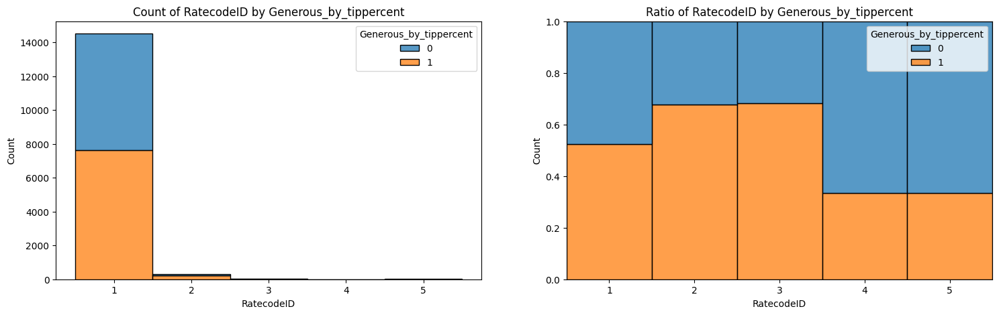

In [172]:
################################################
#RatecodeID and Generous_by_tippercent
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='RatecodeID',hue='Generous_by_tippercent',multiple='stack',discrete=True,ax=axes[0])
sns.histplot(data=df_credit,x='RatecodeID',hue='Generous_by_tippercent',multiple='fill',discrete=True,ax=axes[1])
axes[0].set_title('Count of RatecodeID by Generous_by_tippercent')
axes[1].set_title('Ratio of RatecodeID by Generous_by_tippercent')
plt.show()

#=>RatecodeID=4 or 5 had lower generous ratio

##### generous by PU_hour_class

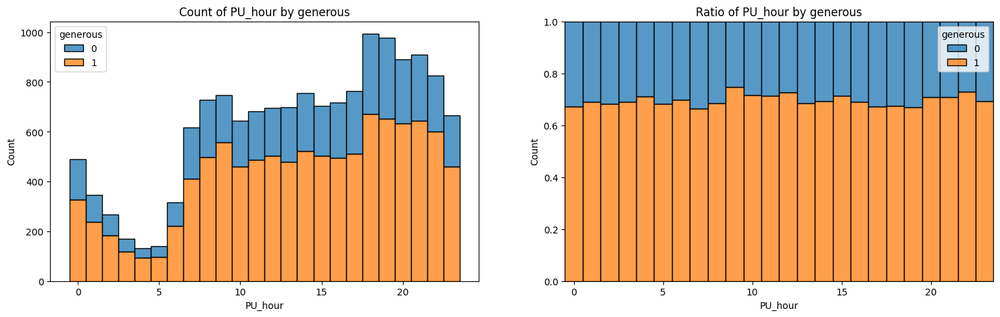

In [173]:
################################################
#PU_hour and generous
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='PU_hour',hue='generous',multiple='stack',discrete=True,ax=axes[0])
sns.histplot(data=df_credit,x='PU_hour',hue='generous',multiple='fill',discrete=True,ax=axes[1])
axes[0].set_title('Count of PU_hour by generous')
axes[1].set_title('Ratio of PU_hour by generous')
plt.show()

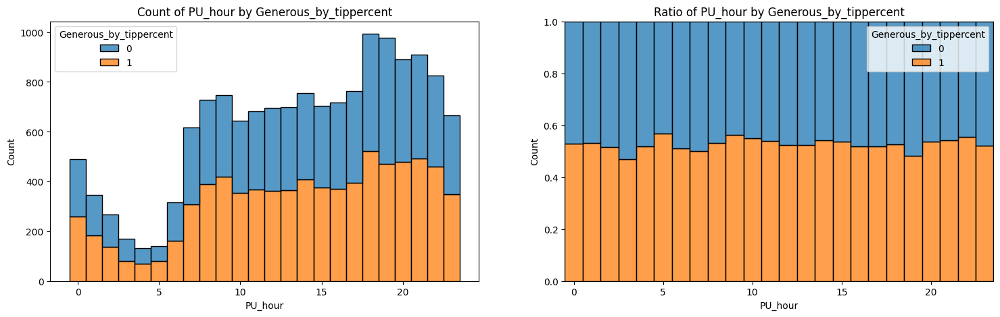

In [174]:
################################################
#PU_hour and Generous_by_tippercent
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='PU_hour',hue='Generous_by_tippercent',multiple='stack',discrete=True,ax=axes[0])
sns.histplot(data=df_credit,x='PU_hour',hue='Generous_by_tippercent',multiple='fill',discrete=True,ax=axes[1])
axes[0].set_title('Count of PU_hour by Generous_by_tippercent')
axes[1].set_title('Ratio of PU_hour by Generous_by_tippercent')
plt.show()

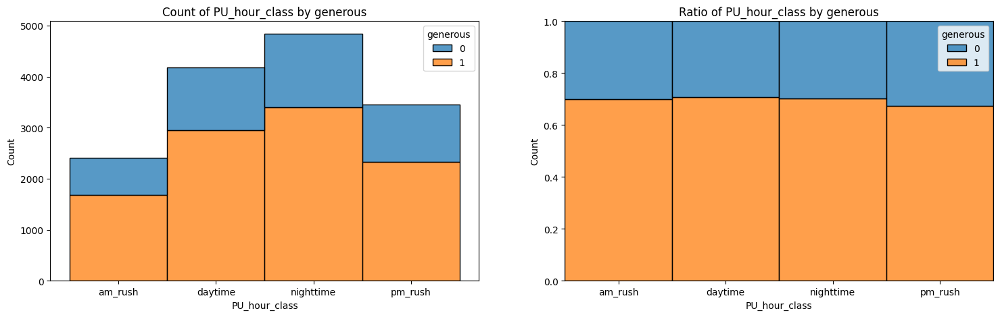

In [175]:
################################################
#PU_hour_class and generous
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='PU_hour_class',hue='generous',multiple='stack',discrete=True,ax=axes[0])
sns.histplot(data=df_credit,x='PU_hour_class',hue='generous',multiple='fill',discrete=True,ax=axes[1])
axes[0].set_title('Count of PU_hour_class by generous')
axes[1].set_title('Ratio of PU_hour_class by generous')
plt.show()

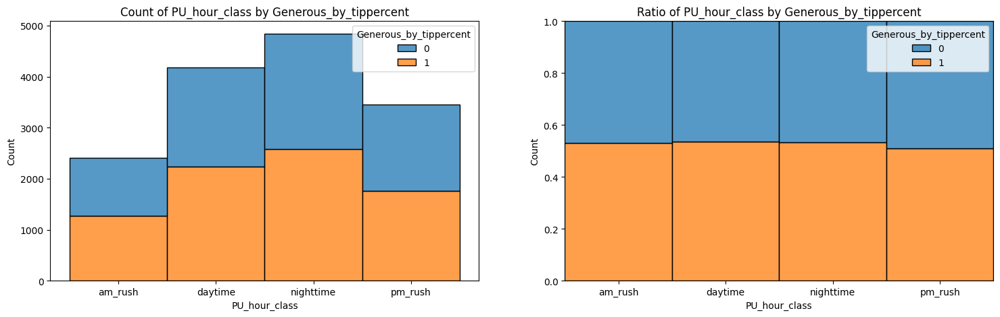

In [176]:
################################################
#PU_hour_class and Generous_by_tippercent
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='PU_hour_class',hue='Generous_by_tippercent',multiple='stack',discrete=True,ax=axes[0])
sns.histplot(data=df_credit,x='PU_hour_class',hue='Generous_by_tippercent',multiple='fill',discrete=True,ax=axes[1])
axes[0].set_title('Count of PU_hour_class by Generous_by_tippercent')
axes[1].set_title('Ratio of PU_hour_class by Generous_by_tippercent')
plt.show()

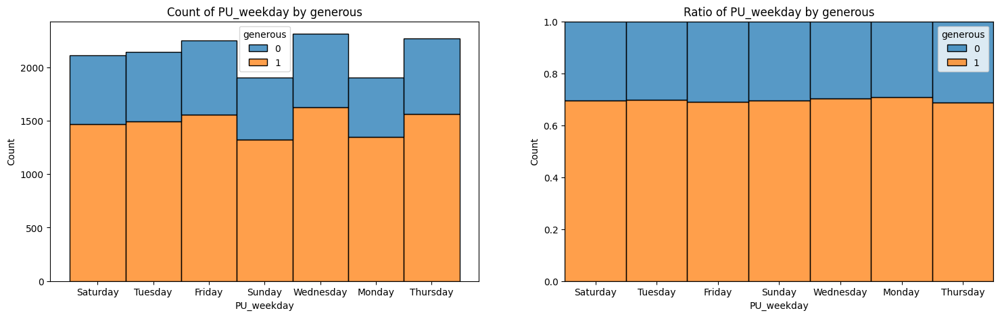

In [177]:
################################################
#PU_weekday and generous
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='PU_weekday',hue='generous',multiple='stack',discrete=True,ax=axes[0])
sns.histplot(data=df_credit,x='PU_weekday',hue='generous',multiple='fill',discrete=True,ax=axes[1])
axes[0].set_title('Count of PU_weekday by generous')
axes[1].set_title('Ratio of PU_weekday by generous')
plt.show()

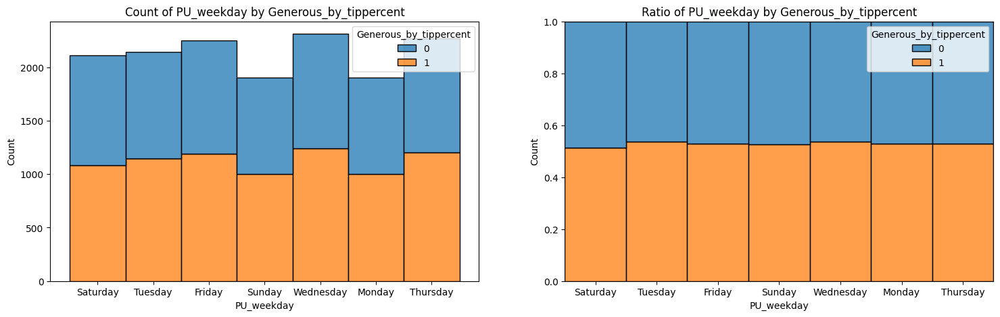

In [178]:
################################################
#PU_weekday and Generous_by_tippercent
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='PU_weekday',hue='Generous_by_tippercent',multiple='stack',discrete=True,ax=axes[0])
sns.histplot(data=df_credit,x='PU_weekday',hue='Generous_by_tippercent',multiple='fill',discrete=True,ax=axes[1])
axes[0].set_title('Count of PU_weekday by Generous_by_tippercent')
axes[1].set_title('Ratio of PU_weekday by Generous_by_tippercent')
plt.show()

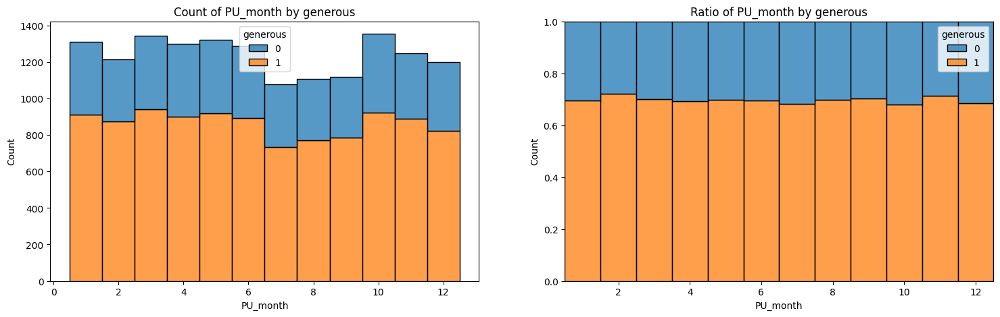

In [179]:
################################################
#PU_month and generous
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='PU_month',hue='generous',multiple='stack',discrete=True,ax=axes[0])
sns.histplot(data=df_credit,x='PU_month',hue='generous',multiple='fill',discrete=True,ax=axes[1])
axes[0].set_title('Count of PU_month by generous')
axes[1].set_title('Ratio of PU_month by generous')
plt.show()

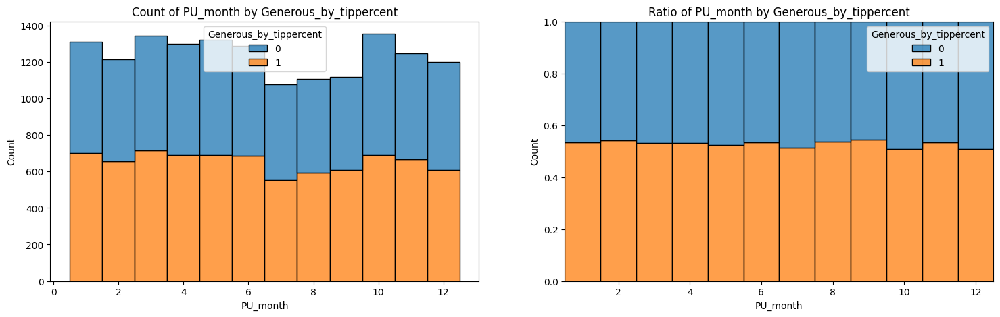

In [180]:
################################################
#PU_month and Generous_by_tippercent
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='PU_month',hue='Generous_by_tippercent',multiple='stack',discrete=True,ax=axes[0])
sns.histplot(data=df_credit,x='PU_month',hue='Generous_by_tippercent',multiple='fill',discrete=True,ax=axes[1])
axes[0].set_title('Count of PU_month by Generous_by_tippercent')
axes[1].set_title('Ratio of PU_month by Generous_by_tippercent')
plt.show()

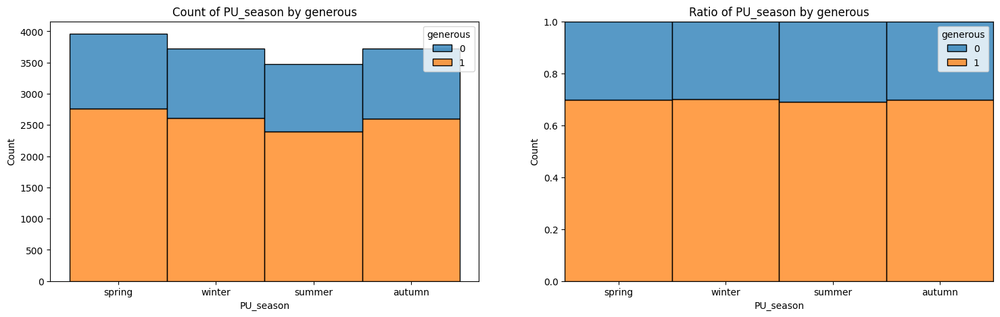

In [181]:
################################################
#PU_season and generous
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='PU_season',hue='generous',multiple='stack',discrete=True,ax=axes[0])
sns.histplot(data=df_credit,x='PU_season',hue='generous',multiple='fill',discrete=True,ax=axes[1])
axes[0].set_title('Count of PU_season by generous')
axes[1].set_title('Ratio of PU_season by generous')
plt.show()

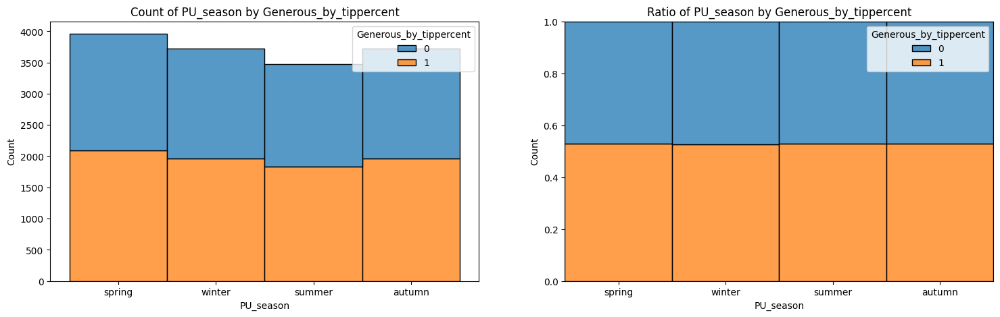

In [182]:
################################################
#PU_season and Generous_by_tippercent
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='PU_season',hue='Generous_by_tippercent',multiple='stack',discrete=True,ax=axes[0])
sns.histplot(data=df_credit,x='PU_season',hue='Generous_by_tippercent',multiple='fill',discrete=True,ax=axes[1])
axes[0].set_title('Count of PU_season by Generous_by_tippercent')
axes[1].set_title('Ratio of PU_season by Generous_by_tippercent')
plt.show()

##### generous by holiday

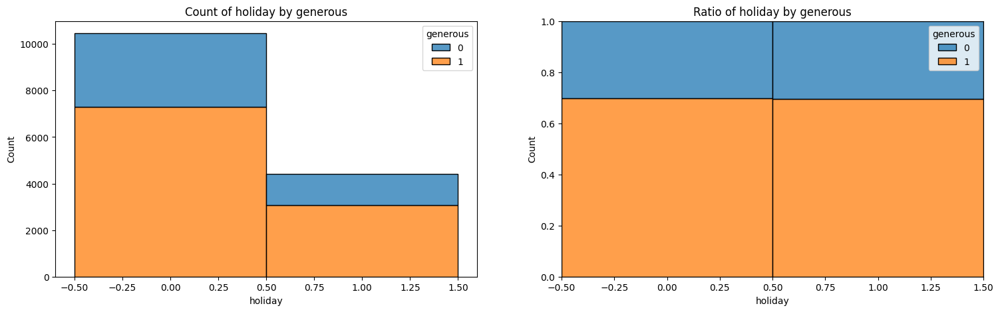

In [183]:
################################################
#holiday and generous
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='holiday',hue='generous',multiple='stack',discrete=True,ax=axes[0])
sns.histplot(data=df_credit,x='holiday',hue='generous',multiple='fill',discrete=True,ax=axes[1])
axes[0].set_title('Count of holiday by generous')
axes[1].set_title('Ratio of holiday by generous')
plt.show()

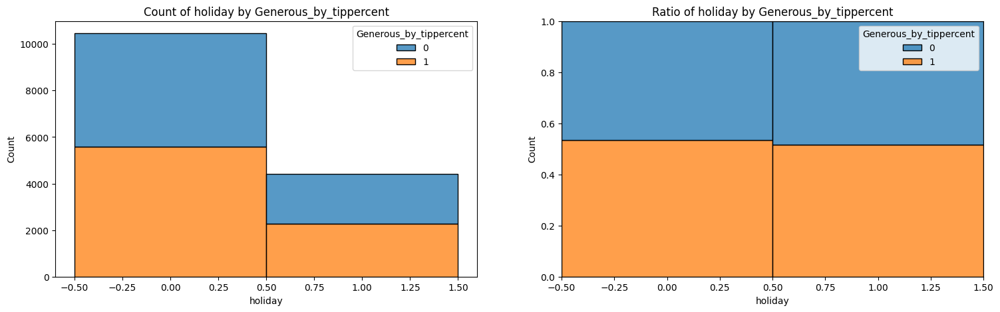

In [184]:
################################################
#holiday and Generous_by_tippercent
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='holiday',hue='Generous_by_tippercent',multiple='stack',discrete=True,ax=axes[0])
sns.histplot(data=df_credit,x='holiday',hue='Generous_by_tippercent',multiple='fill',discrete=True,ax=axes[1])
axes[0].set_title('Count of holiday by Generous_by_tippercent')
axes[1].set_title('Ratio of holiday by Generous_by_tippercent')
plt.show()

##### generous by within_nyc

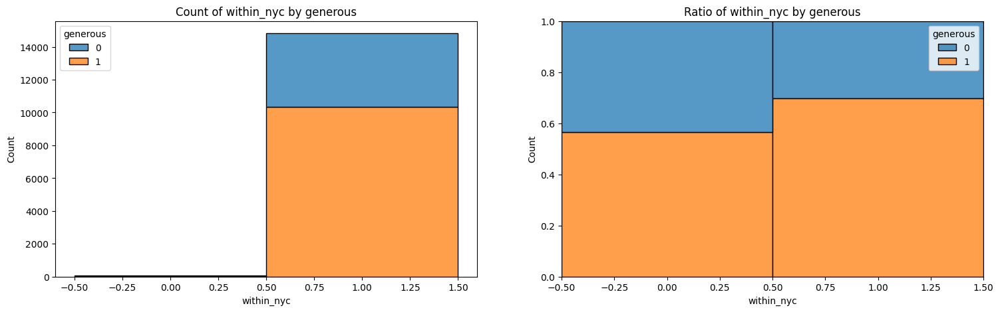

In [185]:
################################################
#within_nyc and generous
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='within_nyc',hue='generous',multiple='stack',discrete=True,ax=axes[0])
sns.histplot(data=df_credit,x='within_nyc',hue='generous',multiple='fill',discrete=True,ax=axes[1])
axes[0].set_title('Count of within_nyc by generous')
axes[1].set_title('Ratio of within_nyc by generous')
plt.show()

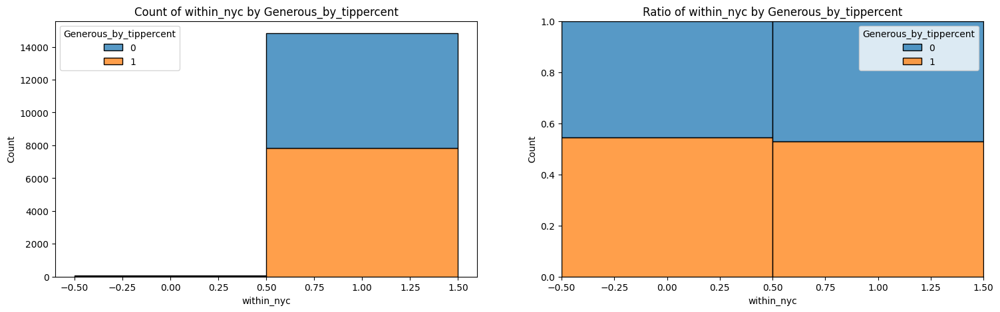

In [186]:
################################################
#within_nyc and Generous_by_tippercent
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='within_nyc',hue='Generous_by_tippercent',multiple='stack',discrete=True,ax=axes[0],palette='tab10')
sns.histplot(data=df_credit,x='within_nyc',hue='Generous_by_tippercent',multiple='fill',discrete=True,ax=axes[1],palette='tab10')
axes[0].set_title('Count of within_nyc by Generous_by_tippercent')
axes[1].set_title('Ratio of within_nyc by Generous_by_tippercent')
plt.show() 

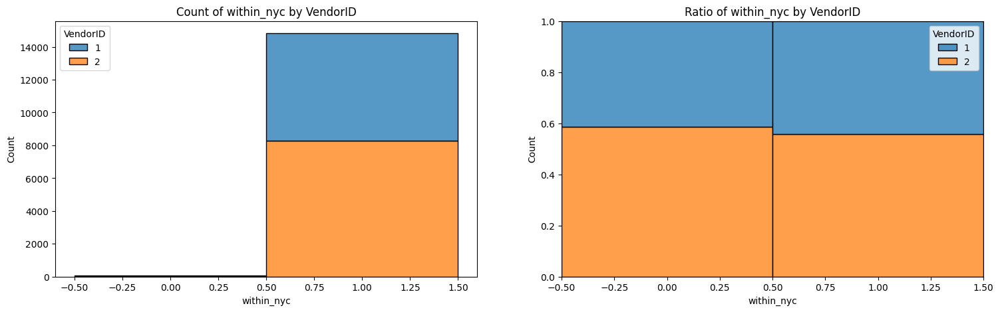

In [187]:
################################################
#within_nyc and VendorID
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='within_nyc',hue='VendorID',multiple='stack',discrete=True,ax=axes[0],palette='tab10')
sns.histplot(data=df_credit,x='within_nyc',hue='VendorID',multiple='fill',discrete=True,ax=axes[1],palette='tab10')
axes[0].set_title('Count of within_nyc by VendorID')
axes[1].set_title('Ratio of within_nyc by VendorID')
plt.show()

#=>Vendor2 seemed to have higher out of nyc trips ratio than Vendor1

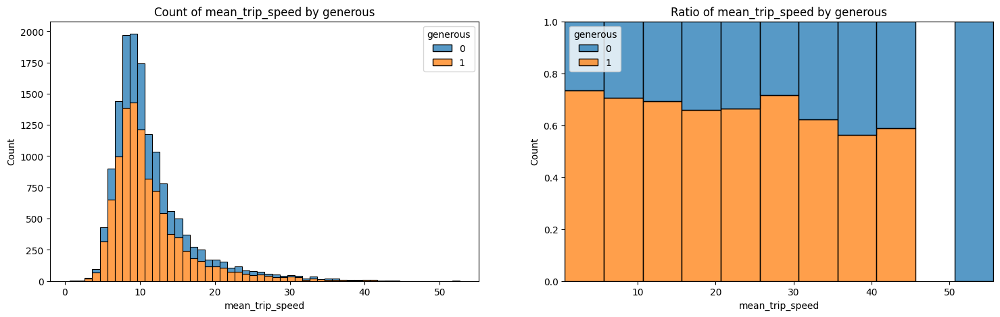

In [188]:
################################################
#mean_trip_speed and generous
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='mean_trip_speed',hue='generous',multiple='stack',binwidth=1,ax=axes[0])
sns.histplot(data=df_credit,x='mean_trip_speed',hue='generous',multiple='fill',binwidth=5,ax=axes[1])
axes[0].set_title('Count of mean_trip_speed by generous')
axes[1].set_title('Ratio of mean_trip_speed by generous')
plt.show()

#=>As mean_trip_speed went up generous ratio tend to decrease
#=>maybe mean_trip_speed associated with location, time

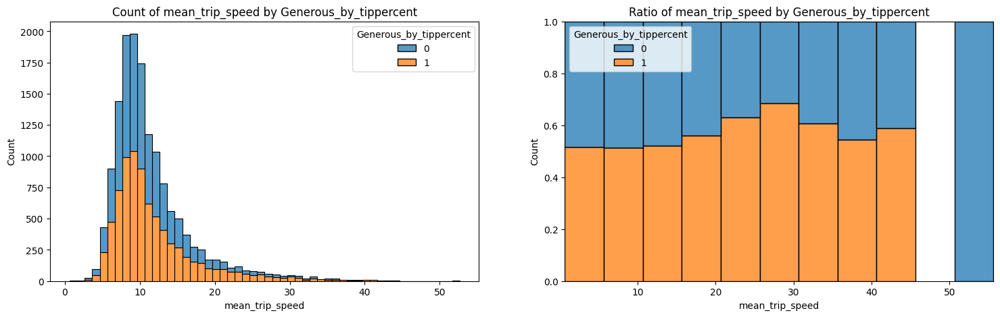

In [189]:
################################################
#mean_trip_speed and Generous_by_tippercent
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='mean_trip_speed',hue='Generous_by_tippercent',multiple='stack',binwidth=1,ax=axes[0])
sns.histplot(data=df_credit,x='mean_trip_speed',hue='Generous_by_tippercent',multiple='fill',binwidth=5,ax=axes[1])
axes[0].set_title('Count of mean_trip_speed by Generous_by_tippercent')
axes[1].set_title('Ratio of mean_trip_speed by Generous_by_tippercent')
plt.show()

#When mean_trip_speed bellow 30 mph, as mean_trip_speed went up Generous_by_tippercent ratio tend to increase
#When mean_trip_speed over 30 mph, as mean_trip_speed went up Generous_by_tippercent ratio tend to decrease

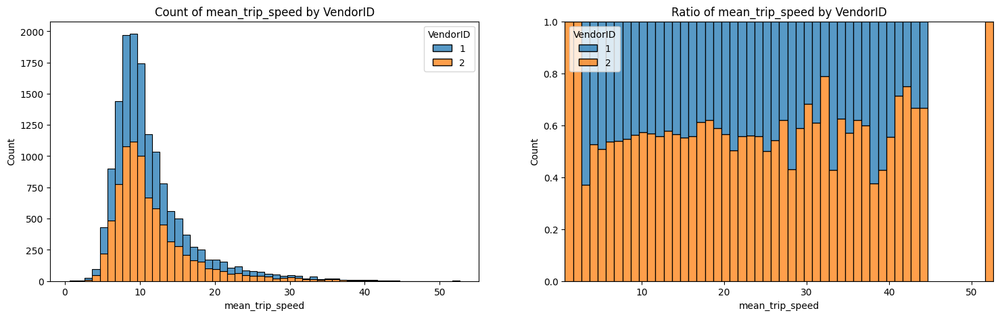

In [190]:
################################################
#mean_trip_speed and VendorID
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='mean_trip_speed',hue='VendorID',multiple='stack',binwidth=1,palette='tab10',ax=axes[0])
sns.histplot(data=df_credit,x='mean_trip_speed',hue='VendorID',multiple='fill',binwidth=1,palette='tab10',ax=axes[1])
axes[0].set_title('Count of mean_trip_speed by VendorID')
axes[1].set_title('Ratio of mean_trip_speed by VendorID')
plt.show()

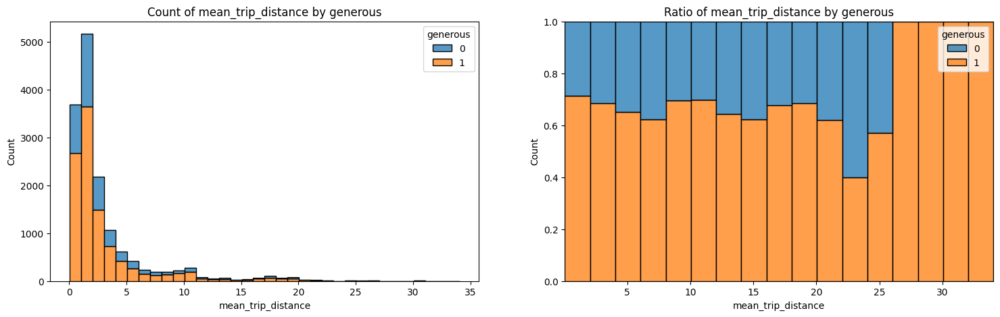

In [191]:
################################################
#mean_trip_distance and generous
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='mean_trip_distance',hue='generous',multiple='stack',binwidth=1,ax=axes[0])
sns.histplot(data=df_credit,x='mean_trip_distance',hue='generous',multiple='fill',binwidth=2,ax=axes[1])
axes[0].set_title('Count of mean_trip_distance by generous')
axes[1].set_title('Ratio of mean_trip_distance by generous')
plt.show()

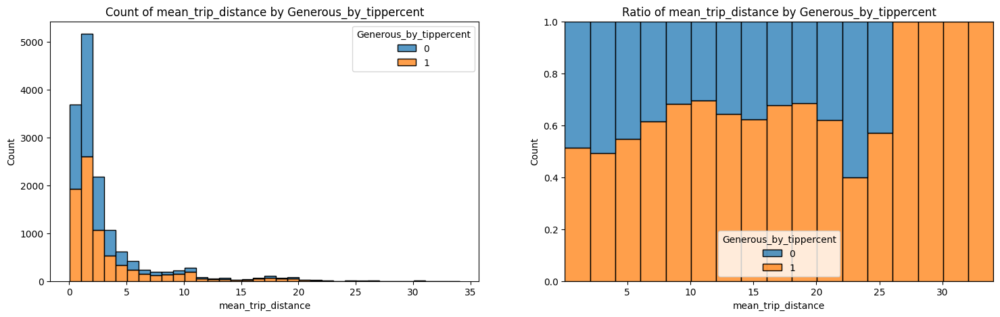

In [192]:
################################################
#mean_trip_distance and Generous_by_tippercent
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='mean_trip_distance',hue='Generous_by_tippercent',multiple='stack',binwidth=1,ax=axes[0])
sns.histplot(data=df_credit,x='mean_trip_distance',hue='Generous_by_tippercent',multiple='fill',binwidth=2,ax=axes[1])
axes[0].set_title('Count of mean_trip_distance by Generous_by_tippercent')
axes[1].set_title('Ratio of mean_trip_distance by Generous_by_tippercent')
plt.show()

#=>when mean_trip_distance was 0-12 miles, VendorID ratio no big change
#Generous_by_tippercent keep increasing
#it might due to tip_amount round logic
#Vendor1 may round tip_amount down to 0.05, if total_fare(total_amount-tip_amount) was small, 
#the calculated tip_percent will be smaller than passenger actual choice
#e.g. total_fare=$2.8, tip percent =20%, tip amount will be $0.56, 
#     if round 0.56 to 0.55, the calculated tip_percent=0.55/2.8=19.6% < 20%

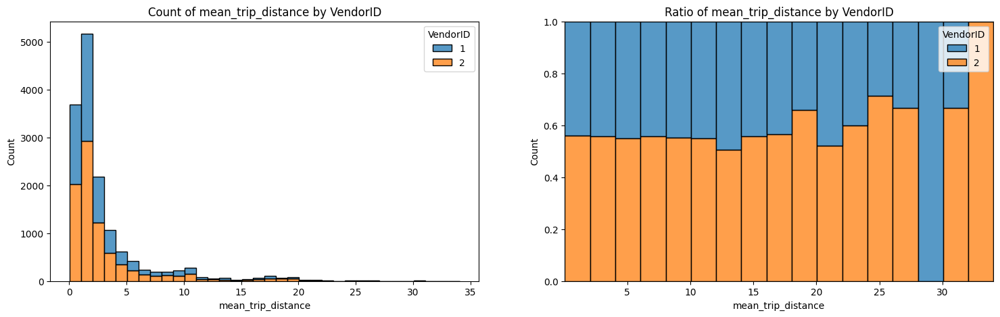

In [193]:
################################################
#mean_trip_distance and VendorID
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='mean_trip_distance',hue='VendorID',multiple='stack',binwidth=1,palette='tab10',ax=axes[0])
sns.histplot(data=df_credit,x='mean_trip_distance',hue='VendorID',multiple='fill',binwidth=2,palette='tab10',ax=axes[1])
axes[0].set_title('Count of mean_trip_distance by VendorID')
axes[1].set_title('Ratio of mean_trip_distance by VendorID')
plt.show()

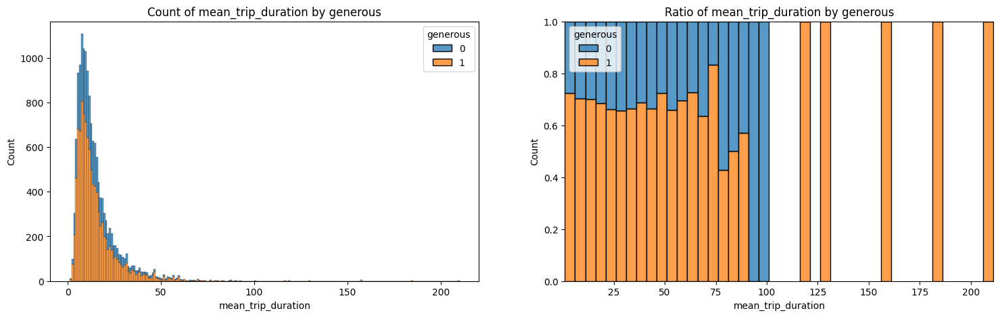

In [194]:
################################################
#mean_trip_duration and generous
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='mean_trip_duration',hue='generous',multiple='stack',binwidth=1,ax=axes[0])
sns.histplot(data=df_credit,x='mean_trip_duration',hue='generous',multiple='fill',binwidth=5,ax=axes[1])
axes[0].set_title('Count of mean_trip_duration by generous')
axes[1].set_title('Ratio of mean_trip_duration by generous')
plt.show()
#=>when duration increase the ratio of generous tend to decrease

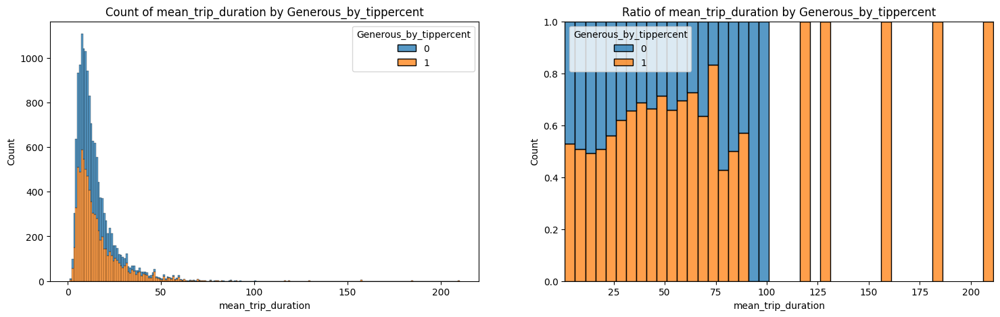

In [195]:
################################################
#mean_trip_duration and Generous_by_tippercent
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='mean_trip_duration',hue='Generous_by_tippercent',multiple='stack',binwidth=1,ax=axes[0])
sns.histplot(data=df_credit,x='mean_trip_duration',hue='Generous_by_tippercent',multiple='fill',binwidth=5,ax=axes[1])
axes[0].set_title('Count of mean_trip_duration by Generous_by_tippercent')
axes[1].set_title('Ratio of mean_trip_duration by Generous_by_tippercent')
plt.show()

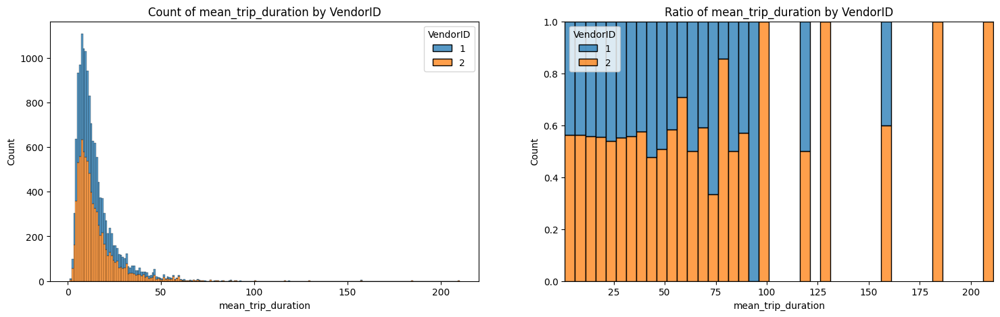

In [196]:
################################################
#mean_trip_duration and VendorID
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='mean_trip_duration',hue='VendorID',multiple='stack',binwidth=1,palette='tab10',ax=axes[0])
sns.histplot(data=df_credit,x='mean_trip_duration',hue='VendorID',multiple='fill',binwidth=5,palette='tab10',ax=axes[1])
axes[0].set_title('Count of mean_trip_duration by VendorID')
axes[1].set_title('Ratio of mean_trip_duration by VendorID')
plt.show()

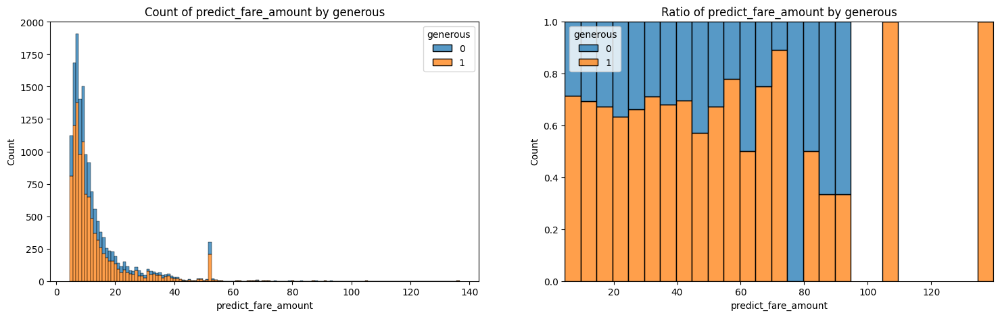

In [197]:
################################################
#predict_fare_amount and generous
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='predict_fare_amount',hue='generous',multiple='stack',binwidth=1,ax=axes[0])
sns.histplot(data=df_credit,x='predict_fare_amount',hue='generous',multiple='fill',binwidth=5,ax=axes[1])
axes[0].set_title('Count of predict_fare_amount by generous')
axes[1].set_title('Ratio of predict_fare_amount by generous')
plt.show()
#=>when fare_amount increase the ratio of generous tend to decrease

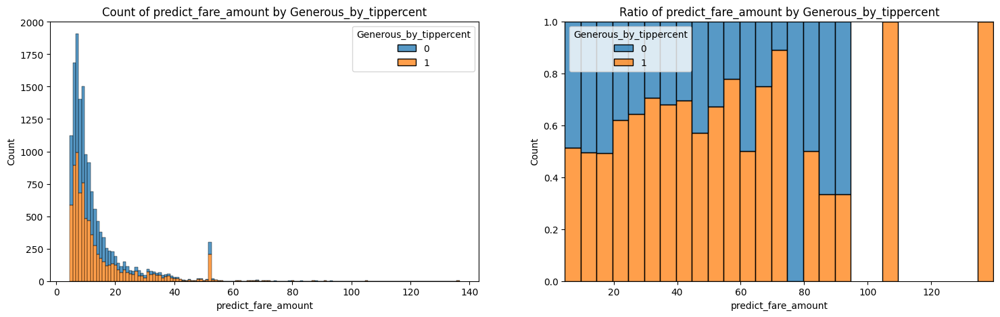

In [198]:
################################################
#predict_fare_amount and Generous_by_tippercent
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='predict_fare_amount',hue='Generous_by_tippercent',multiple='stack',binwidth=1,ax=axes[0])
sns.histplot(data=df_credit,x='predict_fare_amount',hue='Generous_by_tippercent',multiple='fill',binwidth=5,ax=axes[1])
axes[0].set_title('Count of predict_fare_amount by Generous_by_tippercent')
axes[1].set_title('Ratio of predict_fare_amount by Generous_by_tippercent')
plt.show()

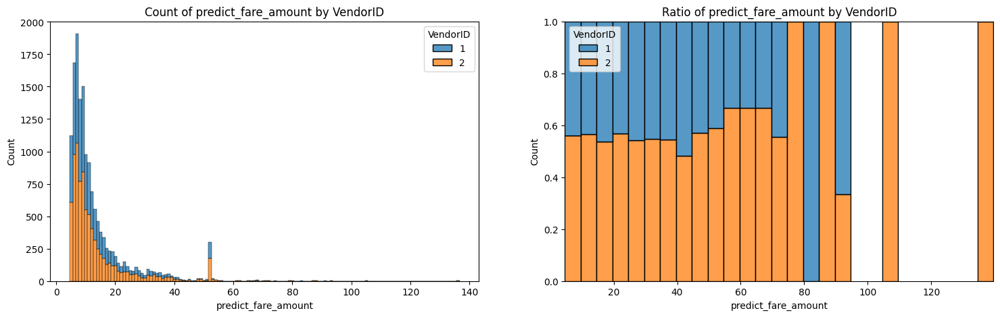

In [199]:
################################################
#predict_fare_amount and VendorID
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='predict_fare_amount',hue='VendorID',multiple='stack',binwidth=1,palette='tab10',ax=axes[0])
sns.histplot(data=df_credit,x='predict_fare_amount',hue='VendorID',multiple='fill',binwidth=5,palette='tab10',ax=axes[1])
axes[0].set_title('Count of predict_fare_amount by VendorID')
axes[1].set_title('Ratio of predict_fare_amount by VendorID')
plt.show()

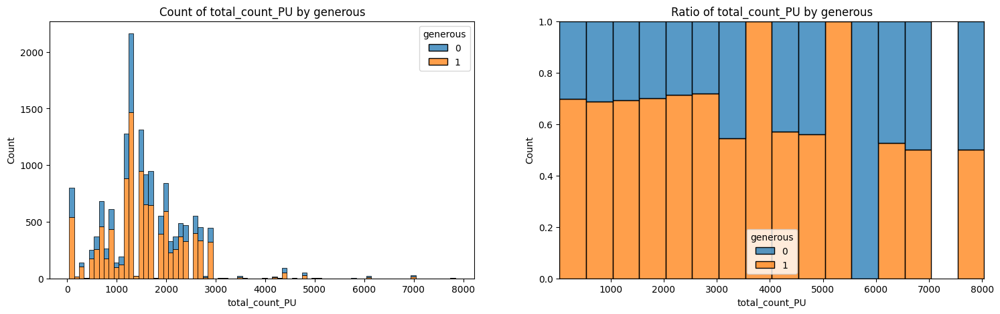

In [200]:
################################################
#total_count_PU and generous
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='total_count_PU',hue='generous',multiple='stack',binwidth=100,ax=axes[0])
sns.histplot(data=df_credit,x='total_count_PU',hue='generous',multiple='fill',binwidth=500,ax=axes[1])
axes[0].set_title('Count of total_count_PU by generous')
axes[1].set_title('Ratio of total_count_PU by generous')
plt.show()

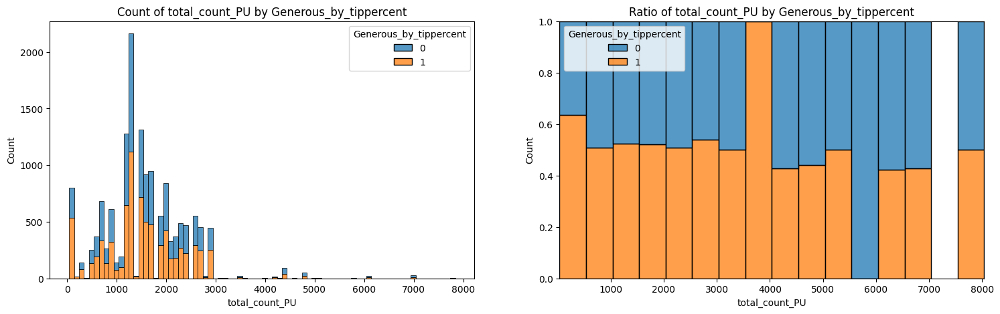

In [201]:
################################################
#total_count_PU and Generous_by_tippercent
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='total_count_PU',hue='Generous_by_tippercent',multiple='stack',binwidth=100,ax=axes[0])
sns.histplot(data=df_credit,x='total_count_PU',hue='Generous_by_tippercent',multiple='fill',binwidth=500,ax=axes[1])
axes[0].set_title('Count of total_count_PU by Generous_by_tippercent')
axes[1].set_title('Ratio of total_count_PU by Generous_by_tippercent')
plt.show()

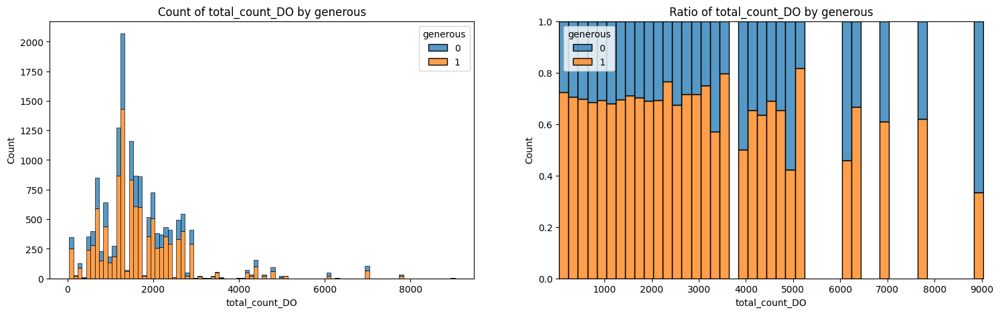

In [202]:
################################################
#total_count_DO and generous
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='total_count_DO',hue='generous',multiple='stack',binwidth=100,ax=axes[0])
sns.histplot(data=df_credit,x='total_count_DO',hue='generous',multiple='fill',binwidth=200,ax=axes[1])
axes[0].set_title('Count of total_count_DO by generous')
axes[1].set_title('Ratio of total_count_DO by generous')
plt.show()

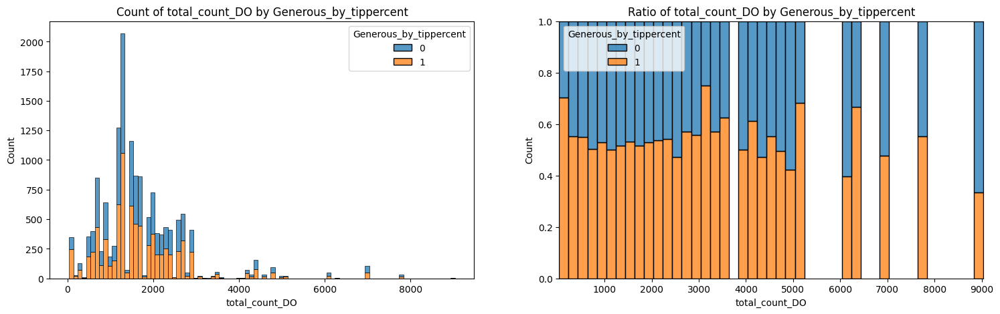

In [203]:
################################################
#total_count_DO and Generous_by_tippercent
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='total_count_DO',hue='Generous_by_tippercent',multiple='stack',binwidth=100,ax=axes[0])
sns.histplot(data=df_credit,x='total_count_DO',hue='Generous_by_tippercent',multiple='fill',binwidth=200,ax=axes[1])
axes[0].set_title('Count of total_count_DO by Generous_by_tippercent')
axes[1].set_title('Ratio of total_count_DO by Generous_by_tippercent')
plt.show()

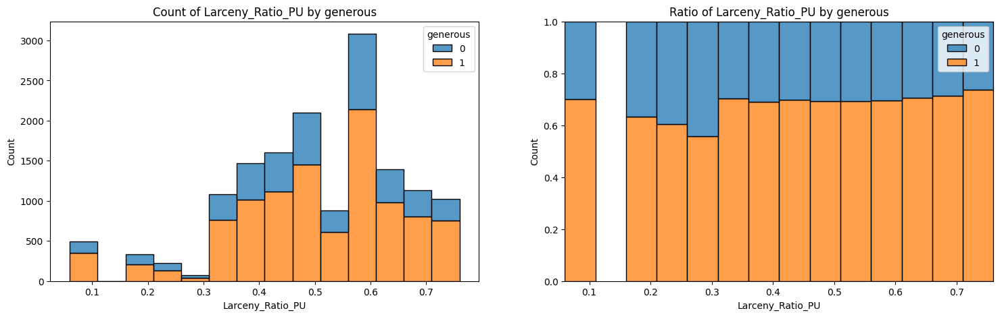

In [204]:
################################################
#Larceny_Ratio_PU and generous
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='Larceny_Ratio_PU',hue='generous',multiple='stack',binwidth=0.05,ax=axes[0])
sns.histplot(data=df_credit,x='Larceny_Ratio_PU',hue='generous',multiple='fill',binwidth=0.05,ax=axes[1])
axes[0].set_title('Count of Larceny_Ratio_PU by generous')
axes[1].set_title('Ratio of Larceny_Ratio_PU by generous')
plt.show()

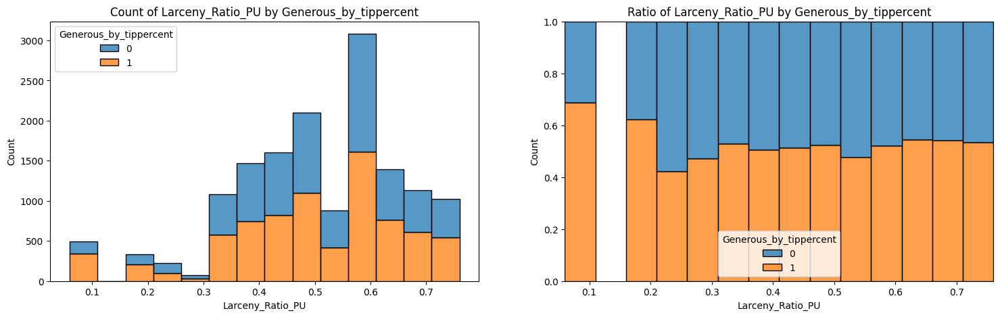

In [205]:
################################################
#Larceny_Ratio_PU and Generous_by_tippercent
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='Larceny_Ratio_PU',hue='Generous_by_tippercent',multiple='stack',binwidth=0.05,ax=axes[0])
sns.histplot(data=df_credit,x='Larceny_Ratio_PU',hue='Generous_by_tippercent',multiple='fill',binwidth=0.05,ax=axes[1])
axes[0].set_title('Count of Larceny_Ratio_PU by Generous_by_tippercent')
axes[1].set_title('Ratio of Larceny_Ratio_PU by Generous_by_tippercent')
plt.show()

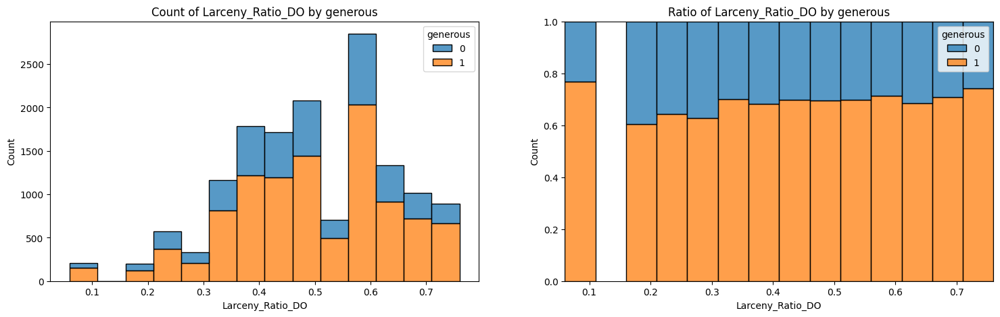

In [206]:
################################################
#Larceny_Ratio_DO and generous
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='Larceny_Ratio_DO',hue='generous',multiple='stack',binwidth=0.05,ax=axes[0])
sns.histplot(data=df_credit,x='Larceny_Ratio_DO',hue='generous',multiple='fill',binwidth=0.05,ax=axes[1])
axes[0].set_title('Count of Larceny_Ratio_DO by generous')
axes[1].set_title('Ratio of Larceny_Ratio_DO by generous')
plt.show()

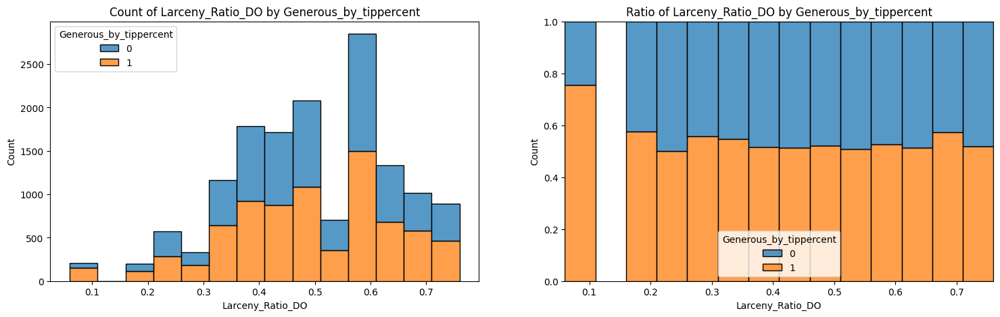

In [207]:
################################################
#Larceny_Ratio_DO and Generous_by_tippercent
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='Larceny_Ratio_DO',hue='Generous_by_tippercent',multiple='stack',binwidth=0.05,ax=axes[0])
sns.histplot(data=df_credit,x='Larceny_Ratio_DO',hue='Generous_by_tippercent',multiple='fill',binwidth=0.05,ax=axes[1])
axes[0].set_title('Count of Larceny_Ratio_DO by Generous_by_tippercent')
axes[1].set_title('Ratio of Larceny_Ratio_DO by Generous_by_tippercent')
plt.show()

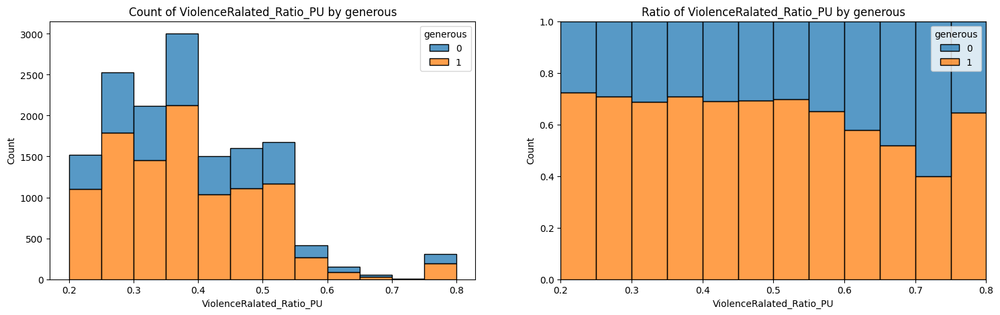

In [208]:
################################################
#ViolenceRalated_Ratio_PU and generous
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='ViolenceRalated_Ratio_PU',hue='generous',multiple='stack',binwidth=0.05,ax=axes[0])
sns.histplot(data=df_credit,x='ViolenceRalated_Ratio_PU',hue='generous',multiple='fill',binwidth=0.05,ax=axes[1])
axes[0].set_title('Count of ViolenceRalated_Ratio_PU by generous')
axes[1].set_title('Ratio of ViolenceRalated_Ratio_PU by generous')
plt.show()

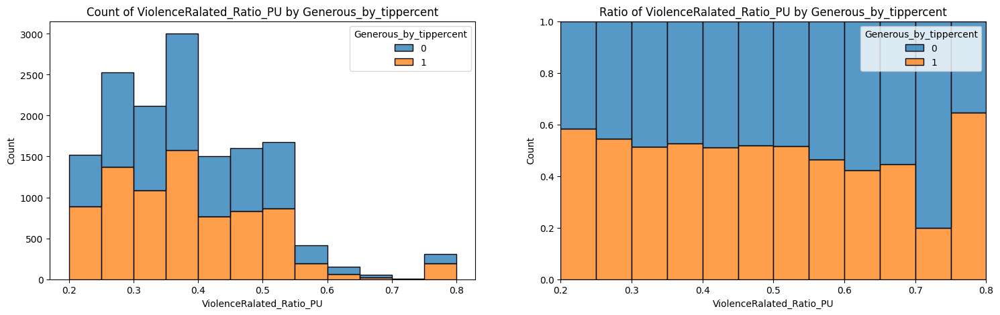

In [209]:
################################################
#ViolenceRalated_Ratio_PU and Generous_by_tippercent
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='ViolenceRalated_Ratio_PU',hue='Generous_by_tippercent',multiple='stack',binwidth=0.05,ax=axes[0])
sns.histplot(data=df_credit,x='ViolenceRalated_Ratio_PU',hue='Generous_by_tippercent',multiple='fill',binwidth=0.05,ax=axes[1])
axes[0].set_title('Count of ViolenceRalated_Ratio_PU by Generous_by_tippercent')
axes[1].set_title('Ratio of ViolenceRalated_Ratio_PU by Generous_by_tippercent')
plt.show()

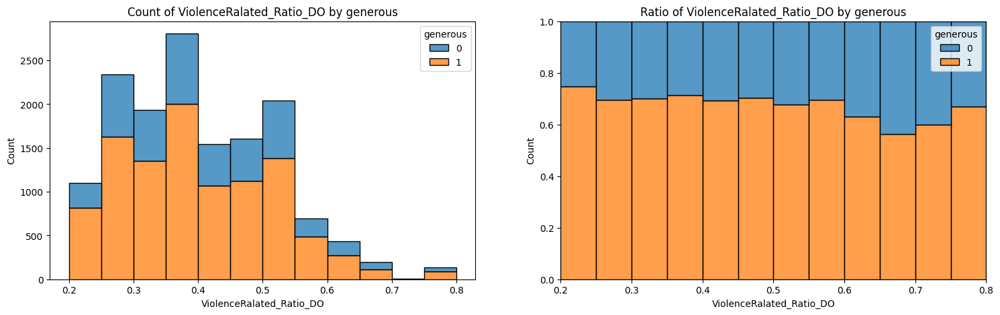

In [210]:
################################################
#ViolenceRalated_Ratio_DO and generous
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='ViolenceRalated_Ratio_DO',hue='generous',multiple='stack',binwidth=0.05,ax=axes[0])
sns.histplot(data=df_credit,x='ViolenceRalated_Ratio_DO',hue='generous',multiple='fill',binwidth=0.05,ax=axes[1])
axes[0].set_title('Count of ViolenceRalated_Ratio_DO by generous')
axes[1].set_title('Ratio of ViolenceRalated_Ratio_DO by generous')
plt.show()

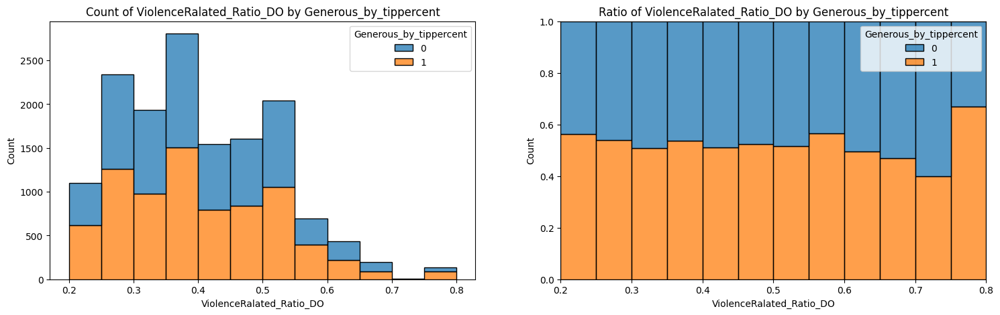

In [211]:
################################################
#ViolenceRalated_Ratio_DO and Generous_by_tippercent
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='ViolenceRalated_Ratio_DO',hue='Generous_by_tippercent',multiple='stack',binwidth=0.05,ax=axes[0])
sns.histplot(data=df_credit,x='ViolenceRalated_Ratio_DO',hue='Generous_by_tippercent',multiple='fill',binwidth=0.05,ax=axes[1])
axes[0].set_title('Count of ViolenceRalated_Ratio_DO by Generous_by_tippercent')
axes[1].set_title('Ratio of ViolenceRalated_Ratio_DO by Generous_by_tippercent')
plt.show()

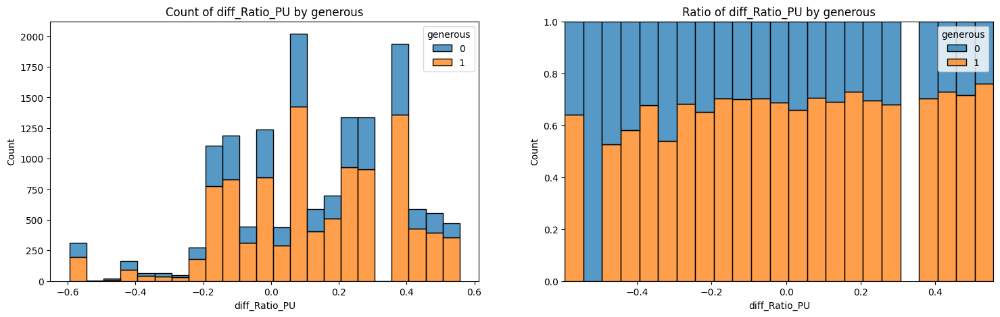

In [212]:
################################################
#diff_Ratio_PU and generous
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='diff_Ratio_PU',hue='generous',multiple='stack',binwidth=0.05,ax=axes[0])
sns.histplot(data=df_credit,x='diff_Ratio_PU',hue='generous',multiple='fill',binwidth=0.05,ax=axes[1])
axes[0].set_title('Count of diff_Ratio_PU by generous')
axes[1].set_title('Ratio of diff_Ratio_PU by generous')
plt.show()

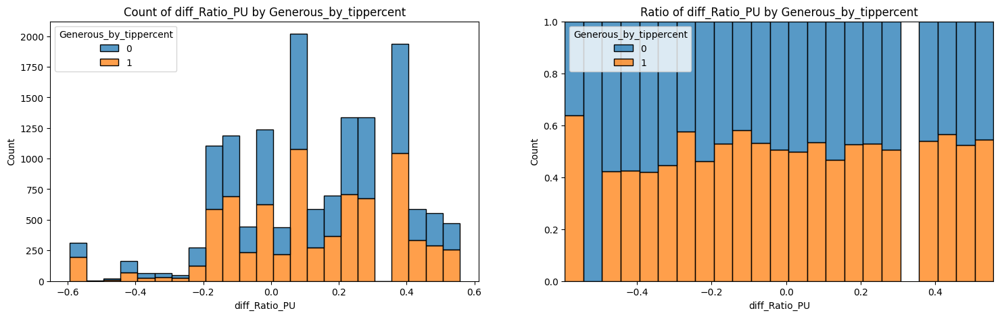

In [213]:
################################################
#diff_Ratio_PU and Generous_by_tippercent
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='diff_Ratio_PU',hue='Generous_by_tippercent',multiple='stack',binwidth=0.05,ax=axes[0])
sns.histplot(data=df_credit,x='diff_Ratio_PU',hue='Generous_by_tippercent',multiple='fill',binwidth=0.05,ax=axes[1])
axes[0].set_title('Count of diff_Ratio_PU by Generous_by_tippercent')
axes[1].set_title('Ratio of diff_Ratio_PU by Generous_by_tippercent')
plt.show()

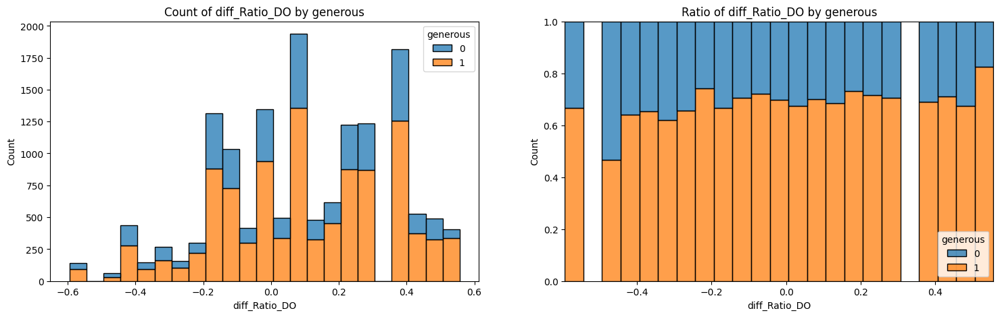

In [214]:
################################################
#diff_Ratio_DO and generous
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='diff_Ratio_DO',hue='generous',multiple='stack',binwidth=0.05,ax=axes[0])
sns.histplot(data=df_credit,x='diff_Ratio_DO',hue='generous',multiple='fill',binwidth=0.05,ax=axes[1])
axes[0].set_title('Count of diff_Ratio_DO by generous')
axes[1].set_title('Ratio of diff_Ratio_DO by generous')
plt.show()

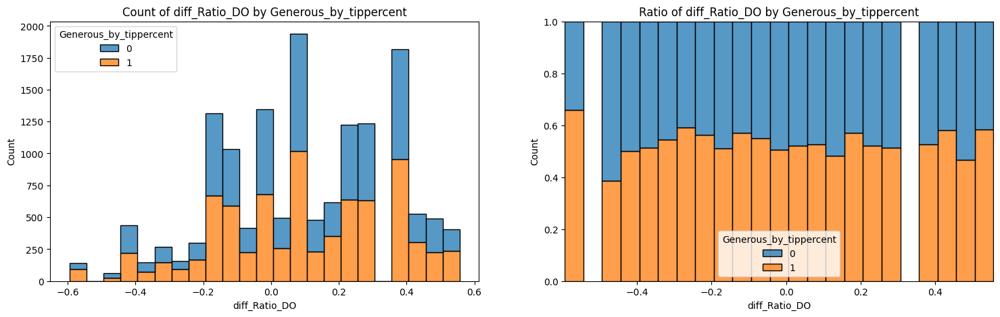

In [215]:
################################################
#diff_Ratio_DO and Generous_by_tippercent
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='diff_Ratio_DO',hue='Generous_by_tippercent',multiple='stack',binwidth=0.05,ax=axes[0])
sns.histplot(data=df_credit,x='diff_Ratio_DO',hue='Generous_by_tippercent',multiple='fill',binwidth=0.05,ax=axes[1])
axes[0].set_title('Count of diff_Ratio_DO by Generous_by_tippercent')
axes[1].set_title('Ratio of diff_Ratio_DO by Generous_by_tippercent')
plt.show()

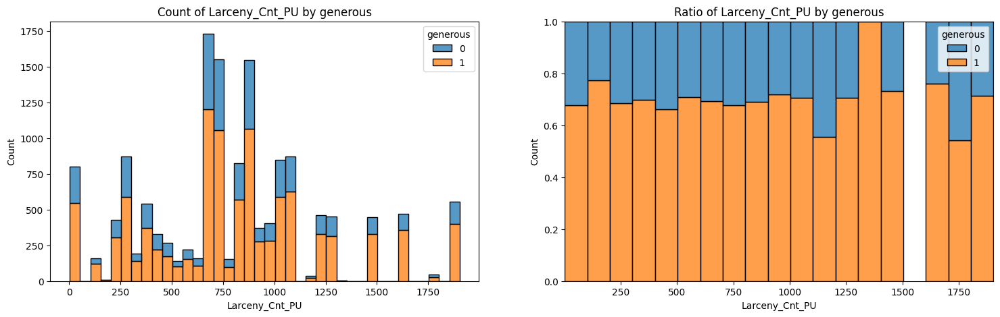

In [216]:
################################################
#Larceny_Cnt_PU and generous
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='Larceny_Cnt_PU',hue='generous',multiple='stack',binwidth=50,ax=axes[0])
sns.histplot(data=df_credit,x='Larceny_Cnt_PU',hue='generous',multiple='fill',binwidth=100,ax=axes[1])
axes[0].set_title('Count of Larceny_Cnt_PU by generous')
axes[1].set_title('Ratio of Larceny_Cnt_PU by generous')
plt.show()

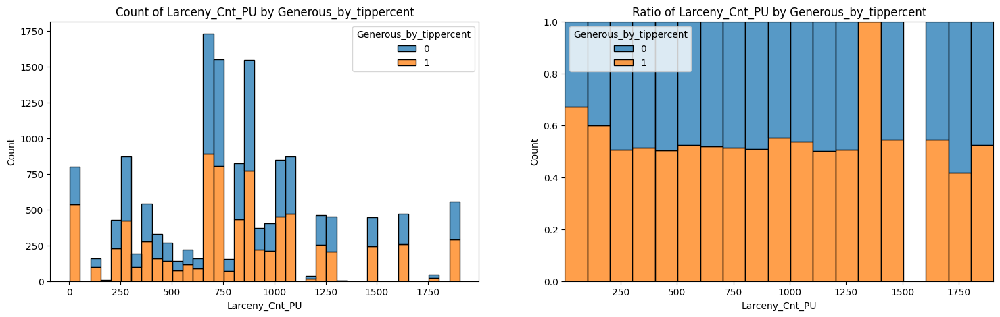

In [217]:
################################################
#Larceny_Cnt_PU and Generous_by_tippercent
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='Larceny_Cnt_PU',hue='Generous_by_tippercent',multiple='stack',binwidth=50,ax=axes[0])
sns.histplot(data=df_credit,x='Larceny_Cnt_PU',hue='Generous_by_tippercent',multiple='fill',binwidth=100,ax=axes[1])
axes[0].set_title('Count of Larceny_Cnt_PU by Generous_by_tippercent')
axes[1].set_title('Ratio of Larceny_Cnt_PU by Generous_by_tippercent')
plt.show()

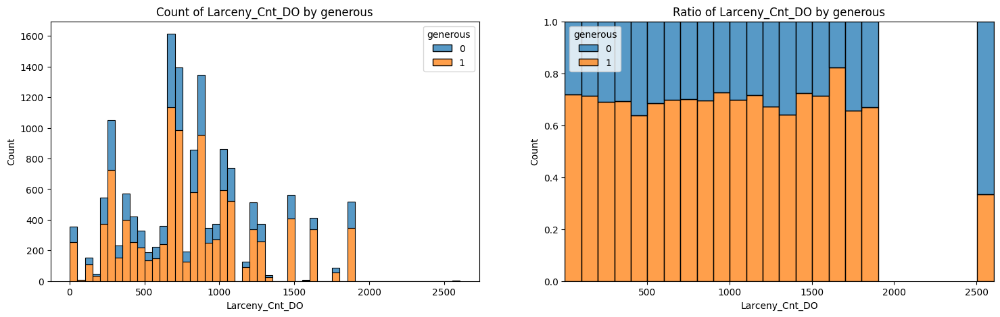

In [218]:
################################################
#Larceny_Cnt_DO and generous
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='Larceny_Cnt_DO',hue='generous',multiple='stack',binwidth=50,ax=axes[0])
sns.histplot(data=df_credit,x='Larceny_Cnt_DO',hue='generous',multiple='fill',binwidth=100,ax=axes[1])
axes[0].set_title('Count of Larceny_Cnt_DO by generous')
axes[1].set_title('Ratio of Larceny_Cnt_DO by generous')
plt.show()

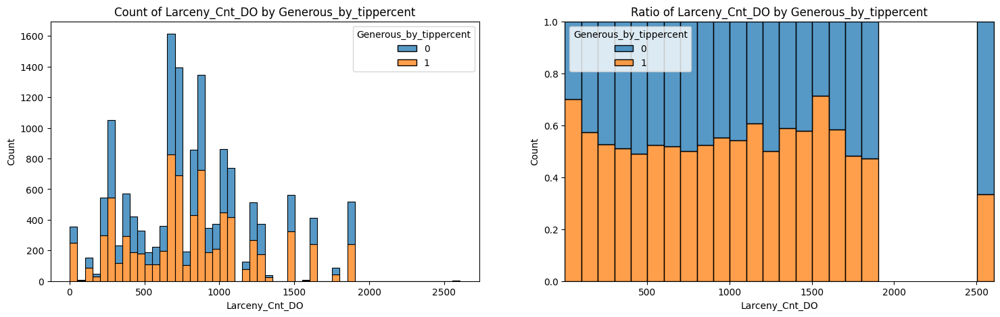

In [219]:
################################################
#Larceny_Cnt_DO and Generous_by_tippercent
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='Larceny_Cnt_DO',hue='Generous_by_tippercent',multiple='stack',binwidth=50,ax=axes[0])
sns.histplot(data=df_credit,x='Larceny_Cnt_DO',hue='Generous_by_tippercent',multiple='fill',binwidth=100,ax=axes[1])
axes[0].set_title('Count of Larceny_Cnt_DO by Generous_by_tippercent')
axes[1].set_title('Ratio of Larceny_Cnt_DO by Generous_by_tippercent')
plt.show()

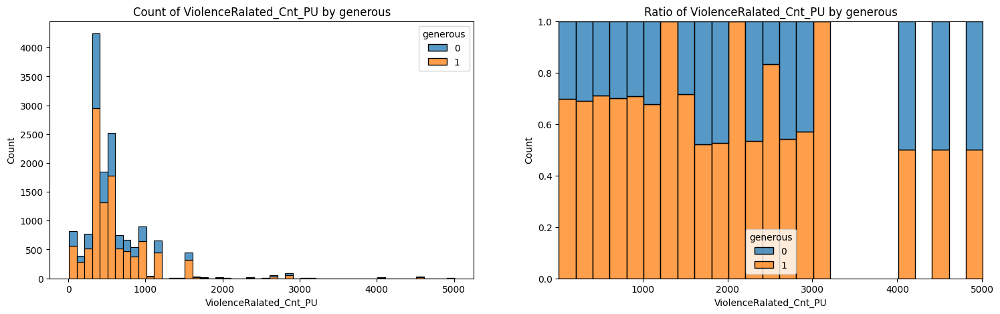

In [220]:
################################################
#ViolenceRalated_Cnt_PU and generous
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='ViolenceRalated_Cnt_PU',hue='generous',multiple='stack',binwidth=100,ax=axes[0])
sns.histplot(data=df_credit,x='ViolenceRalated_Cnt_PU',hue='generous',multiple='fill',binwidth=200,ax=axes[1])
axes[0].set_title('Count of ViolenceRalated_Cnt_PU by generous')
axes[1].set_title('Ratio of ViolenceRalated_Cnt_PU by generous')
plt.show()

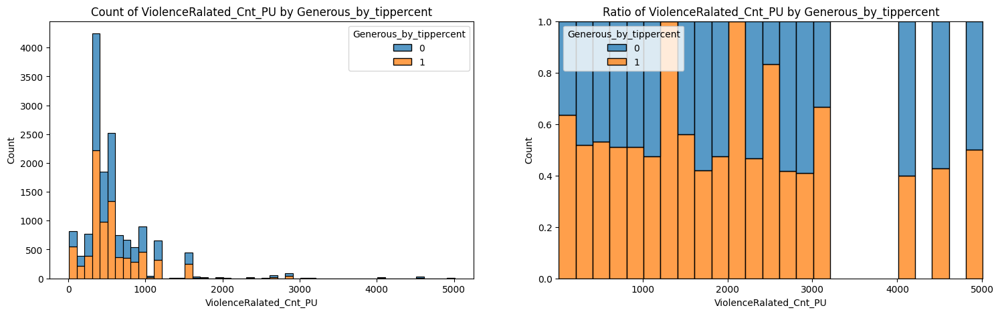

In [221]:
################################################
#ViolenceRalated_Cnt_PU and generous
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='ViolenceRalated_Cnt_PU',hue='Generous_by_tippercent',multiple='stack',binwidth=100,ax=axes[0])
sns.histplot(data=df_credit,x='ViolenceRalated_Cnt_PU',hue='Generous_by_tippercent',multiple='fill',binwidth=200,ax=axes[1])
axes[0].set_title('Count of ViolenceRalated_Cnt_PU by Generous_by_tippercent')
axes[1].set_title('Ratio of ViolenceRalated_Cnt_PU by Generous_by_tippercent')
plt.show()

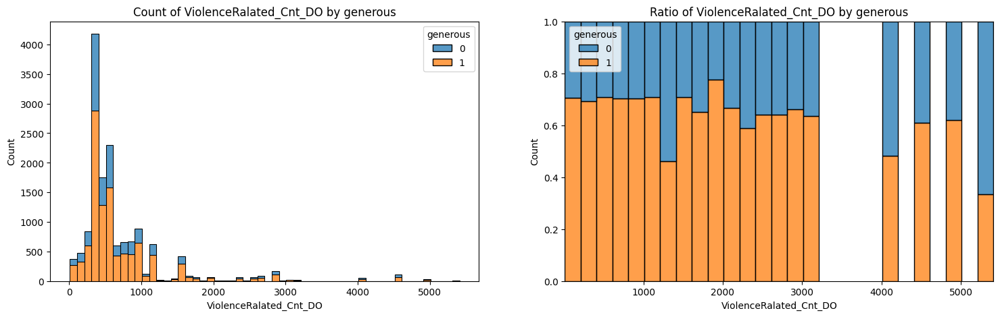

In [222]:
################################################
#ViolenceRalated_Cnt_DO and generous
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='ViolenceRalated_Cnt_DO',hue='generous',multiple='stack',binwidth=100,ax=axes[0])
sns.histplot(data=df_credit,x='ViolenceRalated_Cnt_DO',hue='generous',multiple='fill',binwidth=200,ax=axes[1])
axes[0].set_title('Count of ViolenceRalated_Cnt_DO by generous')
axes[1].set_title('Ratio of ViolenceRalated_Cnt_DO by generous')
plt.show()

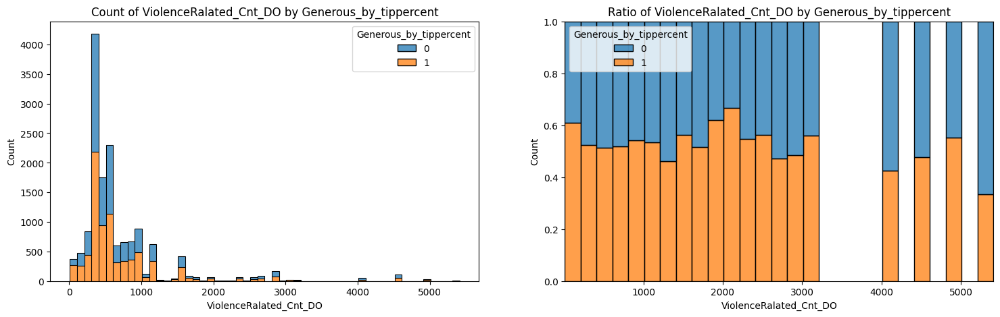

In [223]:
################################################
#ViolenceRalated_Cnt_DO and Generous_by_tippercent
################################################
fig,axes=plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_credit,x='ViolenceRalated_Cnt_DO',hue='Generous_by_tippercent',multiple='stack',binwidth=100,ax=axes[0])
sns.histplot(data=df_credit,x='ViolenceRalated_Cnt_DO',hue='Generous_by_tippercent',multiple='fill',binwidth=200,ax=axes[1])
axes[0].set_title('Count of ViolenceRalated_Cnt_DO by Generous_by_tippercent')
axes[1].set_title('Ratio of ViolenceRalated_Cnt_DO by Generous_by_tippercent')
plt.show()

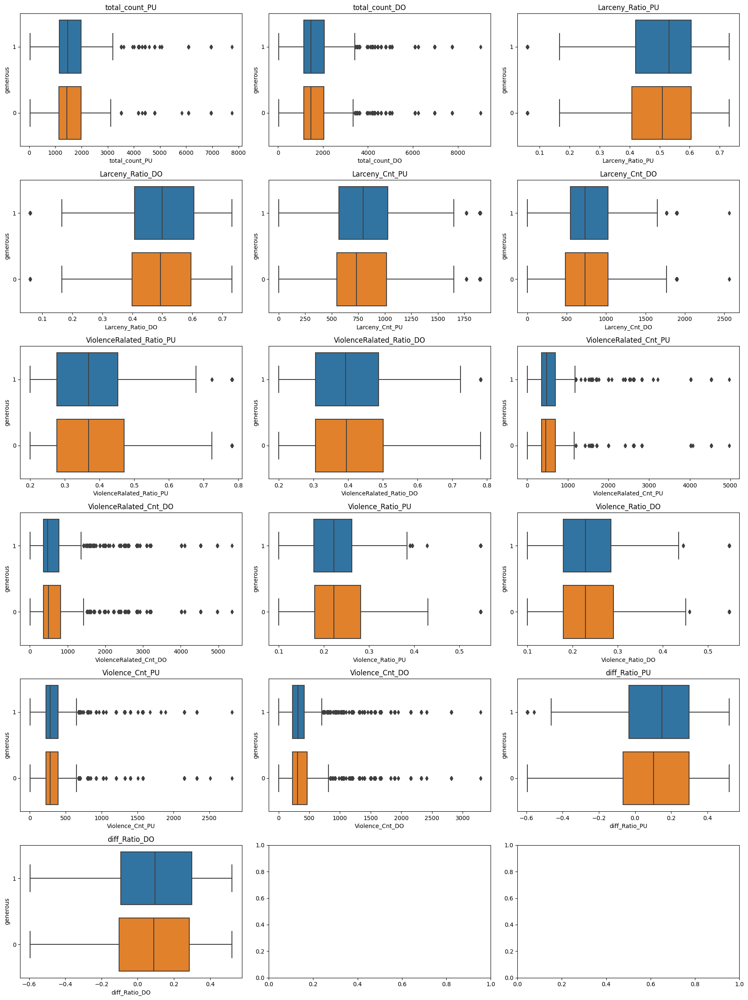

In [224]:
#################################################################
#box plot of crime
#################################################################
target_columns=['total_count_PU','total_count_DO',
               'Larceny_Ratio_PU','Larceny_Ratio_DO',
               'Larceny_Cnt_PU','Larceny_Cnt_DO',
               'ViolenceRalated_Ratio_PU', 'ViolenceRalated_Ratio_DO',
               'ViolenceRalated_Cnt_PU', 'ViolenceRalated_Cnt_DO',
               'Violence_Ratio_PU', 'Violence_Ratio_DO',
               'Violence_Cnt_PU', 'Violence_Cnt_DO',
               'diff_Ratio_PU','diff_Ratio_DO']
rowCnt=math.ceil(len(target_columns)/3)
fig,axes=plt.subplots(rowCnt,3,figsize=(18,rowCnt*4))
for col,ax in zip(target_columns,axes.ravel()):
    sns.boxplot(data=df_credit,x=col,y=df_credit['generous'].astype(str),ax=ax)
    ax.set_title(col)
plt.tight_layout()
plt.show()

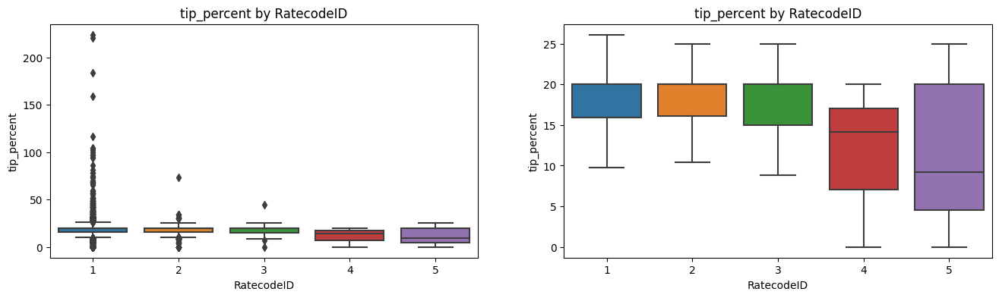

In [225]:
fig,axs=plt.subplots(1,2,figsize=(16,4))

sns.boxplot(data=df_credit, y="tip_percent",x="RatecodeID",ax=axs[0])
sns.boxplot(data=df_credit, y="tip_percent",x="RatecodeID",showfliers=False,ax=axs[1])
axs[0].set_title('tip_percent by RatecodeID')
axs[1].set_title('tip_percent by RatecodeID')
plt.show()

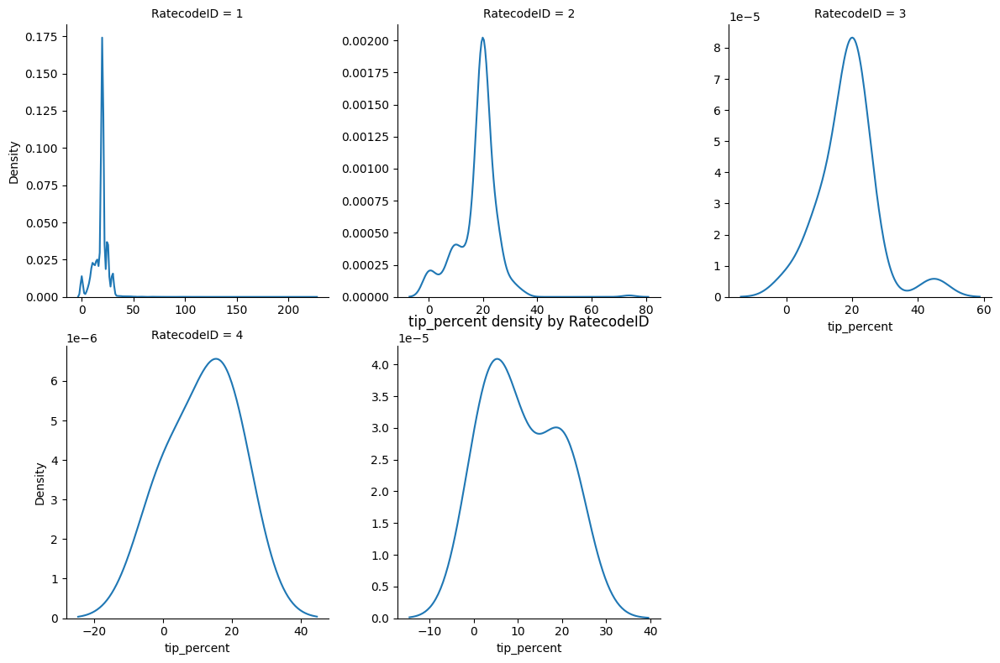

In [226]:
sns.displot(data=df_credit, x="tip_percent", col="RatecodeID", kind="kde",
            height=4,aspect=1,col_wrap=3,
            facet_kws=dict(sharey=False,sharex=False),
           )
plt.title('tip_percent density by RatecodeID')
plt.show()

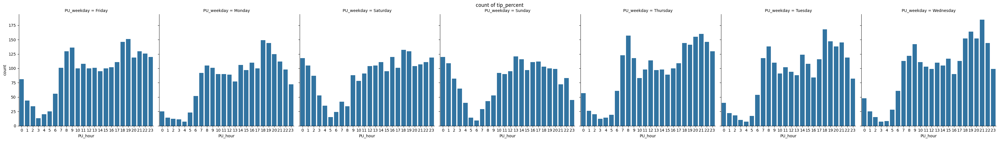

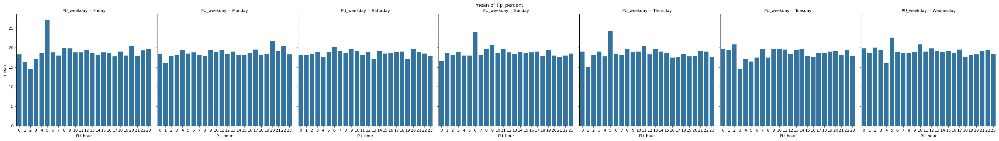

In [227]:
###############################################################
#tip_percent by pickup hour and weekday
###############################################################
target_data=df_credit.groupby(['PU_weekday','PU_hour'])['tip_percent'].agg(['count','sum','mean']).reset_index()

#plot of count of fare_amount
g0 = sns.FacetGrid(target_data, col="PU_weekday", height=5, aspect=1)
g0.map_dataframe(sns.barplot, x="PU_hour", y="count")
g0.fig.subplots_adjust(top=0.9)
g0.fig.suptitle("count of tip_percent")

#plot of mean of fare_amount
g1 = sns.FacetGrid(target_data, col="PU_weekday", height=5, aspect=1)
g1.map_dataframe(sns.barplot, x="PU_hour", y="mean")
g1.fig.subplots_adjust(top=0.9)
g1.fig.suptitle("mean of tip_percent")



plt.show(g0)
plt.show(g1)

In [228]:
##############################################
#confirm which trip needs to pay tolls
##############################################
print(df_credit['RatecodeID'].value_counts())
print(df_credit[df_credit['tolls_amount']>0]['RatecodeID'].value_counts())

RatecodeID
1    14527
2      316
3       22
5       15
4        3
Name: count, dtype: int64
RatecodeID
1    567
2    247
3     22
5     10
4      3
Name: count, dtype: int64


In [229]:
mask=df_credit['tolls_amount']>0
print(df_credit[mask]['tip_percent'].agg(['mean','median']))
print(df_credit[~mask]['tip_percent'].agg(['mean','median']))

mean      18.604947
median    20.000000
Name: tip_percent, dtype: float64
mean      18.716859
median    20.000000
Name: tip_percent, dtype: float64


In [230]:
mask=df_credit['total_fare']<=5
print(df_credit[mask]['tip_percent'].agg(['mean','median','count']))
print(df_credit[~mask]['tip_percent'].agg(['mean','median','count']))

mean       21.941265
median     20.000000
count     332.000000
Name: tip_percent, dtype: float64
mean         18.63676
median       20.00000
count     14551.00000
Name: tip_percent, dtype: float64


In [231]:
mask=df_credit['tip_amount']==3
print(df_credit[mask]['tip_percent'].agg(['mean','median','count']))
print(df_credit[~mask]['tip_percent'].agg(['mean','median','count']))

mean       19.549145
median     16.650000
count     234.000000
Name: tip_percent, dtype: float64
mean         18.697078
median       20.000000
count     14649.000000
Name: tip_percent, dtype: float64


In [232]:
#######################################
#tip_percent by pickup Borough
#######################################
df_credit.groupby(['Borough_PU'])[['tip_amount','tip_percent']].agg(['min','max','std','mean','median','count'])

tip_amount                                           \
                           min    max       std      mean median  count   
Borough_PU                                                                
Bronx                     1.32   1.32       NaN  1.320000   1.32      1   
Brooklyn                  0.00  10.56  1.856262  2.796766   2.45    201   
Manhattan                 0.00  51.64  1.954507  2.372301   1.96  13792   
Outside of NYC(N/A)       2.45   2.45       NaN  2.450000   2.45      1   
Queens                    0.00  55.50  4.405502  7.454493   7.45    888   

                    tip_percent                                             
                            min    max        std       mean median  count  
Borough_PU                                                                  
Bronx                      24.9   24.9        NaN  24.900000   24.9      1  
Brooklyn                    0.0  184.2  13.623739  20.231343   20.0    201  
Manhattan                   0.0  224.1   7.719517  18.709397   20.0  13792  
Outside of NYC(N/A)        19.9   19.9        NaN  19.900000   19.9      1  
Queens                      0.0   73.8   7.080709  18.374662   20.0    888

In [233]:
#######################################
#tip_percent by droppoff Borough
#######################################
df_credit.groupby(['Borough_DO'])[['tip_amount','tip_percent']].agg(['min','max','std','mean','median','count'])

tip_amount                                             \
                           min    max        std       mean median  count   
Borough_DO                                                                  
Bronx                     0.00  19.85   3.929947   5.322090   5.00     67   
Brooklyn                  0.00  18.95   2.965622   4.509459   4.00    740   
EWR                       0.00  55.50  10.060301  16.302273  15.96     22   
Manhattan                 0.00  42.29   1.922666   2.347763   1.96  13374   
Outside of NYC(N/A)       0.00  51.64  11.232205  10.038750   6.53     24   
Queens                    0.00  25.20   4.088446   6.377933   6.00    653   
Staten Island            13.48  18.56   2.571951  15.786667  15.32      3   

                    tip_percent                                             
                            min    max        std       mean median  count  
Borough_DO                                                                  
Bronx                       0.0   32.5   8.585257  15.486567   19.9     67  
Brooklyn                    0.0  184.2   9.307798  18.594459   20.0    740  
EWR                         0.0   44.9   8.567890  18.627273   20.0     22  
Manhattan                   0.0  224.1   7.661123  18.733573   20.0  13374  
Outside of NYC(N/A)         0.0   45.6  10.917855  14.070833   14.1     24  
Queens                      0.0   81.2   8.279482  18.867075   20.0    653  
Staten Island              20.0   20.0   0.000000  20.000000   20.0      3

In [234]:
#######################################
#tip_percent by pickup Borough and droppoff Borough
#######################################
df_credit.groupby(['PU_DO_Borough'])[['tip_amount','tip_percent']].agg(['min','max','std','mean','median','count'])

tip_amount                    \
                                               min    max        std   
PU_DO_Borough                                                          
Bronx_Bronx                                   1.32   1.32        NaN   
Brooklyn_Brooklyn                             0.00   8.45   1.545444   
Brooklyn_Manhattan                            0.00   7.96   1.590736   
Brooklyn_Outside of NYC(N/A)                  2.00   2.00        NaN   
Brooklyn_Queens                               2.00  10.56   2.729981   
Manhattan_Bronx                               0.00  10.95   3.309947   
Manhattan_Brooklyn                            0.00  15.00   2.285635   
Manhattan_EWR                                 0.00  21.30   5.078269   
Manhattan_Manhattan                           0.00  15.00   1.222141   
Manhattan_Outside of NYC(N/A)                 0.00  51.64  14.411996   
Manhattan_Queens                              0.00  25.20   3.999753   
Manhattan_Staten Island                      13.48  15.32   1.301076   
Outside of NYC(N/A)_Outside of NYC(N/A)       2.45   2.45        NaN   
Queens_Bronx                                  0.00  19.85   5.561513   
Queens_Brooklyn                               0.00  18.95   3.692830   
Queens_EWR                                   55.50  55.50        NaN   
Queens_Manhattan                              0.00  42.29   3.728518   
Queens_Outside of NYC(N/A)                    0.00  17.15   5.627636   
Queens_Queens                                 0.00  15.00   2.628802   
Queens_Staten Island                         18.56  18.56        NaN   

                                                                  tip_percent  \
                                              mean  median  count         min   
PU_DO_Borough                                                                   
Bronx_Bronx                               1.320000   1.320      1        24.9   
Brooklyn_Brooklyn                         2.316172   2.050    128         0.0   
Brooklyn_Manhattan                        3.266719   3.160     64         0.0   
Brooklyn_Outside of NYC(N/A)              2.000000   2.000      1         5.0   
Brooklyn_Queens                           6.826250   6.600      8        11.3   
Manhattan_Bronx                           4.901887   5.000     53         0.0   
Manhattan_Brooklyn                        4.242143   4.000    476         0.0   
Manhattan_EWR                            14.435714  15.960     21         0.0   
Manhattan_Manhattan                       2.069131   1.860  12737         0.0   
Manhattan_Outside of NYC(N/A)            11.592308   7.000     13         0.0   
Manhattan_Queens                          7.352143   7.005    490         0.0   
Manhattan_Staten Island                  14.400000  14.400      2        20.0   
Outside of NYC(N/A)_Outside of NYC(N/A)   2.450000   2.450      1        19.9   
Queens_Bronx                              7.343077   8.150     13         0.0   
Queens_Brooklyn                           7.509338   7.060    136         0.0   
Queens_EWR                               55.500000  55.500      1        44.9   
Queens_Manhattan                          8.438726   8.270    573         0.0   
Queens_Outside of NYC(N/A)                9.531111  10.700      9         0.0   
Queens_Queens                             3.275032   2.760    155         0.0   
Queens_Staten Island                     18.560000  18.560      1        20.0   

                                                                             \
                                           max        std       mean median   
PU_DO_Borough                                                                 
Bronx_Bronx                               24.9        NaN  24.900000   24.9   
Brooklyn_Brooklyn                        184.2  16.105023  21.768750   20.0   
Brooklyn_Manhattan                        30.0   6.750932  17.262500   20.0   
Brooklyn_Outside of NYC(N/A)               5.

In [235]:
#######################################
#tip_percent by RatecodeID
#######################################
df_credit.groupby(['RatecodeID'])[['tip_amount','tip_percent']].agg(['min','max','std','mean','median','count'])

tip_amount                                            tip_percent  \
                  min    max        std       mean median  count         min   
RatecodeID                                                                     
1                 0.0  28.00   1.974937   2.481132   2.00  14527         0.0   
2                 0.0  42.29   4.338557  10.494652  11.70    316         0.0   
3                 0.0  55.50  10.060301  16.302273  15.96     22         0.0   
4                 0.0  15.00   8.404659   9.690000  14.07      3         0.0   
5                 0.0  51.64  12.757134  10.456667   7.00     15         0.0   

                                                       
              max        std       mean median  count  
RatecodeID                                             
1           224.1   7.794171  18.733290   20.0  14527  
2            73.8   7.484260  18.108861   20.0    316  
3            44.9   8.567890  18.627273   20.0     22  
4            20.0  10.276348  11.366667   14.1      3  
5            25.0   8.338825  10.880000    9.2     15

In [236]:
#######################################
#tip_percent by PU_weekday
#######################################
df_credit.groupby(['PU_weekday'])[['tip_amount','tip_percent']].agg(['min','max','std','mean','median','count'])

tip_amount                                         tip_percent  \
                  min    max       std      mean median count         min   
PU_weekday                                                                  
Friday            0.0  51.64  2.563412  2.701205   2.00  2249         0.0   
Monday            0.0  20.00  2.500035  2.754271   2.00  1901         0.0   
Saturday          0.0  25.00  2.267571  2.501114   1.96  2109         0.0   
Sunday            0.0  18.95  2.462934  2.648821   1.96  1900         0.0   
Thursday          0.0  25.20  2.545349  2.745768   2.00  2271         0.0   
Tuesday           0.0  55.50  2.603601  2.680192   2.00  2140         0.0   
Wednesday         0.0  42.29  2.445943  2.730026   2.03  2313         0.0   

                                                     
              max       std       mean median count  
PU_weekday                                           
Friday      224.1  9.068340  18.803068   20.0  2249  
Monday      220.6  8.489156  18.853077   20.0  1901  
Saturday     81.2  7.008726  18.531863   20.0  2109  
Sunday      100.0  7.293787  18.528579   20.0  1900  
Thursday    158.7  8.112453  18.571378   20.0  2271  
Tuesday     104.8  7.147407  18.734533   20.0  2140  
Wednesday   104.2  7.163518  18.929831   20.0  2313

In [237]:
#######################################
#tip_percent by PU_hour
#######################################
df_credit.groupby(['PU_hour'])[['tip_amount','tip_percent']].agg(['min','max','std','mean','median','count'])

tip_amount                                         tip_percent         \
               min    max       std      mean median count         min    max   
PU_hour                                                                         
0              0.0  25.00  2.468733  2.691247   2.00   489         0.0   81.2   
1              0.0  15.00  1.944675  2.366116   2.00   345         0.0   44.0   
2              0.0  15.80  2.035451  2.438022   2.00   268         0.0   30.0   
3              0.0  20.00  2.420904  2.638363   2.00   171         0.0   69.9   
4              0.0  18.05  3.163801  2.975573   1.95   131         0.0   39.9   
5              0.0  15.84  3.496038  3.429645   2.00   141         0.0  224.1   
6              0.0  17.57  2.905021  2.630000   1.66   317         0.0   45.5   
7              0.0  15.00  2.290003  2.388641   1.76   618         0.0   51.7   
8              0.0  51.64  2.840856  2.517064   1.95   729         0.0   97.1   
9              0.0  14.64  2.108907  2.602861   2.00   748         0.0  100.0   
10             0.0  17.55  2.271751  2.627597   1.96   645         0.0  104.2   
11             0.0  25.20  2.764573  2.878592   2.00   682         0.0   68.9   
12             0.0  55.50  3.060633  2.657324   2.00   695         0.0   65.4   
13             0.0  17.88  2.477444  2.651102   2.00   699         0.0  116.3   
14             0.0  19.85  2.649491  2.792291   2.00   755         0.0   86.2   
15             0.0  20.00  2.847076  2.791408   2.00   703         0.0   52.1   
16             0.0  20.00  2.649943  2.807643   2.05   717         0.0   47.2   
17             0.0  18.92  2.478781  2.776549   2.00   762         0.0   56.6   
18             0.0  42.29  2.722970  2.801268   2.00   994         0.0   94.3   
19             0.0  18.15  2.096551  2.537932   2.00   977         0.0   45.5   
20             0.0  28.00  2.358025  2.608800   1.96   892         0.0  220.6   
21             0.0  14.86  2.115070  2.687563   2.14   911         0.0  102.0   
22             0.0  14.60  2.152652  2.795248   2.06   827         0.0  104.8   
23             0.0  14.76  2.054155  2.689415   2.06   667         0.0   36.8   

                                            
               std       mean median count  
PU_hour                                     
0         7.880975  18.166462  20.00   489  
1         7.387567  17.844928  20.00   345  
2         6.863921  18.008209  20.00   268  
3         8.088438  18.477193  19.90   171  
4         8.350993  17.835878  20.00   131  
5        23.073982  21.332624  20.00   141  
6         6.707466  18.709464  20.00   317  
7         6.476250  18.527670  19.95   618  
8         7.906035  18.774486  20.00   729  
9         7.043182  19.424064  20.00   748  
10        8.539046  19.329302  20.00   645  
11        7.432858  19.247947  20.00   682  
12        7.017417  18.816835  20.00   695  
13        7.634548  18.668097  20.00   699  
14        7.465480  18.833113  20.00   755  
15        6.941101  18.515789  20.00   703  
16        7.033131  18.339052  20.00   717  
17        6.742271  18.677559  20.00   762  
18        7.345108  18.373139  20.00   994  
19        6.416503  18.200307  19.90   977  
20       10.732754  19.206951  20.00   892  
21        7.064088  18.625576  20.00   911  
22        7.474115  19.126723  20.00   827  
23        6.514951  18.290855  20.00   667

In [238]:
#######################################
#tip_percent by PU_month
#######################################
df_credit.groupby(['PU_month'])[['tip_amount','tip_percent']].agg(['min','max','std','mean','median','count'])

tip_amount                                         tip_percent  \
                min    max       std      mean median count         min   
PU_month                                                                  
1               0.0  17.36  2.286170  2.597142  2.000  1312         0.0   
2               0.0  14.84  2.161557  2.574617  2.000  1215         0.0   
3               0.0  21.30  2.375410  2.638824  2.000  1343         0.0   
4               0.0  15.00  2.346472  2.667812  2.000  1298         0.0   
5               0.0  51.64  2.885763  2.850629  2.000  1320         0.0   
6               0.0  55.50  2.807156  2.705804  2.000  1287         0.0   
7               0.0  16.66  2.164202  2.545144  2.000  1077         0.0   
8               0.0  42.29  2.615608  2.606414  2.000  1107         0.0   
9               0.0  25.20  2.462851  2.661027  2.000  1120         0.0   
10              0.0  19.85  2.376487  2.673815  2.000  1355         0.0   
11              0.0  28.00  2.604494  2.837228  2.005  1248         0.0   
12              0.0  20.00  2.606159  2.786070  2.000  1201         0.0   

                                                   
            max       std       mean median count  
PU_month                                           
1         224.1  8.765370  18.843902   20.0  1312  
2         158.7  7.929577  18.829218   20.0  1215  
3         184.2  8.360278  18.597543   20.0  1343  
4          56.6  6.861855  18.512018   20.0  1298  
5         104.2  7.668745  18.901212   20.0  1320  
6          97.1  7.129830  18.584538   20.0  1287  
7          94.3  7.317538  18.504271   20.0  1077  
8          73.8  7.415651  18.528184   20.0  1107  
9          68.9  7.254266  18.739196   20.0  1120  
10         94.3  7.360242  18.548339   20.0  1355  
11        104.8  7.738433  18.974199   20.0  1248  
12        220.6  9.280208  18.945712   20.0  1201

In [239]:
#######################################
#tip_percent by PU_month
#######################################
df_credit.groupby(['PU_day'])[['tip_amount','tip_percent']].agg(['min','max','std','mean','median','count'])

tip_amount                                         tip_percent         \
              min    max       std      mean median count         min    max   
PU_day                                                                         
1             0.0  17.15  2.294110  2.652110  2.000   474         0.0   97.1   
2             0.0  13.95  2.204027  2.587436  2.000   472         0.0   51.7   
3             0.0  17.70  2.333105  2.702074  2.000   540         0.0   73.5   
4             0.0  18.36  2.582672  2.755000  2.000   446         0.0  220.6   
5             0.0  15.76  2.296188  2.587002  1.960   487         0.0   86.2   
6             0.0  18.56  2.694842  2.833249  2.015   474         0.0   58.8   
7             0.0  20.00  2.739187  2.826867  2.000   517         0.0  104.8   
8             0.0  14.86  2.306088  2.666880  2.000   484         0.0   60.2   
9             0.0  20.00  2.484826  2.725532  2.050   470         0.0   58.8   
10            0.0  13.82  2.151088  2.443169  1.960   486         0.0   65.4   
11            0.0  14.64  2.160413  2.574277  2.000   519         0.0   56.6   
12            0.0  16.66  2.267809  2.567294  2.000   521         0.0   41.1   
13            0.0  55.50  3.228909  2.833284  2.000   536         0.0  224.1   
14            0.0  19.55  2.284033  2.582811  2.000   498         0.0   94.3   
15            0.0  20.00  2.546814  2.742550  2.000   502         0.0   54.8   
16            0.0  21.30  2.575363  2.798448  2.000   509         0.0   78.3   
17            0.0  14.26  2.508633  2.841329  2.000   557         0.0   94.3   
18            0.0  15.95  2.353496  2.654092  2.000   523         0.0   45.5   
19            0.0  51.64  3.193022  2.835543  2.000   525         0.0   78.1   
20            0.0  18.92  2.429767  2.716168  2.000   475         0.0   75.4   
21            0.0  14.64  2.071436  2.451682  2.000   529         0.0   49.1   
22            0.0  17.19  2.112485  2.484619  1.960   472         0.0   57.8   
23            0.0  42.29  3.178963  2.860235  2.000   426         0.0  158.7   
24            0.0  18.15  2.518301  2.771011  2.000   445         0.0  184.2   
25            0.0  15.84  2.490875  2.745921  2.000   456         0.0  116.3   
26            0.0  19.85  2.475221  2.665891  1.905   460         0.0   56.6   
27            0.0  25.00  2.598630  2.678618  2.000   456         0.0   81.2   
28            0.0  28.00  2.793243  2.744730  2.000   518         0.0  100.0   
29            0.0  15.00  2.315615  2.645310  2.000   403         0.0   96.4   
30            0.0  14.60  2.088748  2.517036  2.000   442         0.0  102.0   
31            0.0  11.71  1.919460  2.543640  2.040   261         0.0   46.5   

                                           
              std       mean median count  
PU_day                                     
1        7.559117  19.201266  20.00   474  
2        6.668464  18.522458  20.00   472  
3        7.142605  18.430370  20.00   540  
4       11.580438  18.676906  20.00   446  
5        7.033875  18.909651  20.00   487  
6        6.991309  18.913713  20.00   474  
7        7.618297  19.210832  20.00   517  
8        6.652882  18.509298  20.00   484  
9        7.649924  18.814043  20.00   470  
10       7.142909  18.141564  19.95   486  
11       6.887998  18.450096  19.90   519  
12       6.537853  18.484261  20.00   521  
13      11.187335  18.754291  20.00   536  
14       7.599856  18.654618  20.00   498  
15       7.113732  18.055578  20.00   502  
16       7.714133  18.718468  20.00   509  
17       7.436478  18.514004  20.00   557  
18       6.597835  18.505354  20.00   523  
19       7.447489  18.893333  20.00   525  
20       7.320047  18.583789  20.00   475  
21       6.602678  18.418904  20.00   529  
22       6.367635  18.760381  20.00   472  
23      10.042143  19.502582  20.00   426  
24      10.765372  19.471011  20.00   445  
25       7.685216  19.082456  20.00   456  
26       6.505728  18.740217  20.00   460  
27       7

In [240]:
#######################################
#tip_percent by holiday
#######################################
df_credit.groupby(['holiday'])[['tip_amount','tip_percent']].agg(['min','max','std','mean','median','count'])

tip_amount                                         tip_percent         \
               min   max       std      mean median  count         min    max   
holiday                                                                         
False          0.0  55.5  2.531992  2.723527   2.00  10463         0.0  224.1   
True           0.0  25.0  2.378796  2.581002   1.96   4420         0.0  116.3   

                                            
              std       mean median  count  
holiday                                     
False    7.936770  18.772083   20.0  10463  
True     7.443785  18.564638   20.0   4420

In [241]:
#######################################
#tip_percent by PULocationID
#######################################
pulGb_result=df_credit.groupby(['PULocationID','Zone_PU'])[['tip_amount','tip_percent']].agg(['min','max','std','mean','median','count']).reset_index()
pulGb_result

PULocationID             Zone_PU tip_amount                             \
                                            min    max       std      mean   
0              4       Alphabet City       0.00   5.64  1.292629  2.265000   
1              7             Astoria       0.00   5.00  1.577678  1.903684   
2             12        Battery Park       2.00   4.75  1.944544  3.375000   
3             13   Battery Park City       0.00  10.97  1.929289  3.149394   
4             17             Bedford       0.00   2.56  1.450011  1.673333   
..           ...                 ...        ...    ...       ...       ...   
106          260            Woodside       1.00   5.08  1.923980  2.335000   
107          261  World Trade Center       0.00   9.55  2.164231  3.196543   
108          262      Yorkville East       0.00  14.60  1.877377  2.380055   
109          263      Yorkville West       0.00  12.00  1.745170  2.257752   
110          265      Outside of NYC       2.45   2.45       NaN  2.450000   

                 tip_percent                                           
    median count         min   max        std       mean median count  
0    2.155    32         0.0  30.0   7.774459  17.568750  19.90    32  
1    1.700    19         0.0  27.0  10.039877  14.463158  19.90    19  
2    3.375     2        11.2  20.0   6.222540  15.600000  15.60     2  
3    2.750   165         0.0  56.6   7.421795  18.097576  20.00   165  
4    2.460     3         0.0  20.0  11.547005  13.333333  20.00     3  
..     ...   ...         ...   ...        ...        ...    ...   ...  
106  1.630     4         2.5  33.2  13.946684  15.550000  13.25     4  
107  2.460    81         0.0  51.7   7.080847  18.690123  20.00    81  
108  1.860   183         0.0  41.7   6.308453  18.748087  19.90   183  
109  1.820   258         0.0  46.5   6.575742  18.618992  20.00   258  
110  2.450     1        19.9  19.9        NaN  19.900000  19.90     1  

[111 rows x 14 columns]

In [242]:
#######################################
#tip_percent by PULocationID Top 15
#Trip count>=20
#######################################
mask=pulGb_result[('tip_percent','count')]>=20
pulGb_result[mask].sort_values(by=[('tip_percent','mean')],ascending=False).head(15)

PULocationID                        Zone_PU tip_amount                   \
                                                       min    max       std   
104          255      Williamsburg (North Side)        0.0   7.00  1.799271   
24            65    Downtown Brooklyn/MetroTech        1.0   8.90  1.865158   
76           181                     Park Slope        0.0   6.70  1.656328   
89           229  Sutton Place/Turtle Bay North        0.0  51.64  3.569232   
83           209                        Seaport        0.8  11.70  2.410311   
46           125                      Hudson Sq        0.0  15.56  2.091525   
38           100               Garment District        0.0  16.66  2.170201   
98           239          Upper West Side South        0.0  15.80  1.845730   
77           186   Penn Station/Madison Sq West        0.0  11.71  1.840829   
71           163                  Midtown North        0.0  15.84  2.265521   
17            48                   Clinton East        0.0  18.15  2.234603   
90           230      Times Sq/Theatre District        0.0  18.36  2.250616   
59           142            Lincoln Square East        0.0  20.00  1.856373   
69           161                 Midtown Center        0.0  25.20  2.059123   
101          246      West Chelsea/Hudson Yards        0.0  18.92  2.195414   

                           tip_percent                                      \
         mean median count         min    max        std       mean median   
104  2.622500  2.375    24         0.0  184.2  34.752820  25.287500   20.0   
24   3.391538  2.775    26         9.9   30.0   5.104351  20.600000   20.0   
76   2.813043  2.460    23         0.0   29.8   7.714670  19.839130   20.0   
89   2.592019  1.960   312         0.0  220.6  13.660438  19.837821   20.0   
83   3.795600  3.450    25        10.3   30.0   4.329500  19.804000   20.0   
46   2.857500  2.250   112         0.0   78.1   7.974455  19.772321   20.0   
38   2.437821  2.000   280         0.0   94.3   9.721465  19.732857   19.9   
98   2.359726  2.000   401         0.0  104.2   7.986302  19.723691   20.0   
77   2.536085  2.060   470         0.0  158.7   9.451047  19.638723   20.0   
71   2.764409  2.150   372         0.0   69.9   7.605194  19.630108   20.0   
17   2.460225  1.955   444         0.0  224.1  12.178400  19.337838   20.0   
90   2.563141  2.000   417         0.0  100.0   7.679972  19.267386   20.0   
59   2.333675  2.000   419         0.0   46.5   6.395001  19.252506   20.0   
69   2.491823  2.000   587         0.0  116.3   8.612876  19.129472   20.0   
101  2.537108  2.150   204         0.0  102.0   8.872282  19.127941   20.0   

           
    count  
104    24  
24     26  
76     23  
89    312  
83     25  
46    112  
38    280  
98    401  
77    470  
71    372  
17    444  
90    417  
59    419  
69    587  
101   204

In [243]:
#######################################
#tip_percent by PULocationID Top 15
#Trip count>=20
#######################################
mask=pulGb_result[('tip_percent','count')]>=20
pulGb_result[mask].sort_values(by=[('tip_percent','mean')],ascending=False).tail(15)

PULocationID                        Zone_PU tip_amount                   \
                                                      min    max       std   
73          166            Morningside Heights        0.0  11.71  2.267647   
3            13              Battery Park City        0.0  10.97  1.929289   
55          137                       Kips Bay        0.0  11.71  1.500760   
68          158  Meatpacking/West Village West        0.0  25.00  2.340542   
60          143            Lincoln Square West        0.0  10.51  1.396942   
32           87       Financial District North        0.0  10.56  2.113840   
61          144            Little Italy/NoLiTa        0.0  13.20  1.631658   
52          132                    JFK Airport        0.0  42.29  4.702091   
0             4                  Alphabet City        0.0   5.64  1.292629   
64          148                Lower East Side        0.0  10.55  1.532711   
29           75              East Harlem South        0.0  11.71  1.675787   
13           41                 Central Harlem        0.0  12.60  1.877378   
92          232        Two Bridges/Seward Park        0.0   6.95  1.734443   
28           74              East Harlem North        0.0  14.64  3.226346   
44          116               Hamilton Heights        0.0  11.67  2.933178   

                           tip_percent                                          
        mean  median count         min   max       std       mean median count  
73  2.558488   2.000    86         0.0  42.4  7.930567  18.110465  20.00    86  
3   3.149394   2.750   165         0.0  56.6  7.421795  18.097576  20.00   165  
55  2.045598   1.760   184         0.0  44.2  7.229295  18.079891  19.90   184  
68  2.275385   1.850   182         0.0  81.2  7.612522  18.040659  19.90   182  
60  1.961802   1.725   172         0.0  37.0  6.942650  17.845349  20.00   172  
32  3.117000   2.660   140         0.0  30.0  6.275191  17.817857  19.95   140  
61  2.365532   2.000   188         0.0  30.0  6.415350  17.611170  19.90   188  
52  9.294276  10.340   304         0.0  73.8  7.695962  17.572039  20.00   304  
0   2.265000   2.155    32         0.0  30.0  7.774459  17.568750  19.90    32  
64  2.353515   2.060   239         0.0  58.8  7.501142  17.250209  19.90   239  
29  2.109892   1.760    93         0.0  30.0  7.627371  16.340860  19.90    93  
13  1.948750   1.730    48         0.0  36.1  8.094399  15.616667  19.90    48  
92  2.208462   1.905    26         0.0  20.3  7.026991  15.050000  19.90    26  
28  2.580000   1.905    28         0.0  30.0  9.327129  14.585714  19.40    28  
44  2.437500   1.200    20         0.0  29.2  9.481500  13.190000  16.80    20

In [244]:
#######################################
#tip_percent by passenger_count
#######################################
df_credit.groupby(['passenger_count'])[['tip_amount','tip_percent']].agg(['min','max','std','mean','median','count'])
#input by drivers, may not correct

tip_amount                                           \
                       min    max       std      mean median  count   
passenger_count                                                       
0                     0.72   8.10  1.758696  2.721200   2.25     25   
1                     0.00  55.50  2.482092  2.660422   2.00  10704   
2                     0.00  25.00  2.575805  2.768633   2.00   2107   
3                     0.00  17.15  2.437914  2.725729   2.00    583   
4                     0.00  17.87  2.185940  2.600267   2.06    262   
5                     0.00  20.00  2.446660  2.759683   2.00    757   
6                     0.00  18.36  2.552563  2.620539   1.96    445   

                tip_percent                                            
                        min    max       std       mean median  count  
passenger_count                                                        
0                       6.9   25.0  4.474398  18.624000  19.90     25  
1                       0.0  224.1  7.934632  18.728914  19.95  10704  
2                       0.0   81.2  7.100805  18.419269  20.00   2107  
3                       0.0  102.0  8.005320  18.839623  20.00    583  
4                       0.0   51.7  6.558164  18.656489  20.00    262  
5                       0.0  116.3  7.861959  19.178732  20.00    757  
6                       0.0   78.3  7.926120  18.716629  20.00    445

In [245]:
#######################################
#Confirm tolls_amount
#######################################
mask=df_credit['tolls_amount']>0
print(df_credit[mask]['VendorID'].value_counts())

print(df_credit[mask]['RatecodeID'].value_counts())

print(df_credit[mask]['PU_DO_Borough'].value_counts())

VendorID
2    490
1    359
Name: count, dtype: int64
RatecodeID
1    567
2    247
3     22
5     10
4      3
Name: count, dtype: int64
PU_DO_Borough
Queens_Manhattan                 460
Manhattan_Queens                 282
Manhattan_Brooklyn                40
Manhattan_EWR                     21
Queens_Bronx                      13
Manhattan_Bronx                   10
Manhattan_Outside of NYC(N/A)      9
Queens_Outside of NYC(N/A)         5
Manhattan_Manhattan                4
Manhattan_Staten Island            2
Queens_Staten Island               1
Queens_Queens                      1
Queens_EWR                         1
Name: count, dtype: int64


In [246]:
df_credit['PUDO_LocationID']=df_credit['PULocationID'].astype(str)+'_'+df_credit['DOLocationID'].astype(str)

mask=df_credit['tolls_amount']>0

result1=df_credit.groupby(['PUDO_LocationID','Zone_PU','Zone_DO'])['PUDO_LocationID'].agg(['count']).reset_index()
result2=df_credit[mask].groupby(['PUDO_LocationID','Zone_PU','Zone_DO'])['PUDO_LocationID'].agg(['count']).reset_index()
#pd.concat([result1,result2],axis=1,join='inner',keys=['PUDO_LocationID','Zone_PU','Zone_DO'])

result=result1.merge(result2, left_on=['PUDO_LocationID','Zone_PU','Zone_DO'],
              right_on=['PUDO_LocationID','Zone_PU','Zone_DO'],
              suffixes=('_all', '_tolls')).sort_values(['count_tolls'],ascending=False)
result['tolls%']=round(result['count_tolls']*100/result['count_all'],2)
result.head(20)

,PUDO_LocationID,Zone_PU,Zone_DO,count_all,count_tolls,tolls%
92,138_161,LaGuardia Airport,Midtown Center,32,28,87.50
106,138_230,LaGuardia Airport,Times Sq/Theatre District,31,26,83.87
93,138_162,LaGuardia Airport,Midtown East,24,21,87.50
159,161_138,Midtown Center,LaGuardia Airport,21,18,85.71
95,138_164,LaGuardia Airport,Midtown South,17,17,100.00
97,138_170,LaGuardia Airport,Murray Hill,15,14,93.33
163,162_138,Midtown East,LaGuardia Airport,15,11,73.33
186,170_138,Murray Hill,LaGuardia Airport,12,10,83.33
85,138_142,LaGuardia Airport,Lincoln Square East,11,10,90.91
94,138_163,LaGuardia Airport,Midtown North,14,10,71.43


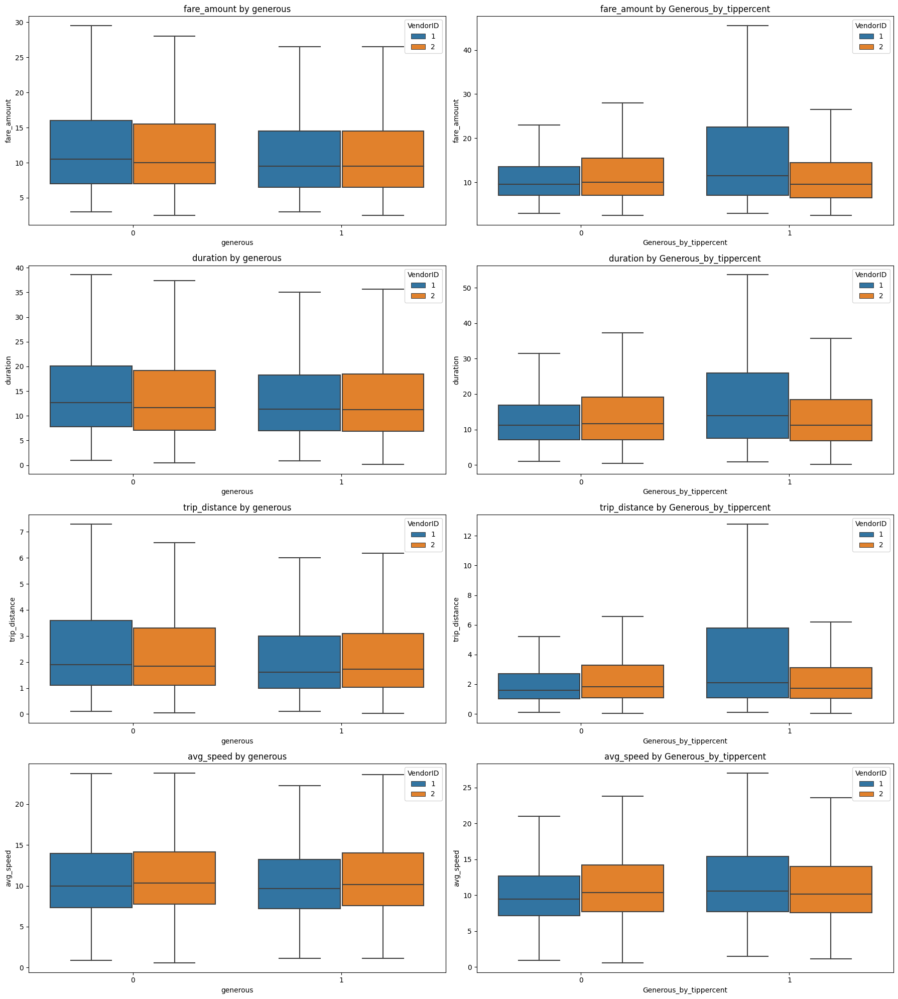

In [247]:
x_vars=['generous','Generous_by_tippercent']
y_vars=['fare_amount','duration','trip_distance','avg_speed']

import math
rowCount=len(y_vars)
colCount=len(x_vars)
fig, axes = plt.subplots(nrows=rowCount, ncols=colCount, figsize=(18,rowCount*5))

for row in range(rowCount):
    for col in range(colCount):
        x_var=x_vars[col]
        y_var=y_vars[row]
        sns.boxplot(data=df_credit,x=x_var,y=y_var,showfliers=False,ax=axes[row][col],hue='VendorID',palette='tab10')
        axes[row][col].set_title(f"{y_var} by {x_var}")
plt.tight_layout()
plt.show()

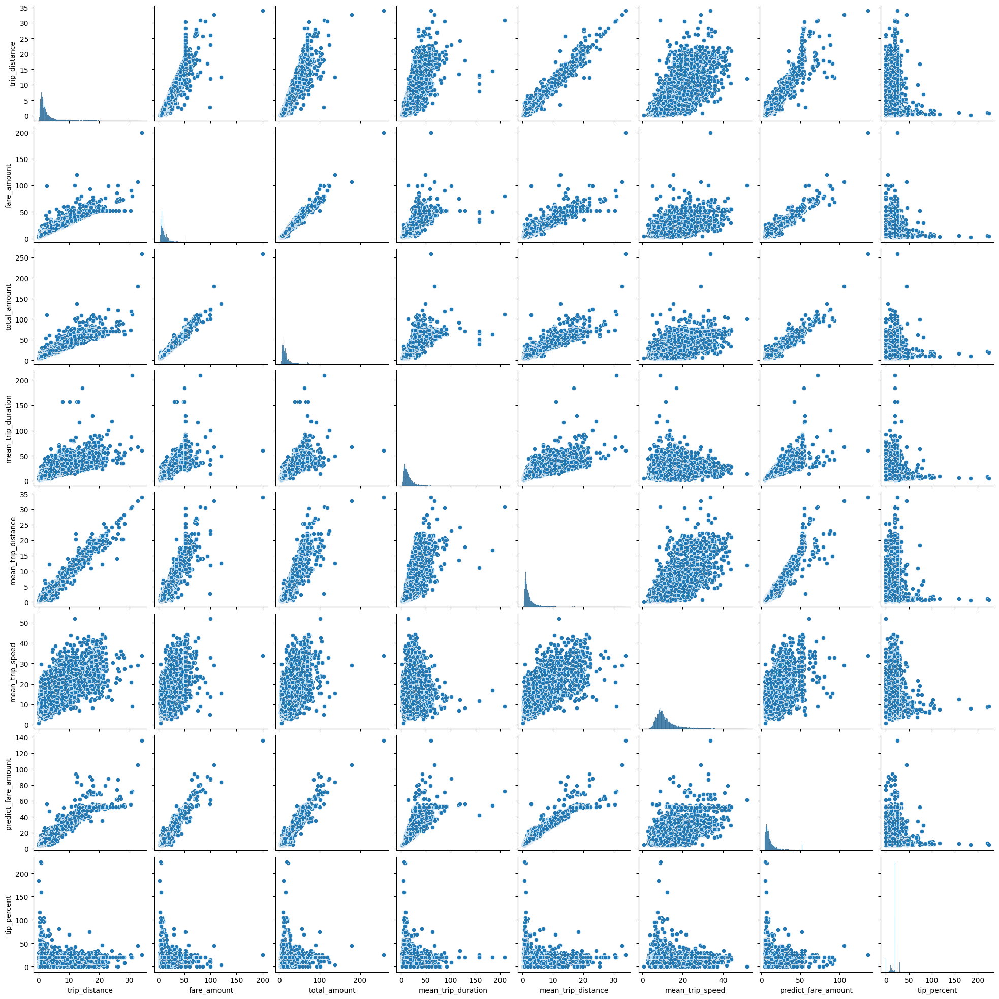

In [248]:
target_columns=['trip_distance','fare_amount', 'total_amount','mean_trip_duration', 'mean_trip_distance',
       'mean_trip_speed','predict_fare_amount', 'tip_percent']
sns.pairplot(df_credit[target_columns])
plt.show()

In [249]:
df_credit.head()

,ID,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,PU_hour,DO_hour,PU_day,DO_day,PU_month,DO_month,PU_weekday,DO_weekday,PU_year,PU_weeknum,PU_year_weeknum,PU_nextMonday,PU_date_hour,Borough_PU,Zone_PU,service_zone_PU,Borough_DO,Zone_DO,service_zone_DO,Date,NYC_All_Grades_All_Formulations_Retail_Gasoline_Prices,Year,time,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),apparent_temperature (°C),precipitation (mm),rain (mm),snowfall (cm),snow_depth (m),pressure_msl (hPa),surface_pressure (hPa),cloud_cover (%),cloud_cover_low (%),cloud_cover_mid (%),cloud_cover_high (%),wind_speed_10m (km/h),wind_speed_100m (km/h),wind_direction_10m (°),wind_direction_100m (°),wind_gusts_10m (km/h),PU_DO_Borough,JFK,Newark,OutsideNYC,nighttime,rushhour,duration,duration_sec,avg_speed,fare_per_minute,fare_per_mile,holiday,PU_date,fare_amount_log,am_rush,daytime,pm_rush,PU_hour_class,rush_hour,PU_season,Unnamed: 0,gpb_unit1,gpb_unit2,gpb_unit3,gpb_unit4,gpb_unit5,mean_distance_unit1,mean_distance_unit2,mean_distance_unit3,mean_distance_unit4,mean_distance_unit5,mean_duration_unit1,mean_duration_unit2,mean_duration_unit3,mean_duration_unit4,mean_duration_unit5,mean_speed_unit1,mean_speed_unit2,mean_speed_unit3,mean_speed_unit4,mean_speed_unit5,predict_fare_amount,mean_trip_duration,mean_trip_distance,mean_trip_speed,tip_percent,tip_percent_int,total_fare,cal_tip,tip_diff,total_fare_diff,tip_percent_notax,within_nyc,cal_tip_round_to_0_01,cal_tip_rounddown_to_0_05,Generous_by_tippercent,NGenerous_by_tippercent,generous,not_generous,total_count_PU,Violence_Ratio_PU,Violence_Cnt_PU,Larceny_Ratio_PU,Larceny_Cnt_PU,ViolenceRalated_Ratio_PU,ViolenceRalated_Cnt_PU,diff_Ratio_PU,diff_Cnt_PU,total_count_DO,Violence_Ratio_DO,Violence_Cnt_DO,Larceny_Ratio_DO,Larceny_Cnt_DO,ViolenceRalated_Ratio_DO,ViolenceRalated_Cnt_DO,diff_Ratio_DO,diff_Cnt_DO,PU_DO_Location,PU_DO_zone,PUDO_LocationID
0,24870114,2,2017-03-25 08:55:43,2017-03-25 09:09:47,6,3.34,1,N,100,231,1,13.0,0.0,0.5,2.76,0.0,0.3,16.56,8,9,25,25,3,3,Saturday,Saturday,2017,12,2017-12,2017-03-27,2017-03-25-8,Manhattan,Garment District,Yellow Zone,Manhattan,TriBeCa/Civic Center,Yellow Zone,2017-03-27,2.476,2017,2017-03-25 08:00:00,10.6,73,6.0,8.5,0.0,0.0,0.0,0.04,1021.3,1015.1,100,0,79,100,7.4,13.8,309,298,13.3,Manhattan_Manhattan,False,False,False,0,False,14.067,844.0,14.246445,0.924171,3.892216,True,2017-03-25,2.564949,1,0,0,am_rush,0,spring,0,100_231,100_231_8,100_231_Saturday_8,100_231_am_rush,100_231_1_am_rush,3.521667,3.34,3.34,3.340000,3.340,22.847333,14.067000,14.067,14.067000,14.0670,10.679596,14.246445,14.246445,14.246445,14.246445,13.010263,14.067000,3.340000,14.246445,20.0,20,13.8,2.760,0.000,0.000,20.0,True,2.76,2.75,1,0,1,0,1965.0,0.204580,402.0,0.535878,1053.0,0.351145,690.0,0.184733,363.0,1987.0,0.211374,420.0,0.428284,851.0,0.358329,712.0,0.069955,139.0,100_231,Garment District_TriBeCa/Civic Center,100_231
1,35634249,1,2017-04-11 14:53:28,2017-04-11 15:19:58,1,1.80,1,N,186,43,1,16.0,0.0,0.5,4.00,0.0,0.3,20.80,14,15,11,11,4,4,Tuesday,Tuesday,2017,15,2017-15,2017-04-17,2017-04-11-14,Manhattan,Penn Station/Madison Sq West,Yellow Zone,Manhattan,Central Park,Yellow Zone,2017-04-17,2.585,2017,2017-04-11 14:00:00,22.3,59,13.8,22.3,0.0,0.0,0.0,0.00,1018.9,1012.9,96,0,0,96,16.8,21.6,149,154,33.1,Manhattan_Manhattan,False,False,False,0,False,26.500,1590.0,4.075472,0.603774,8.888889,False,2017-04-11,2.772589,0,1,0,daytime,0,spring,1,186_43,186_43_14,186_43_Tuesday_14,186_43_daytime,186_43_0_daytime,3.108889,2.65,1.80,3.095000,1.800,24.470333,22.700000,26.500,23.283250,26.5000,8.310050,7.593291,4.075472,8.296162,4.075472,16.265126,23.283250,3.095000,8.296162,23.8,24,16.8,4.032,0.032,0.133,23.8,True,4.03,4.00,1,0,1,0,2256.0,0.143617,324.0,0.731383,1650.0,0.210993,476.0,0.520390,1174.0,631.0,0.335975,212.0

In [250]:
########################################################
#delete unnecessary columns
########################################################
#define unnecessary columns(only use xx_unit4)
drop_column_list=[
       'gpb_unit1', 'gpb_unit2', 'gpb_unit3', 'gpb_unit5',
       'mean_distance_unit1', 'mean_distance_unit2', 'mean_distance_unit3',
       'mean_distance_unit5', 'mean_duration_unit1',
       'mean_duration_unit2', 'mean_duration_unit3', 
       'mean_duration_unit5', 'mean_speed_unit1', 'mean_speed_unit2',
       'mean_speed_unit3', 'mean_speed_unit5']
df_credit=df_credit.drop(columns=drop_column_list)
df_credit.head()

,ID,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,PU_hour,DO_hour,PU_day,DO_day,PU_month,DO_month,PU_weekday,DO_weekday,PU_year,PU_weeknum,PU_year_weeknum,PU_nextMonday,PU_date_hour,Borough_PU,Zone_PU,service_zone_PU,Borough_DO,Zone_DO,service_zone_DO,Date,NYC_All_Grades_All_Formulations_Retail_Gasoline_Prices,Year,time,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),apparent_temperature (°C),precipitation (mm),rain (mm),snowfall (cm),snow_depth (m),pressure_msl (hPa),surface_pressure (hPa),cloud_cover (%),cloud_cover_low (%),cloud_cover_mid (%),cloud_cover_high (%),wind_speed_10m (km/h),wind_speed_100m (km/h),wind_direction_10m (°),wind_direction_100m (°),wind_gusts_10m (km/h),PU_DO_Borough,JFK,Newark,OutsideNYC,nighttime,rushhour,duration,duration_sec,avg_speed,fare_per_minute,fare_per_mile,holiday,PU_date,fare_amount_log,am_rush,daytime,pm_rush,PU_hour_class,rush_hour,PU_season,Unnamed: 0,gpb_unit4,mean_distance_unit4,mean_duration_unit4,mean_speed_unit4,predict_fare_amount,mean_trip_duration,mean_trip_distance,mean_trip_speed,tip_percent,tip_percent_int,total_fare,cal_tip,tip_diff,total_fare_diff,tip_percent_notax,within_nyc,cal_tip_round_to_0_01,cal_tip_rounddown_to_0_05,Generous_by_tippercent,NGenerous_by_tippercent,generous,not_generous,total_count_PU,Violence_Ratio_PU,Violence_Cnt_PU,Larceny_Ratio_PU,Larceny_Cnt_PU,ViolenceRalated_Ratio_PU,ViolenceRalated_Cnt_PU,diff_Ratio_PU,diff_Cnt_PU,total_count_DO,Violence_Ratio_DO,Violence_Cnt_DO,Larceny_Ratio_DO,Larceny_Cnt_DO,ViolenceRalated_Ratio_DO,ViolenceRalated_Cnt_DO,diff_Ratio_DO,diff_Cnt_DO,PU_DO_Location,PU_DO_zone,PUDO_LocationID
0,24870114,2,2017-03-25 08:55:43,2017-03-25 09:09:47,6,3.34,1,N,100,231,1,13.0,0.0,0.5,2.76,0.0,0.3,16.56,8,9,25,25,3,3,Saturday,Saturday,2017,12,2017-12,2017-03-27,2017-03-25-8,Manhattan,Garment District,Yellow Zone,Manhattan,TriBeCa/Civic Center,Yellow Zone,2017-03-27,2.476,2017,2017-03-25 08:00:00,10.6,73,6.0,8.5,0.0,0.0,0.0,0.04,1021.3,1015.1,100,0,79,100,7.4,13.8,309,298,13.3,Manhattan_Manhattan,False,False,False,0,False,14.067,844.0,14.246445,0.924171,3.892216,True,2017-03-25,2.564949,1,0,0,am_rush,0,spring,0,100_231_am_rush,3.340000,14.067000,14.246445,13.010263,14.067000,3.340000,14.246445,20.0,20,13.8,2.760,0.000,0.000,20.0,True,2.76,2.75,1,0,1,0,1965.0,0.204580,402.0,0.535878,1053.0,0.351145,690.0,0.184733,363.0,1987.0,0.211374,420.0,0.428284,851.0,0.358329,712.0,0.069955,139.0,100_231,Garment District_TriBeCa/Civic Center,100_231
1,35634249,1,2017-04-11 14:53:28,2017-04-11 15:19:58,1,1.80,1,N,186,43,1,16.0,0.0,0.5,4.00,0.0,0.3,20.80,14,15,11,11,4,4,Tuesday,Tuesday,2017,15,2017-15,2017-04-17,2017-04-11-14,Manhattan,Penn Station/Madison Sq West,Yellow Zone,Manhattan,Central Park,Yellow Zone,2017-04-17,2.585,2017,2017-04-11 14:00:00,22.3,59,13.8,22.3,0.0,0.0,0.0,0.00,1018.9,1012.9,96,0,0,96,16.8,21.6,149,154,33.1,Manhattan_Manhattan,False,False,False,0,False,26.500,1590.0,4.075472,0.603774,8.888889,False,2017-04-11,2.772589,0,1,0,daytime,0,spring,1,186_43_daytime,3.095000,23.283250,8.296162,16.265126,23.283250,3.095000,8.296162,23.8,24,16.8,4.032,0.032,0.133,23.8,True,4.03,4.00,1,0,1,0,2256.0,0.143617,324.0,0.731383,1650.0,0.210993,476.0,0.520390,1174.0,631.0,0.335975,212.0,0.353407,223.0,0.534073,337.0,-0.180666,-114.0,186_43,Penn Station/Madison Sq West_Central Park,186_43
2,106203690,1,2017-12-15 07:26:56,2017-12-15 07:34:08,1,1.00,1,N,262,236,1,6.5,0.0,0.5,1.45,0.0,0.3,8.75,7,7,15,15,12,12,Friday,Friday,2017,50,2017-50,2017-12-18,2017-12-15-7,Manhattan,Yorkville East,Yellow Zone,Manhattan,Upper East Side North,Yellow Zone,2017-12-18,2.660,2017,2017-12-15 07:00:00,-5.7,51,-14.3,-9.6,0.0,0.0,0.0,0.05,1020.1,1013.5,87,0,75,86,2.9,4.3,263,265,6.8,Manhattan_Manhattan,False,False,False,0,False,7.200,432.0,8.333333,0.902778,6.500000,Fal

In [251]:
df_credit.to_csv('nyc_clean_credit_trips.csv', index=False)

**About model building**

* Random Forest: Please refer `nyc-taxi-gratuity-prediction-random-forest`
* XGBoost: Please refer `nyc-taxi-gratuity-prediction-xgboost`

**About Summary**

Please refer `nyc-taxi-gratuity-prediction-summary`

### **Conclusion**

* Not representative data. This dataset only had credit tip data, cash tip were not included. According to net search cash tips seems to have different tip option(could not choose percentage), cash tips may have different behaviors.
* Lack of data. This dataset didn't have any tip percentage data, we need to calculate tip percentage from tip_amount. 
* Vendor 1 and Vendor 2 may have different way to round tip_amount, one vendor may round down to 0.05, another one may round  to 0.01. The calculated tip percent may different from passenger actual choice.
  
|Vendor|tip_amount calculation(assumption)|Example|
|:--|:--|:--|
|Vendor1|round down to 0.05|2.075->2.05|
|Vendor2|round to 0.01|5.575->5.58<BR/>1.825->1.82|



